# Modeling

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV, RepeatedKFold
from sklearn.metrics import r2_score, mean_squared_error as mse, mean_absolute_error as mae
from sklearn.dummy import DummyRegressor
from catboost import Pool, CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [ ]:
#load dataframe REGULAR
#parse datetime column
#df=pd.read_csv('COVID19_modeling.csv', parse_dates=[0])
#df.set_index('date', inplace= True)
#df.drop(columns='Unnamed: 0', inplace=True)

In [2]:
#load dataframe OHE
#parse datetime column
df_ohe = pd.read_csv('ohe_data.csv', parse_dates=['date'])
df_ohe.drop(columns='Unnamed: 0', inplace=True)
df_ohe.set_index('date', inplace=True)

In [3]:
df_ohe.head()

,Avg_Temp(F),Conf_Cases,day_of_week,day_of_year,Year,Month,Day,new_case_percent_pop*,state_id_CT,state_id_MA,state_id_ME,state_id_VT
date,,,,,,,,,,,,
2020-03-01,26.42,1.0,6,61,2020,3,1,0.014225,0,1,0,0
2020-03-02,36.50,1.0,0,62,2020,3,2,0.014225,0,1,0,0
2020-03-03,55.94,1.0,1,63,2020,3,3,0.014225,0,1,0,0
2020-03-04,46.94,2.0,2,64,2020,3,4,0.028450,0,1,0,0
2020-03-05,42.98,8.0,3,65,2020,3,5,0.113799,0,1,0,0


## Train-test split

Before training any models on the data, let's do a train-test split to keep training and testing data consistent and separated.

In [ ]:
# Create features
#X, y = df_ohe.drop(columns=['Conf_Cases', 'new_case_percent_pop*']), df_ohe['new_case_percent_pop*']
# Make test and train split
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
len(df_ohe)

In [ ]:
# Create the bins; target has 2224 observations so let's use 200 bins
bins = np.linspace(0, 2224, 200)

In [ ]:
# Create features
X, y = df_ohe.drop(columns=['Conf_Cases', 'new_case_percent_pop*']), df_ohe['new_case_percent_pop*']

In [ ]:
# Sort y
y_sorted = sorted(y)

In [ ]:
# Save your y values in a new ndarray, broken down by the bins created above.
y_binned = np.digitize(y, bins)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y_binned, random_state=42)

## Using the mean as a baseline prediction model

Previously, we determined the R2 score of using the mean to predict COVID19 cases for each individual state. Let's do the same thing now that we have all the states in one DataFrame, so that we will have a baseline "dummy" model to compare our future optimized models to. 

In [ ]:
dummy_mean = DummyRegressor()
# "Train" dummy regressor
dummy_mean.fit(X_train, y_train)
# Get R2 score
score_dummy = dummy_mean.score(X_test, y_test)
print("The R2 score of using the mean to predict COVID19 cases in our states is:", score_dummy)

Let's store the evaluation metric values for the dummy regressor so we can compare them with our future models. 

In [ ]:
dummy_pred = dummy_mean.predict(X_test)
dummy_r2 = r2_score(y_test, dummy_pred)
dummy_mse = mse(y_test, dummy_pred)
dummy_rmse = np.sqrt(mse(y_test, dummy_pred))

## Tuning the top performing models for ensemble model

In the pre-processing step, we determined (with the help of Pycaret) that our top performing models were **CatBoost Regressor**, **Random Forest Regressor**, and **Extra Trees Regressor**. Let's now fine tune the hyperparameters of each of these models, in preparation for feeding them into the pipeline of the Voting Regressor. 

**NOTE TO SELF: Determine hyperparameters for each model, but pass unfitted (tuned) models to the VotingRegressor**


### 1. Random Forest Regressor
With a few exceptions, a RandomForestClassifier has all the hyperparameters of a DecisionTreeClassifier (to control how trees are grown), plus all the hyperparameters of a BaggingClassifier to control the ensemble itself. I'll explore a couple different ways to determine optimal hyperparameters and will choose those that produce the best R2 and MSE for the final ensemble model (a VotingRegressor).

In [ ]:
# Define parameters to search for GridSearchCV
basic_param_grid = {'n_estimators': [100, 200, 300, 400, 500],
              'max_depth': [3, 5, 7, 9],
              }
# Instantiate RandomForestRegressor
basic_rf = RandomForestRegressor(random_state=42)
cv_rf = GridSearchCV(basic_rf, basic_param_grid, cv = 5)
cv_rf_fit = cv_rf.fit(X_train, y_train)

In [ ]:
print('The optimal max_depth for the RandomForestRegressor is: {}'.format(cv_rf_fit.best_params_['max_depth']))
print('The optimal n_estimators for the RandomForestRegressor is: {}'.format(cv_rf_fit.best_params_['n_estimators']))

In [ ]:
# Instantiate RFR with optimal hyperparameters
basic_rf = RandomForestRegressor(max_depth = 9, n_estimators = 300, random_state=42)
basic_rf.fit(X_train, y_train)
basic_rf_pred = basic_rf.predict(X_test)

In [ ]:
# Calculate evaluation metrics on basic_rf
basic_rf_r2 = r2_score(y_test, basic_rf_pred)
basic_rf_mse = mse(y_test, basic_rf_pred)
basic_rf_rmse = np.sqrt(basic_rf_mse)

In [ ]:
rf_results = pd.DataFrame({'Model':['dummy_reg', 'basic_rf'], 'R2': [dummy_r2, basic_rf_r2], 'MSE':[dummy_mse, basic_rf_mse], 'RMSE':[dummy_rmse, basic_rf_rmse]})

In [ ]:
rf_results

***

#### Using RandomSearchCV to find optimal hyperparameter values

In [ ]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
max_depth.append(9)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, n_jobs=-1, random_state=42)
# Fit the random search model
rf_random.fit(X_train, y_train)

In [ ]:
rf_random.best_params_

In [ ]:
# Instantiate RFR with optimal hyperparameters
rf2 = RandomForestRegressor(n_estimators= 800,
                             min_samples_split= 2,
                             min_samples_leaf= 2,
                             max_features= 'auto',
                             max_depth= 70,
                             bootstrap= True, 
                             random_state=42)
rf2.fit(X_train, y_train)
rf_pred2 = rf2.predict(X_test)

In [ ]:
rf_random_r2 = r2_score(y_test, rf_pred2)
rf_random_mse = mse(y_test, rf_pred2)
rf_random_rmse = np.sqrt(mse(y_test, rf_pred2))

In [ ]:
rf_results.loc[len(rf_results)]= ['rf_randomCV', 
                                 r2_score(y_test, rf_pred2),
                                 mse(y_test, rf_pred2),
                                 np.sqrt(mse(y_test, rf_pred2))]

In [ ]:
rf_results

***

### Using GridSearchCV to find the optimal hyperparameter values

In [ ]:
# Create the parameter grid based on the results of random search 
GS_param_grid = {
    'bootstrap': [True],
    'max_depth': [60, 70, 80, 90, 100],
    'max_features': ['auto'],
    'min_samples_leaf': [1, 2, 3, 4],
    'min_samples_split': [2, 3, 4],
    'n_estimators': [600, 700, 800, 9000, 1000]
}

In [ ]:
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = GS_param_grid, 
                          cv = 5, n_jobs = -1, verbose = 2)

In [ ]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

In [ ]:
grid_search.best_params_

In [ ]:
# Instantiate RFR with optimal hyperparameters
rf3 = RandomForestRegressor(n_estimators= 600,
                             min_samples_split= 2,
                             min_samples_leaf= 2,
                             max_features= 'auto',
                             max_depth= 70,
                             bootstrap= True)
rf3.fit(X_train, y_train)
rf_pred3 = rf3.predict(X_test)

In [ ]:
# Determine R2 score
print('The R2 score for the RandomForestRegressor with GSCV tuning is {}'.format(r2_score(y_test, rf_pred3)))

In [ ]:
print('The MSE of the RandomForestRegressor with GSCV tuning is {}'.format(mse(y_test, rf_pred3)))

In [ ]:
rf_results.loc[len(rf_results)]= ['rf_gridCV', 
                                 r2_score(y_test, rf_pred3),
                                 mse(y_test, rf_pred3),
                                 np.sqrt(mse(y_test, rf_pred3))]

In [ ]:
rf_results

**?** $\star$ It looks like the optimal hyperparameters chosen by RandomSearchCV performed the best, both in terms of the R2 and mean squared error, so we'll use those hyperparameters (as defined in `rf2`).

***

## 2. Extra Trees Regressor

### Using basic hyperparameter tuning only

In [ ]:
# Define parameters to search for GridSearchCV
param_grid = {'n_estimators': [100, 200, 300, 400, 500],
              'max_depth': [3, 5, 7, 9],
              }
# Instantiate ExtraTreesRegressor
et = ExtraTreesRegressor()
cv_et = GridSearchCV(et, param_grid, cv = 5)
cv_et_fit = cv_et.fit(X_train, y_train)

#Print the best parameter
print(cv_et_fit.best_params_)

In [ ]:
print('The optimal max_depth for the ExtraTreesRegressor is: {}'.format(cv_et_fit.best_params_['max_depth']))
print('The optimal n_estimators for the ExtraTreesRegressor is: {}'.format(cv_et_fit.best_params_['n_estimators']))

In [ ]:
# Instantiate ETR with optimal hyperparameters
et_basic = RandomForestRegressor(max_depth = 9, n_estimators = 400)
et_basic.fit(X_train, y_train)
et_basic_pred = et_basic.predict(X_test)

In [ ]:
# Determine R2 score
print('The R2 score for the basic Extra Trees Regressor is {}'.format(r2_score(y_test, et_basic_pred)))

In [ ]:
print('The MSE of the basic ExtraTreesRegressor is {}'.format(mse(y_test, et_basic_pred)))

In [ ]:
basic_et_r2 = r2_score(y_test, et_basic_pred)
basic_et_mse = mse(y_test, et_basic_pred)
basic_et_rmse = np.sqrt(mse(y_test, et_basic_pred))

In [ ]:
et_results = pd.DataFrame({'Model':['dummy_reg', 'basic_et'], 'R2': [dummy_r2, basic_et_r2], 'MSE':[dummy_mse, basic_et_mse], 'RMSE':[dummy_rmse, basic_et_rmse]})

In [ ]:
et_results

***

### Using RandomSearchCV to find optimal hyperparameter values

In [ ]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
max_depth.append(9)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid_et = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

print(random_grid)

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
et = ExtraTreesRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
et2 = RandomizedSearchCV(estimator = et, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
et2.fit(X_train, y_train)

In [ ]:
et2.best_params_

In [ ]:
# Instantiate RFR with optimal hyperparameters
et_random = ExtraTreesRegressor(n_estimators= 1600,
                             min_samples_split= 2,
                             min_samples_leaf= 1,
                             max_features= 'auto',
                             max_depth= 60,
                             bootstrap= True)
et_random.fit(X_train, y_train)
et_random_pred = et_random.predict(X_test)

In [ ]:
# Determine R2 score
print('The R2 score for the ExtraTreesRegressor with RSCV tuning is {}'.format(r2_score(y_test, et_random_pred)))

In [ ]:
print('The MSE of the ExtraTreesRegressor with RSCV tuning is {}'.format(mse(y_test, et_random_pred)))

In [ ]:
et_results.loc[len(et_results)]= ['et_randomCV', 
                                 r2_score(y_test, et_random_pred),
                                 mse(y_test, et_random_pred),
                                 np.sqrt(mse(y_test, et_random_pred))]

In [ ]:
et_results

#### Using GridSearchCV to find the optimal hyperparamter values

In [ ]:
# Create the parameter grid based on the results of random search 
GS_param_grid_et = {
    'bootstrap': [True],
    'max_depth': [50, 60, 70],
    'max_features': ['auto'],
    'min_samples_leaf': [1, 2, 3],
    'min_samples_split': [2, 3, 4],
    'n_estimators': [1400, 1500, 1600, 1700, 1800]
}

In [ ]:
# Create a base model
et = ExtraTreesRegressor()
# Instantiate the grid search model
et3 = GridSearchCV(estimator = et, param_grid = GS_param_grid_et, 
                          cv = 5, n_jobs = -1, verbose = 2)

In [ ]:
# Fit the grid search to the data
et3.fit(X_train, y_train)

In [ ]:
et3.best_params_

In [ ]:
# Instantiate RFR with optimal hyperparameters
et_grid = ExtraTreesRegressor(n_estimators= 1700,
                             min_samples_split= 3,
                             min_samples_leaf= 1,
                             max_features= 'auto',
                             max_depth= 70,
                             bootstrap= True)
et_grid.fit(X_train, y_train)
et_grid_pred = et_grid.predict(X_test)

In [ ]:
# Determine R2 score
print('The R2 score for the Extra Trees Regressor with GSCV is {}'.format(r2_score(y_test, et_grid_pred)))

In [ ]:
print('The MSE of the ExtraTreesRegressor with GSCV is {}'.format(mse(y_test, et_grid_pred)))

In [ ]:
et_results.loc[len(et_results)]= ['et_gridCV', 
                                 r2_score(y_test, et_grid_pred),
                                 mse(y_test, et_grid_pred),
                                 np.sqrt(mse(y_test, et_grid_pred))]

In [ ]:
et_results 

It seems that here the parameters suggested by GridSearchCV (stored in `et_gridCV`) produced the best MSE and R2, so we'll use those 

## 3. CatBoost Regressor

CatBoost is an open-sourced gradient boosting library. 
* 1. run CatBoost without tuning any hyperparameters to get baseline mse and r2
* 2. RandomizedSearchCV for hyperparameters
* 3. GridSearchCV for hyperparameters

* [Pool documentation](https://catboost.ai/en/docs/concepts/python-reference_pool)
* [CatboostRegressor documentation](https://catboost.ai/en/docs/concepts/python-reference_catboostregressor)

In [36]:
# Create features
X, y = df_ohe.drop(columns=['Conf_Cases', 'new_case_percent_pop*']), df_ohe['new_case_percent_pop*']

In [37]:
# Create the bins; target has 2224 observations so let's use 200 bins
bins = np.linspace(0, 2224, 200)

In [38]:
# Sort y
y_sorted = sorted(y)

In [39]:
# Save your y values in a new ndarray, broken down by the bins created above.
y_binned = np.digitize(y, bins)

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y_binned, random_state=42)

In [41]:
train_dataset = Pool(X_train, y_train) 
test_dataset = Pool(X_test, y_test)

In [42]:
model = CatBoostRegressor(loss_function='RMSE', random_seed=42)

In [43]:
grid = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

In [44]:
model.grid_search(grid, train_dataset)

0:	learn: 22.4931127	test: 21.5900708	best: 21.5900708 (0)	total: 744us	remaining: 73.7ms
1:	learn: 22.1350946	test: 21.1984924	best: 21.1984924 (1)	total: 1.7ms	remaining: 83.4ms
2:	learn: 21.7857372	test: 20.8655757	best: 20.8655757 (2)	total: 2.69ms	remaining: 86.9ms
3:	learn: 21.4098002	test: 20.4461545	best: 20.4461545 (3)	total: 3.18ms	remaining: 76.4ms
4:	learn: 21.0396488	test: 20.0694328	best: 20.0694328 (4)	total: 4.09ms	remaining: 77.7ms
5:	learn: 20.7141893	test: 19.7640495	best: 19.7640495 (5)	total: 4.91ms	remaining: 76.9ms
6:	learn: 20.3798576	test: 19.4069260	best: 19.4069260 (6)	total: 5.61ms	remaining: 74.5ms
7:	learn: 20.0637578	test: 19.0674017	best: 19.0674017 (7)	total: 6.25ms	remaining: 71.9ms
8:	learn: 19.7503829	test: 18.7429287	best: 18.7429287 (8)	total: 7.33ms	remaining: 74.2ms
9:	learn: 19.4769032	test: 18.5138365	best: 18.5138365 (9)	total: 8.43ms	remaining: 75.8ms
10:	learn: 19.2291680	test: 18.2758318	best: 18.2758318 (10)	total: 9.56ms	remaining: 77.4ms

43:	learn: 14.0959765	test: 13.2170574	best: 13.2170574 (43)	total: 44.9ms	remaining: 57.1ms
44:	learn: 14.0137985	test: 13.1467456	best: 13.1467456 (44)	total: 46ms	remaining: 56.3ms
45:	learn: 13.9384694	test: 13.0852365	best: 13.0852365 (45)	total: 47.3ms	remaining: 55.5ms
46:	learn: 13.8591020	test: 12.9943934	best: 12.9943934 (46)	total: 48.4ms	remaining: 54.5ms
47:	learn: 13.7813610	test: 12.9132532	best: 12.9132532 (47)	total: 49.4ms	remaining: 53.5ms
48:	learn: 13.7083190	test: 12.8425620	best: 12.8425620 (48)	total: 50.5ms	remaining: 52.6ms
49:	learn: 13.6347056	test: 12.7721145	best: 12.7721145 (49)	total: 51.5ms	remaining: 51.5ms
50:	learn: 13.5713442	test: 12.7234970	best: 12.7234970 (50)	total: 52.5ms	remaining: 50.5ms
51:	learn: 13.5028361	test: 12.6732973	best: 12.6732973 (51)	total: 53.5ms	remaining: 49.3ms
52:	learn: 13.4289196	test: 12.5830992	best: 12.5830992 (52)	total: 54.4ms	remaining: 48.2ms
53:	learn: 13.3582261	test: 12.5323431	best: 12.5323431 (53)	total: 55.2

2:	learn: 19.5127492	test: 18.5508737	best: 18.5508737 (2)	total: 3.25ms	remaining: 105ms
3:	learn: 18.5611500	test: 17.4891844	best: 17.4891844 (3)	total: 4.43ms	remaining: 106ms
4:	learn: 17.7175080	test: 16.6403605	best: 16.6403605 (4)	total: 5.46ms	remaining: 104ms
5:	learn: 17.0652896	test: 16.0556166	best: 16.0556166 (5)	total: 6.34ms	remaining: 99.4ms
6:	learn: 16.4365184	test: 15.3908114	best: 15.3908114 (6)	total: 7.11ms	remaining: 94.5ms
7:	learn: 15.9092463	test: 14.8385021	best: 14.8385021 (7)	total: 8.07ms	remaining: 92.8ms
8:	learn: 15.4511712	test: 14.3844199	best: 14.3844199 (8)	total: 9.15ms	remaining: 92.6ms
9:	learn: 15.0380538	test: 14.0651308	best: 14.0651308 (9)	total: 10.3ms	remaining: 92.7ms
10:	learn: 14.6969114	test: 13.7450766	best: 13.7450766 (10)	total: 11.2ms	remaining: 90.8ms
11:	learn: 14.3636161	test: 13.3561297	best: 13.3561297 (11)	total: 12.3ms	remaining: 90.2ms
12:	learn: 14.1070943	test: 13.1726417	best: 13.1726417 (12)	total: 13.5ms	remaining: 90.

96:	learn: 11.7991744	test: 11.1520202	best: 11.1520202 (96)	total: 85.4ms	remaining: 2.64ms
97:	learn: 11.7683537	test: 11.1213748	best: 11.1213748 (97)	total: 86.2ms	remaining: 1.76ms
98:	learn: 11.7434305	test: 11.1113175	best: 11.1113175 (98)	total: 87.1ms	remaining: 879us
99:	learn: 11.7239978	test: 11.0957092	best: 11.0957092 (99)	total: 87.9ms	remaining: 0us

bestTest = 11.09570923
bestIteration = 99

6:	loss: 11.0957092	best: 8.7484976 (1)	total: 609ms	remaining: 7.74s
0:	learn: 21.5631492	test: 20.6487431	best: 20.6487431 (0)	total: 901us	remaining: 89.2ms
1:	learn: 20.5045874	test: 19.4909287	best: 19.4909287 (1)	total: 2.08ms	remaining: 102ms
2:	learn: 19.5527977	test: 18.5921950	best: 18.5921950 (2)	total: 3.02ms	remaining: 97.6ms
3:	learn: 18.6165028	test: 17.5473573	best: 17.5473573 (3)	total: 4.01ms	remaining: 96.3ms
4:	learn: 17.7799580	test: 16.7041967	best: 16.7041967 (4)	total: 5.16ms	remaining: 98.1ms
5:	learn: 17.1299457	test: 16.1196807	best: 16.1196807 (5)	total:

28:	learn: 11.7697498	test: 11.0518460	best: 11.0518460 (28)	total: 18.1ms	remaining: 75.6ms
29:	learn: 11.6825073	test: 11.0035305	best: 11.0035305 (29)	total: 19.2ms	remaining: 76.7ms
30:	learn: 11.5636477	test: 10.8808505	best: 10.8808505 (30)	total: 20ms	remaining: 76.9ms
31:	learn: 11.4906519	test: 10.8447040	best: 10.8447040 (31)	total: 20.7ms	remaining: 76.3ms
32:	learn: 11.4024319	test: 10.7189370	best: 10.7189370 (32)	total: 21.5ms	remaining: 76.1ms
33:	learn: 11.3474514	test: 10.6881784	best: 10.6881784 (33)	total: 22.2ms	remaining: 75.9ms
34:	learn: 11.2799474	test: 10.6271841	best: 10.6271841 (34)	total: 23.1ms	remaining: 75.8ms
35:	learn: 11.1869957	test: 10.5979409	best: 10.5979409 (35)	total: 23.9ms	remaining: 75.6ms
36:	learn: 11.1223499	test: 10.5309293	best: 10.5309293 (36)	total: 24.8ms	remaining: 75.6ms
37:	learn: 11.0288830	test: 10.4151829	best: 10.4151829 (37)	total: 25.6ms	remaining: 75.4ms
38:	learn: 10.9728218	test: 10.3655388	best: 10.3655388 (38)	total: 26.4

99:	learn: 11.5676136	test: 10.9391807	best: 10.9391807 (99)	total: 80.6ms	remaining: 40.3ms
100:	learn: 11.5445186	test: 10.9191151	best: 10.9191151 (100)	total: 81.8ms	remaining: 39.7ms
101:	learn: 11.5157398	test: 10.9089703	best: 10.9089703 (101)	total: 82.9ms	remaining: 39ms
102:	learn: 11.4913236	test: 10.8823400	best: 10.8823400 (102)	total: 84ms	remaining: 38.3ms
103:	learn: 11.4679880	test: 10.8798106	best: 10.8798106 (103)	total: 85.4ms	remaining: 37.8ms
104:	learn: 11.4442478	test: 10.8526296	best: 10.8526296 (104)	total: 86.6ms	remaining: 37.1ms
105:	learn: 11.4191399	test: 10.8319741	best: 10.8319741 (105)	total: 87.5ms	remaining: 36.3ms
106:	learn: 11.3956787	test: 10.8109005	best: 10.8109005 (106)	total: 88.7ms	remaining: 35.7ms
107:	learn: 11.3703156	test: 10.7813074	best: 10.7813074 (107)	total: 89.8ms	remaining: 34.9ms
108:	learn: 11.3524407	test: 10.7775257	best: 10.7775257 (108)	total: 91.1ms	remaining: 34.2ms
109:	learn: 11.3335755	test: 10.7617418	best: 10.7617418

128:	learn: 8.3179981	test: 8.4077801	best: 8.4077801 (128)	total: 125ms	remaining: 20.3ms
129:	learn: 8.3086300	test: 8.4169423	best: 8.4077801 (128)	total: 126ms	remaining: 19.4ms
130:	learn: 8.2942143	test: 8.4052107	best: 8.4052107 (130)	total: 127ms	remaining: 18.4ms
131:	learn: 8.2867184	test: 8.4079052	best: 8.4052107 (130)	total: 128ms	remaining: 17.4ms
132:	learn: 8.2752732	test: 8.3963403	best: 8.3963403 (132)	total: 129ms	remaining: 16.5ms
133:	learn: 8.2472398	test: 8.3833898	best: 8.3833898 (133)	total: 130ms	remaining: 15.5ms
134:	learn: 8.2324585	test: 8.3739741	best: 8.3739741 (134)	total: 131ms	remaining: 14.5ms
135:	learn: 8.2150657	test: 8.3672790	best: 8.3672790 (135)	total: 132ms	remaining: 13.5ms
136:	learn: 8.1973254	test: 8.3708512	best: 8.3672790 (135)	total: 132ms	remaining: 12.6ms
137:	learn: 8.1848559	test: 8.3631032	best: 8.3631032 (137)	total: 133ms	remaining: 11.6ms
138:	learn: 8.1717651	test: 8.3601961	best: 8.3601961 (138)	total: 134ms	remaining: 10.6ms

85:	learn: 9.2108516	test: 9.0094429	best: 9.0094429 (85)	total: 55.4ms	remaining: 41.2ms
86:	learn: 9.1898809	test: 8.9877524	best: 8.9877524 (86)	total: 56.3ms	remaining: 40.8ms
87:	learn: 9.1701074	test: 8.9630659	best: 8.9630659 (87)	total: 57.5ms	remaining: 40.5ms
88:	learn: 9.1350262	test: 8.9292241	best: 8.9292241 (88)	total: 58.5ms	remaining: 40.1ms
89:	learn: 9.1125070	test: 8.9015200	best: 8.9015200 (89)	total: 59.4ms	remaining: 39.6ms
90:	learn: 9.0933541	test: 8.8677429	best: 8.8677429 (90)	total: 60.3ms	remaining: 39.1ms
91:	learn: 9.0743558	test: 8.8500571	best: 8.8500571 (91)	total: 61ms	remaining: 38.5ms
92:	learn: 9.0595159	test: 8.8503622	best: 8.8500571 (91)	total: 61.9ms	remaining: 38ms
93:	learn: 9.0300588	test: 8.8395835	best: 8.8395835 (93)	total: 63.2ms	remaining: 37.6ms
94:	learn: 9.0077073	test: 8.8152928	best: 8.8152928 (94)	total: 64.2ms	remaining: 37.1ms
95:	learn: 8.9872328	test: 8.7998512	best: 8.7998512 (95)	total: 65.2ms	remaining: 36.7ms
96:	learn: 8.9

45:	learn: 10.7583547	test: 10.2459329	best: 10.2459329 (45)	total: 27.8ms	remaining: 62.9ms
46:	learn: 10.7143120	test: 10.2088629	best: 10.2088629 (46)	total: 28.9ms	remaining: 63.3ms
47:	learn: 10.6704423	test: 10.1689271	best: 10.1689271 (47)	total: 29.8ms	remaining: 63.4ms
48:	learn: 10.6339735	test: 10.1438762	best: 10.1438762 (48)	total: 30.7ms	remaining: 63.3ms
49:	learn: 10.5984263	test: 10.1257758	best: 10.1257758 (49)	total: 31.7ms	remaining: 63.4ms
50:	learn: 10.5651195	test: 10.1173240	best: 10.1173240 (50)	total: 32.7ms	remaining: 63.5ms
51:	learn: 10.5111113	test: 10.0912675	best: 10.0912675 (51)	total: 33.7ms	remaining: 63.5ms
52:	learn: 10.4756049	test: 10.0623138	best: 10.0623138 (52)	total: 34.7ms	remaining: 63.6ms
53:	learn: 10.4199884	test: 10.0481097	best: 10.0481097 (53)	total: 35.7ms	remaining: 63.4ms
54:	learn: 10.3559330	test: 9.9778531	best: 9.9778531 (54)	total: 36.8ms	remaining: 63.5ms
55:	learn: 10.3307487	test: 9.9606844	best: 9.9606844 (55)	total: 37.6ms

162:	learn: 10.4163000	test: 9.9839410	best: 9.9839410 (162)	total: 99.1ms	remaining: 22.5ms
163:	learn: 10.3977180	test: 9.9654129	best: 9.9654129 (163)	total: 100ms	remaining: 21.9ms
164:	learn: 10.3875239	test: 9.9601074	best: 9.9601074 (164)	total: 101ms	remaining: 21.5ms
165:	learn: 10.3729673	test: 9.9478444	best: 9.9478444 (165)	total: 102ms	remaining: 21ms
166:	learn: 10.3592480	test: 9.9363730	best: 9.9363730 (166)	total: 103ms	remaining: 20.4ms
167:	learn: 10.3504405	test: 9.9258179	best: 9.9258179 (167)	total: 104ms	remaining: 19.9ms
168:	learn: 10.3319797	test: 9.9220806	best: 9.9220806 (168)	total: 105ms	remaining: 19.3ms
169:	learn: 10.3200168	test: 9.9082147	best: 9.9082147 (169)	total: 106ms	remaining: 18.7ms
170:	learn: 10.3054661	test: 9.9005216	best: 9.9005216 (170)	total: 107ms	remaining: 18.1ms
171:	learn: 10.2930811	test: 9.8876532	best: 9.8876532 (171)	total: 108ms	remaining: 17.6ms
172:	learn: 10.2800961	test: 9.8800980	best: 9.8800980 (172)	total: 109ms	remaini

14:	learn: 18.2236594	test: 17.2922619	best: 17.2922619 (14)	total: 10.4ms	remaining: 128ms
15:	learn: 17.9831507	test: 17.0425738	best: 17.0425738 (15)	total: 11.3ms	remaining: 130ms
16:	learn: 17.7532154	test: 16.8105531	best: 16.8105531 (16)	total: 12.4ms	remaining: 133ms
17:	learn: 17.5315675	test: 16.5824447	best: 16.5824447 (17)	total: 13.2ms	remaining: 133ms
18:	learn: 17.3315659	test: 16.3994844	best: 16.3994844 (18)	total: 14.1ms	remaining: 134ms
19:	learn: 17.1274455	test: 16.1836840	best: 16.1836840 (19)	total: 14.9ms	remaining: 134ms
20:	learn: 16.9560326	test: 15.9937035	best: 15.9937035 (20)	total: 15.7ms	remaining: 134ms
21:	learn: 16.7580978	test: 15.7960449	best: 15.7960449 (21)	total: 16.8ms	remaining: 136ms
22:	learn: 16.5769551	test: 15.6186616	best: 15.6186616 (22)	total: 17.8ms	remaining: 137ms
23:	learn: 16.4015365	test: 15.4468951	best: 15.4468951 (23)	total: 18.8ms	remaining: 138ms
24:	learn: 16.2342753	test: 15.2744744	best: 15.2744744 (24)	total: 19.9ms	remai

94:	learn: 8.9746340	test: 8.8227417	best: 8.8227417 (94)	total: 56.5ms	remaining: 62.5ms
95:	learn: 8.9573392	test: 8.8069815	best: 8.8069815 (95)	total: 57.7ms	remaining: 62.5ms
96:	learn: 8.9378964	test: 8.8059389	best: 8.8059389 (96)	total: 58.6ms	remaining: 62.2ms
97:	learn: 8.9161821	test: 8.7844876	best: 8.7844876 (97)	total: 59.7ms	remaining: 62.1ms
98:	learn: 8.8920264	test: 8.7664802	best: 8.7664802 (98)	total: 60.6ms	remaining: 61.8ms
99:	learn: 8.8783346	test: 8.7599098	best: 8.7599098 (99)	total: 61.5ms	remaining: 61.5ms
100:	learn: 8.8470212	test: 8.7445025	best: 8.7445025 (100)	total: 62.3ms	remaining: 61.1ms
101:	learn: 8.8248400	test: 8.7542390	best: 8.7445025 (100)	total: 63.3ms	remaining: 60.8ms
102:	learn: 8.8072358	test: 8.7305148	best: 8.7305148 (102)	total: 64.2ms	remaining: 60.5ms
103:	learn: 8.7952903	test: 8.7298657	best: 8.7298657 (103)	total: 65.1ms	remaining: 60.1ms
104:	learn: 8.7571733	test: 8.7086477	best: 8.7086477 (104)	total: 66.1ms	remaining: 59.8ms


141:	learn: 10.7809675	test: 10.2972676	best: 10.2972676 (141)	total: 101ms	remaining: 41.2ms
142:	learn: 10.7704202	test: 10.2914421	best: 10.2914421 (142)	total: 102ms	remaining: 40.6ms
143:	learn: 10.7458305	test: 10.2626346	best: 10.2626346 (143)	total: 103ms	remaining: 40ms
144:	learn: 10.7271732	test: 10.2321454	best: 10.2321454 (144)	total: 104ms	remaining: 39.3ms
145:	learn: 10.7108749	test: 10.2178487	best: 10.2178487 (145)	total: 105ms	remaining: 38.7ms
146:	learn: 10.6947008	test: 10.1974929	best: 10.1974929 (146)	total: 105ms	remaining: 38ms
147:	learn: 10.6820175	test: 10.1818285	best: 10.1818285 (147)	total: 106ms	remaining: 37.3ms
148:	learn: 10.6672991	test: 10.1695601	best: 10.1695601 (148)	total: 107ms	remaining: 36.7ms
149:	learn: 10.6526923	test: 10.1545201	best: 10.1545201 (149)	total: 108ms	remaining: 36ms
150:	learn: 10.6361374	test: 10.1385316	best: 10.1385316 (150)	total: 109ms	remaining: 35.3ms
151:	learn: 10.6227712	test: 10.1333894	best: 10.1333894 (151)	tot

7:	learn: 20.1151597	test: 19.1211046	best: 19.1211046 (7)	total: 5.94ms	remaining: 143ms
8:	learn: 19.8083146	test: 18.8035133	best: 18.8035133 (8)	total: 6.86ms	remaining: 146ms
9:	learn: 19.5443777	test: 18.5790300	best: 18.5790300 (9)	total: 7.83ms	remaining: 149ms
10:	learn: 19.2973469	test: 18.3416439	best: 18.3416439 (10)	total: 8.74ms	remaining: 150ms
11:	learn: 19.0482563	test: 18.1050337	best: 18.1050337 (11)	total: 9.57ms	remaining: 150ms
12:	learn: 18.7797229	test: 17.8265892	best: 17.8265892 (12)	total: 10.6ms	remaining: 153ms
13:	learn: 18.5438044	test: 17.6119128	best: 17.6119128 (13)	total: 11.4ms	remaining: 152ms
14:	learn: 18.2946700	test: 17.3601630	best: 17.3601630 (14)	total: 12.5ms	remaining: 154ms
15:	learn: 18.0574948	test: 17.1140679	best: 17.1140679 (15)	total: 13.5ms	remaining: 156ms
16:	learn: 17.8293868	test: 16.8835157	best: 16.8835157 (16)	total: 14.5ms	remaining: 157ms
17:	learn: 17.6098338	test: 16.6578682	best: 16.6578682 (17)	total: 15.4ms	remaining: 

73:	learn: 9.7073335	test: 9.3867267	best: 9.3867267 (73)	total: 45.9ms	remaining: 78.2ms
74:	learn: 9.6713892	test: 9.3717142	best: 9.3717142 (74)	total: 46.9ms	remaining: 78.2ms
75:	learn: 9.6463897	test: 9.3543072	best: 9.3543072 (75)	total: 47.7ms	remaining: 77.9ms
76:	learn: 9.6124687	test: 9.3102276	best: 9.3102276 (76)	total: 48.6ms	remaining: 77.6ms
77:	learn: 9.5852119	test: 9.2800917	best: 9.2800917 (77)	total: 49.4ms	remaining: 77.3ms
78:	learn: 9.5454462	test: 9.2834376	best: 9.2800917 (77)	total: 50.3ms	remaining: 77.1ms
79:	learn: 9.5263372	test: 9.2783439	best: 9.2783439 (79)	total: 51.4ms	remaining: 77ms
80:	learn: 9.4775563	test: 9.2196684	best: 9.2196684 (80)	total: 52.2ms	remaining: 76.6ms
81:	learn: 9.4521728	test: 9.1772422	best: 9.1772422 (81)	total: 53ms	remaining: 76.3ms
82:	learn: 9.4309231	test: 9.1580597	best: 9.1580597 (82)	total: 53.9ms	remaining: 76ms
83:	learn: 9.4113003	test: 9.1549008	best: 9.1549008 (83)	total: 54.8ms	remaining: 75.7ms
84:	learn: 9.395

65:	learn: 10.4886356	test: 9.9471291	best: 9.9471291 (65)	total: 67.6ms	remaining: 34.8ms
66:	learn: 10.4310334	test: 9.8984575	best: 9.8984575 (66)	total: 68.3ms	remaining: 33.7ms
67:	learn: 10.3827664	test: 9.8740215	best: 9.8740215 (67)	total: 69.7ms	remaining: 32.8ms
68:	learn: 10.3229887	test: 9.8084154	best: 9.8084154 (68)	total: 71.1ms	remaining: 31.9ms
69:	learn: 10.2628315	test: 9.7518626	best: 9.7518626 (69)	total: 71.9ms	remaining: 30.8ms
70:	learn: 10.2224226	test: 9.7092797	best: 9.7092797 (70)	total: 72.5ms	remaining: 29.6ms
71:	learn: 10.1788494	test: 9.6682229	best: 9.6682229 (71)	total: 73.4ms	remaining: 28.5ms
72:	learn: 10.1239518	test: 9.6270591	best: 9.6270591 (72)	total: 74.5ms	remaining: 27.5ms
73:	learn: 10.0783551	test: 9.5891402	best: 9.5891402 (73)	total: 75.4ms	remaining: 26.5ms
74:	learn: 10.0317551	test: 9.5531454	best: 9.5531454 (74)	total: 76.1ms	remaining: 25.4ms
75:	learn: 9.9899681	test: 9.5187550	best: 9.5187550 (75)	total: 77.3ms	remaining: 24.4ms


50:	learn: 11.5662735	test: 10.8024680	best: 10.8024680 (50)	total: 46ms	remaining: 44.2ms
51:	learn: 11.4744828	test: 10.7244224	best: 10.7244224 (51)	total: 47.3ms	remaining: 43.6ms
52:	learn: 11.3893554	test: 10.6653769	best: 10.6653769 (52)	total: 47.9ms	remaining: 42.5ms
53:	learn: 11.3149944	test: 10.5976016	best: 10.5976016 (53)	total: 48.7ms	remaining: 41.5ms
54:	learn: 11.2215854	test: 10.5102883	best: 10.5102883 (54)	total: 49.8ms	remaining: 40.7ms
55:	learn: 11.1508482	test: 10.4466510	best: 10.4466510 (55)	total: 50.4ms	remaining: 39.6ms
56:	learn: 11.0772753	test: 10.3999281	best: 10.3999281 (56)	total: 51.2ms	remaining: 38.6ms
57:	learn: 11.0050096	test: 10.3390647	best: 10.3390647 (57)	total: 51.9ms	remaining: 37.6ms
58:	learn: 10.9371747	test: 10.2588925	best: 10.2588925 (58)	total: 52.8ms	remaining: 36.7ms
59:	learn: 10.8633052	test: 10.1986112	best: 10.1986112 (59)	total: 53.5ms	remaining: 35.6ms
60:	learn: 10.7929782	test: 10.1363494	best: 10.1363494 (60)	total: 54.2

69:	learn: 10.3539669	test: 9.8184519	best: 9.8184519 (69)	total: 57.5ms	remaining: 24.6ms
70:	learn: 10.3118512	test: 9.7735426	best: 9.7735426 (70)	total: 58.8ms	remaining: 24ms
71:	learn: 10.2624156	test: 9.7351125	best: 9.7351125 (71)	total: 59.5ms	remaining: 23.1ms
72:	learn: 10.2076995	test: 9.6929070	best: 9.6929070 (72)	total: 60.2ms	remaining: 22.3ms
73:	learn: 10.1600249	test: 9.6632411	best: 9.6632411 (73)	total: 60.9ms	remaining: 21.4ms
74:	learn: 10.1138355	test: 9.6275965	best: 9.6275965 (74)	total: 61.8ms	remaining: 20.6ms
75:	learn: 10.0725453	test: 9.5927353	best: 9.5927353 (75)	total: 62.5ms	remaining: 19.7ms
76:	learn: 10.0207645	test: 9.5514957	best: 9.5514957 (76)	total: 63.3ms	remaining: 18.9ms
77:	learn: 9.9710567	test: 9.4993595	best: 9.4993595 (77)	total: 64.3ms	remaining: 18.1ms
78:	learn: 9.9180418	test: 9.4433937	best: 9.4433937 (78)	total: 65.1ms	remaining: 17.3ms
79:	learn: 9.8742986	test: 9.4095089	best: 9.4095089 (79)	total: 65.9ms	remaining: 16.5ms
80:	

77:	learn: 10.0699452	test: 9.5208639	best: 9.5208639 (77)	total: 71.8ms	remaining: 20.3ms
78:	learn: 10.0189513	test: 9.4681057	best: 9.4681057 (78)	total: 73.5ms	remaining: 19.5ms
79:	learn: 9.9787786	test: 9.4359704	best: 9.4359704 (79)	total: 74.7ms	remaining: 18.7ms
80:	learn: 9.9507475	test: 9.4213517	best: 9.4213517 (80)	total: 75.6ms	remaining: 17.7ms
81:	learn: 9.9056023	test: 9.3821008	best: 9.3821008 (81)	total: 76.5ms	remaining: 16.8ms
82:	learn: 9.8675801	test: 9.3557042	best: 9.3557042 (82)	total: 77.4ms	remaining: 15.8ms
83:	learn: 9.8304891	test: 9.3216031	best: 9.3216031 (83)	total: 78.4ms	remaining: 14.9ms
84:	learn: 9.7936290	test: 9.3011947	best: 9.3011947 (84)	total: 79.2ms	remaining: 14ms
85:	learn: 9.7497710	test: 9.2634040	best: 9.2634040 (85)	total: 80.5ms	remaining: 13.1ms
86:	learn: 9.7033895	test: 9.2243008	best: 9.2243008 (86)	total: 81.8ms	remaining: 12.2ms
87:	learn: 9.6706423	test: 9.1959187	best: 9.1959187 (87)	total: 82.7ms	remaining: 11.3ms
88:	learn:

79:	learn: 9.7873000	test: 9.3404765	best: 9.3404765 (79)	total: 74.6ms	remaining: 65.3ms
80:	learn: 9.7489622	test: 9.3256561	best: 9.3256561 (80)	total: 75.8ms	remaining: 64.6ms
81:	learn: 9.7058839	test: 9.2881085	best: 9.2881085 (81)	total: 76.8ms	remaining: 63.7ms
82:	learn: 9.6693806	test: 9.2559501	best: 9.2559501 (82)	total: 77.9ms	remaining: 62.9ms
83:	learn: 9.6381406	test: 9.2363618	best: 9.2363618 (83)	total: 78.8ms	remaining: 61.9ms
84:	learn: 9.6059272	test: 9.2095550	best: 9.2095550 (84)	total: 79.8ms	remaining: 61ms
85:	learn: 9.5625851	test: 9.1727156	best: 9.1727156 (85)	total: 80.7ms	remaining: 60.1ms
86:	learn: 9.5160818	test: 9.1335584	best: 9.1335584 (86)	total: 81.5ms	remaining: 59ms
87:	learn: 9.4843932	test: 9.1064175	best: 9.1064175 (87)	total: 82.5ms	remaining: 58.1ms
88:	learn: 9.4503832	test: 9.0841911	best: 9.0841911 (88)	total: 83.5ms	remaining: 57.2ms
89:	learn: 9.4119761	test: 9.0642938	best: 9.0642938 (89)	total: 84.6ms	remaining: 56.4ms
90:	learn: 9.3

132:	learn: 5.6443692	test: 6.8549507	best: 6.8285863 (124)	total: 121ms	remaining: 15.5ms
133:	learn: 5.6305182	test: 6.8523889	best: 6.8285863 (124)	total: 122ms	remaining: 14.6ms
134:	learn: 5.6203174	test: 6.8476833	best: 6.8285863 (124)	total: 123ms	remaining: 13.7ms
135:	learn: 5.6063713	test: 6.8501812	best: 6.8285863 (124)	total: 124ms	remaining: 12.8ms
136:	learn: 5.5944473	test: 6.8435901	best: 6.8285863 (124)	total: 125ms	remaining: 11.9ms
137:	learn: 5.5839526	test: 6.8396371	best: 6.8285863 (124)	total: 126ms	remaining: 10.9ms
138:	learn: 5.5638719	test: 6.8248477	best: 6.8248477 (138)	total: 127ms	remaining: 10ms
139:	learn: 5.5561159	test: 6.8231094	best: 6.8231094 (139)	total: 128ms	remaining: 9.12ms
140:	learn: 5.5522074	test: 6.8266463	best: 6.8231094 (139)	total: 129ms	remaining: 8.2ms
141:	learn: 5.5427649	test: 6.8187941	best: 6.8187941 (141)	total: 130ms	remaining: 7.3ms
142:	learn: 5.5263552	test: 6.8059829	best: 6.8059829 (142)	total: 131ms	remaining: 6.41ms
143

123:	learn: 8.4837516	test: 8.3835040	best: 8.3821921 (122)	total: 167ms	remaining: 35.1ms
124:	learn: 8.4575102	test: 8.3722691	best: 8.3722691 (124)	total: 169ms	remaining: 33.7ms
125:	learn: 8.4365204	test: 8.3591122	best: 8.3591122 (125)	total: 170ms	remaining: 32.4ms
126:	learn: 8.4162557	test: 8.3424123	best: 8.3424123 (126)	total: 171ms	remaining: 31ms
127:	learn: 8.3984540	test: 8.3256436	best: 8.3256436 (127)	total: 172ms	remaining: 29.6ms
128:	learn: 8.3787660	test: 8.3154161	best: 8.3154161 (128)	total: 173ms	remaining: 28.1ms
129:	learn: 8.3503957	test: 8.2850985	best: 8.2850985 (129)	total: 174ms	remaining: 26.7ms
130:	learn: 8.3244113	test: 8.2811385	best: 8.2811385 (130)	total: 174ms	remaining: 25.3ms
131:	learn: 8.3025405	test: 8.2714512	best: 8.2714512 (131)	total: 175ms	remaining: 23.9ms
132:	learn: 8.2810439	test: 8.2598944	best: 8.2598944 (132)	total: 176ms	remaining: 22.5ms
133:	learn: 8.2667274	test: 8.2546757	best: 8.2546757 (133)	total: 177ms	remaining: 21.1ms
1

17:	learn: 16.7751657	test: 15.8679849	best: 15.8679849 (17)	total: 15.3ms	remaining: 112ms
18:	learn: 16.5109042	test: 15.5972853	best: 15.5972853 (18)	total: 16.6ms	remaining: 115ms
19:	learn: 16.2633072	test: 15.3390448	best: 15.3390448 (19)	total: 18ms	remaining: 117ms
20:	learn: 16.0511327	test: 15.1453182	best: 15.1453182 (20)	total: 19.3ms	remaining: 119ms
21:	learn: 15.8423037	test: 14.9400594	best: 14.9400594 (21)	total: 20.6ms	remaining: 120ms
22:	learn: 15.6600188	test: 14.7620712	best: 14.7620712 (22)	total: 21.9ms	remaining: 121ms
23:	learn: 15.4300213	test: 14.5331218	best: 14.5331218 (23)	total: 23.3ms	remaining: 122ms
24:	learn: 15.1928982	test: 14.2985374	best: 14.2985374 (24)	total: 24.7ms	remaining: 123ms
25:	learn: 14.9907949	test: 14.0882598	best: 14.0882598 (25)	total: 25.8ms	remaining: 123ms
26:	learn: 14.8048364	test: 13.9072768	best: 13.9072768 (26)	total: 27.1ms	remaining: 123ms
27:	learn: 14.5912993	test: 13.6841606	best: 13.6841606 (27)	total: 28.5ms	remaini

69:	learn: 7.2124030	test: 7.5822387	best: 7.5822387 (69)	total: 56.3ms	remaining: 64.4ms
70:	learn: 7.1884972	test: 7.5886036	best: 7.5822387 (69)	total: 57.5ms	remaining: 63.9ms
71:	learn: 7.1596478	test: 7.5985940	best: 7.5822387 (69)	total: 58.9ms	remaining: 63.8ms
72:	learn: 7.1320770	test: 7.5799458	best: 7.5799458 (72)	total: 60.2ms	remaining: 63.5ms
73:	learn: 7.1078375	test: 7.5687712	best: 7.5687712 (73)	total: 61.5ms	remaining: 63.1ms
74:	learn: 7.0711841	test: 7.5324524	best: 7.5324524 (74)	total: 62.6ms	remaining: 62.6ms
75:	learn: 7.0295664	test: 7.5108478	best: 7.5108478 (75)	total: 64.1ms	remaining: 62.4ms
76:	learn: 7.0124168	test: 7.5226130	best: 7.5108478 (75)	total: 65.2ms	remaining: 61.8ms
77:	learn: 7.0003496	test: 7.5149646	best: 7.5108478 (75)	total: 66.2ms	remaining: 61.1ms
78:	learn: 6.9737516	test: 7.4861098	best: 7.4861098 (78)	total: 67.5ms	remaining: 60.6ms
79:	learn: 6.9466895	test: 7.4616031	best: 7.4616031 (79)	total: 68.7ms	remaining: 60.1ms
80:	learn:

115:	learn: 8.8419808	test: 8.6297137	best: 8.6297137 (115)	total: 98.4ms	remaining: 28.8ms
116:	learn: 8.8285460	test: 8.6171803	best: 8.6171803 (116)	total: 99.7ms	remaining: 28.1ms
117:	learn: 8.8027955	test: 8.5931643	best: 8.5931643 (117)	total: 101ms	remaining: 27.4ms
118:	learn: 8.7897544	test: 8.5896933	best: 8.5896933 (118)	total: 102ms	remaining: 26.7ms
119:	learn: 8.7605420	test: 8.5671941	best: 8.5671941 (119)	total: 104ms	remaining: 25.9ms
120:	learn: 8.7441111	test: 8.5577529	best: 8.5577529 (120)	total: 105ms	remaining: 25.2ms
121:	learn: 8.7168600	test: 8.5387251	best: 8.5387251 (121)	total: 106ms	remaining: 24.4ms
122:	learn: 8.6938931	test: 8.5188130	best: 8.5188130 (122)	total: 108ms	remaining: 23.6ms
123:	learn: 8.6787260	test: 8.5082092	best: 8.5082092 (123)	total: 109ms	remaining: 22.8ms
124:	learn: 8.6473258	test: 8.4904112	best: 8.4904112 (124)	total: 110ms	remaining: 22ms
125:	learn: 8.6276144	test: 8.4770586	best: 8.4770586 (125)	total: 111ms	remaining: 21.2ms

7:	learn: 19.6746016	test: 18.7158161	best: 18.7158161 (7)	total: 8.25ms	remaining: 198ms
8:	learn: 19.3249289	test: 18.3546159	best: 18.3546159 (8)	total: 9.72ms	remaining: 206ms
9:	learn: 19.0052444	test: 18.0640561	best: 18.0640561 (9)	total: 11.2ms	remaining: 212ms
10:	learn: 18.6906498	test: 17.7382872	best: 17.7382872 (10)	total: 12.6ms	remaining: 216ms
11:	learn: 18.3869750	test: 17.4291819	best: 17.4291819 (11)	total: 13.8ms	remaining: 216ms
12:	learn: 18.0993151	test: 17.1319306	best: 17.1319306 (12)	total: 15.2ms	remaining: 219ms
13:	learn: 17.8501243	test: 16.8930739	best: 16.8930739 (13)	total: 16.4ms	remaining: 218ms
14:	learn: 17.5307924	test: 16.5739517	best: 16.5739517 (14)	total: 17.7ms	remaining: 218ms
15:	learn: 17.2588157	test: 16.3241701	best: 16.3241701 (15)	total: 18.9ms	remaining: 218ms
16:	learn: 16.9753680	test: 16.0382090	best: 16.0382090 (16)	total: 20.1ms	remaining: 217ms
17:	learn: 16.7237134	test: 15.8033575	best: 15.8033575 (17)	total: 21.6ms	remaining: 

1:	learn: 19.9878594	test: 19.0671243	best: 19.0671243 (1)	total: 3.12ms	remaining: 309ms
2:	learn: 18.8790445	test: 17.9322198	best: 17.9322198 (2)	total: 4.96ms	remaining: 326ms
3:	learn: 17.8335002	test: 16.9028840	best: 16.9028840 (3)	total: 6.64ms	remaining: 326ms
4:	learn: 16.9108624	test: 15.9745510	best: 15.9745510 (4)	total: 8.09ms	remaining: 315ms
5:	learn: 16.1061640	test: 15.1664195	best: 15.1664195 (5)	total: 9.34ms	remaining: 302ms
6:	learn: 15.4019984	test: 14.4203390	best: 14.4203390 (6)	total: 10.7ms	remaining: 296ms
7:	learn: 14.7221578	test: 13.7374596	best: 13.7374596 (7)	total: 12ms	remaining: 288ms
8:	learn: 14.1070352	test: 13.1101012	best: 13.1101012 (8)	total: 13.3ms	remaining: 281ms
9:	learn: 13.4800560	test: 12.4993110	best: 12.4993110 (9)	total: 14.4ms	remaining: 274ms
10:	learn: 13.0566455	test: 12.0916770	best: 12.0916770 (10)	total: 15.7ms	remaining: 270ms
11:	learn: 12.6288006	test: 11.7199778	best: 11.7199778 (11)	total: 17ms	remaining: 267ms
12:	learn:

24:	learn: 15.1281217	test: 14.2289687	best: 14.2289687 (24)	total: 13.9ms	remaining: 97ms
25:	learn: 14.9384741	test: 14.0540195	best: 14.0540195 (25)	total: 15ms	remaining: 101ms
26:	learn: 14.7533387	test: 13.8738896	best: 13.8738896 (26)	total: 15.8ms	remaining: 101ms
27:	learn: 14.5367637	test: 13.6474908	best: 13.6474908 (27)	total: 16.7ms	remaining: 103ms
28:	learn: 14.3513559	test: 13.4618393	best: 13.4618393 (28)	total: 17.7ms	remaining: 104ms
29:	learn: 14.1505625	test: 13.2499707	best: 13.2499707 (29)	total: 19ms	remaining: 108ms
30:	learn: 14.0154102	test: 13.1218617	best: 13.1218617 (30)	total: 20.6ms	remaining: 112ms
31:	learn: 13.8423510	test: 12.9458246	best: 12.9458246 (31)	total: 21.8ms	remaining: 115ms
32:	learn: 13.6848579	test: 12.7741301	best: 12.7741301 (32)	total: 23.2ms	remaining: 118ms
33:	learn: 13.5328076	test: 12.6245063	best: 12.6245063 (33)	total: 24.4ms	remaining: 119ms
34:	learn: 13.3823966	test: 12.4630159	best: 12.4630159 (34)	total: 25.6ms	remaining:

23:	learn: 9.8108355	test: 9.3360877	best: 9.3360877 (23)	total: 20.6ms	remaining: 151ms
24:	learn: 9.6729392	test: 9.2214626	best: 9.2214626 (24)	total: 21.9ms	remaining: 153ms
25:	learn: 9.5104313	test: 9.0939942	best: 9.0939942 (25)	total: 23ms	remaining: 154ms
26:	learn: 9.4080905	test: 9.0191426	best: 9.0191426 (26)	total: 23.6ms	remaining: 151ms
27:	learn: 9.2804216	test: 8.9172966	best: 8.9172966 (27)	total: 24.4ms	remaining: 150ms
28:	learn: 9.1361952	test: 8.7987396	best: 8.7987396 (28)	total: 25.3ms	remaining: 149ms
29:	learn: 9.0371666	test: 8.7518648	best: 8.7518648 (29)	total: 26.2ms	remaining: 149ms
30:	learn: 8.9324810	test: 8.6702689	best: 8.6702689 (30)	total: 27.2ms	remaining: 148ms
31:	learn: 8.8214606	test: 8.5996170	best: 8.5996170 (31)	total: 28ms	remaining: 147ms
32:	learn: 8.7428935	test: 8.5320121	best: 8.5320121 (32)	total: 28.7ms	remaining: 145ms
33:	learn: 8.6680332	test: 8.5025836	best: 8.5025836 (33)	total: 29.3ms	remaining: 143ms
34:	learn: 8.5910010	test

37:	learn: 12.9941091	test: 12.1106472	best: 12.1106472 (37)	total: 33ms	remaining: 141ms
38:	learn: 12.8802815	test: 12.0025996	best: 12.0025996 (38)	total: 34.3ms	remaining: 142ms
39:	learn: 12.7625352	test: 11.8972423	best: 11.8972423 (39)	total: 35.2ms	remaining: 141ms
40:	learn: 12.6379228	test: 11.7779683	best: 11.7779683 (40)	total: 36.2ms	remaining: 140ms
41:	learn: 12.5218265	test: 11.6750385	best: 11.6750385 (41)	total: 37ms	remaining: 139ms
42:	learn: 12.4050415	test: 11.5689432	best: 11.5689432 (42)	total: 37.8ms	remaining: 138ms
43:	learn: 12.2793601	test: 11.4517560	best: 11.4517560 (43)	total: 38.7ms	remaining: 137ms
44:	learn: 12.1875163	test: 11.3773596	best: 11.3773596 (44)	total: 39.5ms	remaining: 136ms
45:	learn: 12.0839362	test: 11.2884426	best: 11.2884426 (45)	total: 40.2ms	remaining: 135ms
46:	learn: 11.9866198	test: 11.2059732	best: 11.2059732 (46)	total: 41.1ms	remaining: 134ms
47:	learn: 11.8955356	test: 11.1309537	best: 11.1309537 (47)	total: 42.3ms	remaining

49:	learn: 7.8901106	test: 7.9820350	best: 7.9820350 (49)	total: 42.4ms	remaining: 127ms
50:	learn: 7.8458659	test: 7.9683316	best: 7.9683316 (50)	total: 43.9ms	remaining: 128ms
51:	learn: 7.7988002	test: 7.9299828	best: 7.9299828 (51)	total: 44.7ms	remaining: 127ms
52:	learn: 7.7648240	test: 7.9041648	best: 7.9041648 (52)	total: 45.5ms	remaining: 126ms
53:	learn: 7.7350115	test: 7.8892204	best: 7.8892204 (53)	total: 46.2ms	remaining: 125ms
54:	learn: 7.6964815	test: 7.8767098	best: 7.8767098 (54)	total: 46.9ms	remaining: 124ms
55:	learn: 7.6510340	test: 7.8569166	best: 7.8569166 (55)	total: 47.8ms	remaining: 123ms
56:	learn: 7.6221913	test: 7.8511248	best: 7.8511248 (56)	total: 48.7ms	remaining: 122ms
57:	learn: 7.5934078	test: 7.8276518	best: 7.8276518 (57)	total: 49.8ms	remaining: 122ms
58:	learn: 7.5680625	test: 7.7949098	best: 7.7949098 (58)	total: 50.9ms	remaining: 122ms
59:	learn: 7.5241691	test: 7.7612791	best: 7.7612791 (59)	total: 52ms	remaining: 121ms
60:	learn: 7.4753193	te

56:	learn: 11.2748671	test: 10.5539525	best: 10.5539525 (56)	total: 50.8ms	remaining: 127ms
57:	learn: 11.2041237	test: 10.4989319	best: 10.4989319 (57)	total: 52ms	remaining: 127ms
58:	learn: 11.1361371	test: 10.4190831	best: 10.4190831 (58)	total: 53ms	remaining: 127ms
59:	learn: 11.0583283	test: 10.3548647	best: 10.3548647 (59)	total: 53.9ms	remaining: 126ms
60:	learn: 10.9887088	test: 10.2932784	best: 10.2932784 (60)	total: 55ms	remaining: 125ms
61:	learn: 10.9076384	test: 10.2175703	best: 10.2175703 (61)	total: 55.8ms	remaining: 124ms
62:	learn: 10.8445391	test: 10.1656105	best: 10.1656105 (62)	total: 56.6ms	remaining: 123ms
63:	learn: 10.7873294	test: 10.1155825	best: 10.1155825 (63)	total: 57.5ms	remaining: 122ms
64:	learn: 10.7351286	test: 10.0791658	best: 10.0791658 (64)	total: 58.3ms	remaining: 121ms
65:	learn: 10.6747808	test: 10.0320656	best: 10.0320656 (65)	total: 59.1ms	remaining: 120ms
66:	learn: 10.6147845	test: 9.9811646	best: 9.9811646 (66)	total: 60.3ms	remaining: 12

1:	learn: 20.0841575	test: 19.1949896	best: 19.1949896 (1)	total: 2.44ms	remaining: 241ms
2:	learn: 19.0627023	test: 18.1097743	best: 18.1097743 (2)	total: 3.92ms	remaining: 257ms
3:	learn: 18.0829190	test: 17.1330776	best: 17.1330776 (3)	total: 5.3ms	remaining: 260ms
4:	learn: 17.1826171	test: 16.2252801	best: 16.2252801 (4)	total: 6.42ms	remaining: 251ms
5:	learn: 16.3824600	test: 15.4233347	best: 15.4233347 (5)	total: 7.84ms	remaining: 254ms
6:	learn: 15.7139189	test: 14.7105663	best: 14.7105663 (6)	total: 9.37ms	remaining: 258ms
7:	learn: 15.0593120	test: 14.0530840	best: 14.0530840 (7)	total: 10.8ms	remaining: 259ms
8:	learn: 14.4275431	test: 13.4105310	best: 13.4105310 (8)	total: 12.1ms	remaining: 257ms
9:	learn: 13.9080785	test: 12.9926525	best: 12.9926525 (9)	total: 13.6ms	remaining: 258ms
10:	learn: 13.4810020	test: 12.5841278	best: 12.5841278 (10)	total: 14.7ms	remaining: 253ms
11:	learn: 13.0581952	test: 12.2082399	best: 12.2082399 (11)	total: 16.2ms	remaining: 254ms
12:	lea

0:	learn: 22.3742772	test: 21.4790760	best: 21.4790760 (0)	total: 1.86ms	remaining: 184ms
1:	learn: 21.9146499	test: 21.0262144	best: 21.0262144 (1)	total: 4.01ms	remaining: 196ms
2:	learn: 21.4367672	test: 20.5652589	best: 20.5652589 (2)	total: 5.56ms	remaining: 180ms
3:	learn: 21.0089088	test: 20.1424742	best: 20.1424742 (3)	total: 7.4ms	remaining: 178ms
4:	learn: 20.5987057	test: 19.7365379	best: 19.7365379 (4)	total: 9.37ms	remaining: 178ms
5:	learn: 20.1441558	test: 19.2923673	best: 19.2923673 (5)	total: 11.1ms	remaining: 175ms
6:	learn: 19.7313628	test: 18.8746976	best: 18.8746976 (6)	total: 12.8ms	remaining: 170ms
7:	learn: 19.3672225	test: 18.4816794	best: 18.4816794 (7)	total: 14.6ms	remaining: 168ms
8:	learn: 18.9872957	test: 18.0894768	best: 18.0894768 (8)	total: 16.4ms	remaining: 166ms
9:	learn: 18.6458214	test: 17.7478458	best: 17.7478458 (9)	total: 18.2ms	remaining: 164ms
10:	learn: 18.3057198	test: 17.4163245	best: 17.4163245 (10)	total: 19.7ms	remaining: 160ms
11:	learn

41:	learn: 6.9309779	test: 7.7518025	best: 7.7518025 (41)	total: 53.3ms	remaining: 73.6ms
42:	learn: 6.8293454	test: 7.6997261	best: 7.6997261 (42)	total: 55.1ms	remaining: 73.1ms
43:	learn: 6.7871260	test: 7.6843789	best: 7.6843789 (43)	total: 56.9ms	remaining: 72.4ms
44:	learn: 6.7349638	test: 7.6362063	best: 7.6362063 (44)	total: 58.6ms	remaining: 71.6ms
45:	learn: 6.6496708	test: 7.5843288	best: 7.5843288 (45)	total: 60.2ms	remaining: 70.6ms
46:	learn: 6.5879491	test: 7.5448004	best: 7.5448004 (46)	total: 61.7ms	remaining: 69.6ms
47:	learn: 6.5423226	test: 7.5098788	best: 7.5098788 (47)	total: 63.5ms	remaining: 68.8ms
48:	learn: 6.4708535	test: 7.4888305	best: 7.4888305 (48)	total: 65.1ms	remaining: 67.8ms
49:	learn: 6.3989693	test: 7.4040614	best: 7.4040614 (49)	total: 66.9ms	remaining: 66.9ms
50:	learn: 6.3449164	test: 7.3766940	best: 7.3766940 (50)	total: 68.6ms	remaining: 65.9ms
51:	learn: 6.3071301	test: 7.3595044	best: 7.3595044 (51)	total: 70.5ms	remaining: 65.1ms
52:	learn:

83:	learn: 8.4315490	test: 8.3934337	best: 8.3934337 (83)	total: 100ms	remaining: 19.1ms
84:	learn: 8.3779408	test: 8.3556300	best: 8.3556300 (84)	total: 102ms	remaining: 18ms
85:	learn: 8.3342253	test: 8.3243421	best: 8.3243421 (85)	total: 104ms	remaining: 17ms
86:	learn: 8.2782627	test: 8.2808737	best: 8.2808737 (86)	total: 106ms	remaining: 15.8ms
87:	learn: 8.2389651	test: 8.2500145	best: 8.2500145 (87)	total: 108ms	remaining: 14.7ms
88:	learn: 8.2045008	test: 8.2257914	best: 8.2257914 (88)	total: 110ms	remaining: 13.5ms
89:	learn: 8.1610106	test: 8.1881372	best: 8.1881372 (89)	total: 111ms	remaining: 12.4ms
90:	learn: 8.1259742	test: 8.1699439	best: 8.1699439 (90)	total: 113ms	remaining: 11.2ms
91:	learn: 8.0769286	test: 8.1366363	best: 8.1366363 (91)	total: 115ms	remaining: 9.99ms
92:	learn: 8.0484342	test: 8.1202384	best: 8.1202384 (92)	total: 117ms	remaining: 8.78ms
93:	learn: 8.0155393	test: 8.0992268	best: 8.0992268 (93)	total: 119ms	remaining: 7.57ms
94:	learn: 7.9747353	test

32:	learn: 12.8524212	test: 12.0435046	best: 12.0435046 (32)	total: 28.6ms	remaining: 58.1ms
33:	learn: 12.6936825	test: 11.8859450	best: 11.8859450 (33)	total: 30.2ms	remaining: 58.7ms
34:	learn: 12.5128969	test: 11.7105548	best: 11.7105548 (34)	total: 31.5ms	remaining: 58.5ms
35:	learn: 12.3467607	test: 11.5551117	best: 11.5551117 (35)	total: 32.9ms	remaining: 58.4ms
36:	learn: 12.1982765	test: 11.4138359	best: 11.4138359 (36)	total: 34.3ms	remaining: 58.5ms
37:	learn: 12.0452938	test: 11.2708274	best: 11.2708274 (37)	total: 35.5ms	remaining: 58ms
38:	learn: 11.9104600	test: 11.1546353	best: 11.1546353 (38)	total: 37ms	remaining: 57.9ms
39:	learn: 11.7881655	test: 11.0504516	best: 11.0504516 (39)	total: 38.2ms	remaining: 57.3ms
40:	learn: 11.6571635	test: 10.9370692	best: 10.9370692 (40)	total: 39.4ms	remaining: 56.7ms
41:	learn: 11.5291411	test: 10.8229508	best: 10.8229508 (41)	total: 40.5ms	remaining: 55.9ms
42:	learn: 11.4173631	test: 10.7228193	best: 10.7228193 (42)	total: 41.5ms

53:	loss: 6.6344408	best: 6.5278269 (41)	total: 7.43s	remaining: 5.78s
0:	learn: 22.4124580	test: 21.5145721	best: 21.5145721 (0)	total: 1.54ms	remaining: 153ms
1:	learn: 22.0233673	test: 21.1301894	best: 21.1301894 (1)	total: 2.81ms	remaining: 138ms
2:	learn: 21.5801138	test: 20.7003826	best: 20.7003826 (2)	total: 3.96ms	remaining: 128ms
3:	learn: 21.1848920	test: 20.3116558	best: 20.3116558 (3)	total: 5.09ms	remaining: 122ms
4:	learn: 20.8054417	test: 19.9370231	best: 19.9370231 (4)	total: 6.28ms	remaining: 119ms
5:	learn: 20.3967190	test: 19.5233817	best: 19.5233817 (5)	total: 7.95ms	remaining: 124ms
6:	learn: 20.0053545	test: 19.1256861	best: 19.1256861 (6)	total: 9.1ms	remaining: 121ms
7:	learn: 19.6584313	test: 18.7558312	best: 18.7558312 (7)	total: 10.6ms	remaining: 121ms
8:	learn: 19.2987068	test: 18.4043180	best: 18.4043180 (8)	total: 11.6ms	remaining: 117ms
9:	learn: 18.9814603	test: 18.0882037	best: 18.0882037 (9)	total: 12.9ms	remaining: 116ms
10:	learn: 18.6698989	test: 17

35:	learn: 7.6832321	test: 7.8005326	best: 7.8005326 (35)	total: 45.1ms	remaining: 80.2ms
36:	learn: 7.6375259	test: 7.7873305	best: 7.7873305 (36)	total: 46.5ms	remaining: 79.2ms
37:	learn: 7.5586187	test: 7.7456009	best: 7.7456009 (37)	total: 48ms	remaining: 78.4ms
38:	learn: 7.4633341	test: 7.6850117	best: 7.6850117 (38)	total: 49.4ms	remaining: 77.3ms
39:	learn: 7.4041997	test: 7.6500601	best: 7.6500601 (39)	total: 50.8ms	remaining: 76.1ms
40:	learn: 7.3654418	test: 7.6449919	best: 7.6449919 (40)	total: 52ms	remaining: 74.9ms
41:	learn: 7.3186833	test: 7.6360921	best: 7.6360921 (41)	total: 53.1ms	remaining: 73.3ms
42:	learn: 7.2477307	test: 7.6064653	best: 7.6064653 (42)	total: 54.5ms	remaining: 72.2ms
43:	learn: 7.2065858	test: 7.5883188	best: 7.5883188 (43)	total: 56.2ms	remaining: 71.5ms
44:	learn: 7.1532384	test: 7.5407540	best: 7.5407540 (44)	total: 57.3ms	remaining: 70.1ms
45:	learn: 7.0813264	test: 7.5007040	best: 7.5007040 (45)	total: 58.5ms	remaining: 68.7ms
46:	learn: 7.0

85:	learn: 8.1839777	test: 8.2293005	best: 8.2293005 (85)	total: 106ms	remaining: 79.1ms
86:	learn: 8.1309955	test: 8.1962951	best: 8.1962951 (86)	total: 108ms	remaining: 78.4ms
87:	learn: 8.0912715	test: 8.1730063	best: 8.1730063 (87)	total: 110ms	remaining: 77.7ms
88:	learn: 8.0532111	test: 8.1561128	best: 8.1561128 (88)	total: 112ms	remaining: 76.7ms
89:	learn: 8.0038786	test: 8.1058661	best: 8.1058661 (89)	total: 114ms	remaining: 75.8ms
90:	learn: 7.9546321	test: 8.0671217	best: 8.0671217 (90)	total: 115ms	remaining: 74.9ms
91:	learn: 7.9106220	test: 8.0450331	best: 8.0450331 (91)	total: 117ms	remaining: 73.9ms
92:	learn: 7.8668991	test: 8.0164309	best: 8.0164309 (92)	total: 119ms	remaining: 73ms
93:	learn: 7.8265555	test: 7.9773386	best: 7.9773386 (93)	total: 120ms	remaining: 71.8ms
94:	learn: 7.7855475	test: 7.9541592	best: 7.9541592 (94)	total: 122ms	remaining: 70.6ms
95:	learn: 7.7586673	test: 7.9336550	best: 7.9336550 (95)	total: 124ms	remaining: 69.5ms
96:	learn: 7.7261651	te

62:	learn: 5.8909080	test: 7.1313661	best: 7.1313661 (62)	total: 77.5ms	remaining: 107ms
63:	learn: 5.8609165	test: 7.1127198	best: 7.1127198 (63)	total: 79.3ms	remaining: 107ms
64:	learn: 5.8276755	test: 7.0924813	best: 7.0924813 (64)	total: 80.8ms	remaining: 106ms
65:	learn: 5.7871921	test: 7.0949866	best: 7.0924813 (64)	total: 82.4ms	remaining: 105ms
66:	learn: 5.7427745	test: 7.0519593	best: 7.0519593 (66)	total: 84.2ms	remaining: 104ms
67:	learn: 5.7032968	test: 7.0460415	best: 7.0460415 (67)	total: 86ms	remaining: 104ms
68:	learn: 5.6776320	test: 7.0434735	best: 7.0434735 (68)	total: 87.9ms	remaining: 103ms
69:	learn: 5.6636051	test: 7.0281300	best: 7.0281300 (69)	total: 89.5ms	remaining: 102ms
70:	learn: 5.6379588	test: 7.0326405	best: 7.0281300 (69)	total: 91.3ms	remaining: 102ms
71:	learn: 5.6030578	test: 7.0183209	best: 7.0183209 (71)	total: 93.1ms	remaining: 101ms
72:	learn: 5.5578521	test: 6.9888715	best: 6.9888715 (72)	total: 95ms	remaining: 100ms
73:	learn: 5.5273022	test

49:	learn: 10.6398401	test: 10.0326130	best: 10.0326130 (49)	total: 59.4ms	remaining: 119ms
50:	learn: 10.5488955	test: 9.9635019	best: 9.9635019 (50)	total: 61.1ms	remaining: 119ms
51:	learn: 10.4314332	test: 9.8562793	best: 9.8562793 (51)	total: 63ms	remaining: 119ms
52:	learn: 10.3455422	test: 9.8066073	best: 9.8066073 (52)	total: 64.6ms	remaining: 118ms
53:	learn: 10.2685123	test: 9.7512450	best: 9.7512450 (53)	total: 66.4ms	remaining: 118ms
54:	learn: 10.1861435	test: 9.7015035	best: 9.7015035 (54)	total: 68.2ms	remaining: 118ms
55:	learn: 10.0902096	test: 9.6140317	best: 9.6140317 (55)	total: 69.8ms	remaining: 117ms
56:	learn: 10.0223133	test: 9.5566366	best: 9.5566366 (56)	total: 71.6ms	remaining: 117ms
57:	learn: 9.9371320	test: 9.4924377	best: 9.4924377 (57)	total: 73.2ms	remaining: 116ms
58:	learn: 9.8521342	test: 9.4161750	best: 9.4161750 (58)	total: 74.7ms	remaining: 115ms
59:	learn: 9.7790265	test: 9.3700926	best: 9.3700926 (59)	total: 76.5ms	remaining: 115ms
60:	learn: 9.

39:	learn: 7.0594439	test: 7.6154166	best: 7.6154166 (39)	total: 49.6ms	remaining: 136ms
40:	learn: 7.0060966	test: 7.6116277	best: 7.6116277 (40)	total: 51.2ms	remaining: 136ms
41:	learn: 6.9405798	test: 7.5913129	best: 7.5913129 (41)	total: 52.9ms	remaining: 136ms
42:	learn: 6.8721360	test: 7.5644827	best: 7.5644827 (42)	total: 54.7ms	remaining: 136ms
43:	learn: 6.8356823	test: 7.5509959	best: 7.5509959 (43)	total: 56.3ms	remaining: 136ms
44:	learn: 6.7863893	test: 7.5088499	best: 7.5088499 (44)	total: 57.9ms	remaining: 135ms
45:	learn: 6.7170666	test: 7.4664929	best: 7.4664929 (45)	total: 59.5ms	remaining: 134ms
46:	learn: 6.6610088	test: 7.4559164	best: 7.4559164 (46)	total: 61ms	remaining: 134ms
47:	learn: 6.6153299	test: 7.4199635	best: 7.4199635 (47)	total: 62.5ms	remaining: 133ms
48:	learn: 6.5595664	test: 7.4157775	best: 7.4157775 (48)	total: 64.2ms	remaining: 132ms
49:	learn: 6.4882074	test: 7.3057345	best: 7.3057345 (49)	total: 65.8ms	remaining: 132ms
50:	learn: 6.4520360	te

63:	learn: 9.5611118	test: 9.1978508	best: 9.1978508 (63)	total: 56.2ms	remaining: 75.6ms
64:	learn: 9.5007445	test: 9.1588173	best: 9.1588173 (64)	total: 57.8ms	remaining: 75.6ms
65:	learn: 9.4367753	test: 9.1038548	best: 9.1038548 (65)	total: 59.1ms	remaining: 75.2ms
66:	learn: 9.3733853	test: 9.0629749	best: 9.0629749 (66)	total: 60.4ms	remaining: 74.8ms
67:	learn: 9.3060550	test: 9.0094721	best: 9.0094721 (67)	total: 61.5ms	remaining: 74.1ms
68:	learn: 9.2488163	test: 8.9700380	best: 8.9700380 (68)	total: 62.5ms	remaining: 73.3ms
69:	learn: 9.1972845	test: 8.9271110	best: 8.9271110 (69)	total: 63.6ms	remaining: 72.7ms
70:	learn: 9.1218018	test: 8.8694866	best: 8.8694866 (70)	total: 64.8ms	remaining: 72.1ms
71:	learn: 9.0800834	test: 8.8327717	best: 8.8327717 (71)	total: 65.8ms	remaining: 71.2ms
72:	learn: 9.0303624	test: 8.7898204	best: 8.7898204 (72)	total: 67ms	remaining: 70.6ms
73:	learn: 8.9753887	test: 8.7463759	best: 8.7463759 (73)	total: 68.2ms	remaining: 70.1ms
74:	learn: 8

59:	learn: 6.2321845	test: 7.0946704	best: 7.0946704 (59)	total: 73.4ms	remaining: 110ms
60:	learn: 6.1925082	test: 7.0685434	best: 7.0685434 (60)	total: 75.2ms	remaining: 110ms
61:	learn: 6.1626376	test: 7.0634216	best: 7.0634216 (61)	total: 76.5ms	remaining: 109ms
62:	learn: 6.1046871	test: 7.0389160	best: 7.0389160 (62)	total: 77.9ms	remaining: 108ms
63:	learn: 6.0699881	test: 7.0140519	best: 7.0140519 (63)	total: 79ms	remaining: 106ms
64:	learn: 6.0359342	test: 6.9909648	best: 6.9909648 (64)	total: 80.3ms	remaining: 105ms
65:	learn: 5.9930162	test: 6.9520981	best: 6.9520981 (65)	total: 81.4ms	remaining: 104ms
66:	learn: 5.9636940	test: 6.9320169	best: 6.9320169 (66)	total: 82.7ms	remaining: 103ms
67:	learn: 5.9208253	test: 6.9055630	best: 6.9055630 (67)	total: 84.1ms	remaining: 101ms
68:	learn: 5.8951662	test: 6.9078129	best: 6.9055630 (67)	total: 85.2ms	remaining: 100ms
69:	learn: 5.8614616	test: 6.9118496	best: 6.9055630 (67)	total: 86.4ms	remaining: 98.8ms
70:	learn: 5.8293592	t

47:	learn: 11.1794869	test: 10.5278359	best: 10.5278359 (47)	total: 76.9ms	remaining: 163ms
48:	learn: 11.0777545	test: 10.4376003	best: 10.4376003 (48)	total: 78.7ms	remaining: 162ms
49:	learn: 10.9902439	test: 10.3564816	best: 10.3564816 (49)	total: 80.2ms	remaining: 160ms
50:	learn: 10.8911710	test: 10.2712006	best: 10.2712006 (50)	total: 82.1ms	remaining: 159ms
51:	learn: 10.7911720	test: 10.1836816	best: 10.1836816 (51)	total: 83.9ms	remaining: 158ms
52:	learn: 10.7125883	test: 10.1284859	best: 10.1284859 (52)	total: 85.7ms	remaining: 157ms
53:	learn: 10.6360638	test: 10.0655894	best: 10.0655894 (53)	total: 87.2ms	remaining: 155ms
54:	learn: 10.5382714	test: 9.9866107	best: 9.9866107 (54)	total: 89.1ms	remaining: 154ms
55:	learn: 10.4464368	test: 9.9039275	best: 9.9039275 (55)	total: 91.3ms	remaining: 153ms
56:	learn: 10.3760769	test: 9.8452541	best: 9.8452541 (56)	total: 93.2ms	remaining: 152ms
57:	learn: 10.2841310	test: 9.7703144	best: 9.7703144 (57)	total: 95.1ms	remaining: 15

33:	learn: 7.8197294	test: 7.8541975	best: 7.8541975 (33)	total: 49.2ms	remaining: 168ms
34:	learn: 7.7394052	test: 7.8111633	best: 7.8111633 (34)	total: 51.4ms	remaining: 169ms
35:	learn: 7.6832321	test: 7.8005326	best: 7.8005326 (35)	total: 53.5ms	remaining: 169ms
36:	learn: 7.6375259	test: 7.7873305	best: 7.7873305 (36)	total: 55.2ms	remaining: 168ms
37:	learn: 7.5586187	test: 7.7456009	best: 7.7456009 (37)	total: 57.1ms	remaining: 168ms
38:	learn: 7.4633341	test: 7.6850117	best: 7.6850117 (38)	total: 59ms	remaining: 168ms
39:	learn: 7.4041997	test: 7.6500601	best: 7.6500601 (39)	total: 61.1ms	remaining: 168ms
40:	learn: 7.3654418	test: 7.6449919	best: 7.6449919 (40)	total: 63.1ms	remaining: 168ms
41:	learn: 7.3186833	test: 7.6360921	best: 7.6360921 (41)	total: 65ms	remaining: 167ms
42:	learn: 7.2477307	test: 7.6064653	best: 7.6064653 (42)	total: 67.1ms	remaining: 167ms
43:	learn: 7.2065858	test: 7.5883188	best: 7.5883188 (43)	total: 69.3ms	remaining: 167ms
44:	learn: 7.1532384	test

17:	learn: 16.0492436	test: 15.1386547	best: 15.1386547 (17)	total: 15.5ms	remaining: 156ms
18:	learn: 15.7595960	test: 14.8493047	best: 14.8493047 (18)	total: 16.8ms	remaining: 160ms
19:	learn: 15.4964165	test: 14.6061874	best: 14.6061874 (19)	total: 18.2ms	remaining: 164ms
20:	learn: 15.2228148	test: 14.3224472	best: 14.3224472 (20)	total: 19.2ms	remaining: 164ms
21:	learn: 14.9479707	test: 14.0479517	best: 14.0479517 (21)	total: 20.5ms	remaining: 166ms
22:	learn: 14.7327226	test: 13.8323431	best: 13.8323431 (22)	total: 21.5ms	remaining: 166ms
23:	learn: 14.4886423	test: 13.5917840	best: 13.5917840 (23)	total: 22.5ms	remaining: 165ms
24:	learn: 14.2556037	test: 13.3722689	best: 13.3722689 (24)	total: 23.6ms	remaining: 165ms
25:	learn: 14.0115685	test: 13.1402310	best: 13.1402310 (25)	total: 24.6ms	remaining: 165ms
26:	learn: 13.7832661	test: 12.9158466	best: 12.9158466 (26)	total: 25.8ms	remaining: 166ms
27:	learn: 13.5503865	test: 12.6811652	best: 12.6811652 (27)	total: 27ms	remaini

187:	learn: 6.0265302	test: 6.9293550	best: 6.9293550 (187)	total: 203ms	remaining: 13ms
188:	learn: 6.0164403	test: 6.9206948	best: 6.9206948 (188)	total: 205ms	remaining: 11.9ms
189:	learn: 6.0054524	test: 6.9118628	best: 6.9118628 (189)	total: 206ms	remaining: 10.8ms
190:	learn: 5.9863672	test: 6.9181169	best: 6.9118628 (189)	total: 207ms	remaining: 9.75ms
191:	learn: 5.9694328	test: 6.9201974	best: 6.9118628 (189)	total: 208ms	remaining: 8.68ms
192:	learn: 5.9585412	test: 6.9098105	best: 6.9098105 (192)	total: 210ms	remaining: 7.6ms
193:	learn: 5.9469482	test: 6.8988806	best: 6.8988806 (193)	total: 211ms	remaining: 6.52ms
194:	learn: 5.9371042	test: 6.8977558	best: 6.8977558 (194)	total: 212ms	remaining: 5.44ms
195:	learn: 5.9283520	test: 6.8938513	best: 6.8938513 (195)	total: 214ms	remaining: 4.36ms
196:	learn: 5.9148989	test: 6.8889912	best: 6.8889912 (196)	total: 214ms	remaining: 3.26ms
197:	learn: 5.9007820	test: 6.8852610	best: 6.8852610 (197)	total: 216ms	remaining: 2.18ms
19

124:	learn: 4.2219431	test: 6.6203478	best: 6.6199015 (114)	total: 171ms	remaining: 102ms
125:	learn: 4.2008563	test: 6.6041900	best: 6.6041900 (125)	total: 173ms	remaining: 101ms
126:	learn: 4.1884481	test: 6.6057735	best: 6.6041900 (125)	total: 174ms	remaining: 100ms
127:	learn: 4.1694744	test: 6.5918250	best: 6.5918250 (127)	total: 176ms	remaining: 99ms
128:	learn: 4.1506409	test: 6.5930868	best: 6.5918250 (127)	total: 178ms	remaining: 97.7ms
129:	learn: 4.1267905	test: 6.5866800	best: 6.5866800 (129)	total: 179ms	remaining: 96.4ms
130:	learn: 4.1092839	test: 6.5900683	best: 6.5866800 (129)	total: 181ms	remaining: 95.2ms
131:	learn: 4.0943890	test: 6.5898986	best: 6.5866800 (129)	total: 182ms	remaining: 94ms
132:	learn: 4.0778854	test: 6.5960628	best: 6.5866800 (129)	total: 184ms	remaining: 92.7ms
133:	learn: 4.0667942	test: 6.5902213	best: 6.5866800 (129)	total: 186ms	remaining: 91.4ms
134:	learn: 4.0519044	test: 6.5998432	best: 6.5866800 (129)	total: 187ms	remaining: 90.1ms
135:	l

93:	learn: 8.0155393	test: 8.0992268	best: 8.0992268 (93)	total: 82.7ms	remaining: 93.2ms
94:	learn: 7.9747353	test: 8.0782952	best: 8.0782952 (94)	total: 84ms	remaining: 92.8ms
95:	learn: 7.9341249	test: 8.0528267	best: 8.0528267 (95)	total: 85.4ms	remaining: 92.5ms
96:	learn: 7.8960750	test: 8.0345871	best: 8.0345871 (96)	total: 86.7ms	remaining: 92ms
97:	learn: 7.8565877	test: 8.0158972	best: 8.0158972 (97)	total: 88.2ms	remaining: 91.8ms
98:	learn: 7.8183460	test: 7.9841313	best: 7.9841313 (98)	total: 89.6ms	remaining: 91.4ms
99:	learn: 7.7815636	test: 7.9580980	best: 7.9580980 (99)	total: 90.9ms	remaining: 90.9ms
100:	learn: 7.7457590	test: 7.9359081	best: 7.9359081 (100)	total: 92.2ms	remaining: 90.4ms
101:	learn: 7.7189554	test: 7.9226798	best: 7.9226798 (101)	total: 93.3ms	remaining: 89.6ms
102:	learn: 7.6869220	test: 7.9066331	best: 7.9066331 (102)	total: 94.5ms	remaining: 89ms
103:	learn: 7.6515306	test: 7.8774844	best: 7.8774844 (103)	total: 95.6ms	remaining: 88.3ms
104:	lea

48:	learn: 6.5595664	test: 7.4157775	best: 7.4157775 (48)	total: 58.6ms	remaining: 181ms
49:	learn: 6.4882074	test: 7.3057345	best: 7.3057345 (49)	total: 60.1ms	remaining: 180ms
50:	learn: 6.4520360	test: 7.2943081	best: 7.2943081 (50)	total: 61.2ms	remaining: 179ms
51:	learn: 6.3994959	test: 7.2602631	best: 7.2602631 (51)	total: 62.6ms	remaining: 178ms
52:	learn: 6.3646129	test: 7.2519838	best: 7.2519838 (52)	total: 63.9ms	remaining: 177ms
53:	learn: 6.3278589	test: 7.2400317	best: 7.2400317 (53)	total: 65ms	remaining: 176ms
54:	learn: 6.2844079	test: 7.2226034	best: 7.2226034 (54)	total: 66ms	remaining: 174ms
55:	learn: 6.2576305	test: 7.2042475	best: 7.2042475 (55)	total: 67.4ms	remaining: 173ms
56:	learn: 6.2213984	test: 7.1759590	best: 7.1759590 (56)	total: 68.6ms	remaining: 172ms
57:	learn: 6.1821884	test: 7.1660309	best: 7.1660309 (57)	total: 69.9ms	remaining: 171ms
58:	learn: 6.1346873	test: 7.1352642	best: 7.1352642 (58)	total: 70.9ms	remaining: 169ms
59:	learn: 6.1000476	test

199:	learn: 3.4415846	test: 6.3320452	best: 6.3226836 (194)	total: 246ms	remaining: 0us

bestTest = 6.322683608
bestIteration = 194

67:	loss: 6.3226836	best: 6.3226836 (67)	total: 10.4s	remaining: 4.3s
0:	learn: 22.3858999	test: 21.4898313	best: 21.4898313 (0)	total: 1.1ms	remaining: 219ms
1:	learn: 21.9522353	test: 21.0623879	best: 21.0623879 (1)	total: 2.23ms	remaining: 221ms
2:	learn: 21.4848272	test: 20.6107890	best: 20.6107890 (2)	total: 3.69ms	remaining: 242ms
3:	learn: 21.0671116	test: 20.1986231	best: 20.1986231 (3)	total: 4.72ms	remaining: 231ms
4:	learn: 20.6662857	test: 19.8023338	best: 19.8023338 (4)	total: 5.82ms	remaining: 227ms
5:	learn: 20.2335228	test: 19.3621071	best: 19.3621071 (5)	total: 7.01ms	remaining: 227ms
6:	learn: 19.8270775	test: 18.9503540	best: 18.9503540 (6)	total: 8.52ms	remaining: 235ms
7:	learn: 19.4683982	test: 18.5647491	best: 18.5647491 (7)	total: 9.6ms	remaining: 230ms
8:	learn: 19.0919861	test: 18.1756951	best: 18.1756951 (8)	total: 10.9ms	remain

183:	learn: 6.2279833	test: 7.0274146	best: 7.0274146 (183)	total: 185ms	remaining: 16.1ms
184:	learn: 6.2192800	test: 7.0223152	best: 7.0223152 (184)	total: 186ms	remaining: 15.1ms
185:	learn: 6.2061295	test: 7.0144667	best: 7.0144667 (185)	total: 188ms	remaining: 14.1ms
186:	learn: 6.1929229	test: 7.0047808	best: 7.0047808 (186)	total: 189ms	remaining: 13.1ms
187:	learn: 6.1757321	test: 6.9930320	best: 6.9930320 (187)	total: 190ms	remaining: 12.1ms
188:	learn: 6.1649156	test: 6.9956501	best: 6.9930320 (187)	total: 191ms	remaining: 11.1ms
189:	learn: 6.1518278	test: 6.9872521	best: 6.9872521 (189)	total: 193ms	remaining: 10.1ms
190:	learn: 6.1344300	test: 6.9740413	best: 6.9740413 (190)	total: 194ms	remaining: 9.15ms
191:	learn: 6.1250899	test: 6.9713747	best: 6.9713747 (191)	total: 195ms	remaining: 8.14ms
192:	learn: 6.1143046	test: 6.9707423	best: 6.9707423 (192)	total: 196ms	remaining: 7.12ms
193:	learn: 6.1032979	test: 6.9595197	best: 6.9595197 (193)	total: 197ms	remaining: 6.1ms


135:	learn: 4.3909878	test: 6.4593783	best: 6.4534271 (134)	total: 166ms	remaining: 78.1ms
136:	learn: 4.3727722	test: 6.4500192	best: 6.4500192 (136)	total: 167ms	remaining: 77ms
137:	learn: 4.3661275	test: 6.4443307	best: 6.4443307 (137)	total: 169ms	remaining: 75.9ms
138:	learn: 4.3538577	test: 6.4506609	best: 6.4443307 (137)	total: 170ms	remaining: 74.6ms
139:	learn: 4.3387641	test: 6.4467086	best: 6.4443307 (137)	total: 171ms	remaining: 73.3ms
140:	learn: 4.3239632	test: 6.4454890	best: 6.4443307 (137)	total: 172ms	remaining: 72.1ms
141:	learn: 4.3087528	test: 6.4466946	best: 6.4443307 (137)	total: 173ms	remaining: 70.9ms
142:	learn: 4.2981964	test: 6.4437188	best: 6.4437188 (142)	total: 175ms	remaining: 69.7ms
143:	learn: 4.2890555	test: 6.4393862	best: 6.4393862 (143)	total: 176ms	remaining: 68.4ms
144:	learn: 4.2730140	test: 6.4314620	best: 6.4314620 (144)	total: 177ms	remaining: 67.2ms
145:	learn: 4.2580972	test: 6.4260325	best: 6.4260325 (145)	total: 179ms	remaining: 66ms
146

106:	learn: 7.8713747	test: 7.9914376	best: 7.9914376 (106)	total: 117ms	remaining: 102ms
107:	learn: 7.8354777	test: 7.9723942	best: 7.9723942 (107)	total: 119ms	remaining: 101ms
108:	learn: 7.7991281	test: 7.9419357	best: 7.9419357 (108)	total: 120ms	remaining: 100ms
109:	learn: 7.7760370	test: 7.9307517	best: 7.9307517 (109)	total: 121ms	remaining: 99.4ms
110:	learn: 7.7509264	test: 7.9144432	best: 7.9144432 (110)	total: 123ms	remaining: 98.3ms
111:	learn: 7.7304957	test: 7.9060266	best: 7.9060266 (111)	total: 124ms	remaining: 97ms
112:	learn: 7.7025818	test: 7.8877947	best: 7.8877947 (112)	total: 125ms	remaining: 96.1ms
113:	learn: 7.6825051	test: 7.8803712	best: 7.8803712 (113)	total: 126ms	remaining: 95.3ms
114:	learn: 7.6565108	test: 7.8648212	best: 7.8648212 (114)	total: 128ms	remaining: 94.4ms
115:	learn: 7.6342782	test: 7.8534387	best: 7.8534387 (115)	total: 129ms	remaining: 93.5ms
116:	learn: 7.6176977	test: 7.8455856	best: 7.8455856 (116)	total: 130ms	remaining: 92.5ms
117:

51:	learn: 6.7717234	test: 7.3266256	best: 7.3266256 (51)	total: 52ms	remaining: 148ms
52:	learn: 6.7413410	test: 7.3155686	best: 7.3155686 (52)	total: 53.2ms	remaining: 148ms
53:	learn: 6.7010080	test: 7.2846090	best: 7.2846090 (53)	total: 54.6ms	remaining: 148ms
54:	learn: 6.6582709	test: 7.2794738	best: 7.2794738 (54)	total: 55.9ms	remaining: 147ms
55:	learn: 6.6336079	test: 7.2711391	best: 7.2711391 (55)	total: 57ms	remaining: 146ms
56:	learn: 6.5669379	test: 7.2493798	best: 7.2493798 (56)	total: 57.9ms	remaining: 145ms
57:	learn: 6.5193249	test: 7.2229958	best: 7.2229958 (57)	total: 59.1ms	remaining: 145ms
58:	learn: 6.4911609	test: 7.2097603	best: 7.2097603 (58)	total: 60.4ms	remaining: 144ms
59:	learn: 6.4602290	test: 7.1886759	best: 7.1886759 (59)	total: 61.4ms	remaining: 143ms
60:	learn: 6.4263820	test: 7.1709916	best: 7.1709916 (60)	total: 62.4ms	remaining: 142ms
61:	learn: 6.3933747	test: 7.1373408	best: 7.1373408 (61)	total: 63.5ms	remaining: 141ms
62:	learn: 6.3223503	test

14:	learn: 16.6300377	test: 15.9205198	best: 15.9205198 (14)	total: 29.2ms	remaining: 165ms
15:	learn: 16.3235237	test: 15.6320681	best: 15.6320681 (15)	total: 31.9ms	remaining: 167ms
16:	learn: 15.9924831	test: 15.3082763	best: 15.3082763 (16)	total: 34.3ms	remaining: 167ms
17:	learn: 15.6746987	test: 15.0021289	best: 15.0021289 (17)	total: 36.3ms	remaining: 165ms
18:	learn: 15.3572373	test: 14.7083750	best: 14.7083750 (18)	total: 38.7ms	remaining: 165ms
19:	learn: 15.0609138	test: 14.4158364	best: 14.4158364 (19)	total: 40.6ms	remaining: 162ms
20:	learn: 14.8219444	test: 14.1775091	best: 14.1775091 (20)	total: 41.5ms	remaining: 156ms
21:	learn: 14.5959249	test: 13.9615456	best: 13.9615456 (21)	total: 42.6ms	remaining: 151ms
22:	learn: 14.3310218	test: 13.7066750	best: 13.7066750 (22)	total: 44.2ms	remaining: 148ms
23:	learn: 14.0772250	test: 13.4777136	best: 13.4777136 (23)	total: 45.8ms	remaining: 145ms
24:	learn: 13.8307214	test: 13.2270331	best: 13.2270331 (24)	total: 47.2ms	remai

16:	learn: 8.9018946	test: 8.8897257	best: 8.8897257 (16)	total: 26.5ms	remaining: 129ms
17:	learn: 8.6308571	test: 8.7408469	best: 8.7408469 (17)	total: 29.3ms	remaining: 133ms
18:	learn: 8.3795917	test: 8.5496097	best: 8.5496097 (18)	total: 31.5ms	remaining: 134ms
19:	learn: 8.1919057	test: 8.4216032	best: 8.4216032 (19)	total: 32.9ms	remaining: 132ms
20:	learn: 8.0124550	test: 8.3252094	best: 8.3252094 (20)	total: 34.9ms	remaining: 131ms
21:	learn: 7.7791115	test: 8.1610292	best: 8.1610292 (21)	total: 36.8ms	remaining: 131ms
22:	learn: 7.5524691	test: 8.0450146	best: 8.0450146 (22)	total: 38.5ms	remaining: 129ms
23:	learn: 7.4916497	test: 7.9959110	best: 7.9959110 (23)	total: 39.5ms	remaining: 125ms
24:	learn: 7.2972382	test: 7.8235697	best: 7.8235697 (24)	total: 41.5ms	remaining: 125ms
25:	learn: 7.1221526	test: 7.7381353	best: 7.7381353 (25)	total: 43.5ms	remaining: 124ms
26:	learn: 7.0004376	test: 7.7106861	best: 7.7106861 (26)	total: 45.4ms	remaining: 123ms
27:	learn: 6.8645008	

20:	learn: 14.9742638	test: 14.3410639	best: 14.3410639 (20)	total: 43.6ms	remaining: 164ms
21:	learn: 14.7681971	test: 14.1195606	best: 14.1195606 (21)	total: 45.1ms	remaining: 160ms
22:	learn: 14.5153358	test: 13.8835711	best: 13.8835711 (22)	total: 47.5ms	remaining: 159ms
23:	learn: 14.2714150	test: 13.6591058	best: 13.6591058 (23)	total: 49.8ms	remaining: 158ms
24:	learn: 14.0360324	test: 13.4476443	best: 13.4476443 (24)	total: 52.5ms	remaining: 157ms
25:	learn: 13.8166833	test: 13.2310068	best: 13.2310068 (25)	total: 54ms	remaining: 154ms
26:	learn: 13.6077401	test: 13.0496396	best: 13.0496396 (26)	total: 56.4ms	remaining: 152ms
27:	learn: 13.3539584	test: 12.7889548	best: 12.7889548 (27)	total: 59ms	remaining: 152ms
28:	learn: 13.1180571	test: 12.5639212	best: 12.5639212 (28)	total: 61.4ms	remaining: 150ms
29:	learn: 12.9568175	test: 12.3982032	best: 12.3982032 (29)	total: 62.8ms	remaining: 146ms
30:	learn: 12.7393951	test: 12.1959588	best: 12.1959588 (30)	total: 65.2ms	remaining

34:	learn: 6.2920769	test: 7.3168202	best: 7.3168202 (34)	total: 49.5ms	remaining: 91.9ms
35:	learn: 6.2147812	test: 7.2932292	best: 7.2932292 (35)	total: 51.6ms	remaining: 91.7ms
36:	learn: 6.1081774	test: 7.2426793	best: 7.2426793 (36)	total: 53.6ms	remaining: 91.2ms
37:	learn: 6.0183006	test: 7.1771320	best: 7.1771320 (37)	total: 55.5ms	remaining: 90.6ms
38:	learn: 5.9621388	test: 7.1584852	best: 7.1584852 (38)	total: 57.4ms	remaining: 89.8ms
39:	learn: 5.8764960	test: 7.1141461	best: 7.1141461 (39)	total: 59.1ms	remaining: 88.7ms
40:	learn: 5.7872718	test: 7.0526663	best: 7.0526663 (40)	total: 61.1ms	remaining: 88ms
41:	learn: 5.7068071	test: 6.9893891	best: 6.9893891 (41)	total: 63ms	remaining: 87ms
42:	learn: 5.6590727	test: 6.9620060	best: 6.9620060 (42)	total: 64.8ms	remaining: 85.9ms
43:	learn: 5.6110632	test: 6.9417558	best: 6.9417558 (43)	total: 67.4ms	remaining: 85.8ms
44:	learn: 5.5425684	test: 6.8815315	best: 6.8815315 (44)	total: 69.1ms	remaining: 84.5ms
45:	learn: 5.493

29:	learn: 12.8584972	test: 12.2278725	best: 12.2278725 (29)	total: 52.8ms	remaining: 123ms
30:	learn: 12.6570843	test: 12.0407435	best: 12.0407435 (30)	total: 55ms	remaining: 122ms
31:	learn: 12.4759088	test: 11.8774268	best: 11.8774268 (31)	total: 57.2ms	remaining: 121ms
32:	learn: 12.2942998	test: 11.7371045	best: 11.7371045 (32)	total: 59.2ms	remaining: 120ms
33:	learn: 12.1329133	test: 11.6045284	best: 11.6045284 (33)	total: 61.2ms	remaining: 119ms
34:	learn: 11.9439321	test: 11.4358916	best: 11.4358916 (34)	total: 63.2ms	remaining: 117ms
35:	learn: 11.7871598	test: 11.3009089	best: 11.3009089 (35)	total: 65ms	remaining: 116ms
36:	learn: 11.6257418	test: 11.1548053	best: 11.1548053 (36)	total: 66.9ms	remaining: 114ms
37:	learn: 11.4677174	test: 11.0192811	best: 11.0192811 (37)	total: 68.8ms	remaining: 112ms
38:	learn: 11.3187843	test: 10.8749705	best: 10.8749705 (38)	total: 70.6ms	remaining: 110ms
39:	learn: 11.1675344	test: 10.7270617	best: 10.7270617 (39)	total: 72.2ms	remaining

39:	learn: 6.0175692	test: 7.1156462	best: 7.1156462 (39)	total: 72ms	remaining: 108ms
40:	learn: 5.9437044	test: 7.0862385	best: 7.0862385 (40)	total: 74.9ms	remaining: 108ms
41:	learn: 5.8647615	test: 7.0533595	best: 7.0533595 (41)	total: 78.2ms	remaining: 108ms
42:	learn: 5.8098440	test: 7.0100663	best: 7.0100663 (42)	total: 80.5ms	remaining: 107ms
43:	learn: 5.7529956	test: 6.9865010	best: 6.9865010 (43)	total: 82.9ms	remaining: 106ms
44:	learn: 5.6898816	test: 6.9780904	best: 6.9780904 (44)	total: 85.5ms	remaining: 104ms
45:	learn: 5.6325629	test: 6.9597286	best: 6.9597286 (45)	total: 88.1ms	remaining: 103ms
46:	learn: 5.5873726	test: 6.9183815	best: 6.9183815 (46)	total: 90.3ms	remaining: 102ms
47:	learn: 5.5382001	test: 6.8835319	best: 6.8835319 (47)	total: 92.7ms	remaining: 100ms
48:	learn: 5.5105384	test: 6.8609253	best: 6.8609253 (48)	total: 95.1ms	remaining: 98.9ms
49:	learn: 5.4763494	test: 6.8516322	best: 6.8516322 (49)	total: 97.2ms	remaining: 97.2ms
50:	learn: 5.4207984	

50:	learn: 10.2952335	test: 9.9837322	best: 9.9837322 (50)	total: 82.5ms	remaining: 79.3ms
51:	learn: 10.1910048	test: 9.8959970	best: 9.8959970 (51)	total: 84.2ms	remaining: 77.7ms
52:	learn: 10.0933468	test: 9.8187913	best: 9.8187913 (52)	total: 86.1ms	remaining: 76.4ms
53:	learn: 9.9843123	test: 9.7203416	best: 9.7203416 (53)	total: 87.9ms	remaining: 74.9ms
54:	learn: 9.8874098	test: 9.6490519	best: 9.6490519 (54)	total: 89.7ms	remaining: 73.4ms
55:	learn: 9.8059246	test: 9.5858914	best: 9.5858914 (55)	total: 91.8ms	remaining: 72.1ms
56:	learn: 9.7182540	test: 9.5399531	best: 9.5399531 (56)	total: 93.4ms	remaining: 70.5ms
57:	learn: 9.6336418	test: 9.4616091	best: 9.4616091 (57)	total: 95.4ms	remaining: 69.1ms
58:	learn: 9.5340618	test: 9.3771583	best: 9.3771583 (58)	total: 97.4ms	remaining: 67.7ms
59:	learn: 9.4441466	test: 9.2997928	best: 9.2997928 (59)	total: 99.3ms	remaining: 66.2ms
60:	learn: 9.3689581	test: 9.2381071	best: 9.2381071 (60)	total: 100ms	remaining: 64.2ms
61:	lear

36:	learn: 11.5092229	test: 11.0888815	best: 11.0888815 (36)	total: 57.3ms	remaining: 175ms
37:	learn: 11.3587715	test: 10.9680819	best: 10.9680819 (37)	total: 59.3ms	remaining: 175ms
38:	learn: 11.1911312	test: 10.8156926	best: 10.8156926 (38)	total: 61.3ms	remaining: 174ms
39:	learn: 11.0453958	test: 10.6814476	best: 10.6814476 (39)	total: 63.2ms	remaining: 174ms
40:	learn: 10.8985662	test: 10.5629518	best: 10.5629518 (40)	total: 65ms	remaining: 173ms
41:	learn: 10.7641357	test: 10.4601767	best: 10.4601767 (41)	total: 66.8ms	remaining: 172ms
42:	learn: 10.6126718	test: 10.3422501	best: 10.3422501 (42)	total: 68.7ms	remaining: 171ms
43:	learn: 10.4641708	test: 10.2130191	best: 10.2130191 (43)	total: 70.5ms	remaining: 170ms
44:	learn: 10.3413032	test: 10.1221128	best: 10.1221128 (44)	total: 72.2ms	remaining: 169ms
45:	learn: 10.2335250	test: 10.0276569	best: 10.0276569 (45)	total: 74.4ms	remaining: 168ms
46:	learn: 10.1034880	test: 9.8994584	best: 9.8994584 (46)	total: 76.3ms	remaining

145:	learn: 5.4690792	test: 6.8253343	best: 6.8253343 (145)	total: 246ms	remaining: 6.73ms
146:	learn: 5.4459848	test: 6.8121883	best: 6.8121883 (146)	total: 248ms	remaining: 5.07ms
147:	learn: 5.4224586	test: 6.7923007	best: 6.7923007 (147)	total: 252ms	remaining: 3.4ms
148:	learn: 5.4122468	test: 6.7934967	best: 6.7923007 (147)	total: 254ms	remaining: 1.7ms
149:	learn: 5.4014340	test: 6.7875723	best: 6.7875723 (149)	total: 256ms	remaining: 0us

bestTest = 6.787572251
bestIteration = 149

80:	loss: 6.7875723	best: 6.1688279 (75)	total: 13.3s	remaining: 2.46s
0:	learn: 21.1182043	test: 20.2584397	best: 20.2584397 (0)	total: 3.27ms	remaining: 487ms
1:	learn: 19.5582176	test: 18.7467567	best: 18.7467567 (1)	total: 5.93ms	remaining: 439ms
2:	learn: 18.2350193	test: 17.5489054	best: 17.5489054 (2)	total: 8.34ms	remaining: 409ms
3:	learn: 17.0033345	test: 16.3518862	best: 16.3518862 (3)	total: 10.7ms	remaining: 391ms
4:	learn: 16.1261618	test: 15.4757429	best: 15.4757429 (4)	total: 12.4ms	r

108:	learn: 3.1626320	test: 6.2883883	best: 6.2833324 (101)	total: 176ms	remaining: 66.3ms
109:	learn: 3.1494477	test: 6.2878370	best: 6.2833324 (101)	total: 178ms	remaining: 64.8ms
110:	learn: 3.1373739	test: 6.2826472	best: 6.2826472 (110)	total: 180ms	remaining: 63.4ms
111:	learn: 3.1155837	test: 6.2751206	best: 6.2751206 (111)	total: 183ms	remaining: 61.9ms
112:	learn: 3.0961511	test: 6.2543556	best: 6.2543556 (112)	total: 184ms	remaining: 60.4ms
113:	learn: 3.0728383	test: 6.2738671	best: 6.2543556 (112)	total: 186ms	remaining: 58.8ms
114:	learn: 3.0581947	test: 6.2707375	best: 6.2543556 (112)	total: 188ms	remaining: 57.4ms
115:	learn: 3.0422936	test: 6.2841364	best: 6.2543556 (112)	total: 190ms	remaining: 55.8ms
116:	learn: 3.0321764	test: 6.2854509	best: 6.2543556 (112)	total: 192ms	remaining: 54.3ms
117:	learn: 3.0197719	test: 6.2844617	best: 6.2543556 (112)	total: 194ms	remaining: 52.7ms
118:	learn: 3.0015717	test: 6.2850671	best: 6.2543556 (112)	total: 196ms	remaining: 51.2ms

56:	learn: 9.1733038	test: 9.1316893	best: 9.1316893 (56)	total: 100ms	remaining: 164ms
57:	learn: 9.0941991	test: 9.0806723	best: 9.0806723 (57)	total: 102ms	remaining: 162ms
58:	learn: 9.0248950	test: 9.0284835	best: 9.0284835 (58)	total: 104ms	remaining: 161ms
59:	learn: 8.9345840	test: 8.9553238	best: 8.9553238 (59)	total: 106ms	remaining: 159ms
60:	learn: 8.8498775	test: 8.8857819	best: 8.8857819 (60)	total: 108ms	remaining: 158ms
61:	learn: 8.7846225	test: 8.8349390	best: 8.8349390 (61)	total: 110ms	remaining: 156ms
62:	learn: 8.6984181	test: 8.7773568	best: 8.7773568 (62)	total: 112ms	remaining: 154ms
63:	learn: 8.6161410	test: 8.7143608	best: 8.7143608 (63)	total: 114ms	remaining: 153ms
64:	learn: 8.5300237	test: 8.6479854	best: 8.6479854 (64)	total: 116ms	remaining: 151ms
65:	learn: 8.4733874	test: 8.6032484	best: 8.6032484 (65)	total: 117ms	remaining: 150ms
66:	learn: 8.4193054	test: 8.5617873	best: 8.5617873 (66)	total: 119ms	remaining: 147ms
67:	learn: 8.3496987	test: 8.512

16:	learn: 9.1575196	test: 9.0592581	best: 9.0592581 (16)	total: 33ms	remaining: 258ms
17:	learn: 8.8786548	test: 8.8980837	best: 8.8980837 (17)	total: 35.5ms	remaining: 260ms
18:	learn: 8.6114267	test: 8.7173338	best: 8.7173338 (18)	total: 37.6ms	remaining: 259ms
19:	learn: 8.3958303	test: 8.5826725	best: 8.5826725 (19)	total: 39.4ms	remaining: 256ms
20:	learn: 8.1274141	test: 8.3849296	best: 8.3849296 (20)	total: 41.4ms	remaining: 254ms
21:	learn: 7.9855746	test: 8.2662815	best: 8.2662815 (21)	total: 42.6ms	remaining: 248ms
22:	learn: 7.8016671	test: 8.1720972	best: 8.1720972 (22)	total: 44.6ms	remaining: 246ms
23:	learn: 7.6475481	test: 8.0311207	best: 8.0311207 (23)	total: 46.4ms	remaining: 244ms
24:	learn: 7.5043700	test: 7.9478665	best: 7.9478665 (24)	total: 48.4ms	remaining: 242ms
25:	learn: 7.2930957	test: 7.8404326	best: 7.8404326 (25)	total: 50.5ms	remaining: 241ms
26:	learn: 7.1710935	test: 7.8076151	best: 7.8076151 (26)	total: 52.6ms	remaining: 239ms
27:	learn: 6.9984912	te

134:	learn: 2.9524811	test: 6.1333308	best: 6.1261168 (110)	total: 223ms	remaining: 24.7ms
135:	learn: 2.9418991	test: 6.1367917	best: 6.1261168 (110)	total: 225ms	remaining: 23.1ms
136:	learn: 2.9167537	test: 6.1286751	best: 6.1261168 (110)	total: 227ms	remaining: 21.5ms
137:	learn: 2.8993509	test: 6.1319063	best: 6.1261168 (110)	total: 229ms	remaining: 19.9ms
138:	learn: 2.8815740	test: 6.1365156	best: 6.1261168 (110)	total: 230ms	remaining: 18.2ms
139:	learn: 2.8625053	test: 6.1472922	best: 6.1261168 (110)	total: 232ms	remaining: 16.6ms
140:	learn: 2.8464972	test: 6.1504176	best: 6.1261168 (110)	total: 234ms	remaining: 14.9ms
141:	learn: 2.8331000	test: 6.1449914	best: 6.1261168 (110)	total: 236ms	remaining: 13.3ms
142:	learn: 2.8203271	test: 6.1462780	best: 6.1261168 (110)	total: 238ms	remaining: 11.7ms
143:	learn: 2.8006381	test: 6.1376743	best: 6.1261168 (110)	total: 240ms	remaining: 10ms
144:	learn: 2.7902210	test: 6.1388069	best: 6.1261168 (110)	total: 242ms	remaining: 8.34ms
1

96:	learn: 7.0680799	test: 7.6234981	best: 7.6234981 (96)	total: 154ms	remaining: 84.2ms
97:	learn: 7.0221942	test: 7.5940744	best: 7.5940744 (97)	total: 156ms	remaining: 82.7ms
98:	learn: 6.9871702	test: 7.5588965	best: 7.5588965 (98)	total: 158ms	remaining: 81.3ms
99:	learn: 6.9441184	test: 7.5250549	best: 7.5250549 (99)	total: 160ms	remaining: 79.8ms
100:	learn: 6.8966910	test: 7.4857435	best: 7.4857435 (100)	total: 161ms	remaining: 78.3ms
101:	learn: 6.8687488	test: 7.4614499	best: 7.4614499 (101)	total: 163ms	remaining: 76.9ms
102:	learn: 6.8408230	test: 7.4455957	best: 7.4455957 (102)	total: 165ms	remaining: 75.5ms
103:	learn: 6.7968429	test: 7.4132694	best: 7.4132694 (103)	total: 167ms	remaining: 73.9ms
104:	learn: 6.7596113	test: 7.3990690	best: 7.3990690 (104)	total: 169ms	remaining: 72.5ms
105:	learn: 6.7242475	test: 7.3785261	best: 7.3785261 (105)	total: 171ms	remaining: 70.9ms
106:	learn: 6.6933185	test: 7.3611914	best: 7.3611914 (106)	total: 172ms	remaining: 69.3ms
107:	le

45:	learn: 5.6325629	test: 6.9597286	best: 6.9597286 (45)	total: 79ms	remaining: 178ms
46:	learn: 5.5873726	test: 6.9183815	best: 6.9183815 (46)	total: 81ms	remaining: 178ms
47:	learn: 5.5382001	test: 6.8835319	best: 6.8835319 (47)	total: 83ms	remaining: 176ms
48:	learn: 5.5105384	test: 6.8609253	best: 6.8609253 (48)	total: 85.2ms	remaining: 176ms
49:	learn: 5.4763494	test: 6.8516322	best: 6.8516322 (49)	total: 87ms	remaining: 174ms
50:	learn: 5.4207984	test: 6.8430484	best: 6.8430484 (50)	total: 89ms	remaining: 173ms
51:	learn: 5.3911412	test: 6.8246217	best: 6.8246217 (51)	total: 91.2ms	remaining: 172ms
52:	learn: 5.3194056	test: 6.7532879	best: 6.7532879 (52)	total: 93.1ms	remaining: 170ms
53:	learn: 5.2707005	test: 6.7205883	best: 6.7205883 (53)	total: 95ms	remaining: 169ms
54:	learn: 5.2367141	test: 6.7056853	best: 6.7056853 (54)	total: 97.2ms	remaining: 168ms
55:	learn: 5.1965715	test: 6.6845413	best: 6.6845413 (55)	total: 98.9ms	remaining: 166ms
56:	learn: 5.1544130	test: 6.6823

6:	learn: 19.9324451	test: 19.1053306	best: 19.1053306 (6)	total: 14.7ms	remaining: 301ms
7:	learn: 19.5517244	test: 18.7442004	best: 18.7442004 (7)	total: 17.2ms	remaining: 305ms
8:	learn: 19.1475586	test: 18.3443312	best: 18.3443312 (8)	total: 19.7ms	remaining: 309ms
9:	learn: 18.7532581	test: 17.9608000	best: 17.9608000 (9)	total: 22.4ms	remaining: 314ms
10:	learn: 18.3964314	test: 17.5860646	best: 17.5860646 (10)	total: 24.6ms	remaining: 311ms
11:	learn: 18.0597252	test: 17.2576450	best: 17.2576450 (11)	total: 26.9ms	remaining: 309ms
12:	learn: 17.7114719	test: 16.9208009	best: 16.9208009 (12)	total: 29.1ms	remaining: 307ms
13:	learn: 17.3967583	test: 16.6314619	best: 16.6314619 (13)	total: 31.2ms	remaining: 303ms
14:	learn: 17.0809286	test: 16.3338758	best: 16.3338758 (14)	total: 33ms	remaining: 297ms
15:	learn: 16.7473501	test: 15.9884014	best: 15.9884014 (15)	total: 34.9ms	remaining: 292ms
16:	learn: 16.4496714	test: 15.6995696	best: 15.6995696 (16)	total: 36.8ms	remaining: 288m

124:	learn: 6.5861639	test: 7.2554968	best: 7.2554968 (124)	total: 203ms	remaining: 40.6ms
125:	learn: 6.5606995	test: 7.2390964	best: 7.2390964 (125)	total: 205ms	remaining: 39.1ms
126:	learn: 6.5350143	test: 7.2248395	best: 7.2248395 (126)	total: 207ms	remaining: 37.5ms
127:	learn: 6.5164919	test: 7.2196262	best: 7.2196262 (127)	total: 209ms	remaining: 35.9ms
128:	learn: 6.4978471	test: 7.2106322	best: 7.2106322 (128)	total: 211ms	remaining: 34.3ms
129:	learn: 6.4779615	test: 7.2037269	best: 7.2037269 (129)	total: 213ms	remaining: 32.7ms
130:	learn: 6.4590285	test: 7.1918937	best: 7.1918937 (130)	total: 215ms	remaining: 31.1ms
131:	learn: 6.4401174	test: 7.1798960	best: 7.1798960 (131)	total: 217ms	remaining: 29.5ms
132:	learn: 6.4188420	test: 7.1608371	best: 7.1608371 (132)	total: 218ms	remaining: 27.9ms
133:	learn: 6.4013743	test: 7.1583656	best: 7.1583656 (133)	total: 220ms	remaining: 26.3ms
134:	learn: 6.3885241	test: 7.1515029	best: 7.1515029 (134)	total: 223ms	remaining: 24.8ms

89:	learn: 4.6309922	test: 6.4622925	best: 6.4622925 (89)	total: 129ms	remaining: 86.1ms
90:	learn: 4.6196052	test: 6.4561870	best: 6.4561870 (90)	total: 131ms	remaining: 85.1ms
91:	learn: 4.5986263	test: 6.4430574	best: 6.4430574 (91)	total: 133ms	remaining: 84ms
92:	learn: 4.5790585	test: 6.4380389	best: 6.4380389 (92)	total: 135ms	remaining: 82.9ms
93:	learn: 4.5564660	test: 6.4189255	best: 6.4189255 (93)	total: 137ms	remaining: 81.8ms
94:	learn: 4.5314249	test: 6.4015191	best: 6.4015191 (94)	total: 140ms	remaining: 80.8ms
95:	learn: 4.5096323	test: 6.3983606	best: 6.3983606 (95)	total: 141ms	remaining: 79.6ms
96:	learn: 4.4918024	test: 6.3999039	best: 6.3983606 (95)	total: 144ms	remaining: 78.4ms
97:	learn: 4.4772672	test: 6.4076815	best: 6.3983606 (95)	total: 145ms	remaining: 77.1ms
98:	learn: 4.4446088	test: 6.3915164	best: 6.3915164 (98)	total: 147ms	remaining: 75.8ms
99:	learn: 4.4201209	test: 6.3842698	best: 6.3842698 (99)	total: 149ms	remaining: 74.4ms
100:	learn: 4.3893933	t

36:	learn: 11.5092229	test: 11.0888815	best: 11.0888815 (36)	total: 63.4ms	remaining: 279ms
37:	learn: 11.3587715	test: 10.9680819	best: 10.9680819 (37)	total: 65.4ms	remaining: 279ms
38:	learn: 11.1911312	test: 10.8156926	best: 10.8156926 (38)	total: 67.5ms	remaining: 279ms
39:	learn: 11.0453958	test: 10.6814476	best: 10.6814476 (39)	total: 69.2ms	remaining: 277ms
40:	learn: 10.8985662	test: 10.5629518	best: 10.5629518 (40)	total: 71.3ms	remaining: 276ms
41:	learn: 10.7641357	test: 10.4601767	best: 10.4601767 (41)	total: 73ms	remaining: 275ms
42:	learn: 10.6126718	test: 10.3422501	best: 10.3422501 (42)	total: 75ms	remaining: 274ms
43:	learn: 10.4641708	test: 10.2130191	best: 10.2130191 (43)	total: 76.9ms	remaining: 273ms
44:	learn: 10.3413032	test: 10.1221128	best: 10.1221128 (44)	total: 79ms	remaining: 272ms
45:	learn: 10.2335250	test: 10.0276569	best: 10.0276569 (45)	total: 80.8ms	remaining: 271ms
46:	learn: 10.1034880	test: 9.8994584	best: 9.8994584 (46)	total: 83.1ms	remaining: 27

149:	learn: 5.4014340	test: 6.7875723	best: 6.7875723 (149)	total: 252ms	remaining: 84.1ms
150:	learn: 5.3861716	test: 6.7770261	best: 6.7770261 (150)	total: 255ms	remaining: 82.8ms
151:	learn: 5.3723593	test: 6.7722473	best: 6.7722473 (151)	total: 257ms	remaining: 81.3ms
152:	learn: 5.3539327	test: 6.7678530	best: 6.7678530 (152)	total: 260ms	remaining: 79.9ms
153:	learn: 5.3302050	test: 6.7603764	best: 6.7603764 (153)	total: 262ms	remaining: 78.4ms
154:	learn: 5.3125304	test: 6.7487389	best: 6.7487389 (154)	total: 265ms	remaining: 76.8ms
155:	learn: 5.2937507	test: 6.7396495	best: 6.7396495 (155)	total: 267ms	remaining: 75.3ms
156:	learn: 5.2769260	test: 6.7336875	best: 6.7336875 (156)	total: 269ms	remaining: 73.8ms
157:	learn: 5.2614672	test: 6.7210638	best: 6.7210638 (157)	total: 271ms	remaining: 72ms
158:	learn: 5.2520390	test: 6.7168141	best: 6.7168141 (158)	total: 273ms	remaining: 70.4ms
159:	learn: 5.2440132	test: 6.7113855	best: 6.7113855 (159)	total: 274ms	remaining: 68.6ms
1

62:	learn: 4.5295923	test: 6.5770825	best: 6.5770825 (62)	total: 96.1ms	remaining: 209ms
63:	learn: 4.4778136	test: 6.5663304	best: 6.5663304 (63)	total: 98.5ms	remaining: 209ms
64:	learn: 4.4374682	test: 6.5626797	best: 6.5626797 (64)	total: 100ms	remaining: 208ms
65:	learn: 4.4085286	test: 6.5499899	best: 6.5499899 (65)	total: 102ms	remaining: 207ms
66:	learn: 4.3810589	test: 6.5513373	best: 6.5499899 (65)	total: 104ms	remaining: 207ms
67:	learn: 4.3399587	test: 6.5391301	best: 6.5391301 (67)	total: 106ms	remaining: 206ms
68:	learn: 4.3025604	test: 6.5271071	best: 6.5271071 (68)	total: 109ms	remaining: 206ms
69:	learn: 4.2650501	test: 6.5053803	best: 6.5053803 (69)	total: 111ms	remaining: 206ms
70:	learn: 4.2375311	test: 6.4848830	best: 6.4848830 (70)	total: 113ms	remaining: 205ms
71:	learn: 4.2014162	test: 6.4862383	best: 6.4848830 (70)	total: 115ms	remaining: 204ms
72:	learn: 4.1540820	test: 6.4962608	best: 6.4848830 (70)	total: 116ms	remaining: 202ms
73:	learn: 4.1198468	test: 6.4

172:	learn: 2.2903909	test: 6.2955493	best: 6.2543556 (112)	total: 284ms	remaining: 44.4ms
173:	learn: 2.2742361	test: 6.3002701	best: 6.2543556 (112)	total: 287ms	remaining: 42.8ms
174:	learn: 2.2616464	test: 6.2961080	best: 6.2543556 (112)	total: 289ms	remaining: 41.3ms
175:	learn: 2.2507936	test: 6.2920131	best: 6.2543556 (112)	total: 291ms	remaining: 39.7ms
176:	learn: 2.2412040	test: 6.2843828	best: 6.2543556 (112)	total: 293ms	remaining: 38.1ms
177:	learn: 2.2202891	test: 6.2811161	best: 6.2543556 (112)	total: 295ms	remaining: 36.5ms
178:	learn: 2.2031752	test: 6.2806114	best: 6.2543556 (112)	total: 297ms	remaining: 34.9ms
179:	learn: 2.1950157	test: 6.2793666	best: 6.2543556 (112)	total: 299ms	remaining: 33.2ms
180:	learn: 2.1893560	test: 6.2799113	best: 6.2543556 (112)	total: 301ms	remaining: 31.6ms
181:	learn: 2.1787569	test: 6.2913220	best: 6.2543556 (112)	total: 303ms	remaining: 29.9ms
182:	learn: 2.1735296	test: 6.2916278	best: 6.2543556 (112)	total: 305ms	remaining: 28.3ms

66:	learn: 8.4193054	test: 8.5617873	best: 8.5617873 (66)	total: 128ms	remaining: 254ms
67:	learn: 8.3496987	test: 8.5128944	best: 8.5128944 (67)	total: 130ms	remaining: 253ms
68:	learn: 8.2791114	test: 8.4739733	best: 8.4739733 (68)	total: 132ms	remaining: 251ms
69:	learn: 8.2155884	test: 8.4248451	best: 8.4248451 (69)	total: 134ms	remaining: 249ms
70:	learn: 8.1440778	test: 8.3699957	best: 8.3699957 (70)	total: 136ms	remaining: 247ms
71:	learn: 8.0835022	test: 8.3238673	best: 8.3238673 (71)	total: 139ms	remaining: 246ms
72:	learn: 8.0271158	test: 8.2810115	best: 8.2810115 (72)	total: 141ms	remaining: 245ms
73:	learn: 7.9656273	test: 8.2352980	best: 8.2352980 (73)	total: 143ms	remaining: 243ms
74:	learn: 7.8884900	test: 8.1752487	best: 8.1752487 (74)	total: 145ms	remaining: 241ms
75:	learn: 7.8381444	test: 8.1472540	best: 8.1472540 (75)	total: 146ms	remaining: 239ms
76:	learn: 7.7782680	test: 8.0972114	best: 8.0972114 (76)	total: 149ms	remaining: 238ms
77:	learn: 7.7087448	test: 8.050

173:	learn: 5.0809999	test: 6.5741767	best: 6.5741767 (173)	total: 316ms	remaining: 47.2ms
174:	learn: 5.0626969	test: 6.5647125	best: 6.5647125 (174)	total: 319ms	remaining: 45.5ms
175:	learn: 5.0574832	test: 6.5630812	best: 6.5630812 (175)	total: 321ms	remaining: 43.7ms
176:	learn: 5.0441919	test: 6.5644690	best: 6.5630812 (175)	total: 323ms	remaining: 42ms
177:	learn: 5.0282076	test: 6.5596957	best: 6.5596957 (177)	total: 325ms	remaining: 40.2ms
178:	learn: 5.0117185	test: 6.5531012	best: 6.5531012 (178)	total: 328ms	remaining: 38.4ms
179:	learn: 5.0010576	test: 6.5488415	best: 6.5488415 (179)	total: 330ms	remaining: 36.6ms
180:	learn: 4.9868534	test: 6.5412476	best: 6.5412476 (180)	total: 332ms	remaining: 34.8ms
181:	learn: 4.9779293	test: 6.5368159	best: 6.5368159 (181)	total: 334ms	remaining: 33ms
182:	learn: 4.9633299	test: 6.5309075	best: 6.5309075 (182)	total: 336ms	remaining: 31.2ms
183:	learn: 4.9536243	test: 6.5311993	best: 6.5309075 (182)	total: 338ms	remaining: 29.4ms
184

89:	learn: 3.8100787	test: 6.2101746	best: 6.2101746 (89)	total: 134ms	remaining: 163ms
90:	learn: 3.7830781	test: 6.1996115	best: 6.1996115 (90)	total: 136ms	remaining: 163ms
91:	learn: 3.7626493	test: 6.2069100	best: 6.1996115 (90)	total: 138ms	remaining: 162ms
92:	learn: 3.7400887	test: 6.2003872	best: 6.1996115 (90)	total: 140ms	remaining: 161ms
93:	learn: 3.7285697	test: 6.1976956	best: 6.1976956 (93)	total: 142ms	remaining: 160ms
94:	learn: 3.6955098	test: 6.1974871	best: 6.1974871 (94)	total: 144ms	remaining: 160ms
95:	learn: 3.6793510	test: 6.1863735	best: 6.1863735 (95)	total: 146ms	remaining: 159ms
96:	learn: 3.6449937	test: 6.1829061	best: 6.1829061 (96)	total: 149ms	remaining: 158ms
97:	learn: 3.6225432	test: 6.1839829	best: 6.1829061 (96)	total: 150ms	remaining: 157ms
98:	learn: 3.6046548	test: 6.1696142	best: 6.1696142 (98)	total: 152ms	remaining: 155ms
99:	learn: 3.5887261	test: 6.1688279	best: 6.1688279 (99)	total: 154ms	remaining: 154ms
100:	learn: 3.5671413	test: 6.16

199:	learn: 2.2381617	test: 6.1788963	best: 6.1261168 (110)	total: 322ms	remaining: 0us

bestTest = 6.126116818
bestIteration = 110

91:	loss: 6.1261168	best: 6.1261168 (83)	total: 16.7s	remaining: 725ms
0:	learn: 22.3883827	test: 21.5021725	best: 21.5021725 (0)	total: 1.82ms	remaining: 363ms
1:	learn: 21.9284869	test: 21.0737268	best: 21.0737268 (1)	total: 3.67ms	remaining: 363ms
2:	learn: 21.4654512	test: 20.6065804	best: 20.6065804 (2)	total: 5.66ms	remaining: 372ms
3:	learn: 21.0241694	test: 20.1465716	best: 20.1465716 (3)	total: 7ms	remaining: 343ms
4:	learn: 20.5457488	test: 19.6530645	best: 19.6530645 (4)	total: 9.15ms	remaining: 357ms
5:	learn: 20.1260137	test: 19.2391397	best: 19.2391397 (5)	total: 10.6ms	remaining: 341ms
6:	learn: 19.6824237	test: 18.8023546	best: 18.8023546 (6)	total: 12.5ms	remaining: 344ms
7:	learn: 19.2658960	test: 18.4096096	best: 18.4096096 (7)	total: 14.5ms	remaining: 347ms
8:	learn: 18.8516733	test: 18.0015873	best: 18.0015873 (8)	total: 16.5ms	remain

93:	learn: 7.1849804	test: 7.6996143	best: 7.6996143 (93)	total: 187ms	remaining: 211ms
94:	learn: 7.1406014	test: 7.6582433	best: 7.6582433 (94)	total: 190ms	remaining: 210ms
95:	learn: 7.1022081	test: 7.6439918	best: 7.6439918 (95)	total: 192ms	remaining: 208ms
96:	learn: 7.0680799	test: 7.6234981	best: 7.6234981 (96)	total: 194ms	remaining: 206ms
97:	learn: 7.0221942	test: 7.5940744	best: 7.5940744 (97)	total: 196ms	remaining: 204ms
98:	learn: 6.9871702	test: 7.5588965	best: 7.5588965 (98)	total: 198ms	remaining: 202ms
99:	learn: 6.9441184	test: 7.5250549	best: 7.5250549 (99)	total: 199ms	remaining: 199ms
100:	learn: 6.8966910	test: 7.4857435	best: 7.4857435 (100)	total: 201ms	remaining: 197ms
101:	learn: 6.8687488	test: 7.4614499	best: 7.4614499 (101)	total: 203ms	remaining: 195ms
102:	learn: 6.8408230	test: 7.4455957	best: 7.4455957 (102)	total: 205ms	remaining: 193ms
103:	learn: 6.7968429	test: 7.4132694	best: 7.4132694 (103)	total: 208ms	remaining: 192ms
104:	learn: 6.7596113	te

6:	learn: 14.5632299	test: 14.1058055	best: 14.1058055 (6)	total: 14.3ms	remaining: 394ms
7:	learn: 13.7326603	test: 13.2971250	best: 13.2971250 (7)	total: 16.8ms	remaining: 404ms
8:	learn: 12.9808372	test: 12.6070373	best: 12.6070373 (8)	total: 19.5ms	remaining: 413ms
9:	learn: 12.2780967	test: 11.9092203	best: 11.9092203 (9)	total: 21.9ms	remaining: 416ms
10:	learn: 11.7907418	test: 11.4108203	best: 11.4108203 (10)	total: 24ms	remaining: 413ms
11:	learn: 11.3650419	test: 11.0716715	best: 11.0716715 (11)	total: 26.5ms	remaining: 415ms
12:	learn: 10.9120891	test: 10.6560806	best: 10.6560806 (12)	total: 29.2ms	remaining: 420ms
13:	learn: 10.4716146	test: 10.2441859	best: 10.2441859 (13)	total: 32.6ms	remaining: 433ms
14:	learn: 9.9843410	test: 9.7929919	best: 9.7929919 (14)	total: 35.7ms	remaining: 440ms
15:	learn: 9.6398826	test: 9.5434579	best: 9.5434579 (15)	total: 38.3ms	remaining: 440ms
16:	learn: 9.3113828	test: 9.2803168	best: 9.2803168 (16)	total: 40.7ms	remaining: 438ms
17:	lea

121:	learn: 3.3094893	test: 6.2960326	best: 6.2838133 (110)	total: 203ms	remaining: 130ms
122:	learn: 3.2939189	test: 6.2941754	best: 6.2838133 (110)	total: 206ms	remaining: 129ms
123:	learn: 3.2810617	test: 6.2858069	best: 6.2838133 (110)	total: 207ms	remaining: 127ms
124:	learn: 3.2674387	test: 6.2884727	best: 6.2838133 (110)	total: 209ms	remaining: 125ms
125:	learn: 3.2529901	test: 6.3006679	best: 6.2838133 (110)	total: 211ms	remaining: 124ms
126:	learn: 3.2348664	test: 6.2918056	best: 6.2838133 (110)	total: 213ms	remaining: 123ms
127:	learn: 3.2219572	test: 6.2877780	best: 6.2838133 (110)	total: 215ms	remaining: 121ms
128:	learn: 3.2086234	test: 6.2812666	best: 6.2812666 (128)	total: 217ms	remaining: 119ms
129:	learn: 3.1821780	test: 6.2667855	best: 6.2667855 (129)	total: 219ms	remaining: 118ms
130:	learn: 3.1554887	test: 6.2614856	best: 6.2614856 (130)	total: 221ms	remaining: 116ms
131:	learn: 3.1298833	test: 6.2497273	best: 6.2497273 (131)	total: 223ms	remaining: 115ms
132:	learn

32:	learn: 12.7482173	test: 12.1791263	best: 12.1791263 (32)	total: 47ms	remaining: 238ms
33:	learn: 12.5871672	test: 12.0389913	best: 12.0389913 (33)	total: 49.4ms	remaining: 241ms
34:	learn: 12.4053243	test: 11.8759854	best: 11.8759854 (34)	total: 51.3ms	remaining: 242ms
35:	learn: 12.2419737	test: 11.7316821	best: 11.7316821 (35)	total: 53.2ms	remaining: 242ms
36:	learn: 12.0761957	test: 11.5783936	best: 11.5783936 (36)	total: 55.3ms	remaining: 244ms
37:	learn: 11.9292021	test: 11.4538449	best: 11.4538449 (37)	total: 57.4ms	remaining: 245ms
38:	learn: 11.7788298	test: 11.3052088	best: 11.3052088 (38)	total: 59.3ms	remaining: 245ms
39:	learn: 11.6378617	test: 11.1746917	best: 11.1746917 (39)	total: 61.1ms	remaining: 245ms
40:	learn: 11.5096309	test: 11.0631259	best: 11.0631259 (40)	total: 63.1ms	remaining: 245ms
41:	learn: 11.3812162	test: 10.9468260	best: 10.9468260 (41)	total: 65ms	remaining: 245ms
42:	learn: 11.2565921	test: 10.8479204	best: 10.8479204 (42)	total: 66.8ms	remaining

132:	learn: 6.4188420	test: 7.1608371	best: 7.1608371 (132)	total: 238ms	remaining: 120ms
133:	learn: 6.4013743	test: 7.1583656	best: 7.1583656 (133)	total: 240ms	remaining: 118ms
134:	learn: 6.3885241	test: 7.1515029	best: 7.1515029 (134)	total: 242ms	remaining: 116ms
135:	learn: 6.3683803	test: 7.1392697	best: 7.1392697 (135)	total: 244ms	remaining: 115ms
136:	learn: 6.3457075	test: 7.1249636	best: 7.1249636 (136)	total: 245ms	remaining: 113ms
137:	learn: 6.3207589	test: 7.1027805	best: 7.1027805 (137)	total: 247ms	remaining: 111ms
138:	learn: 6.3029254	test: 7.0961568	best: 7.0961568 (138)	total: 249ms	remaining: 109ms
139:	learn: 6.2893522	test: 7.0958226	best: 7.0958226 (139)	total: 251ms	remaining: 108ms
140:	learn: 6.2698315	test: 7.0871910	best: 7.0871910 (140)	total: 253ms	remaining: 106ms
141:	learn: 6.2580280	test: 7.0845379	best: 7.0845379 (141)	total: 255ms	remaining: 104ms
142:	learn: 6.2423940	test: 7.0783532	best: 7.0783532 (142)	total: 256ms	remaining: 102ms
143:	learn

38:	learn: 6.6126063	test: 7.3670232	best: 7.3670232 (38)	total: 72.4ms	remaining: 299ms
39:	learn: 6.5590677	test: 7.3469816	best: 7.3469816 (39)	total: 75.3ms	remaining: 301ms
40:	learn: 6.4925262	test: 7.3170570	best: 7.3170570 (40)	total: 77.7ms	remaining: 301ms
41:	learn: 6.4540958	test: 7.3015055	best: 7.3015055 (41)	total: 79.6ms	remaining: 300ms
42:	learn: 6.4130642	test: 7.2893629	best: 7.2893629 (42)	total: 81.4ms	remaining: 297ms
43:	learn: 6.3553719	test: 7.2731044	best: 7.2731044 (43)	total: 83.7ms	remaining: 297ms
44:	learn: 6.2997731	test: 7.2343896	best: 7.2343896 (44)	total: 85.6ms	remaining: 295ms
45:	learn: 6.2487961	test: 7.2408522	best: 7.2343896 (44)	total: 87.4ms	remaining: 293ms
46:	learn: 6.2016099	test: 7.2505592	best: 7.2343896 (44)	total: 89.6ms	remaining: 292ms
47:	learn: 6.1270858	test: 7.2151217	best: 7.2151217 (47)	total: 91.4ms	remaining: 289ms
48:	learn: 6.0840743	test: 7.2010676	best: 7.2010676 (48)	total: 93.3ms	remaining: 288ms
49:	learn: 6.0258790	

154:	learn: 3.5284140	test: 6.2466034	best: 6.2466034 (154)	total: 261ms	remaining: 75.6ms
155:	learn: 3.5145222	test: 6.2532223	best: 6.2466034 (154)	total: 263ms	remaining: 74.3ms
156:	learn: 3.5069886	test: 6.2504390	best: 6.2466034 (154)	total: 265ms	remaining: 72.7ms
157:	learn: 3.4962336	test: 6.2522433	best: 6.2466034 (154)	total: 267ms	remaining: 71ms
158:	learn: 3.4734149	test: 6.2420086	best: 6.2420086 (158)	total: 269ms	remaining: 69.5ms
159:	learn: 3.4571276	test: 6.2368550	best: 6.2368550 (159)	total: 271ms	remaining: 67.9ms
160:	learn: 3.4500222	test: 6.2363382	best: 6.2363382 (160)	total: 273ms	remaining: 66.3ms
161:	learn: 3.4465865	test: 6.2334199	best: 6.2334199 (161)	total: 275ms	remaining: 64.6ms
162:	learn: 3.4337454	test: 6.2323484	best: 6.2323484 (162)	total: 277ms	remaining: 62.9ms
163:	learn: 3.4236455	test: 6.2304606	best: 6.2304606 (163)	total: 279ms	remaining: 61.3ms
164:	learn: 3.4135368	test: 6.2353070	best: 6.2304606 (163)	total: 282ms	remaining: 59.9ms
1

{'params': {'depth': 8,
  'iterations': 150,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [45]:
pred = model.predict(X_test)
rmse = (np.sqrt(mse(y_test, pred)))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 6.49
R2: 0.85


In [46]:
from sklearn.inspection import permutation_importance

In [54]:
df_ohe_features = df_ohe.drop(columns=['Conf_Cases', 'new_case_percent_pop*'])

Text(0.5, 0, 'CatBoost Feature Importance')

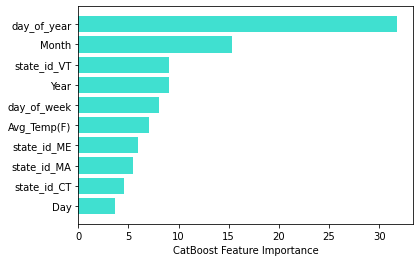

In [56]:
sorted_feature_importance = model.feature_importances_.argsort()
plt.barh(df_ohe_features.columns[sorted_feature_importance], 
        model.feature_importances_[sorted_feature_importance], 
        color='turquoise')
plt.xlabel('CatBoost Feature Importance')

## Shap value plot

Optimized RG model SHAP value plots:
    * Dot represents feature importance for one sample
    * Right $\Rightarrow$ feature increased probability of positive label
    * Left $\Rightarrow$ feature decreased probability of positivity label
    * Red $\Rightarrow$ high feature value
    * Blue $\Leftarrow$ low feature value

for more info on shap plots and how to interpret: [this article](https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d)

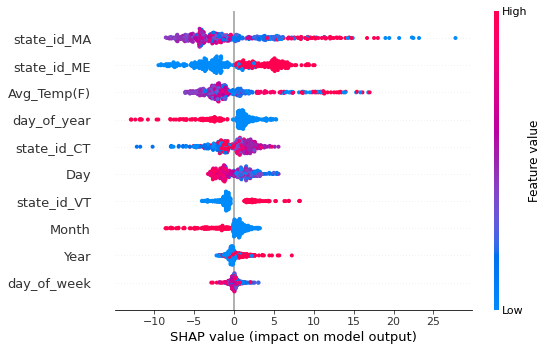

In [59]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names = df_ohe_features.columns[sorted_feature_importance])

***

In [61]:
#load dataframe OHE
#parse datetime column
df_cb = pd.read_csv('ohe_data2.csv', parse_dates=['date'])
df_cb.drop(columns='Unnamed: 0', inplace=True)
df_cb.set_index('date', inplace=True)

In [63]:
df_cb.drop(columns=['Conf_Cases'], inplace=True)

In [64]:
# Create features
X2, y2 = df_ohe.drop(columns=['new_case_percent_pop*']), df_ohe['new_case_percent_pop*']

In [65]:
# Sort y
y_sorted2 = sorted(y2)

In [66]:
# Save your y values in a new ndarray, broken down by the bins created above.
y_binned2 = np.digitize(y2, bins)

In [84]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, stratify=y_binned2, random_state=42)

In [85]:
train_dataset2 = Pool(X_train2, y_train2) 
test_dataset2 = Pool(X_test2, y_test2)

In [86]:
ohe_all_model = CatBoostRegressor(loss_function='RMSE', random_seed=42)

In [87]:
ohe_all_model.grid_search(grid, train_dataset2, cv=5)

0:	learn: 22.3865451	test: 21.5116045	best: 21.5116045 (0)	total: 1.17ms	remaining: 116ms
1:	learn: 21.8861076	test: 21.0324818	best: 21.0324818 (1)	total: 1.96ms	remaining: 96.2ms
2:	learn: 21.4340909	test: 20.6196956	best: 20.6196956 (2)	total: 2.5ms	remaining: 80.8ms
3:	learn: 21.0127233	test: 20.1846289	best: 20.1846289 (3)	total: 3.11ms	remaining: 74.7ms
4:	learn: 20.5560506	test: 19.7513295	best: 19.7513295 (4)	total: 4.17ms	remaining: 79.3ms
5:	learn: 20.1273500	test: 19.2701627	best: 19.2701627 (5)	total: 5.48ms	remaining: 85.8ms
6:	learn: 19.6983374	test: 18.8577145	best: 18.8577145 (6)	total: 6.59ms	remaining: 87.6ms
7:	learn: 19.2880700	test: 18.4673203	best: 18.4673203 (7)	total: 8.01ms	remaining: 92.1ms
8:	learn: 18.9339114	test: 18.1141711	best: 18.1141711 (8)	total: 9.23ms	remaining: 93.3ms
9:	learn: 18.5406771	test: 17.7411593	best: 17.7411593 (9)	total: 9.98ms	remaining: 89.8ms
10:	learn: 18.1622918	test: 17.3850627	best: 17.3850627 (10)	total: 10.9ms	remaining: 88ms
1

13:	learn: 10.2762161	test: 9.8015244	best: 9.8015244 (13)	total: 5.42ms	remaining: 33.3ms
14:	learn: 9.8710395	test: 9.4351124	best: 9.4351124 (14)	total: 6.33ms	remaining: 35.9ms
15:	learn: 9.5245609	test: 9.0847652	best: 9.0847652 (15)	total: 6.9ms	remaining: 36.2ms
16:	learn: 9.2223880	test: 8.8336033	best: 8.8336033 (16)	total: 7.59ms	remaining: 37ms
17:	learn: 8.9794861	test: 8.5895914	best: 8.5895914 (17)	total: 8.15ms	remaining: 37.1ms
18:	learn: 8.7387369	test: 8.3874772	best: 8.3874772 (18)	total: 9.02ms	remaining: 38.5ms
19:	learn: 8.5343572	test: 8.1806426	best: 8.1806426 (19)	total: 9.75ms	remaining: 39ms
20:	learn: 8.3358858	test: 8.0128886	best: 8.0128886 (20)	total: 10.5ms	remaining: 39.4ms
21:	learn: 8.0762139	test: 7.7615741	best: 7.7615741 (21)	total: 11ms	remaining: 39.1ms
22:	learn: 7.8948805	test: 7.6215106	best: 7.6215106 (22)	total: 11.7ms	remaining: 39.1ms
23:	learn: 7.7500189	test: 7.4872825	best: 7.4872825 (23)	total: 12.4ms	remaining: 39.3ms
24:	learn: 7.647

61:	learn: 4.8024784	test: 5.0183260	best: 5.0183260 (61)	total: 37.7ms	remaining: 23.1ms
62:	learn: 4.7606068	test: 4.9761717	best: 4.9761717 (62)	total: 38.7ms	remaining: 22.7ms
63:	learn: 4.7268551	test: 4.9331684	best: 4.9331684 (63)	total: 39.7ms	remaining: 22.3ms
64:	learn: 4.7115943	test: 4.9138200	best: 4.9138200 (64)	total: 40.5ms	remaining: 21.8ms
65:	learn: 4.6947512	test: 4.9042555	best: 4.9042555 (65)	total: 41.1ms	remaining: 21.2ms
66:	learn: 4.6771355	test: 4.8913197	best: 4.8913197 (66)	total: 41.7ms	remaining: 20.5ms
67:	learn: 4.6553574	test: 4.8683990	best: 4.8683990 (67)	total: 42.2ms	remaining: 19.8ms
68:	learn: 4.6371211	test: 4.8718086	best: 4.8683990 (67)	total: 42.7ms	remaining: 19.2ms
69:	learn: 4.5466143	test: 4.8276483	best: 4.8276483 (69)	total: 43.4ms	remaining: 18.6ms
70:	learn: 4.4912612	test: 4.7799499	best: 4.7799499 (70)	total: 43.9ms	remaining: 17.9ms
71:	learn: 4.4761751	test: 4.7781427	best: 4.7781427 (71)	total: 44.4ms	remaining: 17.3ms
72:	learn:

14:	learn: 16.8226560	test: 16.1091522	best: 16.1091522 (14)	total: 8.04ms	remaining: 72.4ms
15:	learn: 16.5375852	test: 15.8134829	best: 15.8134829 (15)	total: 8.82ms	remaining: 73.9ms
16:	learn: 16.2194353	test: 15.5110885	best: 15.5110885 (16)	total: 9.39ms	remaining: 73.5ms
17:	learn: 15.9208567	test: 15.2271714	best: 15.2271714 (17)	total: 10.2ms	remaining: 74.6ms
18:	learn: 15.6140222	test: 14.9332153	best: 14.9332153 (18)	total: 11ms	remaining: 75.5ms
19:	learn: 15.3403364	test: 14.6574886	best: 14.6574886 (19)	total: 11.5ms	remaining: 74.7ms
20:	learn: 15.0559994	test: 14.3850941	best: 14.3850941 (20)	total: 12.3ms	remaining: 75.3ms
21:	learn: 14.7786526	test: 14.1543110	best: 14.1543110 (21)	total: 13.5ms	remaining: 78.7ms
22:	learn: 14.5242462	test: 13.9185247	best: 13.9185247 (22)	total: 14.6ms	remaining: 80.7ms
23:	learn: 14.2922082	test: 13.6984431	best: 13.6984431 (23)	total: 15.2ms	remaining: 80ms
24:	learn: 14.0982090	test: 13.5199158	best: 13.5199158 (24)	total: 15.9ms

91:	learn: 3.7132935	test: 4.2455971	best: 4.2455971 (91)	total: 72.2ms	remaining: 45.5ms
92:	learn: 3.6870270	test: 4.2112029	best: 4.2112029 (92)	total: 73.2ms	remaining: 44.8ms
93:	learn: 3.6503207	test: 4.1744886	best: 4.1744886 (93)	total: 74ms	remaining: 44.1ms
94:	learn: 3.6299991	test: 4.1589606	best: 4.1589606 (94)	total: 75.2ms	remaining: 43.6ms
95:	learn: 3.6132695	test: 4.1459079	best: 4.1459079 (95)	total: 76.5ms	remaining: 43ms
96:	learn: 3.5593173	test: 4.1236663	best: 4.1236663 (96)	total: 77.1ms	remaining: 42.1ms
97:	learn: 3.5229453	test: 4.0932085	best: 4.0932085 (97)	total: 77.6ms	remaining: 41.2ms
98:	learn: 3.4933630	test: 4.0621092	best: 4.0621092 (98)	total: 78.4ms	remaining: 40.4ms
99:	learn: 3.4780884	test: 4.0490392	best: 4.0490392 (99)	total: 79.2ms	remaining: 39.6ms
100:	learn: 3.4708662	test: 4.0367039	best: 4.0367039 (100)	total: 80ms	remaining: 38.8ms
101:	learn: 3.4554988	test: 4.0180944	best: 4.0180944 (101)	total: 80.8ms	remaining: 38ms
102:	learn: 3.

33:	learn: 6.3963745	test: 6.2796605	best: 6.2796605 (33)	total: 22.2ms	remaining: 75.9ms
34:	learn: 6.2825933	test: 6.2324610	best: 6.2324610 (34)	total: 23.2ms	remaining: 76.3ms
35:	learn: 6.1992404	test: 6.1748692	best: 6.1748692 (35)	total: 24.1ms	remaining: 76.2ms
36:	learn: 6.1384730	test: 6.1360446	best: 6.1360446 (36)	total: 25ms	remaining: 76.3ms
37:	learn: 6.0614120	test: 6.0462966	best: 6.0462966 (37)	total: 25.9ms	remaining: 76.4ms
38:	learn: 5.9874687	test: 5.9905175	best: 5.9905175 (38)	total: 26.9ms	remaining: 76.5ms
39:	learn: 5.8858284	test: 5.9025958	best: 5.9025958 (39)	total: 27.7ms	remaining: 76.2ms
40:	learn: 5.8438434	test: 5.8753845	best: 5.8753845 (40)	total: 28.5ms	remaining: 75.9ms
41:	learn: 5.8012853	test: 5.8543331	best: 5.8543331 (41)	total: 29.3ms	remaining: 75.3ms
42:	learn: 5.6836936	test: 5.7476224	best: 5.7476224 (42)	total: 30.2ms	remaining: 75.3ms
43:	learn: 5.5794845	test: 5.6557295	best: 5.6557295 (43)	total: 31.3ms	remaining: 75.4ms
44:	learn: 5

76:	learn: 7.9224988	test: 7.5892149	best: 7.5892149 (76)	total: 66.7ms	remaining: 63.3ms
77:	learn: 7.8674885	test: 7.5530735	best: 7.5530735 (77)	total: 68ms	remaining: 62.8ms
78:	learn: 7.7985979	test: 7.4831574	best: 7.4831574 (78)	total: 68.9ms	remaining: 62ms
79:	learn: 7.7539127	test: 7.4482489	best: 7.4482489 (79)	total: 69.8ms	remaining: 61.1ms
80:	learn: 7.7100459	test: 7.4230223	best: 7.4230223 (80)	total: 70.6ms	remaining: 60.1ms
81:	learn: 7.6477639	test: 7.3611243	best: 7.3611243 (81)	total: 71.2ms	remaining: 59.1ms
82:	learn: 7.5950831	test: 7.3290525	best: 7.3290525 (82)	total: 71.7ms	remaining: 57.9ms
83:	learn: 7.5543014	test: 7.3054317	best: 7.3054317 (83)	total: 72.1ms	remaining: 56.7ms
84:	learn: 7.5130093	test: 7.2577896	best: 7.2577896 (84)	total: 72.9ms	remaining: 55.8ms
85:	learn: 7.4612137	test: 7.2089989	best: 7.2089989 (85)	total: 73.9ms	remaining: 55ms
86:	learn: 7.4192196	test: 7.1835547	best: 7.1835547 (86)	total: 74.6ms	remaining: 54ms
87:	learn: 7.36920

116:	learn: 3.3038279	test: 3.8761819	best: 3.8761819 (116)	total: 135ms	remaining: 38ms
117:	learn: 3.2951116	test: 3.8649352	best: 3.8649352 (117)	total: 136ms	remaining: 36.9ms
118:	learn: 3.2860335	test: 3.8544277	best: 3.8544277 (118)	total: 137ms	remaining: 35.7ms
119:	learn: 3.2754473	test: 3.8534561	best: 3.8534561 (119)	total: 138ms	remaining: 34.4ms
120:	learn: 3.2446955	test: 3.8355172	best: 3.8355172 (120)	total: 138ms	remaining: 33.1ms
121:	learn: 3.2366593	test: 3.8248960	best: 3.8248960 (121)	total: 139ms	remaining: 31.9ms
122:	learn: 3.2137528	test: 3.8073923	best: 3.8073923 (122)	total: 140ms	remaining: 30.7ms
123:	learn: 3.2057844	test: 3.7950780	best: 3.7950780 (123)	total: 141ms	remaining: 29.5ms
124:	learn: 3.2002004	test: 3.7857404	best: 3.7857404 (124)	total: 141ms	remaining: 28.2ms
125:	learn: 3.1948768	test: 3.7787358	best: 3.7787358 (125)	total: 142ms	remaining: 27.1ms
126:	learn: 3.1865113	test: 3.7694136	best: 3.7694136 (126)	total: 143ms	remaining: 25.9ms
1

74:	learn: 4.6414255	test: 4.8913642	best: 4.8913642 (74)	total: 56ms	remaining: 56ms
75:	learn: 4.6121792	test: 4.8537894	best: 4.8537894 (75)	total: 57ms	remaining: 55.5ms
76:	learn: 4.6009358	test: 4.8446397	best: 4.8446397 (76)	total: 57.9ms	remaining: 54.9ms
77:	learn: 4.5330878	test: 4.8200193	best: 4.8200193 (77)	total: 58.8ms	remaining: 54.3ms
78:	learn: 4.5225444	test: 4.8094876	best: 4.8094876 (78)	total: 59.8ms	remaining: 53.7ms
79:	learn: 4.5077841	test: 4.7914243	best: 4.7914243 (79)	total: 60.7ms	remaining: 53.1ms
80:	learn: 4.4958701	test: 4.7808894	best: 4.7808894 (80)	total: 61.7ms	remaining: 52.5ms
81:	learn: 4.4305746	test: 4.7391369	best: 4.7391369 (81)	total: 62.5ms	remaining: 51.8ms
82:	learn: 4.3634110	test: 4.7110248	best: 4.7110248 (82)	total: 63.4ms	remaining: 51.2ms
83:	learn: 4.2958208	test: 4.6521841	best: 4.6521841 (83)	total: 64.3ms	remaining: 50.6ms
84:	learn: 4.2729255	test: 4.6474072	best: 4.6474072 (84)	total: 65.3ms	remaining: 49.9ms
85:	learn: 4.244

175:	learn: 5.0495312	test: 5.1805079	best: 5.1805079 (175)	total: 118ms	remaining: 16.2ms
176:	learn: 5.0374540	test: 5.1694516	best: 5.1694516 (176)	total: 120ms	remaining: 15.6ms
177:	learn: 5.0280307	test: 5.1599453	best: 5.1599453 (177)	total: 121ms	remaining: 14.9ms
178:	learn: 5.0202766	test: 5.1481861	best: 5.1481861 (178)	total: 121ms	remaining: 14.3ms
179:	learn: 5.0105446	test: 5.1404458	best: 5.1404458 (179)	total: 122ms	remaining: 13.6ms
180:	learn: 4.9910002	test: 5.1196533	best: 5.1196533 (180)	total: 123ms	remaining: 12.9ms
181:	learn: 4.9707141	test: 5.1009789	best: 5.1009789 (181)	total: 124ms	remaining: 12.3ms
182:	learn: 4.9612572	test: 5.0909964	best: 5.0909964 (182)	total: 124ms	remaining: 11.6ms
183:	learn: 4.9540738	test: 5.0799604	best: 5.0799604 (183)	total: 126ms	remaining: 10.9ms
184:	learn: 4.9268408	test: 5.0592356	best: 5.0592356 (184)	total: 126ms	remaining: 10.2ms
185:	learn: 4.9152420	test: 5.0481924	best: 5.0481924 (185)	total: 127ms	remaining: 9.53ms

45:	learn: 10.4426362	test: 10.0009887	best: 10.0009887 (45)	total: 31.7ms	remaining: 106ms
46:	learn: 10.3291193	test: 9.8824465	best: 9.8824465 (46)	total: 32.6ms	remaining: 106ms
47:	learn: 10.2150954	test: 9.7565534	best: 9.7565534 (47)	total: 33.4ms	remaining: 106ms
48:	learn: 10.1057796	test: 9.6462403	best: 9.6462403 (48)	total: 34ms	remaining: 105ms
49:	learn: 10.0031285	test: 9.5345205	best: 9.5345205 (49)	total: 34.5ms	remaining: 104ms
50:	learn: 9.8967698	test: 9.4282143	best: 9.4282143 (50)	total: 35ms	remaining: 102ms
51:	learn: 9.7956363	test: 9.3419945	best: 9.3419945 (51)	total: 35.7ms	remaining: 101ms
52:	learn: 9.6966667	test: 9.2406147	best: 9.2406147 (52)	total: 36.2ms	remaining: 100ms
53:	learn: 9.5993674	test: 9.1499865	best: 9.1499865 (53)	total: 36.9ms	remaining: 99.7ms
54:	learn: 9.5116280	test: 9.0710430	best: 9.0710430 (54)	total: 37.5ms	remaining: 98.9ms
55:	learn: 9.4188401	test: 8.9700078	best: 8.9700078 (55)	total: 38.2ms	remaining: 98.2ms
56:	learn: 9.32

103:	learn: 3.4949566	test: 4.0263495	best: 4.0263495 (103)	total: 79.9ms	remaining: 73.8ms
104:	learn: 3.4566710	test: 4.0035656	best: 4.0035656 (104)	total: 81ms	remaining: 73.3ms
105:	learn: 3.4282738	test: 3.9807073	best: 3.9807073 (105)	total: 82ms	remaining: 72.7ms
106:	learn: 3.4182783	test: 3.9714153	best: 3.9714153 (106)	total: 82.9ms	remaining: 72ms
107:	learn: 3.4038919	test: 3.9698758	best: 3.9698758 (107)	total: 83.7ms	remaining: 71.3ms
108:	learn: 3.3947621	test: 3.9576841	best: 3.9576841 (108)	total: 84.7ms	remaining: 70.7ms
109:	learn: 3.3875750	test: 3.9480920	best: 3.9480920 (109)	total: 85.7ms	remaining: 70.1ms
110:	learn: 3.3611036	test: 3.9018354	best: 3.9018354 (110)	total: 86.7ms	remaining: 69.5ms
111:	learn: 3.3548606	test: 3.8922507	best: 3.8922507 (111)	total: 87.6ms	remaining: 68.8ms
112:	learn: 3.3462401	test: 3.8809989	best: 3.8809989 (112)	total: 88.5ms	remaining: 68.2ms
113:	learn: 3.3333464	test: 3.8648036	best: 3.8648036 (113)	total: 89.4ms	remaining: 6

139:	learn: 5.8022627	test: 5.8072069	best: 5.8072069 (139)	total: 94.2ms	remaining: 40.4ms
140:	learn: 5.7768837	test: 5.7807332	best: 5.7807332 (140)	total: 95ms	remaining: 39.8ms
141:	learn: 5.7590745	test: 5.7677898	best: 5.7677898 (141)	total: 95.9ms	remaining: 39.2ms
142:	learn: 5.7432643	test: 5.7545624	best: 5.7545624 (142)	total: 96.8ms	remaining: 38.6ms
143:	learn: 5.7043768	test: 5.7167139	best: 5.7167139 (143)	total: 98.2ms	remaining: 38.2ms
144:	learn: 5.6869368	test: 5.7000120	best: 5.7000120 (144)	total: 99.2ms	remaining: 37.6ms
145:	learn: 5.6727814	test: 5.6942161	best: 5.6942161 (145)	total: 100ms	remaining: 37ms
146:	learn: 5.6517184	test: 5.6737457	best: 5.6737457 (146)	total: 101ms	remaining: 36.4ms
147:	learn: 5.6367524	test: 5.6640618	best: 5.6640618 (147)	total: 102ms	remaining: 35.8ms
148:	learn: 5.6130926	test: 5.6550873	best: 5.6550873 (148)	total: 103ms	remaining: 35.2ms
149:	learn: 5.5999657	test: 5.6452439	best: 5.6452439 (149)	total: 103ms	remaining: 34.5

8:	learn: 19.0125951	test: 18.1888275	best: 18.1888275 (8)	total: 6.13ms	remaining: 130ms
9:	learn: 18.6226252	test: 17.8188091	best: 17.8188091 (9)	total: 7.46ms	remaining: 142ms
10:	learn: 18.2477012	test: 17.4658041	best: 17.4658041 (10)	total: 8.89ms	remaining: 153ms
11:	learn: 17.9261406	test: 17.1476901	best: 17.1476901 (11)	total: 9.47ms	remaining: 148ms
12:	learn: 17.5918536	test: 16.8327036	best: 16.8327036 (12)	total: 10.2ms	remaining: 147ms
13:	learn: 17.2766953	test: 16.5224272	best: 16.5224272 (13)	total: 11ms	remaining: 146ms
14:	learn: 16.9363593	test: 16.2009360	best: 16.2009360 (14)	total: 11.6ms	remaining: 143ms
15:	learn: 16.6549549	test: 15.9094693	best: 15.9094693 (15)	total: 12.5ms	remaining: 144ms
16:	learn: 16.3410322	test: 15.6109411	best: 15.6109411 (16)	total: 13.6ms	remaining: 147ms
17:	learn: 16.0436632	test: 15.3281431	best: 15.3281431 (17)	total: 15.1ms	remaining: 153ms
18:	learn: 15.7580688	test: 15.0514264	best: 15.0514264 (18)	total: 16.3ms	remaining: 

60:	learn: 5.0724184	test: 5.2330787	best: 5.2330787 (60)	total: 41.7ms	remaining: 95ms
61:	learn: 5.0260740	test: 5.1831063	best: 5.1831063 (61)	total: 43.2ms	remaining: 96.1ms
62:	learn: 4.9945702	test: 5.1597623	best: 5.1597623 (62)	total: 44.2ms	remaining: 96.2ms
63:	learn: 4.9695859	test: 5.1426264	best: 5.1426264 (63)	total: 45.1ms	remaining: 95.9ms
64:	learn: 4.9390106	test: 5.1488416	best: 5.1426264 (63)	total: 46.1ms	remaining: 95.8ms
65:	learn: 4.9196880	test: 5.1343051	best: 5.1343051 (65)	total: 47.3ms	remaining: 96ms
66:	learn: 4.8997821	test: 5.1155696	best: 5.1155696 (66)	total: 48.3ms	remaining: 96ms
67:	learn: 4.8744726	test: 5.0860452	best: 5.0860452 (67)	total: 49.7ms	remaining: 96.5ms
68:	learn: 4.8555088	test: 5.0726200	best: 5.0726200 (68)	total: 50.6ms	remaining: 96ms
69:	learn: 4.7670655	test: 5.0039258	best: 5.0039258 (69)	total: 51.5ms	remaining: 95.7ms
70:	learn: 4.7109566	test: 4.9551163	best: 4.9551163 (70)	total: 52.4ms	remaining: 95.3ms
71:	learn: 4.70080

12:	learn: 16.8570394	test: 16.1611564	best: 16.1611564 (12)	total: 15.8ms	remaining: 106ms
13:	learn: 16.4679063	test: 15.7914620	best: 15.7914620 (13)	total: 17.5ms	remaining: 107ms
14:	learn: 16.1241189	test: 15.4497983	best: 15.4497983 (14)	total: 18.9ms	remaining: 107ms
15:	learn: 15.7685665	test: 15.1366147	best: 15.1366147 (15)	total: 20.3ms	remaining: 107ms
16:	learn: 15.4229297	test: 14.8074997	best: 14.8074997 (16)	total: 21.9ms	remaining: 107ms
17:	learn: 15.0755309	test: 14.4451361	best: 14.4451361 (17)	total: 23.1ms	remaining: 105ms
18:	learn: 14.7726578	test: 14.1438544	best: 14.1438544 (18)	total: 24.4ms	remaining: 104ms
19:	learn: 14.4675456	test: 13.8560893	best: 13.8560893 (19)	total: 25.4ms	remaining: 102ms
20:	learn: 14.1785923	test: 13.5745218	best: 13.5745218 (20)	total: 26.8ms	remaining: 101ms
21:	learn: 13.8903766	test: 13.2807126	best: 13.2807126 (21)	total: 28.2ms	remaining: 99.9ms
22:	learn: 13.6116243	test: 12.9833145	best: 12.9833145 (22)	total: 29.6ms	rema

63:	learn: 2.5012080	test: 3.1082849	best: 3.1082849 (63)	total: 76.5ms	remaining: 43ms
64:	learn: 2.4762308	test: 3.0952896	best: 3.0952896 (64)	total: 77.8ms	remaining: 41.9ms
65:	learn: 2.4503571	test: 3.0683511	best: 3.0683511 (65)	total: 79ms	remaining: 40.7ms
66:	learn: 2.4228687	test: 3.0428299	best: 3.0428299 (66)	total: 80.2ms	remaining: 39.5ms
67:	learn: 2.3838122	test: 3.0009771	best: 3.0009771 (67)	total: 81.4ms	remaining: 38.3ms
68:	learn: 2.3552099	test: 2.9595720	best: 2.9595720 (68)	total: 82.5ms	remaining: 37.1ms
69:	learn: 2.3259756	test: 2.9194354	best: 2.9194354 (69)	total: 83.8ms	remaining: 35.9ms
70:	learn: 2.2930262	test: 2.8785698	best: 2.8785698 (70)	total: 85.1ms	remaining: 34.7ms
71:	learn: 2.2782913	test: 2.8686540	best: 2.8686540 (71)	total: 86.3ms	remaining: 33.5ms
72:	learn: 2.2325695	test: 2.8486041	best: 2.8486041 (72)	total: 87.3ms	remaining: 32.3ms
73:	learn: 2.2120396	test: 2.8433228	best: 2.8433228 (73)	total: 88.6ms	remaining: 31.1ms
74:	learn: 2.1

86:	learn: 5.3580461	test: 5.5211143	best: 5.5211143 (86)	total: 136ms	remaining: 20.3ms
87:	learn: 5.3160126	test: 5.4919023	best: 5.4919023 (87)	total: 138ms	remaining: 18.8ms
88:	learn: 5.2617469	test: 5.4481447	best: 5.4481447 (88)	total: 139ms	remaining: 17.2ms
89:	learn: 5.2071993	test: 5.4048413	best: 5.4048413 (89)	total: 141ms	remaining: 15.6ms
90:	learn: 5.1567212	test: 5.3727907	best: 5.3727907 (90)	total: 142ms	remaining: 14ms
91:	learn: 5.1083459	test: 5.3304546	best: 5.3304546 (91)	total: 143ms	remaining: 12.5ms
92:	learn: 5.0744767	test: 5.3075706	best: 5.3075706 (92)	total: 145ms	remaining: 10.9ms
93:	learn: 5.0210844	test: 5.2623121	best: 5.2623121 (93)	total: 146ms	remaining: 9.32ms
94:	learn: 4.9783871	test: 5.2179520	best: 5.2179520 (94)	total: 147ms	remaining: 7.76ms
95:	learn: 4.9346315	test: 5.1786838	best: 5.1786838 (95)	total: 149ms	remaining: 6.2ms
96:	learn: 4.8936565	test: 5.1410576	best: 5.1410576 (96)	total: 150ms	remaining: 4.65ms
97:	learn: 4.8632198	tes

33:	learn: 11.0994511	test: 10.5878370	best: 10.5878370 (33)	total: 32.7ms	remaining: 63.5ms
34:	learn: 10.9184879	test: 10.4050116	best: 10.4050116 (34)	total: 34.2ms	remaining: 63.6ms
35:	learn: 10.7209537	test: 10.2150020	best: 10.2150020 (35)	total: 34.9ms	remaining: 62.1ms
36:	learn: 10.5250350	test: 10.0240847	best: 10.0240847 (36)	total: 36.4ms	remaining: 61.9ms
37:	learn: 10.3327308	test: 9.8599845	best: 9.8599845 (37)	total: 37.6ms	remaining: 61.4ms
38:	learn: 10.1722225	test: 9.7187729	best: 9.7187729 (38)	total: 38.6ms	remaining: 60.4ms
39:	learn: 9.9846060	test: 9.5538814	best: 9.5538814 (39)	total: 40ms	remaining: 60ms
40:	learn: 9.8170790	test: 9.3812182	best: 9.3812182 (40)	total: 41.3ms	remaining: 59.4ms
41:	learn: 9.6543004	test: 9.2321840	best: 9.2321840 (41)	total: 42.4ms	remaining: 58.5ms
42:	learn: 9.4753664	test: 9.0403070	best: 9.0403070 (42)	total: 43.8ms	remaining: 58ms
43:	learn: 9.3345716	test: 8.8994104	best: 8.8994104 (43)	total: 45.1ms	remaining: 57.4ms
44

74:	learn: 2.4525771	test: 3.0993095	best: 3.0993095 (74)	total: 100ms	remaining: 33.5ms
75:	learn: 2.4162271	test: 3.0804133	best: 3.0804133 (75)	total: 102ms	remaining: 32.2ms
76:	learn: 2.3929465	test: 3.0479975	best: 3.0479975 (76)	total: 103ms	remaining: 30.9ms
77:	learn: 2.3810493	test: 3.0332344	best: 3.0332344 (77)	total: 105ms	remaining: 29.5ms
78:	learn: 2.3572826	test: 3.0103699	best: 3.0103699 (78)	total: 106ms	remaining: 28.1ms
79:	learn: 2.3471228	test: 3.0005391	best: 3.0005391 (79)	total: 108ms	remaining: 26.9ms
80:	learn: 2.3260710	test: 2.9796798	best: 2.9796798 (80)	total: 109ms	remaining: 25.6ms
81:	learn: 2.2886095	test: 2.9641107	best: 2.9641107 (81)	total: 110ms	remaining: 24.2ms
82:	learn: 2.2793655	test: 2.9594944	best: 2.9594944 (82)	total: 112ms	remaining: 22.9ms
83:	learn: 2.2571269	test: 2.9324329	best: 2.9324329 (83)	total: 113ms	remaining: 21.6ms
84:	learn: 2.2377604	test: 2.8954348	best: 2.8954348 (84)	total: 114ms	remaining: 20.2ms
85:	learn: 2.2071589	

34:	learn: 4.5663782	test: 4.7273245	best: 4.7273245 (34)	total: 53.6ms	remaining: 99.5ms
35:	learn: 4.4370673	test: 4.6361333	best: 4.6361333 (35)	total: 55.5ms	remaining: 98.6ms
36:	learn: 4.3432422	test: 4.5662894	best: 4.5662894 (36)	total: 56.8ms	remaining: 96.7ms
37:	learn: 4.2605104	test: 4.4974847	best: 4.4974847 (37)	total: 58ms	remaining: 94.7ms
38:	learn: 4.2265073	test: 4.4816033	best: 4.4816033 (38)	total: 59.5ms	remaining: 93.1ms
39:	learn: 4.1477156	test: 4.4444573	best: 4.4444573 (39)	total: 61.1ms	remaining: 91.7ms
40:	learn: 4.0602284	test: 4.3558047	best: 4.3558047 (40)	total: 62.5ms	remaining: 90ms
41:	learn: 4.0028699	test: 4.3036522	best: 4.3036522 (41)	total: 63.7ms	remaining: 88ms
42:	learn: 3.9261984	test: 4.2284631	best: 4.2284631 (42)	total: 65.2ms	remaining: 86.4ms
43:	learn: 3.8441730	test: 4.1912828	best: 4.1912828 (43)	total: 66.6ms	remaining: 84.8ms
44:	learn: 3.8058431	test: 4.1707081	best: 4.1707081 (44)	total: 67.9ms	remaining: 83ms
45:	learn: 3.72306

76:	learn: 5.8454303	test: 5.9644040	best: 5.9644040 (76)	total: 95.1ms	remaining: 90.1ms
77:	learn: 5.7909170	test: 5.9246506	best: 5.9246506 (77)	total: 96.8ms	remaining: 89.4ms
78:	learn: 5.7296623	test: 5.8757089	best: 5.8757089 (78)	total: 97.9ms	remaining: 88ms
79:	learn: 5.6704308	test: 5.8223494	best: 5.8223494 (79)	total: 98.9ms	remaining: 86.5ms
80:	learn: 5.6126029	test: 5.7791182	best: 5.7791182 (80)	total: 99.7ms	remaining: 84.9ms
81:	learn: 5.5604396	test: 5.7481261	best: 5.7481261 (81)	total: 101ms	remaining: 83.8ms
82:	learn: 5.5163836	test: 5.7147134	best: 5.7147134 (82)	total: 102ms	remaining: 82.6ms
83:	learn: 5.4567773	test: 5.6507808	best: 5.6507808 (83)	total: 104ms	remaining: 81.4ms
84:	learn: 5.4102293	test: 5.6217966	best: 5.6217966 (84)	total: 105ms	remaining: 80.3ms
85:	learn: 5.3543643	test: 5.5982735	best: 5.5982735 (85)	total: 106ms	remaining: 79ms
86:	learn: 5.3026139	test: 5.5794967	best: 5.5794967 (86)	total: 107ms	remaining: 77.7ms
87:	learn: 5.2502834

74:	learn: 2.1907742	test: 2.8198193	best: 2.8198193 (74)	total: 97.5ms	remaining: 97.5ms
75:	learn: 2.1810736	test: 2.8136339	best: 2.8136339 (75)	total: 98.9ms	remaining: 96.3ms
76:	learn: 2.1600901	test: 2.7843191	best: 2.7843191 (76)	total: 100ms	remaining: 95.1ms
77:	learn: 2.1311885	test: 2.7649192	best: 2.7649192 (77)	total: 101ms	remaining: 93.6ms
78:	learn: 2.1033898	test: 2.7187197	best: 2.7187197 (78)	total: 103ms	remaining: 92.3ms
79:	learn: 2.0870710	test: 2.6936081	best: 2.6936081 (79)	total: 104ms	remaining: 90.9ms
80:	learn: 2.0614591	test: 2.6728707	best: 2.6728707 (80)	total: 105ms	remaining: 89.6ms
81:	learn: 2.0503717	test: 2.6567232	best: 2.6567232 (81)	total: 106ms	remaining: 88.1ms
82:	learn: 2.0413253	test: 2.6489115	best: 2.6489115 (82)	total: 107ms	remaining: 86.8ms
83:	learn: 2.0179015	test: 2.6249191	best: 2.6249191 (83)	total: 109ms	remaining: 85.4ms
84:	learn: 1.9866813	test: 2.6059992	best: 2.6059992 (84)	total: 110ms	remaining: 84.1ms
85:	learn: 1.969302

135:	learn: 3.7065551	test: 4.1890510	best: 4.1890510 (135)	total: 98.1ms	remaining: 10.1ms
136:	learn: 3.6864061	test: 4.1689022	best: 4.1689022 (136)	total: 98.9ms	remaining: 9.38ms
137:	learn: 3.6744696	test: 4.1665544	best: 4.1665544 (137)	total: 100ms	remaining: 8.7ms
138:	learn: 3.6530627	test: 4.1443580	best: 4.1443580 (138)	total: 101ms	remaining: 7.97ms
139:	learn: 3.6337397	test: 4.1315558	best: 4.1315558 (139)	total: 102ms	remaining: 7.29ms
140:	learn: 3.6158123	test: 4.1111186	best: 4.1111186 (140)	total: 103ms	remaining: 6.57ms
141:	learn: 3.5824043	test: 4.0951351	best: 4.0951351 (141)	total: 104ms	remaining: 5.85ms
142:	learn: 3.5624611	test: 4.0850861	best: 4.0850861 (142)	total: 105ms	remaining: 5.13ms
143:	learn: 3.5525792	test: 4.0770667	best: 4.0770667 (143)	total: 106ms	remaining: 4.4ms
144:	learn: 3.5335752	test: 4.0545832	best: 4.0545832 (144)	total: 106ms	remaining: 3.67ms
145:	learn: 3.5074532	test: 4.0398214	best: 4.0398214 (145)	total: 107ms	remaining: 2.94ms

44:	learn: 9.1913040	test: 8.7690497	best: 8.7690497 (44)	total: 42.6ms	remaining: 99.4ms
45:	learn: 9.0244351	test: 8.6061785	best: 8.6061785 (45)	total: 43.9ms	remaining: 99.3ms
46:	learn: 8.8730200	test: 8.4561711	best: 8.4561711 (46)	total: 44.8ms	remaining: 98.2ms
47:	learn: 8.7313280	test: 8.3147849	best: 8.3147849 (47)	total: 45.9ms	remaining: 97.5ms
48:	learn: 8.6172438	test: 8.2168971	best: 8.2168971 (48)	total: 46.6ms	remaining: 96.1ms
49:	learn: 8.4890000	test: 8.0947887	best: 8.0947887 (49)	total: 47.5ms	remaining: 94.9ms
50:	learn: 8.3564713	test: 7.9718344	best: 7.9718344 (50)	total: 48.2ms	remaining: 93.6ms
51:	learn: 8.2397541	test: 7.8733152	best: 7.8733152 (51)	total: 49.1ms	remaining: 92.5ms
52:	learn: 8.1101248	test: 7.7410389	best: 7.7410389 (52)	total: 50.5ms	remaining: 92.4ms
53:	learn: 7.9917812	test: 7.6391129	best: 7.6391129 (53)	total: 51.4ms	remaining: 91.3ms
54:	learn: 7.8740611	test: 7.5183147	best: 7.5183147 (54)	total: 52.4ms	remaining: 90.4ms
55:	learn:

48:	learn: 3.3131202	test: 3.8432825	best: 3.8432825 (48)	total: 60.7ms	remaining: 125ms
49:	learn: 3.2516509	test: 3.8115105	best: 3.8115105 (49)	total: 62.4ms	remaining: 125ms
50:	learn: 3.2087777	test: 3.7684328	best: 3.7684328 (50)	total: 63.9ms	remaining: 124ms
51:	learn: 3.1629718	test: 3.7162286	best: 3.7162286 (51)	total: 65.4ms	remaining: 123ms
52:	learn: 3.1277662	test: 3.6844460	best: 3.6844460 (52)	total: 66.3ms	remaining: 121ms
53:	learn: 3.0995612	test: 3.6794612	best: 3.6794612 (53)	total: 67.1ms	remaining: 119ms
54:	learn: 3.0738499	test: 3.6516366	best: 3.6516366 (54)	total: 67.9ms	remaining: 117ms
55:	learn: 3.0370245	test: 3.6062306	best: 3.6062306 (55)	total: 69.3ms	remaining: 116ms
56:	learn: 3.0169168	test: 3.5860039	best: 3.5860039 (56)	total: 70.2ms	remaining: 115ms
57:	learn: 2.9828175	test: 3.5351069	best: 3.5351069 (57)	total: 71.3ms	remaining: 113ms
58:	learn: 2.9207887	test: 3.5037065	best: 3.5037065 (58)	total: 72.9ms	remaining: 112ms
59:	learn: 2.8925876	

103:	learn: 5.0862766	test: 5.1906848	best: 5.1906848 (103)	total: 72.8ms	remaining: 32.2ms
104:	learn: 5.0423780	test: 5.1591650	best: 5.1591650 (104)	total: 74ms	remaining: 31.7ms
105:	learn: 5.0014834	test: 5.1153953	best: 5.1153953 (105)	total: 75.3ms	remaining: 31.3ms
106:	learn: 4.9574990	test: 5.0849681	best: 5.0849681 (106)	total: 76.1ms	remaining: 30.6ms
107:	learn: 4.9198596	test: 5.0625258	best: 5.0625258 (107)	total: 77ms	remaining: 29.9ms
108:	learn: 4.8858024	test: 5.0277368	best: 5.0277368 (108)	total: 78ms	remaining: 29.4ms
109:	learn: 4.8681965	test: 5.0166797	best: 5.0166797 (109)	total: 79.6ms	remaining: 28.9ms
110:	learn: 4.8295763	test: 4.9789289	best: 4.9789289 (110)	total: 81.4ms	remaining: 28.6ms
111:	learn: 4.7985238	test: 4.9469708	best: 4.9469708 (111)	total: 83.3ms	remaining: 28.3ms
112:	learn: 4.7600244	test: 4.9161971	best: 4.9161971 (112)	total: 84.8ms	remaining: 27.8ms
113:	learn: 4.7398503	test: 4.9101350	best: 4.9101350 (113)	total: 86.1ms	remaining: 2

82:	learn: 2.5702537	test: 3.1873407	best: 3.1873407 (82)	total: 124ms	remaining: 99.8ms
83:	learn: 2.5414542	test: 3.1567770	best: 3.1567770 (83)	total: 125ms	remaining: 98.3ms
84:	learn: 2.5316037	test: 3.1517200	best: 3.1517200 (84)	total: 127ms	remaining: 97ms
85:	learn: 2.5093132	test: 3.1413052	best: 3.1413052 (85)	total: 129ms	remaining: 95.7ms
86:	learn: 2.4831459	test: 3.1111951	best: 3.1111951 (86)	total: 131ms	remaining: 94.6ms
87:	learn: 2.4435026	test: 3.0933895	best: 3.0933895 (87)	total: 132ms	remaining: 93.3ms
88:	learn: 2.4358748	test: 3.0927431	best: 3.0927431 (88)	total: 134ms	remaining: 91.9ms
89:	learn: 2.4192780	test: 3.0617588	best: 3.0617588 (89)	total: 136ms	remaining: 90.4ms
90:	learn: 2.4130371	test: 3.0578589	best: 3.0578589 (90)	total: 137ms	remaining: 89ms
91:	learn: 2.4033186	test: 3.0632697	best: 3.0578589 (90)	total: 139ms	remaining: 87.5ms
92:	learn: 2.3864558	test: 3.0543889	best: 3.0543889 (92)	total: 140ms	remaining: 85.9ms
93:	learn: 2.3801880	test

126:	learn: 3.9139335	test: 4.4435751	best: 4.4435751 (126)	total: 86.8ms	remaining: 49.9ms
127:	learn: 3.8815717	test: 4.4191654	best: 4.4191654 (127)	total: 87.8ms	remaining: 49.4ms
128:	learn: 3.8497002	test: 4.3955121	best: 4.3955121 (128)	total: 88.9ms	remaining: 48.9ms
129:	learn: 3.8338070	test: 4.3808930	best: 4.3808930 (129)	total: 89.7ms	remaining: 48.3ms
130:	learn: 3.8106601	test: 4.3673042	best: 4.3673042 (130)	total: 90.8ms	remaining: 47.8ms
131:	learn: 3.7861496	test: 4.3533557	best: 4.3533557 (131)	total: 91.8ms	remaining: 47.3ms
132:	learn: 3.7656512	test: 4.3327052	best: 4.3327052 (132)	total: 92.6ms	remaining: 46.6ms
133:	learn: 3.7414351	test: 4.3174944	best: 4.3174944 (133)	total: 93.4ms	remaining: 46ms
134:	learn: 3.7179416	test: 4.3072852	best: 4.3072852 (134)	total: 94.4ms	remaining: 45.4ms
135:	learn: 3.6977782	test: 4.2846083	best: 4.2846083 (135)	total: 95.3ms	remaining: 44.9ms
136:	learn: 3.6786494	test: 4.2655177	best: 4.2655177 (136)	total: 96.1ms	remainin

94:	learn: 1.8131618	test: 2.4388234	best: 2.4388234 (94)	total: 94.5ms	remaining: 104ms
95:	learn: 1.7954569	test: 2.4151981	best: 2.4151981 (95)	total: 95.8ms	remaining: 104ms
96:	learn: 1.7848569	test: 2.4022459	best: 2.4022459 (96)	total: 97.2ms	remaining: 103ms
97:	learn: 1.7719315	test: 2.3815920	best: 2.3815920 (97)	total: 98.5ms	remaining: 103ms
98:	learn: 1.7513655	test: 2.3589946	best: 2.3589946 (98)	total: 99.5ms	remaining: 102ms
99:	learn: 1.7360679	test: 2.3421179	best: 2.3421179 (99)	total: 101ms	remaining: 101ms
100:	learn: 1.7121668	test: 2.3266158	best: 2.3266158 (100)	total: 102ms	remaining: 99.6ms
101:	learn: 1.6936512	test: 2.2951479	best: 2.2951479 (101)	total: 102ms	remaining: 98.4ms
102:	learn: 1.6757980	test: 2.2762881	best: 2.2762881 (102)	total: 104ms	remaining: 97.5ms
103:	learn: 1.6663690	test: 2.2665820	best: 2.2665820 (103)	total: 104ms	remaining: 96.4ms
104:	learn: 1.6549896	test: 2.2612322	best: 2.2612322 (104)	total: 106ms	remaining: 95.5ms
105:	learn: 

71:	learn: 6.2363537	test: 6.2012869	best: 6.2012869 (71)	total: 63.9ms	remaining: 114ms
72:	learn: 6.1641718	test: 6.1555178	best: 6.1555178 (72)	total: 65.2ms	remaining: 113ms
73:	learn: 6.0813903	test: 6.0793020	best: 6.0793020 (73)	total: 66.5ms	remaining: 113ms
74:	learn: 6.0052779	test: 6.0086717	best: 6.0086717 (74)	total: 67.7ms	remaining: 113ms
75:	learn: 5.9533751	test: 5.9670566	best: 5.9670566 (75)	total: 69ms	remaining: 113ms
76:	learn: 5.8892915	test: 5.9220332	best: 5.9220332 (76)	total: 70.3ms	remaining: 112ms
77:	learn: 5.8270397	test: 5.8679431	best: 5.8679431 (77)	total: 71.6ms	remaining: 112ms
78:	learn: 5.7918185	test: 5.8506541	best: 5.8506541 (78)	total: 72.8ms	remaining: 111ms
79:	learn: 5.7310268	test: 5.7959278	best: 5.7959278 (79)	total: 74.1ms	remaining: 111ms
80:	learn: 5.6725619	test: 5.7513307	best: 5.7513307 (80)	total: 75.2ms	remaining: 111ms
81:	learn: 5.6196688	test: 5.7197254	best: 5.7197254 (81)	total: 76.3ms	remaining: 110ms
82:	learn: 5.5736605	te

86:	learn: 2.2034917	test: 2.7955887	best: 2.7955887 (86)	total: 53.9ms	remaining: 70.1ms
87:	learn: 2.1752888	test: 2.7680107	best: 2.7680107 (87)	total: 55.3ms	remaining: 70.4ms
88:	learn: 2.1655225	test: 2.7632345	best: 2.7632345 (88)	total: 56.4ms	remaining: 70.3ms
89:	learn: 2.1495998	test: 2.7494783	best: 2.7494783 (89)	total: 57.3ms	remaining: 70ms
90:	learn: 2.1414808	test: 2.7401219	best: 2.7401219 (90)	total: 58.1ms	remaining: 69.6ms
91:	learn: 2.0982664	test: 2.7277631	best: 2.7277631 (91)	total: 58.7ms	remaining: 69ms
92:	learn: 2.0838243	test: 2.7121809	best: 2.7121809 (92)	total: 59.4ms	remaining: 68.4ms
93:	learn: 2.0653596	test: 2.6907494	best: 2.6907494 (93)	total: 60.3ms	remaining: 68ms
94:	learn: 2.0411885	test: 2.6788676	best: 2.6788676 (94)	total: 61.4ms	remaining: 67.9ms
95:	learn: 2.0280121	test: 2.6659603	best: 2.6659603 (95)	total: 62.3ms	remaining: 67.5ms
96:	learn: 2.0166237	test: 2.6505748	best: 2.6505748 (96)	total: 63.2ms	remaining: 67.1ms
97:	learn: 2.002

63:	learn: 6.9508481	test: 6.6942761	best: 6.6942761 (63)	total: 72ms	remaining: 153ms
64:	learn: 6.8830449	test: 6.6464203	best: 6.6464203 (64)	total: 73.9ms	remaining: 153ms
65:	learn: 6.7929875	test: 6.5659145	best: 6.5659145 (65)	total: 75ms	remaining: 152ms
66:	learn: 6.7170082	test: 6.5031155	best: 6.5031155 (66)	total: 76.1ms	remaining: 151ms
67:	learn: 6.6408030	test: 6.4394424	best: 6.4394424 (67)	total: 77.4ms	remaining: 150ms
68:	learn: 6.5666663	test: 6.3795357	best: 6.3795357 (68)	total: 78.9ms	remaining: 150ms
69:	learn: 6.4938969	test: 6.3215866	best: 6.3215866 (69)	total: 80.2ms	remaining: 149ms
70:	learn: 6.4173053	test: 6.2688873	best: 6.2688873 (70)	total: 81.4ms	remaining: 148ms
71:	learn: 6.3442003	test: 6.2266796	best: 6.2266796 (71)	total: 82.6ms	remaining: 147ms
72:	learn: 6.2574746	test: 6.1700950	best: 6.1700950 (72)	total: 83.9ms	remaining: 146ms
73:	learn: 6.1847297	test: 6.1097041	best: 6.1097041 (73)	total: 85.3ms	remaining: 145ms
74:	learn: 6.1061072	test

194:	learn: 2.9392519	test: 3.4685800	best: 3.4685800 (194)	total: 256ms	remaining: 6.56ms
195:	learn: 2.9353303	test: 3.4653010	best: 3.4653010 (195)	total: 257ms	remaining: 5.25ms
196:	learn: 2.9232234	test: 3.4467794	best: 3.4467794 (196)	total: 258ms	remaining: 3.93ms
197:	learn: 2.9156820	test: 3.4444590	best: 3.4444590 (197)	total: 260ms	remaining: 2.62ms
198:	learn: 2.9059732	test: 3.4321559	best: 3.4321559 (198)	total: 261ms	remaining: 1.31ms
199:	learn: 2.8919048	test: 3.4180337	best: 3.4180337 (199)	total: 263ms	remaining: 0us

bestTest = 3.418033734
bestIteration = 199

44:	loss: 3.4180337	best: 1.6517842 (41)	total: 6.62s	remaining: 7.5s
0:	learn: 21.1042754	test: 20.2232288	best: 20.2232288 (0)	total: 1.27ms	remaining: 253ms
1:	learn: 19.5346361	test: 18.6948468	best: 18.6948468 (1)	total: 2.55ms	remaining: 252ms
2:	learn: 18.0554529	test: 17.2252464	best: 17.2252464 (2)	total: 3.77ms	remaining: 248ms
3:	learn: 16.7034157	test: 15.8767882	best: 15.8767882 (3)	total: 5.14ms

155:	learn: 1.3229542	test: 2.0599680	best: 2.0579023 (154)	total: 175ms	remaining: 49.4ms
156:	learn: 1.3191840	test: 2.0563592	best: 2.0563592 (156)	total: 177ms	remaining: 48.4ms
157:	learn: 1.3142296	test: 2.0528276	best: 2.0528276 (157)	total: 178ms	remaining: 47.3ms
158:	learn: 1.3072419	test: 2.0486862	best: 2.0486862 (158)	total: 180ms	remaining: 46.4ms
159:	learn: 1.3016703	test: 2.0403957	best: 2.0403957 (159)	total: 182ms	remaining: 45.4ms
160:	learn: 1.2913248	test: 2.0273609	best: 2.0273609 (160)	total: 183ms	remaining: 44.4ms
161:	learn: 1.2867392	test: 2.0234327	best: 2.0234327 (161)	total: 184ms	remaining: 43.3ms
162:	learn: 1.2776498	test: 2.0152278	best: 2.0152278 (162)	total: 185ms	remaining: 42.1ms
163:	learn: 1.2696101	test: 2.0036967	best: 2.0036967 (163)	total: 187ms	remaining: 41.1ms
164:	learn: 1.2652638	test: 1.9992824	best: 1.9992824 (164)	total: 189ms	remaining: 40.1ms
165:	learn: 1.2564872	test: 1.9922167	best: 1.9922167 (165)	total: 190ms	remaining: 39ms
1

119:	learn: 4.5398087	test: 4.7567665	best: 4.7567665 (119)	total: 120ms	remaining: 80.3ms
120:	learn: 4.5049918	test: 4.7264571	best: 4.7264571 (120)	total: 122ms	remaining: 79.5ms
121:	learn: 4.4711430	test: 4.6973784	best: 4.6973784 (121)	total: 123ms	remaining: 78.6ms
122:	learn: 4.4373609	test: 4.6766034	best: 4.6766034 (122)	total: 124ms	remaining: 77.8ms
123:	learn: 4.4109892	test: 4.6488186	best: 4.6488186 (123)	total: 125ms	remaining: 76.9ms
124:	learn: 4.3862265	test: 4.6257465	best: 4.6257465 (124)	total: 127ms	remaining: 76ms
125:	learn: 4.3719365	test: 4.6165998	best: 4.6165998 (125)	total: 128ms	remaining: 75.1ms
126:	learn: 4.3531685	test: 4.6049649	best: 4.6049649 (126)	total: 129ms	remaining: 74.3ms
127:	learn: 4.3159459	test: 4.5702854	best: 4.5702854 (127)	total: 130ms	remaining: 73.3ms
128:	learn: 4.2769498	test: 4.5376713	best: 4.5376713 (128)	total: 132ms	remaining: 72.4ms
129:	learn: 4.2543195	test: 4.5240030	best: 4.5240030 (129)	total: 133ms	remaining: 71.5ms
1

81:	learn: 2.5779707	test: 3.1918591	best: 3.1918591 (81)	total: 93ms	remaining: 134ms
82:	learn: 2.5702537	test: 3.1873407	best: 3.1873407 (82)	total: 94.2ms	remaining: 133ms
83:	learn: 2.5414542	test: 3.1567770	best: 3.1567770 (83)	total: 95.2ms	remaining: 132ms
84:	learn: 2.5316037	test: 3.1517200	best: 3.1517200 (84)	total: 96.4ms	remaining: 130ms
85:	learn: 2.5093132	test: 3.1413052	best: 3.1413052 (85)	total: 98.1ms	remaining: 130ms
86:	learn: 2.4831459	test: 3.1111951	best: 3.1111951 (86)	total: 99.5ms	remaining: 129ms
87:	learn: 2.4435026	test: 3.0933895	best: 3.0933895 (87)	total: 100ms	remaining: 128ms
88:	learn: 2.4358748	test: 3.0927431	best: 3.0927431 (88)	total: 102ms	remaining: 127ms
89:	learn: 2.4192780	test: 3.0617588	best: 3.0617588 (89)	total: 103ms	remaining: 125ms
90:	learn: 2.4130371	test: 3.0578589	best: 3.0578589 (90)	total: 104ms	remaining: 124ms
91:	learn: 2.4033186	test: 3.0632697	best: 3.0578589 (90)	total: 105ms	remaining: 123ms
92:	learn: 2.3864558	test: 3

21:	learn: 13.4447562	test: 12.8206728	best: 12.8206728 (21)	total: 37.9ms	remaining: 134ms
22:	learn: 13.1385795	test: 12.5107247	best: 12.5107247 (22)	total: 39.6ms	remaining: 133ms
23:	learn: 12.8455165	test: 12.2126143	best: 12.2126143 (23)	total: 41.6ms	remaining: 132ms
24:	learn: 12.5580718	test: 11.9502931	best: 11.9502931 (24)	total: 43.2ms	remaining: 130ms
25:	learn: 12.2805547	test: 11.7156896	best: 11.7156896 (25)	total: 44.7ms	remaining: 127ms
26:	learn: 12.0200201	test: 11.4506582	best: 11.4506582 (26)	total: 46.2ms	remaining: 125ms
27:	learn: 11.7606375	test: 11.2109851	best: 11.2109851 (27)	total: 47.9ms	remaining: 123ms
28:	learn: 11.5007027	test: 10.9536914	best: 10.9536914 (28)	total: 49.7ms	remaining: 122ms
29:	learn: 11.2547452	test: 10.7265718	best: 10.7265718 (29)	total: 51.3ms	remaining: 120ms
30:	learn: 11.0215198	test: 10.4927145	best: 10.4927145 (30)	total: 52.7ms	remaining: 117ms
31:	learn: 10.7765098	test: 10.2666300	best: 10.2666300 (31)	total: 54.2ms	remai

39:	learn: 2.5179633	test: 3.3593281	best: 3.3593281 (39)	total: 75ms	remaining: 113ms
40:	learn: 2.4612189	test: 3.3334271	best: 3.3334271 (40)	total: 77.3ms	remaining: 111ms
41:	learn: 2.4039644	test: 3.2965763	best: 3.2965763 (41)	total: 79.8ms	remaining: 110ms
42:	learn: 2.3409603	test: 3.2328720	best: 3.2328720 (42)	total: 81.2ms	remaining: 108ms
43:	learn: 2.2804725	test: 3.1681319	best: 3.1681319 (43)	total: 82.5ms	remaining: 105ms
44:	learn: 2.2600967	test: 3.1454005	best: 3.1454005 (44)	total: 83.9ms	remaining: 103ms
45:	learn: 2.2228303	test: 3.1240889	best: 3.1240889 (45)	total: 85.5ms	remaining: 100ms
46:	learn: 2.1738158	test: 3.0740976	best: 3.0740976 (46)	total: 87.1ms	remaining: 98.2ms
47:	learn: 2.1384724	test: 3.0556391	best: 3.0556391 (47)	total: 88.9ms	remaining: 96.4ms
48:	learn: 2.0980065	test: 3.0071448	best: 3.0071448 (48)	total: 91ms	remaining: 94.7ms
49:	learn: 2.0660524	test: 2.9907913	best: 2.9907913 (49)	total: 92.3ms	remaining: 92.3ms
50:	learn: 2.0328745	

32:	learn: 3.1596832	test: 3.8753444	best: 3.8753444 (32)	total: 56.4ms	remaining: 114ms
33:	learn: 3.0258252	test: 3.7676348	best: 3.7676348 (33)	total: 58.4ms	remaining: 113ms
34:	learn: 2.9394305	test: 3.7158887	best: 3.7158887 (34)	total: 60.4ms	remaining: 112ms
35:	learn: 2.8575175	test: 3.6520175	best: 3.6520175 (35)	total: 62.4ms	remaining: 111ms
36:	learn: 2.7523666	test: 3.5535257	best: 3.5535257 (36)	total: 63.6ms	remaining: 108ms
37:	learn: 2.6598208	test: 3.5020386	best: 3.5020386 (37)	total: 65.1ms	remaining: 106ms
38:	learn: 2.5908972	test: 3.4259580	best: 3.4259580 (38)	total: 66.6ms	remaining: 104ms
39:	learn: 2.5357409	test: 3.3894284	best: 3.3894284 (39)	total: 68.1ms	remaining: 102ms
40:	learn: 2.4861265	test: 3.3627779	best: 3.3627779 (40)	total: 69.9ms	remaining: 101ms
41:	learn: 2.4327864	test: 3.3272231	best: 3.3272231 (41)	total: 71.5ms	remaining: 98.7ms
42:	learn: 2.3935654	test: 3.2959093	best: 3.2959093 (42)	total: 72.9ms	remaining: 96.6ms
43:	learn: 2.343959

37:	learn: 9.9120581	test: 9.5308573	best: 9.5308573 (37)	total: 66ms	remaining: 108ms
38:	learn: 9.7322088	test: 9.3781938	best: 9.3781938 (38)	total: 68.4ms	remaining: 107ms
39:	learn: 9.5577189	test: 9.2047904	best: 9.2047904 (39)	total: 70.4ms	remaining: 106ms
40:	learn: 9.3707793	test: 9.0526807	best: 9.0526807 (40)	total: 72.7ms	remaining: 105ms
41:	learn: 9.2025262	test: 8.8889291	best: 8.8889291 (41)	total: 74.6ms	remaining: 103ms
42:	learn: 9.0449039	test: 8.7467680	best: 8.7467680 (42)	total: 76.6ms	remaining: 102ms
43:	learn: 8.8389829	test: 8.5622809	best: 8.5622809 (43)	total: 79.1ms	remaining: 101ms
44:	learn: 8.6894719	test: 8.4303846	best: 8.4303846 (44)	total: 81ms	remaining: 99ms
45:	learn: 8.5136291	test: 8.2655906	best: 8.2655906 (45)	total: 82.9ms	remaining: 97.3ms
46:	learn: 8.3606493	test: 8.1338738	best: 8.1338738 (46)	total: 84.5ms	remaining: 95.3ms
47:	learn: 8.2283465	test: 8.0121272	best: 8.0121272 (47)	total: 86.1ms	remaining: 93.3ms
48:	learn: 8.0896807	te

50:	learn: 2.2155188	test: 3.1785234	best: 3.1785234 (50)	total: 86.3ms	remaining: 83ms
51:	learn: 2.1675344	test: 3.1434008	best: 3.1434008 (51)	total: 87.6ms	remaining: 80.9ms
52:	learn: 2.1285780	test: 3.1001814	best: 3.1001814 (52)	total: 88.7ms	remaining: 78.7ms
53:	learn: 2.1014971	test: 3.0730346	best: 3.0730346 (53)	total: 89.8ms	remaining: 76.5ms
54:	learn: 2.0510272	test: 3.0269130	best: 3.0269130 (54)	total: 90.7ms	remaining: 74.2ms
55:	learn: 1.9981045	test: 2.9791005	best: 2.9791005 (55)	total: 91.9ms	remaining: 72.2ms
56:	learn: 1.9725225	test: 2.9453254	best: 2.9453254 (56)	total: 93.7ms	remaining: 70.7ms
57:	learn: 1.9316615	test: 2.9288674	best: 2.9288674 (57)	total: 95.5ms	remaining: 69.1ms
58:	learn: 1.9115464	test: 2.9173135	best: 2.9173135 (58)	total: 98.6ms	remaining: 68.5ms
59:	learn: 1.8698052	test: 2.8835270	best: 2.8835270 (59)	total: 101ms	remaining: 67.2ms
60:	learn: 1.8405231	test: 2.8448134	best: 2.8448134 (60)	total: 102ms	remaining: 65.4ms
61:	learn: 1.8

52:	learn: 8.1401092	test: 7.9077812	best: 7.9077812 (52)	total: 95.5ms	remaining: 84.7ms
53:	learn: 8.0114589	test: 7.7837514	best: 7.7837514 (53)	total: 98.3ms	remaining: 83.7ms
54:	learn: 7.8860604	test: 7.6666304	best: 7.6666304 (54)	total: 102ms	remaining: 83.5ms
55:	learn: 7.7660625	test: 7.5457864	best: 7.5457864 (55)	total: 104ms	remaining: 82ms
56:	learn: 7.6606242	test: 7.4496351	best: 7.4496351 (56)	total: 107ms	remaining: 80.5ms
57:	learn: 7.5312184	test: 7.3377193	best: 7.3377193 (57)	total: 109ms	remaining: 78.8ms
58:	learn: 7.4102621	test: 7.2302343	best: 7.2302343 (58)	total: 110ms	remaining: 76.8ms
59:	learn: 7.2711320	test: 7.1115316	best: 7.1115316 (59)	total: 112ms	remaining: 74.8ms
60:	learn: 7.1588502	test: 7.0053738	best: 7.0053738 (60)	total: 114ms	remaining: 72.7ms
61:	learn: 7.0611857	test: 6.9395875	best: 6.9395875 (61)	total: 115ms	remaining: 70.7ms
62:	learn: 6.9647772	test: 6.8594153	best: 6.8594153 (62)	total: 117ms	remaining: 68.9ms
63:	learn: 6.8896626	

55:	learn: 2.5954542	test: 3.4853507	best: 3.4853507 (55)	total: 98.3ms	remaining: 77.2ms
56:	learn: 2.5440874	test: 3.4276837	best: 3.4276837 (56)	total: 100ms	remaining: 75.7ms
57:	learn: 2.4972065	test: 3.4085382	best: 3.4085382 (57)	total: 102ms	remaining: 73.7ms
58:	learn: 2.4603366	test: 3.3857047	best: 3.3857047 (58)	total: 106ms	remaining: 73.3ms
59:	learn: 2.4332161	test: 3.3591229	best: 3.3591229 (59)	total: 108ms	remaining: 72ms
60:	learn: 2.3984884	test: 3.3162759	best: 3.3162759 (60)	total: 110ms	remaining: 70.1ms
61:	learn: 2.3652151	test: 3.3026751	best: 3.3026751 (61)	total: 111ms	remaining: 68.3ms
62:	learn: 2.3467286	test: 3.2945720	best: 3.2945720 (62)	total: 113ms	remaining: 66.6ms
63:	learn: 2.3329898	test: 3.2991607	best: 3.2945720 (62)	total: 115ms	remaining: 64.6ms
64:	learn: 2.3035847	test: 3.2737512	best: 3.2737512 (64)	total: 116ms	remaining: 62.6ms
65:	learn: 2.2719521	test: 3.2516013	best: 3.2516013 (65)	total: 117ms	remaining: 60.5ms
66:	learn: 2.2445937	t

65:	learn: 5.8205194	test: 6.0032832	best: 6.0032832 (65)	total: 107ms	remaining: 136ms
66:	learn: 5.7343904	test: 5.9201934	best: 5.9201934 (66)	total: 108ms	remaining: 134ms
67:	learn: 5.6386050	test: 5.8469257	best: 5.8469257 (67)	total: 111ms	remaining: 134ms
68:	learn: 5.5285447	test: 5.7628707	best: 5.7628707 (68)	total: 114ms	remaining: 134ms
69:	learn: 5.4378184	test: 5.6672291	best: 5.6672291 (69)	total: 119ms	remaining: 136ms
70:	learn: 5.3620461	test: 5.6006145	best: 5.6006145 (70)	total: 121ms	remaining: 135ms
71:	learn: 5.2893426	test: 5.5524015	best: 5.5524015 (71)	total: 122ms	remaining: 133ms
72:	learn: 5.2025705	test: 5.4748341	best: 5.4748341 (72)	total: 124ms	remaining: 131ms
73:	learn: 5.1164534	test: 5.4150404	best: 5.4150404 (73)	total: 127ms	remaining: 130ms
74:	learn: 5.0502822	test: 5.3706572	best: 5.3706572 (74)	total: 129ms	remaining: 129ms
75:	learn: 4.9892947	test: 5.3427302	best: 5.3427302 (75)	total: 131ms	remaining: 127ms
76:	learn: 4.9321121	test: 5.302

24:	learn: 4.2784029	test: 4.6955489	best: 4.6955489 (24)	total: 36.7ms	remaining: 183ms
25:	learn: 4.0845704	test: 4.5815647	best: 4.5815647 (25)	total: 38.5ms	remaining: 184ms
26:	learn: 3.9053346	test: 4.4533731	best: 4.4533731 (26)	total: 40.8ms	remaining: 186ms
27:	learn: 3.7654144	test: 4.3216336	best: 4.3216336 (27)	total: 42.9ms	remaining: 187ms
28:	learn: 3.6166253	test: 4.2207681	best: 4.2207681 (28)	total: 45ms	remaining: 188ms
29:	learn: 3.4974989	test: 4.1247659	best: 4.1247659 (29)	total: 46.3ms	remaining: 185ms
30:	learn: 3.3790406	test: 4.0540703	best: 4.0540703 (30)	total: 47.6ms	remaining: 183ms
31:	learn: 3.2530220	test: 3.9303407	best: 3.9303407 (31)	total: 48.9ms	remaining: 180ms
32:	learn: 3.1367284	test: 3.8338181	best: 3.8338181 (32)	total: 50.3ms	remaining: 178ms
33:	learn: 3.0378580	test: 3.7460860	best: 3.7460860 (33)	total: 51.6ms	remaining: 176ms
34:	learn: 2.9264160	test: 3.6587524	best: 3.6587524 (34)	total: 53.1ms	remaining: 175ms
35:	learn: 2.8372518	te

3:	learn: 20.8035008	test: 19.9780016	best: 19.9780016 (3)	total: 4.79ms	remaining: 175ms
4:	learn: 20.2924522	test: 19.4630838	best: 19.4630838 (4)	total: 6.04ms	remaining: 175ms
5:	learn: 19.7679943	test: 18.9671515	best: 18.9671515 (5)	total: 7.38ms	remaining: 177ms
6:	learn: 19.2665753	test: 18.4644233	best: 18.4644233 (6)	total: 8.56ms	remaining: 175ms
7:	learn: 18.7814112	test: 18.0021912	best: 18.0021912 (7)	total: 9.77ms	remaining: 173ms
8:	learn: 18.4043811	test: 17.6487490	best: 17.6487490 (8)	total: 11.6ms	remaining: 181ms
9:	learn: 17.9647255	test: 17.2081474	best: 17.2081474 (9)	total: 13ms	remaining: 181ms
10:	learn: 17.5385819	test: 16.8163240	best: 16.8163240 (10)	total: 14.1ms	remaining: 178ms
11:	learn: 17.1449958	test: 16.4077691	best: 16.4077691 (11)	total: 15.5ms	remaining: 179ms
12:	learn: 16.7273211	test: 15.9888493	best: 15.9888493 (12)	total: 16.9ms	remaining: 178ms
13:	learn: 16.3322160	test: 15.6262804	best: 15.6262804 (13)	total: 18.3ms	remaining: 178ms
14:	

145:	learn: 2.5939457	test: 3.4601068	best: 3.4601068 (145)	total: 194ms	remaining: 5.3ms
146:	learn: 2.5691634	test: 3.4395297	best: 3.4395297 (146)	total: 196ms	remaining: 4ms
147:	learn: 2.5413010	test: 3.4128255	best: 3.4128255 (147)	total: 198ms	remaining: 2.67ms
148:	learn: 2.5218810	test: 3.3955287	best: 3.3955287 (148)	total: 199ms	remaining: 1.34ms
149:	learn: 2.5114500	test: 3.3922301	best: 3.3922301 (149)	total: 201ms	remaining: 0us

bestTest = 3.392230056
bestIteration = 149

58:	loss: 3.3922301	best: 1.6517842 (41)	total: 9.64s	remaining: 6.04s
0:	learn: 21.0775314	test: 20.1968899	best: 20.1968899 (0)	total: 1.69ms	remaining: 251ms
1:	learn: 19.2755573	test: 18.3851120	best: 18.3851120 (1)	total: 3.38ms	remaining: 250ms
2:	learn: 17.9232377	test: 17.1590754	best: 17.1590754 (2)	total: 5.37ms	remaining: 263ms
3:	learn: 16.6000932	test: 15.9234130	best: 15.9234130 (3)	total: 6.58ms	remaining: 240ms
4:	learn: 15.2714710	test: 14.5811742	best: 14.5811742 (4)	total: 8.05ms	rem

27:	learn: 12.0944473	test: 11.5950633	best: 11.5950633 (27)	total: 29.6ms	remaining: 129ms
28:	learn: 11.8513402	test: 11.3399315	best: 11.3399315 (28)	total: 31.3ms	remaining: 131ms
29:	learn: 11.6091431	test: 11.1146091	best: 11.1146091 (29)	total: 32.3ms	remaining: 129ms
30:	learn: 11.3755832	test: 10.8797922	best: 10.8797922 (30)	total: 33.3ms	remaining: 128ms
31:	learn: 11.1386299	test: 10.6562576	best: 10.6562576 (31)	total: 34.6ms	remaining: 128ms
32:	learn: 10.9110063	test: 10.4556405	best: 10.4556405 (32)	total: 36.4ms	remaining: 129ms
33:	learn: 10.6801084	test: 10.2387590	best: 10.2387590 (33)	total: 37.9ms	remaining: 129ms
34:	learn: 10.4679422	test: 10.0360132	best: 10.0360132 (34)	total: 39.1ms	remaining: 129ms
35:	learn: 10.2791594	test: 9.8730503	best: 9.8730503 (35)	total: 40.2ms	remaining: 127ms
36:	learn: 10.0847575	test: 9.6838002	best: 9.6838002 (36)	total: 41.4ms	remaining: 126ms
37:	learn: 9.9120581	test: 9.5308573	best: 9.5308573 (37)	total: 42.7ms	remaining: 1

14:	learn: 7.6196099	test: 7.6189986	best: 7.6189986 (14)	total: 19.2ms	remaining: 173ms
15:	learn: 7.1833041	test: 7.2632916	best: 7.2632916 (15)	total: 21ms	remaining: 176ms
16:	learn: 6.8014691	test: 6.9333492	best: 6.9333492 (16)	total: 23.2ms	remaining: 182ms
17:	learn: 6.4509550	test: 6.6316111	best: 6.6316111 (17)	total: 25ms	remaining: 183ms
18:	learn: 6.1814784	test: 6.3725654	best: 6.3725654 (18)	total: 26ms	remaining: 179ms
19:	learn: 5.8557949	test: 6.1568061	best: 6.1568061 (19)	total: 26.9ms	remaining: 175ms
20:	learn: 5.5736805	test: 5.8970586	best: 5.8970586 (20)	total: 27.7ms	remaining: 170ms
21:	learn: 5.3233231	test: 5.6904053	best: 5.6904053 (21)	total: 28.6ms	remaining: 167ms
22:	learn: 5.0236550	test: 5.4392031	best: 5.4392031 (22)	total: 29.7ms	remaining: 164ms
23:	learn: 4.7880800	test: 5.2640354	best: 5.2640354 (23)	total: 30.6ms	remaining: 161ms
24:	learn: 4.5798431	test: 5.0869198	best: 5.0869198 (24)	total: 32ms	remaining: 160ms
25:	learn: 4.3662122	test: 4.

125:	learn: 0.9134225	test: 2.1207935	best: 2.1207935 (125)	total: 208ms	remaining: 39.5ms
126:	learn: 0.9075400	test: 2.1173425	best: 2.1173425 (126)	total: 210ms	remaining: 38.1ms
127:	learn: 0.9030140	test: 2.1132912	best: 2.1132912 (127)	total: 213ms	remaining: 36.6ms
128:	learn: 0.8960596	test: 2.1092107	best: 2.1092107 (128)	total: 215ms	remaining: 35ms
129:	learn: 0.8911138	test: 2.1078629	best: 2.1078629 (129)	total: 217ms	remaining: 33.4ms
130:	learn: 0.8829799	test: 2.1016335	best: 2.1016335 (130)	total: 218ms	remaining: 31.7ms
131:	learn: 0.8766539	test: 2.0959700	best: 2.0959700 (131)	total: 221ms	remaining: 30.1ms
132:	learn: 0.8681709	test: 2.0929528	best: 2.0929528 (132)	total: 223ms	remaining: 28.5ms
133:	learn: 0.8639432	test: 2.0897201	best: 2.0897201 (133)	total: 225ms	remaining: 26.8ms
134:	learn: 0.8599368	test: 2.0869132	best: 2.0869132 (134)	total: 226ms	remaining: 25.1ms
135:	learn: 0.8536882	test: 2.0824482	best: 2.0824482 (135)	total: 228ms	remaining: 23.5ms
1

94:	learn: 4.7805070	test: 5.1242421	best: 5.1242421 (94)	total: 138ms	remaining: 79.8ms
95:	learn: 4.7237515	test: 5.0821399	best: 5.0821399 (95)	total: 139ms	remaining: 78.2ms
96:	learn: 4.6623848	test: 5.0240414	best: 5.0240414 (96)	total: 140ms	remaining: 76.7ms
97:	learn: 4.6195011	test: 4.9938814	best: 4.9938814 (97)	total: 142ms	remaining: 75.6ms
98:	learn: 4.5796049	test: 4.9578919	best: 4.9578919 (98)	total: 144ms	remaining: 74ms
99:	learn: 4.5418487	test: 4.9286268	best: 4.9286268 (99)	total: 145ms	remaining: 72.4ms
100:	learn: 4.5005264	test: 4.8900996	best: 4.8900996 (100)	total: 146ms	remaining: 70.8ms
101:	learn: 4.4712888	test: 4.8745202	best: 4.8745202 (101)	total: 147ms	remaining: 69.2ms
102:	learn: 4.4328107	test: 4.8380322	best: 4.8380322 (102)	total: 148ms	remaining: 67.7ms
103:	learn: 4.3836345	test: 4.7975211	best: 4.7975211 (103)	total: 150ms	remaining: 66.5ms
104:	learn: 4.3341167	test: 4.7614734	best: 4.7614734 (104)	total: 152ms	remaining: 65ms
105:	learn: 4.2

48:	learn: 2.8522542	test: 3.7010903	best: 3.7010903 (48)	total: 89.4ms	remaining: 184ms
49:	learn: 2.8176909	test: 3.6881609	best: 3.6881609 (49)	total: 91.1ms	remaining: 182ms
50:	learn: 2.7763104	test: 3.6336003	best: 3.6336003 (50)	total: 92.6ms	remaining: 180ms
51:	learn: 2.7434988	test: 3.6172696	best: 3.6172696 (51)	total: 93.9ms	remaining: 177ms
52:	learn: 2.7013939	test: 3.5756154	best: 3.5756154 (52)	total: 95.1ms	remaining: 174ms
53:	learn: 2.6601803	test: 3.5251836	best: 3.5251836 (53)	total: 96.2ms	remaining: 171ms
54:	learn: 2.6159540	test: 3.4932308	best: 3.4932308 (54)	total: 98.1ms	remaining: 169ms
55:	learn: 2.5954542	test: 3.4853507	best: 3.4853507 (55)	total: 100ms	remaining: 168ms
56:	learn: 2.5440874	test: 3.4276837	best: 3.4276837 (56)	total: 101ms	remaining: 166ms
57:	learn: 2.4972065	test: 3.4085382	best: 3.4085382 (57)	total: 103ms	remaining: 164ms
58:	learn: 2.4603366	test: 3.3857047	best: 3.3857047 (58)	total: 105ms	remaining: 162ms
59:	learn: 2.4332161	test

46:	learn: 7.9831232	test: 7.7644415	best: 7.7644415 (46)	total: 47.6ms	remaining: 155ms
47:	learn: 7.8542964	test: 7.6467849	best: 7.6467849 (47)	total: 48.5ms	remaining: 154ms
48:	learn: 7.7161062	test: 7.5306143	best: 7.5306143 (48)	total: 49.5ms	remaining: 153ms
49:	learn: 7.5721642	test: 7.4086462	best: 7.4086462 (49)	total: 51ms	remaining: 153ms
50:	learn: 7.4389516	test: 7.3108907	best: 7.3108907 (50)	total: 52.6ms	remaining: 154ms
51:	learn: 7.3142706	test: 7.2077362	best: 7.2077362 (51)	total: 54.1ms	remaining: 154ms
52:	learn: 7.1990333	test: 7.1103422	best: 7.1103422 (52)	total: 55.3ms	remaining: 153ms
53:	learn: 7.0928922	test: 7.0150512	best: 7.0150512 (53)	total: 56.8ms	remaining: 153ms
54:	learn: 6.9827560	test: 6.9177349	best: 6.9177349 (54)	total: 58.4ms	remaining: 154ms
55:	learn: 6.8599539	test: 6.8243503	best: 6.8243503 (55)	total: 60.3ms	remaining: 155ms
56:	learn: 6.7457017	test: 6.6960933	best: 6.6960933 (56)	total: 61.9ms	remaining: 155ms
57:	learn: 6.6264764	te

17:	learn: 6.0527928	test: 6.1720635	best: 6.1720635 (17)	total: 16.7ms	remaining: 168ms
18:	learn: 5.7876027	test: 5.9136091	best: 5.9136091 (18)	total: 18.5ms	remaining: 176ms
19:	learn: 5.4221981	test: 5.6392530	best: 5.6392530 (19)	total: 19.9ms	remaining: 179ms
20:	learn: 5.1592623	test: 5.4214622	best: 5.4214622 (20)	total: 21.1ms	remaining: 180ms
21:	learn: 4.9257270	test: 5.2198764	best: 5.2198764 (21)	total: 22.3ms	remaining: 181ms
22:	learn: 4.7016365	test: 5.0079461	best: 5.0079461 (22)	total: 23.5ms	remaining: 181ms
23:	learn: 4.4373051	test: 4.7906122	best: 4.7906122 (23)	total: 25ms	remaining: 183ms
24:	learn: 4.2784029	test: 4.6955489	best: 4.6955489 (24)	total: 26.8ms	remaining: 188ms
25:	learn: 4.0845704	test: 4.5815647	best: 4.5815647 (25)	total: 28.3ms	remaining: 189ms
26:	learn: 3.9053346	test: 4.4533731	best: 4.4533731 (26)	total: 29.6ms	remaining: 190ms
27:	learn: 3.7654144	test: 4.3216336	best: 4.3216336 (27)	total: 30.6ms	remaining: 188ms
28:	learn: 3.6166253	te

152:	learn: 0.6750338	test: 1.9292022	best: 1.9292022 (152)	total: 205ms	remaining: 62.9ms
153:	learn: 0.6727217	test: 1.9292728	best: 1.9292022 (152)	total: 206ms	remaining: 61.7ms
154:	learn: 0.6671861	test: 1.9262717	best: 1.9262717 (154)	total: 208ms	remaining: 60.4ms
155:	learn: 0.6630523	test: 1.9211198	best: 1.9211198 (155)	total: 210ms	remaining: 59.2ms
156:	learn: 0.6590310	test: 1.9153043	best: 1.9153043 (156)	total: 211ms	remaining: 57.9ms
157:	learn: 0.6549330	test: 1.9149691	best: 1.9149691 (157)	total: 213ms	remaining: 56.6ms
158:	learn: 0.6521738	test: 1.9155366	best: 1.9149691 (157)	total: 214ms	remaining: 55.3ms
159:	learn: 0.6480476	test: 1.9156275	best: 1.9149691 (157)	total: 216ms	remaining: 54ms
160:	learn: 0.6443991	test: 1.9149624	best: 1.9149624 (160)	total: 217ms	remaining: 52.7ms
161:	learn: 0.6406004	test: 1.9129616	best: 1.9129616 (161)	total: 219ms	remaining: 51.4ms
162:	learn: 0.6372338	test: 1.9115822	best: 1.9115822 (162)	total: 221ms	remaining: 50.2ms
1

86:	learn: 4.3734142	test: 4.8570182	best: 4.8570182 (86)	total: 107ms	remaining: 140ms
87:	learn: 4.3237829	test: 4.8251969	best: 4.8251969 (87)	total: 109ms	remaining: 139ms
88:	learn: 4.2691959	test: 4.7885275	best: 4.7885275 (88)	total: 111ms	remaining: 138ms
89:	learn: 4.2174449	test: 4.7428860	best: 4.7428860 (89)	total: 112ms	remaining: 136ms
90:	learn: 4.1647984	test: 4.6980926	best: 4.6980926 (90)	total: 113ms	remaining: 136ms
91:	learn: 4.1220204	test: 4.6621375	best: 4.6621375 (91)	total: 115ms	remaining: 135ms
92:	learn: 4.0808607	test: 4.6344094	best: 4.6344094 (92)	total: 116ms	remaining: 133ms
93:	learn: 4.0254260	test: 4.5981914	best: 4.5981914 (93)	total: 117ms	remaining: 132ms
94:	learn: 3.9817611	test: 4.5681791	best: 4.5681791 (94)	total: 119ms	remaining: 132ms
95:	learn: 3.9419314	test: 4.5427413	best: 4.5427413 (95)	total: 121ms	remaining: 131ms
96:	learn: 3.8979669	test: 4.5015369	best: 4.5015369 (96)	total: 123ms	remaining: 130ms
97:	learn: 3.8542333	test: 4.475

2:	learn: 17.9232377	test: 17.1590754	best: 17.1590754 (2)	total: 6.2ms	remaining: 407ms
3:	learn: 16.6000932	test: 15.9234130	best: 15.9234130 (3)	total: 8.2ms	remaining: 402ms
4:	learn: 15.2714710	test: 14.5811742	best: 14.5811742 (4)	total: 9.9ms	remaining: 386ms
5:	learn: 14.0786216	test: 13.5176393	best: 13.5176393 (5)	total: 11.7ms	remaining: 380ms
6:	learn: 12.9645846	test: 12.4872825	best: 12.4872825 (6)	total: 13.9ms	remaining: 384ms
7:	learn: 12.0050124	test: 11.5919767	best: 11.5919767 (7)	total: 15.4ms	remaining: 370ms
8:	learn: 11.1745908	test: 10.8523989	best: 10.8523989 (8)	total: 17.6ms	remaining: 373ms
9:	learn: 10.3637530	test: 10.0152966	best: 10.0152966 (9)	total: 19.4ms	remaining: 369ms
10:	learn: 9.6007072	test: 9.3160504	best: 9.3160504 (10)	total: 21.3ms	remaining: 365ms
11:	learn: 8.9832295	test: 8.7624816	best: 8.7624816 (11)	total: 22.9ms	remaining: 358ms
12:	learn: 8.4182843	test: 8.2479948	best: 8.2479948 (12)	total: 24.6ms	remaining: 353ms
13:	learn: 7.940

105:	learn: 1.0243927	test: 2.1845663	best: 2.1845663 (105)	total: 192ms	remaining: 170ms
106:	learn: 1.0113750	test: 2.1752091	best: 2.1752091 (106)	total: 193ms	remaining: 168ms
107:	learn: 1.0016587	test: 2.1689476	best: 2.1689476 (107)	total: 194ms	remaining: 166ms
108:	learn: 0.9945985	test: 2.1656951	best: 2.1656951 (108)	total: 196ms	remaining: 164ms
109:	learn: 0.9867915	test: 2.1626779	best: 2.1626779 (109)	total: 197ms	remaining: 161ms
110:	learn: 0.9784887	test: 2.1582474	best: 2.1582474 (110)	total: 199ms	remaining: 160ms
111:	learn: 0.9660883	test: 2.1508074	best: 2.1508074 (111)	total: 201ms	remaining: 158ms
112:	learn: 0.9560339	test: 2.1454438	best: 2.1454438 (112)	total: 203ms	remaining: 156ms
113:	learn: 0.9481793	test: 2.1403537	best: 2.1403537 (113)	total: 205ms	remaining: 154ms
114:	learn: 0.9413038	test: 2.1377069	best: 2.1377069 (114)	total: 206ms	remaining: 152ms
115:	learn: 0.9310958	test: 2.1299591	best: 2.1299591 (115)	total: 207ms	remaining: 150ms
116:	learn

23:	learn: 13.1854059	test: 12.6527356	best: 12.6527356 (23)	total: 36.3ms	remaining: 266ms
24:	learn: 12.9048221	test: 12.3947142	best: 12.3947142 (24)	total: 38.1ms	remaining: 266ms
25:	learn: 12.6219031	test: 12.1085893	best: 12.1085893 (25)	total: 39.5ms	remaining: 264ms
26:	learn: 12.3505015	test: 11.8289999	best: 11.8289999 (26)	total: 40.6ms	remaining: 260ms
27:	learn: 12.0944473	test: 11.5950633	best: 11.5950633 (27)	total: 41.8ms	remaining: 257ms
28:	learn: 11.8513402	test: 11.3399315	best: 11.3399315 (28)	total: 43.9ms	remaining: 259ms
29:	learn: 11.6091431	test: 11.1146091	best: 11.1146091 (29)	total: 46ms	remaining: 261ms
30:	learn: 11.3755832	test: 10.8797922	best: 10.8797922 (30)	total: 48ms	remaining: 262ms
31:	learn: 11.1386299	test: 10.6562576	best: 10.6562576 (31)	total: 49.3ms	remaining: 259ms
32:	learn: 10.9110063	test: 10.4556405	best: 10.4556405 (32)	total: 51.2ms	remaining: 259ms
33:	learn: 10.6801084	test: 10.2387590	best: 10.2387590 (33)	total: 52.7ms	remaining

175:	learn: 2.3264577	test: 3.2642148	best: 3.2642148 (175)	total: 221ms	remaining: 30.2ms
176:	learn: 2.3104937	test: 3.2538939	best: 3.2538939 (176)	total: 223ms	remaining: 28.9ms
177:	learn: 2.2971782	test: 3.2388504	best: 3.2388504 (177)	total: 225ms	remaining: 27.8ms
178:	learn: 2.2882228	test: 3.2323920	best: 3.2323920 (178)	total: 227ms	remaining: 26.7ms
179:	learn: 2.2688119	test: 3.2157565	best: 3.2157565 (179)	total: 230ms	remaining: 25.5ms
180:	learn: 2.2566399	test: 3.2047168	best: 3.2047168 (180)	total: 232ms	remaining: 24.3ms
181:	learn: 2.2434289	test: 3.1999070	best: 3.1999070 (181)	total: 233ms	remaining: 23.1ms
182:	learn: 2.2265984	test: 3.1869753	best: 3.1869753 (182)	total: 235ms	remaining: 21.9ms
183:	learn: 2.2149720	test: 3.1733291	best: 3.1733291 (183)	total: 237ms	remaining: 20.6ms
184:	learn: 2.1992987	test: 3.1601725	best: 3.1601725 (184)	total: 240ms	remaining: 19.4ms
185:	learn: 2.1868670	test: 3.1464027	best: 3.1464027 (185)	total: 242ms	remaining: 18.2ms

155:	learn: 0.7494034	test: 2.0255193	best: 2.0255193 (155)	total: 144ms	remaining: 40.5ms
156:	learn: 0.7467452	test: 2.0239377	best: 2.0239377 (156)	total: 145ms	remaining: 39.8ms
157:	learn: 0.7424513	test: 2.0213252	best: 2.0213252 (157)	total: 147ms	remaining: 39.1ms
158:	learn: 0.7376332	test: 2.0174785	best: 2.0174785 (158)	total: 148ms	remaining: 38.2ms
159:	learn: 0.7349869	test: 2.0173850	best: 2.0173850 (159)	total: 149ms	remaining: 37.3ms
160:	learn: 0.7323340	test: 2.0127409	best: 2.0127409 (160)	total: 150ms	remaining: 36.5ms
161:	learn: 0.7287421	test: 2.0112999	best: 2.0112999 (161)	total: 152ms	remaining: 35.6ms
162:	learn: 0.7261010	test: 2.0074802	best: 2.0074802 (162)	total: 153ms	remaining: 34.8ms
163:	learn: 0.7190318	test: 2.0060679	best: 2.0060679 (163)	total: 154ms	remaining: 33.9ms
164:	learn: 0.7142657	test: 2.0037639	best: 2.0037639 (164)	total: 156ms	remaining: 33ms
165:	learn: 0.7101855	test: 2.0030088	best: 2.0030088 (165)	total: 157ms	remaining: 32.1ms
1

94:	learn: 4.7805070	test: 5.1242421	best: 5.1242421 (94)	total: 125ms	remaining: 138ms
95:	learn: 4.7237515	test: 5.0821399	best: 5.0821399 (95)	total: 126ms	remaining: 137ms
96:	learn: 4.6623848	test: 5.0240414	best: 5.0240414 (96)	total: 128ms	remaining: 136ms
97:	learn: 4.6195011	test: 4.9938814	best: 4.9938814 (97)	total: 129ms	remaining: 134ms
98:	learn: 4.5796049	test: 4.9578919	best: 4.9578919 (98)	total: 130ms	remaining: 133ms
99:	learn: 4.5418487	test: 4.9286268	best: 4.9286268 (99)	total: 131ms	remaining: 131ms
100:	learn: 4.5005264	test: 4.8900996	best: 4.8900996 (100)	total: 133ms	remaining: 130ms
101:	learn: 4.4712888	test: 4.8745202	best: 4.8745202 (101)	total: 134ms	remaining: 129ms
102:	learn: 4.4328107	test: 4.8380322	best: 4.8380322 (102)	total: 135ms	remaining: 127ms
103:	learn: 4.3836345	test: 4.7975211	best: 4.7975211 (103)	total: 137ms	remaining: 126ms
104:	learn: 4.3341167	test: 4.7614734	best: 4.7614734 (104)	total: 139ms	remaining: 126ms
105:	learn: 4.2899943	

13:	learn: 8.8170124	test: 8.6117754	best: 8.6117754 (13)	total: 23.4ms	remaining: 310ms
14:	learn: 8.2394330	test: 8.0615909	best: 8.0615909 (14)	total: 25.1ms	remaining: 310ms
15:	learn: 7.8303723	test: 7.7073007	best: 7.7073007 (15)	total: 26.8ms	remaining: 308ms
16:	learn: 7.4495309	test: 7.3601753	best: 7.3601753 (16)	total: 28.7ms	remaining: 309ms
17:	learn: 7.0625473	test: 7.0441495	best: 7.0441495 (17)	total: 31ms	remaining: 313ms
18:	learn: 6.7286152	test: 6.7296940	best: 6.7296940 (18)	total: 32.9ms	remaining: 313ms
19:	learn: 6.4146565	test: 6.4388090	best: 6.4388090 (19)	total: 34.5ms	remaining: 311ms
20:	learn: 6.1434820	test: 6.1893952	best: 6.1893952 (20)	total: 36ms	remaining: 307ms
21:	learn: 5.9470969	test: 6.0350927	best: 6.0350927 (21)	total: 38.2ms	remaining: 309ms
22:	learn: 5.6319461	test: 5.7665160	best: 5.7665160 (22)	total: 39.7ms	remaining: 305ms
23:	learn: 5.3928862	test: 5.5857539	best: 5.5857539 (23)	total: 41.2ms	remaining: 302ms
24:	learn: 5.2368548	test

134:	learn: 1.2258834	test: 2.5782940	best: 2.5782940 (134)	total: 208ms	remaining: 100ms
135:	learn: 1.2212902	test: 2.5750981	best: 2.5750981 (135)	total: 209ms	remaining: 98.4ms
136:	learn: 1.2139721	test: 2.5732910	best: 2.5732910 (136)	total: 210ms	remaining: 96.8ms
137:	learn: 1.1962960	test: 2.5612936	best: 2.5612936 (137)	total: 213ms	remaining: 95.5ms
138:	learn: 1.1892366	test: 2.5557674	best: 2.5557674 (138)	total: 215ms	remaining: 94.2ms
139:	learn: 1.1750986	test: 2.5427552	best: 2.5427552 (139)	total: 216ms	remaining: 92.6ms
140:	learn: 1.1642167	test: 2.5386640	best: 2.5386640 (140)	total: 218ms	remaining: 91ms
141:	learn: 1.1599383	test: 2.5320726	best: 2.5320726 (141)	total: 219ms	remaining: 89.5ms
142:	learn: 1.1481404	test: 2.5274740	best: 2.5274740 (142)	total: 221ms	remaining: 88.3ms
143:	learn: 1.1372326	test: 2.5266966	best: 2.5266966 (143)	total: 223ms	remaining: 86.6ms
144:	learn: 1.1287917	test: 2.5182757	best: 2.5182757 (144)	total: 224ms	remaining: 85ms
145:

33:	learn: 10.0687209	test: 9.7468039	best: 9.7468039 (33)	total: 78.8ms	remaining: 153ms
34:	learn: 9.8557378	test: 9.5526489	best: 9.5526489 (34)	total: 81.5ms	remaining: 151ms
35:	learn: 9.6249833	test: 9.3402791	best: 9.3402791 (35)	total: 83.4ms	remaining: 148ms
36:	learn: 9.4350619	test: 9.1645576	best: 9.1645576 (36)	total: 85.1ms	remaining: 145ms
37:	learn: 9.2700185	test: 9.0182188	best: 9.0182188 (37)	total: 85.9ms	remaining: 140ms
38:	learn: 9.0635573	test: 8.8342625	best: 8.8342625 (38)	total: 88ms	remaining: 138ms
39:	learn: 8.8664996	test: 8.6562409	best: 8.6562409 (39)	total: 90.1ms	remaining: 135ms
40:	learn: 8.6670943	test: 8.4978439	best: 8.4978439 (40)	total: 92ms	remaining: 132ms
41:	learn: 8.4917463	test: 8.3703514	best: 8.3703514 (41)	total: 94.2ms	remaining: 130ms
42:	learn: 8.3163544	test: 8.2313570	best: 8.2313570 (42)	total: 96.4ms	remaining: 128ms
43:	learn: 8.1320458	test: 8.0709715	best: 8.0709715 (43)	total: 99.1ms	remaining: 126ms
44:	learn: 7.9785064	tes

89:	learn: 0.8730704	test: 2.5003582	best: 2.5003582 (89)	total: 212ms	remaining: 23.5ms
90:	learn: 0.8648765	test: 2.4939697	best: 2.4939697 (90)	total: 214ms	remaining: 21.2ms
91:	learn: 0.8517687	test: 2.4865387	best: 2.4865387 (91)	total: 217ms	remaining: 18.8ms
92:	learn: 0.8413117	test: 2.4786074	best: 2.4786074 (92)	total: 219ms	remaining: 16.5ms
93:	learn: 0.8327061	test: 2.4764355	best: 2.4764355 (93)	total: 221ms	remaining: 14.1ms
94:	learn: 0.8229230	test: 2.4802926	best: 2.4764355 (93)	total: 223ms	remaining: 11.8ms
95:	learn: 0.8134965	test: 2.4746307	best: 2.4746307 (95)	total: 226ms	remaining: 9.4ms
96:	learn: 0.8051080	test: 2.4687405	best: 2.4687405 (96)	total: 228ms	remaining: 7.05ms
97:	learn: 0.7934243	test: 2.4662575	best: 2.4662575 (97)	total: 230ms	remaining: 4.7ms
98:	learn: 0.7855646	test: 2.4605174	best: 2.4605174 (98)	total: 232ms	remaining: 2.35ms
99:	learn: 0.7763532	test: 2.4567967	best: 2.4567967 (99)	total: 234ms	remaining: 0us

bestTest = 2.456796716
be

34:	learn: 2.6197809	test: 3.6089977	best: 3.6089977 (34)	total: 107ms	remaining: 199ms
35:	learn: 2.5194426	test: 3.5425086	best: 3.5425086 (35)	total: 109ms	remaining: 194ms
36:	learn: 2.4418759	test: 3.4714344	best: 3.4714344 (36)	total: 111ms	remaining: 190ms
37:	learn: 2.3566893	test: 3.3834739	best: 3.3834739 (37)	total: 115ms	remaining: 187ms
38:	learn: 2.2858546	test: 3.3157835	best: 3.3157835 (38)	total: 118ms	remaining: 184ms
39:	learn: 2.2263085	test: 3.2680715	best: 3.2680715 (39)	total: 119ms	remaining: 179ms
40:	learn: 2.1774044	test: 3.2425246	best: 3.2425246 (40)	total: 122ms	remaining: 175ms
41:	learn: 2.1145039	test: 3.1753515	best: 3.1753515 (41)	total: 124ms	remaining: 172ms
42:	learn: 2.0853644	test: 3.1594572	best: 3.1594572 (42)	total: 127ms	remaining: 169ms
43:	learn: 2.0604069	test: 3.1489866	best: 3.1489866 (43)	total: 132ms	remaining: 168ms
44:	learn: 2.0060289	test: 3.1179410	best: 3.1179410 (44)	total: 135ms	remaining: 165ms
45:	learn: 1.9813586	test: 3.102

92:	learn: 3.8600393	test: 4.5960675	best: 4.5960675 (92)	total: 206ms	remaining: 15.5ms
93:	learn: 3.8158972	test: 4.5706002	best: 4.5706002 (93)	total: 208ms	remaining: 13.3ms
94:	learn: 3.7594407	test: 4.5193798	best: 4.5193798 (94)	total: 211ms	remaining: 11.1ms
95:	learn: 3.7071776	test: 4.4767650	best: 4.4767650 (95)	total: 213ms	remaining: 8.88ms
96:	learn: 3.6665462	test: 4.4472137	best: 4.4472137 (96)	total: 216ms	remaining: 6.67ms
97:	learn: 3.6056443	test: 4.4006435	best: 4.4006435 (97)	total: 218ms	remaining: 4.46ms
98:	learn: 3.5615936	test: 4.3605509	best: 4.3605509 (98)	total: 221ms	remaining: 2.23ms
99:	learn: 3.5166129	test: 4.3212343	best: 4.3212343 (99)	total: 224ms	remaining: 0us

bestTest = 4.321234266
bestIteration = 99

76:	loss: 4.3212343	best: 1.6517842 (41)	total: 14.5s	remaining: 3.58s
0:	learn: 21.0007682	test: 20.1666032	best: 20.1666032 (0)	total: 3.25ms	remaining: 322ms
1:	learn: 19.3478347	test: 18.5248353	best: 18.5248353 (1)	total: 5.89ms	remaining: 28

40:	learn: 9.9779981	test: 9.8740761	best: 9.8740761 (40)	total: 114ms	remaining: 164ms
41:	learn: 9.7996500	test: 9.7087772	best: 9.7087772 (41)	total: 118ms	remaining: 163ms
42:	learn: 9.6234492	test: 9.5530213	best: 9.5530213 (42)	total: 121ms	remaining: 160ms
43:	learn: 9.4720798	test: 9.4344361	best: 9.4344361 (43)	total: 125ms	remaining: 159ms
44:	learn: 9.3042820	test: 9.2824697	best: 9.2824697 (44)	total: 128ms	remaining: 156ms
45:	learn: 9.1527316	test: 9.1522375	best: 9.1522375 (45)	total: 130ms	remaining: 153ms
46:	learn: 9.0012224	test: 9.0152975	best: 9.0152975 (46)	total: 133ms	remaining: 150ms
47:	learn: 8.8605288	test: 8.8786175	best: 8.8786175 (47)	total: 136ms	remaining: 148ms
48:	learn: 8.7233762	test: 8.7698954	best: 8.7698954 (48)	total: 138ms	remaining: 144ms
49:	learn: 8.5980866	test: 8.6638818	best: 8.6638818 (49)	total: 141ms	remaining: 141ms
50:	learn: 8.4593000	test: 8.5330631	best: 8.5330631 (50)	total: 143ms	remaining: 138ms
51:	learn: 8.3399206	test: 8.438

0:	learn: 22.3088811	test: 21.4285441	best: 21.4285441 (0)	total: 2.15ms	remaining: 321ms
1:	learn: 21.7498149	test: 20.8737727	best: 20.8737727 (1)	total: 4.53ms	remaining: 335ms
2:	learn: 21.1977100	test: 20.3348221	best: 20.3348221 (2)	total: 6.55ms	remaining: 321ms
3:	learn: 20.6533934	test: 19.8216651	best: 19.8216651 (3)	total: 8.39ms	remaining: 306ms
4:	learn: 20.1969562	test: 19.3812245	best: 19.3812245 (4)	total: 9.42ms	remaining: 273ms
5:	learn: 19.6718998	test: 18.8582227	best: 18.8582227 (5)	total: 11ms	remaining: 265ms
6:	learn: 19.2010299	test: 18.4121548	best: 18.4121548 (6)	total: 13.2ms	remaining: 269ms
7:	learn: 18.7162140	test: 17.9434380	best: 17.9434380 (7)	total: 15.3ms	remaining: 272ms
8:	learn: 18.2510096	test: 17.4573042	best: 17.4573042 (8)	total: 17.2ms	remaining: 269ms
9:	learn: 17.8580881	test: 17.0450666	best: 17.0450666 (9)	total: 18.5ms	remaining: 259ms
10:	learn: 17.4091353	test: 16.6046302	best: 16.6046302 (10)	total: 20.6ms	remaining: 260ms
11:	learn:

98:	learn: 3.1431559	test: 4.0521509	best: 4.0521509 (98)	total: 191ms	remaining: 98.5ms
99:	learn: 3.1094146	test: 4.0322350	best: 4.0322350 (99)	total: 193ms	remaining: 96.7ms
100:	learn: 3.0782545	test: 4.0150687	best: 4.0150687 (100)	total: 195ms	remaining: 94.8ms
101:	learn: 3.0457388	test: 3.9856963	best: 3.9856963 (101)	total: 198ms	remaining: 93ms
102:	learn: 3.0127520	test: 3.9643632	best: 3.9643632 (102)	total: 200ms	remaining: 91.2ms
103:	learn: 2.9694104	test: 3.9346449	best: 3.9346449 (103)	total: 202ms	remaining: 89.2ms
104:	learn: 2.9318876	test: 3.9038410	best: 3.9038410 (104)	total: 204ms	remaining: 87.3ms
105:	learn: 2.8946710	test: 3.8732153	best: 3.8732153 (105)	total: 206ms	remaining: 85.5ms
106:	learn: 2.8545689	test: 3.8427532	best: 3.8427532 (106)	total: 208ms	remaining: 83.6ms
107:	learn: 2.8237863	test: 3.8293837	best: 3.8293837 (107)	total: 210ms	remaining: 81.6ms
108:	learn: 2.7949904	test: 3.8134230	best: 3.8134230 (108)	total: 212ms	remaining: 79.7ms
109:	

41:	learn: 2.0249870	test: 3.3982458	best: 3.3982458 (41)	total: 87ms	remaining: 224ms
42:	learn: 1.9675678	test: 3.3625324	best: 3.3625324 (42)	total: 89.1ms	remaining: 222ms
43:	learn: 1.9164532	test: 3.3282537	best: 3.3282537 (43)	total: 91.1ms	remaining: 220ms
44:	learn: 1.8805894	test: 3.3013673	best: 3.3013673 (44)	total: 93.4ms	remaining: 218ms
45:	learn: 1.8318701	test: 3.2584131	best: 3.2584131 (45)	total: 95.3ms	remaining: 216ms
46:	learn: 1.7899041	test: 3.2304289	best: 3.2304289 (46)	total: 97.2ms	remaining: 213ms
47:	learn: 1.7557247	test: 3.2091457	best: 3.2091457 (47)	total: 99.2ms	remaining: 211ms
48:	learn: 1.7271356	test: 3.1759168	best: 3.1759168 (48)	total: 101ms	remaining: 209ms
49:	learn: 1.6919391	test: 3.1671094	best: 3.1671094 (49)	total: 103ms	remaining: 207ms
50:	learn: 1.6591666	test: 3.1326912	best: 3.1326912 (50)	total: 105ms	remaining: 205ms
51:	learn: 1.6164127	test: 3.1007756	best: 3.1007756 (51)	total: 107ms	remaining: 202ms
52:	learn: 1.5752236	test: 

144:	learn: 0.5062671	test: 2.3444787	best: 2.3444787 (144)	total: 275ms	remaining: 9.48ms
145:	learn: 0.5036360	test: 2.3427870	best: 2.3427870 (145)	total: 278ms	remaining: 7.61ms
146:	learn: 0.4996388	test: 2.3413652	best: 2.3413652 (146)	total: 280ms	remaining: 5.72ms
147:	learn: 0.4970553	test: 2.3400097	best: 2.3400097 (147)	total: 283ms	remaining: 3.82ms
148:	learn: 0.4926545	test: 2.3391713	best: 2.3391713 (148)	total: 285ms	remaining: 1.91ms
149:	learn: 0.4898244	test: 2.3378241	best: 2.3378241 (149)	total: 288ms	remaining: 0us

bestTest = 2.337824055
bestIteration = 149

81:	loss: 2.3378241	best: 1.6517842 (41)	total: 15.9s	remaining: 2.71s
0:	learn: 22.3198987	test: 21.4396352	best: 21.4396352 (0)	total: 2.4ms	remaining: 358ms
1:	learn: 21.7698587	test: 20.8934247	best: 20.8934247 (1)	total: 4.56ms	remaining: 337ms
2:	learn: 21.2287734	test: 20.3655295	best: 20.3655295 (2)	total: 6.52ms	remaining: 319ms
3:	learn: 20.6881298	test: 19.8564911	best: 19.8564911 (3)	total: 8.1ms	

97:	learn: 3.4486528	test: 4.2337708	best: 4.2337708 (97)	total: 175ms	remaining: 93ms
98:	learn: 3.4101819	test: 4.2007400	best: 4.2007400 (98)	total: 179ms	remaining: 92ms
99:	learn: 3.3714601	test: 4.1732239	best: 4.1732239 (99)	total: 181ms	remaining: 90.3ms
100:	learn: 3.3229362	test: 4.1306023	best: 4.1306023 (100)	total: 183ms	remaining: 88.8ms
101:	learn: 3.2822770	test: 4.0990363	best: 4.0990363 (101)	total: 186ms	remaining: 87.4ms
102:	learn: 3.2471680	test: 4.0808468	best: 4.0808468 (102)	total: 188ms	remaining: 85.9ms
103:	learn: 3.2025919	test: 4.0537979	best: 4.0537979 (103)	total: 190ms	remaining: 84.2ms
104:	learn: 3.1488935	test: 4.0175751	best: 4.0175751 (104)	total: 193ms	remaining: 82.5ms
105:	learn: 3.1159610	test: 3.9996917	best: 3.9996917 (105)	total: 196ms	remaining: 81.2ms
106:	learn: 3.0716799	test: 3.9592268	best: 3.9592268 (106)	total: 197ms	remaining: 79.3ms
107:	learn: 3.0316653	test: 3.9357143	best: 3.9357143 (107)	total: 200ms	remaining: 77.7ms
108:	lear

95:	learn: 0.8659323	test: 2.2897375	best: 2.2897375 (95)	total: 244ms	remaining: 137ms
96:	learn: 0.8567963	test: 2.2882513	best: 2.2882513 (96)	total: 247ms	remaining: 135ms
97:	learn: 0.8472305	test: 2.2823386	best: 2.2823386 (97)	total: 249ms	remaining: 132ms
98:	learn: 0.8351959	test: 2.2713381	best: 2.2713381 (98)	total: 251ms	remaining: 129ms
99:	learn: 0.8259237	test: 2.2604949	best: 2.2604949 (99)	total: 253ms	remaining: 126ms
100:	learn: 0.8170297	test: 2.2593992	best: 2.2593992 (100)	total: 254ms	remaining: 123ms
101:	learn: 0.8084779	test: 2.2579835	best: 2.2579835 (101)	total: 256ms	remaining: 120ms
102:	learn: 0.8000819	test: 2.2502873	best: 2.2502873 (102)	total: 258ms	remaining: 118ms
103:	learn: 0.7918784	test: 2.2502096	best: 2.2502096 (103)	total: 259ms	remaining: 115ms
104:	learn: 0.7828298	test: 2.2486576	best: 2.2486576 (104)	total: 261ms	remaining: 112ms
105:	learn: 0.7747407	test: 2.2457604	best: 2.2457604 (105)	total: 264ms	remaining: 110ms
106:	learn: 0.766688

123:	learn: 2.7066640	test: 3.6684412	best: 3.6684412 (123)	total: 257ms	remaining: 53.8ms
124:	learn: 2.6829099	test: 3.6518243	best: 3.6518243 (124)	total: 259ms	remaining: 51.8ms
125:	learn: 2.6573526	test: 3.6284378	best: 3.6284378 (125)	total: 261ms	remaining: 49.7ms
126:	learn: 2.6266128	test: 3.6097115	best: 3.6097115 (126)	total: 263ms	remaining: 47.6ms
127:	learn: 2.6010716	test: 3.5898484	best: 3.5898484 (127)	total: 265ms	remaining: 45.6ms
128:	learn: 2.5783517	test: 3.5753651	best: 3.5753651 (128)	total: 267ms	remaining: 43.5ms
129:	learn: 2.5591911	test: 3.5583873	best: 3.5583873 (129)	total: 269ms	remaining: 41.3ms
130:	learn: 2.5382894	test: 3.5375489	best: 3.5375489 (130)	total: 271ms	remaining: 39.3ms
131:	learn: 2.5197208	test: 3.5320425	best: 3.5320425 (131)	total: 273ms	remaining: 37.2ms
132:	learn: 2.5022077	test: 3.5214480	best: 3.5214480 (132)	total: 275ms	remaining: 35.2ms
133:	learn: 2.4725992	test: 3.4982107	best: 3.4982107 (133)	total: 277ms	remaining: 33.1ms

141:	learn: 0.6107928	test: 2.2270619	best: 2.2270619 (141)	total: 315ms	remaining: 17.7ms
142:	learn: 0.6039005	test: 2.2257934	best: 2.2257934 (142)	total: 318ms	remaining: 15.6ms
143:	learn: 0.5990715	test: 2.2242211	best: 2.2242211 (143)	total: 320ms	remaining: 13.3ms
144:	learn: 0.5947369	test: 2.2210801	best: 2.2210801 (144)	total: 321ms	remaining: 11.1ms
145:	learn: 0.5906949	test: 2.2188267	best: 2.2188267 (145)	total: 325ms	remaining: 8.9ms
146:	learn: 0.5859430	test: 2.2147302	best: 2.2147302 (146)	total: 328ms	remaining: 6.69ms
147:	learn: 0.5823722	test: 2.2118400	best: 2.2118400 (147)	total: 330ms	remaining: 4.46ms
148:	learn: 0.5776648	test: 2.2110625	best: 2.2110625 (148)	total: 333ms	remaining: 2.24ms
149:	learn: 0.5752077	test: 2.2100524	best: 2.2100524 (149)	total: 336ms	remaining: 0us

bestTest = 2.21005239
bestIteration = 149

85:	loss: 2.2100524	best: 1.6517842 (41)	total: 17.3s	remaining: 2.01s
0:	learn: 22.3914920	test: 21.5091331	best: 21.5091331 (0)	total: 3.33

143:	learn: 3.0592947	test: 4.2217575	best: 4.2217575 (143)	total: 355ms	remaining: 14.8ms
144:	learn: 3.0345340	test: 4.1983272	best: 4.1983272 (144)	total: 358ms	remaining: 12.3ms
145:	learn: 3.0153242	test: 4.1863046	best: 4.1863046 (145)	total: 360ms	remaining: 9.85ms
146:	learn: 2.9888632	test: 4.1688239	best: 4.1688239 (146)	total: 362ms	remaining: 7.39ms
147:	learn: 2.9618885	test: 4.1438806	best: 4.1438806 (147)	total: 364ms	remaining: 4.92ms
148:	learn: 2.9284715	test: 4.1143114	best: 4.1143114 (148)	total: 367ms	remaining: 2.46ms
149:	learn: 2.9004507	test: 4.0904764	best: 4.0904764 (149)	total: 370ms	remaining: 0us

bestTest = 4.09047636
bestIteration = 149

86:	loss: 4.0904764	best: 1.6517842 (41)	total: 17.7s	remaining: 1.83s
0:	learn: 21.1824937	test: 20.3415201	best: 20.3415201 (0)	total: 2.78ms	remaining: 414ms
1:	learn: 19.5934421	test: 18.7840392	best: 18.7840392 (1)	total: 5.68ms	remaining: 420ms
2:	learn: 18.2325442	test: 17.4631276	best: 17.4631276 (2)	total: 7.87m

130:	learn: 1.0061210	test: 2.7770185	best: 2.7770185 (130)	total: 365ms	remaining: 52.9ms
131:	learn: 1.0007043	test: 2.7758568	best: 2.7758568 (131)	total: 368ms	remaining: 50.2ms
132:	learn: 0.9914329	test: 2.7746643	best: 2.7746643 (132)	total: 370ms	remaining: 47.3ms
133:	learn: 0.9865199	test: 2.7741954	best: 2.7741954 (133)	total: 372ms	remaining: 44.4ms
134:	learn: 0.9793143	test: 2.7653170	best: 2.7653170 (134)	total: 374ms	remaining: 41.6ms
135:	learn: 0.9693220	test: 2.7537862	best: 2.7537862 (135)	total: 377ms	remaining: 38.8ms
136:	learn: 0.9611752	test: 2.7461832	best: 2.7461832 (136)	total: 380ms	remaining: 36.1ms
137:	learn: 0.9495112	test: 2.7382576	best: 2.7382576 (137)	total: 383ms	remaining: 33.3ms
138:	learn: 0.9420438	test: 2.7322456	best: 2.7322456 (138)	total: 387ms	remaining: 30.6ms
139:	learn: 0.9350587	test: 2.7284172	best: 2.7284172 (139)	total: 390ms	remaining: 27.9ms
140:	learn: 0.9287186	test: 2.7248648	best: 2.7248648 (140)	total: 393ms	remaining: 25.1ms

120:	learn: 2.4431065	test: 3.5584570	best: 3.5584570 (120)	total: 324ms	remaining: 212ms
121:	learn: 2.4219100	test: 3.5441653	best: 3.5441653 (121)	total: 327ms	remaining: 209ms
122:	learn: 2.4023421	test: 3.5344523	best: 3.5344523 (122)	total: 330ms	remaining: 207ms
123:	learn: 2.3746048	test: 3.5116957	best: 3.5116957 (123)	total: 333ms	remaining: 204ms
124:	learn: 2.3470117	test: 3.4955498	best: 3.4955498 (124)	total: 337ms	remaining: 202ms
125:	learn: 2.3163515	test: 3.4707893	best: 3.4707893 (125)	total: 340ms	remaining: 200ms
126:	learn: 2.2879110	test: 3.4479166	best: 3.4479166 (126)	total: 342ms	remaining: 197ms
127:	learn: 2.2689384	test: 3.4385517	best: 3.4385517 (127)	total: 344ms	remaining: 194ms
128:	learn: 2.2445729	test: 3.4225815	best: 3.4225815 (128)	total: 347ms	remaining: 191ms
129:	learn: 2.2167593	test: 3.3977703	best: 3.3977703 (129)	total: 351ms	remaining: 189ms
130:	learn: 2.1955586	test: 3.3816276	best: 3.3816276 (130)	total: 355ms	remaining: 187ms
131:	learn

57:	learn: 1.4260173	test: 2.9341311	best: 2.9341311 (57)	total: 155ms	remaining: 381ms
58:	learn: 1.4031780	test: 2.9055808	best: 2.9055808 (58)	total: 158ms	remaining: 379ms
59:	learn: 1.3766316	test: 2.8886726	best: 2.8886726 (59)	total: 162ms	remaining: 377ms
60:	learn: 1.3520280	test: 2.8615022	best: 2.8615022 (60)	total: 165ms	remaining: 375ms
61:	learn: 1.3278362	test: 2.8377838	best: 2.8377838 (61)	total: 168ms	remaining: 374ms
62:	learn: 1.3096948	test: 2.8162991	best: 2.8162991 (62)	total: 171ms	remaining: 373ms
63:	learn: 1.2827927	test: 2.8136114	best: 2.8136114 (63)	total: 174ms	remaining: 369ms
64:	learn: 1.2616158	test: 2.8009584	best: 2.8009584 (64)	total: 176ms	remaining: 367ms
65:	learn: 1.2386733	test: 2.7731466	best: 2.7731466 (65)	total: 180ms	remaining: 366ms
66:	learn: 1.2190832	test: 2.7661818	best: 2.7661818 (66)	total: 184ms	remaining: 365ms
67:	learn: 1.1978790	test: 2.7443434	best: 2.7443434 (67)	total: 187ms	remaining: 363ms
68:	learn: 1.1779050	test: 2.734

5:	learn: 19.7242372	test: 18.9156524	best: 18.9156524 (5)	total: 15.9ms	remaining: 514ms
6:	learn: 19.2675096	test: 18.4807432	best: 18.4807432 (6)	total: 19ms	remaining: 523ms
7:	learn: 18.7896224	test: 18.0187458	best: 18.0187458 (7)	total: 21.8ms	remaining: 524ms
8:	learn: 18.3314998	test: 17.5393553	best: 17.5393553 (8)	total: 24.4ms	remaining: 518ms
9:	learn: 17.9396567	test: 17.1291659	best: 17.1291659 (9)	total: 25.9ms	remaining: 493ms
10:	learn: 17.4972372	test: 16.6949911	best: 16.6949911 (10)	total: 28.3ms	remaining: 487ms
11:	learn: 17.0806291	test: 16.3087318	best: 16.3087318 (11)	total: 30.7ms	remaining: 482ms
12:	learn: 16.6835828	test: 15.9495446	best: 15.9495446 (12)	total: 33.4ms	remaining: 480ms
13:	learn: 16.2700077	test: 15.5516291	best: 15.5516291 (13)	total: 36.2ms	remaining: 481ms
14:	learn: 15.8693957	test: 15.1500667	best: 15.1500667 (14)	total: 38.6ms	remaining: 476ms
15:	learn: 15.4721850	test: 14.7693950	best: 14.7693950 (15)	total: 41.5ms	remaining: 477ms


151:	learn: 1.9945130	test: 3.1639502	best: 3.1639502 (151)	total: 397ms	remaining: 125ms
152:	learn: 1.9798171	test: 3.1483810	best: 3.1483810 (152)	total: 400ms	remaining: 123ms
153:	learn: 1.9628728	test: 3.1354046	best: 3.1354046 (153)	total: 404ms	remaining: 121ms
154:	learn: 1.9481378	test: 3.1229968	best: 3.1229968 (154)	total: 409ms	remaining: 119ms
155:	learn: 1.9353367	test: 3.1121181	best: 3.1121181 (155)	total: 413ms	remaining: 117ms
156:	learn: 1.9195639	test: 3.1025155	best: 3.1025155 (156)	total: 416ms	remaining: 114ms
157:	learn: 1.9002897	test: 3.0901123	best: 3.0901123 (157)	total: 420ms	remaining: 112ms
158:	learn: 1.8873876	test: 3.0797155	best: 3.0797155 (158)	total: 423ms	remaining: 109ms
159:	learn: 1.8656834	test: 3.0613978	best: 3.0613978 (159)	total: 426ms	remaining: 106ms
160:	learn: 1.8482887	test: 3.0509081	best: 3.0509081 (160)	total: 428ms	remaining: 104ms
161:	learn: 1.8328328	test: 3.0385272	best: 3.0385272 (161)	total: 431ms	remaining: 101ms
162:	learn

108:	learn: 0.7489476	test: 2.2300862	best: 2.2300862 (108)	total: 245ms	remaining: 205ms
109:	learn: 0.7404874	test: 2.2265199	best: 2.2265199 (109)	total: 248ms	remaining: 203ms
110:	learn: 0.7347042	test: 2.2210341	best: 2.2210341 (110)	total: 250ms	remaining: 201ms
111:	learn: 0.7282893	test: 2.2178024	best: 2.2178024 (111)	total: 253ms	remaining: 199ms
112:	learn: 0.7232500	test: 2.2139985	best: 2.2139985 (112)	total: 256ms	remaining: 197ms
113:	learn: 0.7166899	test: 2.2062710	best: 2.2062710 (113)	total: 260ms	remaining: 196ms
114:	learn: 0.7076711	test: 2.2029095	best: 2.2029095 (114)	total: 263ms	remaining: 194ms
115:	learn: 0.7015611	test: 2.1994453	best: 2.1994453 (115)	total: 266ms	remaining: 193ms
116:	learn: 0.6953690	test: 2.1966497	best: 2.1966497 (116)	total: 269ms	remaining: 191ms
117:	learn: 0.6880284	test: 2.1894837	best: 2.1894837 (117)	total: 272ms	remaining: 189ms
118:	learn: 0.6815965	test: 2.1904065	best: 2.1894837 (117)	total: 274ms	remaining: 187ms
119:	learn

40:	learn: 9.1708928	test: 9.0096321	best: 9.0096321 (40)	total: 123ms	remaining: 476ms
41:	learn: 8.9652593	test: 8.8182316	best: 8.8182316 (41)	total: 126ms	remaining: 473ms
42:	learn: 8.8132475	test: 8.6919316	best: 8.6919316 (42)	total: 129ms	remaining: 471ms
43:	learn: 8.6416620	test: 8.5535745	best: 8.5535745 (43)	total: 133ms	remaining: 471ms
44:	learn: 8.4660644	test: 8.4083609	best: 8.4083609 (44)	total: 137ms	remaining: 471ms
45:	learn: 8.2841980	test: 8.2533727	best: 8.2533727 (45)	total: 147ms	remaining: 491ms
46:	learn: 8.1184497	test: 8.1053360	best: 8.1053360 (46)	total: 150ms	remaining: 488ms
47:	learn: 7.9357923	test: 7.9490982	best: 7.9490982 (47)	total: 153ms	remaining: 484ms
48:	learn: 7.8009037	test: 7.8362902	best: 7.8362902 (48)	total: 156ms	remaining: 479ms
49:	learn: 7.6731043	test: 7.7275878	best: 7.7275878 (49)	total: 158ms	remaining: 474ms
50:	learn: 7.5389700	test: 7.6143933	best: 7.6143933 (50)	total: 161ms	remaining: 469ms
51:	learn: 7.4231671	test: 7.509

176:	learn: 1.8416566	test: 3.0243112	best: 3.0243112 (176)	total: 500ms	remaining: 65ms
177:	learn: 1.8363524	test: 3.0189342	best: 3.0189342 (177)	total: 502ms	remaining: 62ms
178:	learn: 1.8253210	test: 3.0137554	best: 3.0137554 (178)	total: 504ms	remaining: 59.1ms
179:	learn: 1.8170316	test: 3.0050201	best: 3.0050201 (179)	total: 506ms	remaining: 56.2ms
180:	learn: 1.8063183	test: 2.9957730	best: 2.9957730 (180)	total: 509ms	remaining: 53.4ms
181:	learn: 1.7927182	test: 2.9812122	best: 2.9812122 (181)	total: 511ms	remaining: 50.5ms
182:	learn: 1.7825172	test: 2.9720688	best: 2.9720688 (182)	total: 513ms	remaining: 47.7ms
183:	learn: 1.7711645	test: 2.9588803	best: 2.9588803 (183)	total: 515ms	remaining: 44.8ms
184:	learn: 1.7616835	test: 2.9528396	best: 2.9528396 (184)	total: 518ms	remaining: 42ms
185:	learn: 1.7523446	test: 2.9458536	best: 2.9458536 (185)	total: 520ms	remaining: 39.2ms
186:	learn: 1.7459193	test: 2.9432431	best: 2.9432431 (186)	total: 523ms	remaining: 36.3ms
187:	

138:	learn: 0.6260938	test: 2.2350803	best: 2.2347512 (136)	total: 319ms	remaining: 140ms
139:	learn: 0.6202617	test: 2.2337197	best: 2.2337197 (139)	total: 322ms	remaining: 138ms
140:	learn: 0.6162352	test: 2.2291682	best: 2.2291682 (140)	total: 324ms	remaining: 136ms
141:	learn: 0.6107928	test: 2.2270619	best: 2.2270619 (141)	total: 328ms	remaining: 134ms
142:	learn: 0.6039005	test: 2.2257934	best: 2.2257934 (142)	total: 330ms	remaining: 132ms
143:	learn: 0.5990715	test: 2.2242211	best: 2.2242211 (143)	total: 332ms	remaining: 129ms
144:	learn: 0.5947369	test: 2.2210801	best: 2.2210801 (144)	total: 335ms	remaining: 127ms
145:	learn: 0.5906949	test: 2.2188267	best: 2.2188267 (145)	total: 337ms	remaining: 125ms
146:	learn: 0.5859430	test: 2.2147302	best: 2.2147302 (146)	total: 339ms	remaining: 122ms
147:	learn: 0.5823722	test: 2.2118400	best: 2.2118400 (147)	total: 342ms	remaining: 120ms
148:	learn: 0.5776648	test: 2.2110625	best: 2.2110625 (148)	total: 345ms	remaining: 118ms
149:	learn

85:	learn: 5.0772199	test: 5.6630325	best: 5.6630325 (85)	total: 224ms	remaining: 297ms
86:	learn: 5.0012104	test: 5.5879075	best: 5.5879075 (86)	total: 228ms	remaining: 296ms
87:	learn: 4.9428253	test: 5.5597961	best: 5.5597961 (87)	total: 231ms	remaining: 294ms
88:	learn: 4.8949801	test: 5.5218221	best: 5.5218221 (88)	total: 234ms	remaining: 292ms
89:	learn: 4.8368977	test: 5.4817670	best: 5.4817670 (89)	total: 237ms	remaining: 289ms
90:	learn: 4.7884309	test: 5.4461894	best: 5.4461894 (90)	total: 239ms	remaining: 287ms
91:	learn: 4.7289577	test: 5.3979057	best: 5.3979057 (91)	total: 242ms	remaining: 284ms
92:	learn: 4.6832799	test: 5.3727984	best: 5.3727984 (92)	total: 245ms	remaining: 282ms
93:	learn: 4.6384317	test: 5.3393062	best: 5.3393062 (93)	total: 248ms	remaining: 280ms
94:	learn: 4.5956633	test: 5.3117121	best: 5.3117121 (94)	total: 252ms	remaining: 279ms
95:	learn: 4.5523438	test: 5.2794020	best: 5.2794020 (95)	total: 255ms	remaining: 276ms
96:	learn: 4.4960151	test: 5.235

37:	learn: 3.3689563	test: 4.4068724	best: 4.4068724 (37)	total: 74.4ms	remaining: 317ms
38:	learn: 3.3087383	test: 4.3858303	best: 4.3858303 (38)	total: 77.3ms	remaining: 319ms
39:	learn: 3.2238564	test: 4.3207349	best: 4.3207349 (39)	total: 79.5ms	remaining: 318ms
40:	learn: 3.1428707	test: 4.2622583	best: 4.2622583 (40)	total: 82.2ms	remaining: 319ms
41:	learn: 3.0657108	test: 4.1955771	best: 4.1955771 (41)	total: 84.2ms	remaining: 317ms
42:	learn: 2.9860494	test: 4.1413963	best: 4.1413963 (42)	total: 86.2ms	remaining: 315ms
43:	learn: 2.9084199	test: 4.0791386	best: 4.0791386 (43)	total: 88.3ms	remaining: 313ms
44:	learn: 2.8385794	test: 4.0012375	best: 4.0012375 (44)	total: 90.8ms	remaining: 313ms
45:	learn: 2.7858174	test: 3.9806522	best: 3.9806522 (45)	total: 93ms	remaining: 311ms
46:	learn: 2.7548808	test: 3.9642007	best: 3.9642007 (46)	total: 95.2ms	remaining: 310ms
47:	learn: 2.7027454	test: 3.9088146	best: 3.9088146 (47)	total: 98.3ms	remaining: 311ms
48:	learn: 2.6512278	te

172:	learn: 0.7435376	test: 2.6142199	best: 2.6142199 (172)	total: 453ms	remaining: 70.7ms
173:	learn: 0.7383359	test: 2.6126504	best: 2.6126504 (173)	total: 456ms	remaining: 68.1ms
174:	learn: 0.7322213	test: 2.6097847	best: 2.6097847 (174)	total: 458ms	remaining: 65.4ms
175:	learn: 0.7273921	test: 2.6084755	best: 2.6084755 (175)	total: 461ms	remaining: 62.8ms
176:	learn: 0.7254705	test: 2.6077930	best: 2.6077930 (176)	total: 463ms	remaining: 60.1ms
177:	learn: 0.7197557	test: 2.6045671	best: 2.6045671 (177)	total: 465ms	remaining: 57.5ms
178:	learn: 0.7173543	test: 2.6035959	best: 2.6035959 (178)	total: 467ms	remaining: 54.8ms
179:	learn: 0.7138846	test: 2.6009364	best: 2.6009364 (179)	total: 470ms	remaining: 52.2ms
180:	learn: 0.7085387	test: 2.5986116	best: 2.5986116 (180)	total: 472ms	remaining: 49.6ms
181:	learn: 0.7044355	test: 2.5952908	best: 2.5952908 (181)	total: 474ms	remaining: 46.9ms
182:	learn: 0.6999351	test: 2.5937272	best: 2.5937272 (182)	total: 477ms	remaining: 44.3ms

{'params': {'depth': 4,
  'iterations': 200,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.2},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [88]:
pred2 = ohe_all_model.predict(X_test2)
rmse = (np.sqrt(mse(y_test2, pred2)))
r2_2 = r2_score(y_test2, pred2)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 1.30
R2: 0.85


Text(0.5, 0, 'CatBoost Feature Importance')

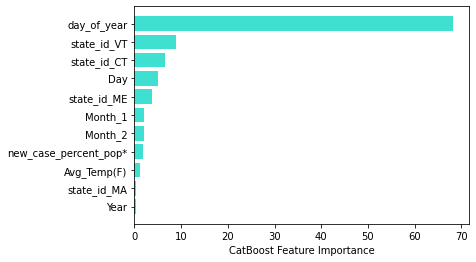

In [90]:
sorted_feature_importance = ohe_all_model.feature_importances_.argsort()
plt.barh(df_cb.columns[sorted_feature_importance], 
        ohe_all_model.feature_importances_[sorted_feature_importance], 
        color='turquoise')
plt.xlabel('CatBoost Feature Importance')

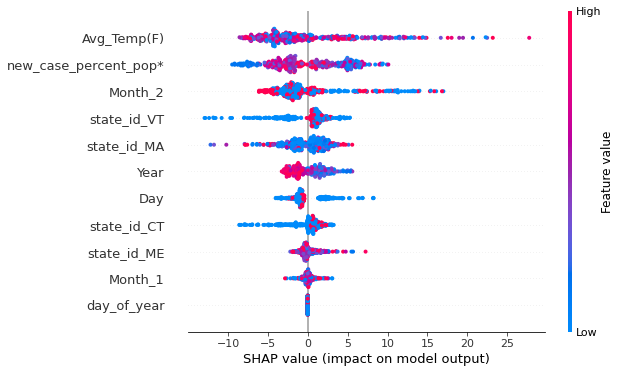

In [91]:
explainer2 = shap.TreeExplainer(model)
shap_values2 = explainer2.shap_values(X_test2)
shap.summary_plot(shap_values2, X_test2, feature_names = df_cb.columns[sorted_feature_importance])

## For catboost use: 'model'

****

#### Voting Regressor

In [98]:
# RandomForestRegressor
rf_reg = RandomForestRegressor(bootstrap = True,
                             max_depth = 70,
                             max_features = 'auto',
                             min_samples_leaf = 2,
                             min_samples_split = 2,
                             n_estimators = 600
)

# ExtraTreesRegressor
et_reg = ExtraTreesRegressor(n_estimators = 1700,
                             min_samples_split = 3,
                             min_samples_leaf = 1,
                             max_features = 'auto',
                             max_depth = 70,
                             bootstrap = True)

# CatBoostRegressor
cb_reg = model

In [101]:
# Create the Voting Classifier with soft voting because all models performed similarly

clf_voting = VotingRegressor(estimators = [('rf_est', rf_reg), ('et_est', et_reg),
                                           ('cb_est', cb_reg)])
#Fit and predict

clf_voting.fit(X_train, y_train)
pred_voting = clf_voting.predict(X_test)

0:	learn: 16.5977189	total: 2.13ms	remaining: 317ms
1:	learn: 15.5401479	total: 3.82ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.88ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.39ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.65ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 196ms
15:	learn: 8.4166826	total: 23ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.1ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.3ms	remaining: 186ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 182ms
19:	learn: 7.6613

In [105]:
print('Unweighted VotingReg R2: ', r2_score(y_test, pred_voting))
print('Unweighted VotingReg MSE: ', mse(y_test, pred_voting))
print('Unweighted VotingReg RMSE: ', np.sqrt(mse(y_test, pred_voting)))

Unweighted VotingReg R2:  0.8603075669713477
Unweighted VotingReg MSE:  39.70605815042015
Unweighted VotingReg RMSE:  6.301274327500759


In [107]:
# Create empty lists that will storage the different weights

weights1 = []
weights2 = []
weights3 = []
scores = []

# Create a for loop to evaluate different combinations of weights

for i in np.arange(0.1,1, 0.1):
    for j in np.arange(0.1,1, 0.1):
        for k in np.arange(0.1,1, 0.1):
            reg_voting = VotingRegressor(estimators = [('rf_est', rf_reg), ('et_est', et_reg),
                                           ('cb_est', cb_reg)], weights = [i, j, k])
            reg_voting.fit(X_train, y_train)
            pred = reg_voting.predict(X_test)
            score = r2_score(y_test, pred)
            scores.append(score)
            weights1.append(i)
            weights2.append(j)
            weights3.append(k)

0:	learn: 16.5977189	total: 2.16ms	remaining: 322ms
1:	learn: 15.5401479	total: 4.18ms	remaining: 310ms
2:	learn: 14.6393251	total: 5.78ms	remaining: 283ms
3:	learn: 13.9156990	total: 7.51ms	remaining: 274ms
4:	learn: 13.1462226	total: 9.09ms	remaining: 264ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 253ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.3ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.5ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.6ms	remaining: 188ms
18:	learn: 7.8060754	total: 26.7ms	remaining: 184ms
19:	learn: 7.6

104:	learn: 3.6624735	total: 178ms	remaining: 76.4ms
105:	learn: 3.6202734	total: 180ms	remaining: 74.7ms
106:	learn: 3.6045684	total: 181ms	remaining: 72.9ms
107:	learn: 3.5793749	total: 184ms	remaining: 71.4ms
108:	learn: 3.5537202	total: 185ms	remaining: 69.6ms
109:	learn: 3.5331498	total: 187ms	remaining: 67.9ms
110:	learn: 3.5143666	total: 190ms	remaining: 66.7ms
111:	learn: 3.4933973	total: 191ms	remaining: 64.9ms
112:	learn: 3.4846046	total: 193ms	remaining: 63.2ms
113:	learn: 3.4758546	total: 194ms	remaining: 61.4ms
114:	learn: 3.4601689	total: 196ms	remaining: 59.5ms
115:	learn: 3.4436716	total: 197ms	remaining: 57.7ms
116:	learn: 3.4256928	total: 199ms	remaining: 56.1ms
117:	learn: 3.4112562	total: 200ms	remaining: 54.3ms
118:	learn: 3.3997363	total: 202ms	remaining: 52.5ms
119:	learn: 3.3880190	total: 205ms	remaining: 51.2ms
120:	learn: 3.3666737	total: 207ms	remaining: 49.6ms
121:	learn: 3.3443332	total: 208ms	remaining: 47.8ms
122:	learn: 3.3364989	total: 210ms	remaining: 

0:	learn: 16.5977189	total: 1.59ms	remaining: 237ms
1:	learn: 15.5401479	total: 3.96ms	remaining: 293ms
2:	learn: 14.6393251	total: 5.73ms	remaining: 281ms
3:	learn: 13.9156990	total: 6.97ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.49ms	remaining: 246ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 242ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 211ms
11:	learn: 9.5686987	total: 18.6ms	remaining: 214ms
12:	learn: 9.2198345	total: 20ms	remaining: 210ms
13:	learn: 8.9211163	total: 21.2ms	remaining: 206ms
14:	learn: 8.6728151	total: 22.4ms	remaining: 202ms
15:	learn: 8.4166826	total: 23.7ms	remaining: 199ms
16:	learn: 8.1847637	total: 25.7ms	remaining: 201ms
17:	learn: 7.9803524	total: 27.2ms	remaining: 199ms
18:	learn: 7.8060754	total: 28.4ms	remaining: 196ms
19:	learn: 7.6

141:	learn: 3.0902039	total: 183ms	remaining: 10.3ms
142:	learn: 3.0778812	total: 184ms	remaining: 9.03ms
143:	learn: 3.0621749	total: 186ms	remaining: 7.74ms
144:	learn: 3.0456528	total: 187ms	remaining: 6.45ms
145:	learn: 3.0357271	total: 188ms	remaining: 5.16ms
146:	learn: 3.0200979	total: 190ms	remaining: 3.87ms
147:	learn: 3.0004690	total: 191ms	remaining: 2.58ms
148:	learn: 2.9943466	total: 192ms	remaining: 1.29ms
149:	learn: 2.9761128	total: 194ms	remaining: 0us
0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.57ms	remaining: 264ms
2:	learn: 14.6393251	total: 5.16ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.69ms	remaining: 244ms
4:	learn: 13.1462226	total: 8.18ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.44ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	le

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.26ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.59ms	remaining: 241ms
4:	learn: 13.1462226	total: 7.88ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.19ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.661

103:	learn: 3.6770392	total: 178ms	remaining: 78.6ms
104:	learn: 3.6624735	total: 180ms	remaining: 77ms
105:	learn: 3.6202734	total: 181ms	remaining: 75.3ms
106:	learn: 3.6045684	total: 183ms	remaining: 73.6ms
107:	learn: 3.5793749	total: 185ms	remaining: 71.8ms
108:	learn: 3.5537202	total: 187ms	remaining: 70.2ms
109:	learn: 3.5331498	total: 188ms	remaining: 68.5ms
110:	learn: 3.5143666	total: 190ms	remaining: 66.7ms
111:	learn: 3.4933973	total: 192ms	remaining: 65.1ms
112:	learn: 3.4846046	total: 193ms	remaining: 63.3ms
113:	learn: 3.4758546	total: 195ms	remaining: 61.6ms
114:	learn: 3.4601689	total: 197ms	remaining: 59.9ms
115:	learn: 3.4436716	total: 199ms	remaining: 58.2ms
116:	learn: 3.4256928	total: 200ms	remaining: 56.5ms
117:	learn: 3.4112562	total: 202ms	remaining: 54.8ms
118:	learn: 3.3997363	total: 204ms	remaining: 53.1ms
119:	learn: 3.3880190	total: 205ms	remaining: 51.4ms
120:	learn: 3.3666737	total: 207ms	remaining: 49.7ms
121:	learn: 3.3443332	total: 209ms	remaining: 48

0:	learn: 16.5977189	total: 1.94ms	remaining: 288ms
1:	learn: 15.5401479	total: 4.03ms	remaining: 298ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.1ms	remaining: 259ms
4:	learn: 13.1462226	total: 9.15ms	remaining: 265ms
5:	learn: 12.4731312	total: 11.8ms	remaining: 284ms
6:	learn: 11.8807203	total: 14.1ms	remaining: 288ms
7:	learn: 11.3232327	total: 16.3ms	remaining: 289ms
8:	learn: 10.8038834	total: 18.5ms	remaining: 290ms
9:	learn: 10.3820829	total: 20.3ms	remaining: 284ms
10:	learn: 9.9240884	total: 22.1ms	remaining: 280ms
11:	learn: 9.5686987	total: 23.8ms	remaining: 273ms
12:	learn: 9.2198345	total: 25.5ms	remaining: 269ms
13:	learn: 8.9211163	total: 28.2ms	remaining: 274ms
14:	learn: 8.6728151	total: 30.2ms	remaining: 272ms
15:	learn: 8.4166826	total: 32.1ms	remaining: 269ms
16:	learn: 8.1847637	total: 33.9ms	remaining: 265ms
17:	learn: 7.9803524	total: 35.4ms	remaining: 260ms
18:	learn: 7.8060754	total: 37.2ms	remaining: 256ms
19:	learn: 7.

129:	learn: 3.2398038	total: 179ms	remaining: 27.6ms
130:	learn: 3.2275359	total: 181ms	remaining: 26.2ms
131:	learn: 3.2132095	total: 183ms	remaining: 24.9ms
132:	learn: 3.2022397	total: 184ms	remaining: 23.6ms
133:	learn: 3.1951302	total: 186ms	remaining: 22.2ms
134:	learn: 3.1813698	total: 187ms	remaining: 20.8ms
135:	learn: 3.1729721	total: 188ms	remaining: 19.4ms
136:	learn: 3.1659146	total: 190ms	remaining: 18ms
137:	learn: 3.1452245	total: 191ms	remaining: 16.6ms
138:	learn: 3.1202685	total: 193ms	remaining: 15.2ms
139:	learn: 3.1089886	total: 194ms	remaining: 13.8ms
140:	learn: 3.0998693	total: 195ms	remaining: 12.5ms
141:	learn: 3.0902039	total: 196ms	remaining: 11.1ms
142:	learn: 3.0778812	total: 198ms	remaining: 9.68ms
143:	learn: 3.0621749	total: 199ms	remaining: 8.3ms
144:	learn: 3.0456528	total: 201ms	remaining: 6.92ms
145:	learn: 3.0357271	total: 202ms	remaining: 5.53ms
146:	learn: 3.0200979	total: 203ms	remaining: 4.15ms
147:	learn: 3.0004690	total: 205ms	remaining: 2.7

0:	learn: 16.5977189	total: 2.04ms	remaining: 304ms
1:	learn: 15.5401479	total: 4.01ms	remaining: 297ms
2:	learn: 14.6393251	total: 5.63ms	remaining: 276ms
3:	learn: 13.9156990	total: 7.17ms	remaining: 262ms
4:	learn: 13.1462226	total: 9.01ms	remaining: 261ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.6ms	remaining: 200ms
14:	learn: 8.6728151	total: 22.1ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.6ms	remaining: 198ms
16:	learn: 8.1847637	total: 25ms	remaining: 195ms
17:	learn: 7.9803524	total: 26.3ms	remaining: 193ms
18:	learn: 7.8060754	total: 27.5ms	remaining: 190ms
19:	learn: 7.661

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 255ms
2:	learn: 14.6393251	total: 5.2ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.73ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.21ms	remaining: 238ms
5:	learn: 12.4731312	total: 9.69ms	remaining: 233ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.06ms	remaining: 248ms
3:	learn: 13.9156990	total: 6.57ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.07ms	remaining: 234ms
5:	learn: 12.4731312	total: 9.57ms	remaining: 230ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 12ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.43ms	remaining: 213ms
1:	learn: 15.5401479	total: 3.23ms	remaining: 239ms
2:	learn: 14.6393251	total: 4.66ms	remaining: 229ms
3:	learn: 13.9156990	total: 6.13ms	remaining: 224ms
4:	learn: 13.1462226	total: 7.49ms	remaining: 217ms
5:	learn: 12.4731312	total: 9.05ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.

147:	learn: 3.0004690	total: 183ms	remaining: 2.47ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.01ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.45ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.63ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8

146:	learn: 3.0200979	total: 182ms	remaining: 3.72ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.53ms	remaining: 228ms
1:	learn: 15.5401479	total: 3.35ms	remaining: 248ms
2:	learn: 14.6393251	total: 4.72ms	remaining: 231ms
3:	learn: 13.9156990	total: 6.03ms	remaining: 220ms
4:	learn: 13.1462226	total: 7.38ms	remaining: 214ms
5:	learn: 12.4731312	total: 8.95ms	remaining: 215ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 203ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 196ms
15:	learn: 

105:	learn: 3.6202734	total: 161ms	remaining: 67ms
106:	learn: 3.6045684	total: 163ms	remaining: 65.6ms
107:	learn: 3.5793749	total: 165ms	remaining: 64.2ms
108:	learn: 3.5537202	total: 166ms	remaining: 62.6ms
109:	learn: 3.5331498	total: 168ms	remaining: 61.1ms
110:	learn: 3.5143666	total: 169ms	remaining: 59.5ms
111:	learn: 3.4933973	total: 171ms	remaining: 58ms
112:	learn: 3.4846046	total: 172ms	remaining: 56.4ms
113:	learn: 3.4758546	total: 174ms	remaining: 54.9ms
114:	learn: 3.4601689	total: 175ms	remaining: 53.4ms
115:	learn: 3.4436716	total: 177ms	remaining: 51.8ms
116:	learn: 3.4256928	total: 178ms	remaining: 50.2ms
117:	learn: 3.4112562	total: 180ms	remaining: 48.7ms
118:	learn: 3.3997363	total: 181ms	remaining: 47.2ms
119:	learn: 3.3880190	total: 182ms	remaining: 45.6ms
120:	learn: 3.3666737	total: 184ms	remaining: 44.1ms
121:	learn: 3.3443332	total: 185ms	remaining: 42.5ms
122:	learn: 3.3364989	total: 187ms	remaining: 41ms
123:	learn: 3.3290080	total: 188ms	remaining: 39.5ms

143:	learn: 3.0621749	total: 186ms	remaining: 7.73ms
144:	learn: 3.0456528	total: 187ms	remaining: 6.45ms
145:	learn: 3.0357271	total: 189ms	remaining: 5.17ms
146:	learn: 3.0200979	total: 190ms	remaining: 3.88ms
147:	learn: 3.0004690	total: 191ms	remaining: 2.59ms
148:	learn: 2.9943466	total: 193ms	remaining: 1.29ms
149:	learn: 2.9761128	total: 194ms	remaining: 0us
0:	learn: 16.5977189	total: 1.46ms	remaining: 217ms
1:	learn: 15.5401479	total: 3.22ms	remaining: 239ms
2:	learn: 14.6393251	total: 4.64ms	remaining: 227ms
3:	learn: 13.9156990	total: 5.94ms	remaining: 217ms
4:	learn: 13.1462226	total: 7.36ms	remaining: 214ms
5:	learn: 12.4731312	total: 9ms	remaining: 216ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.12ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.39ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.91ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.6

146:	learn: 3.0200979	total: 183ms	remaining: 3.73ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.55ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.18ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.8ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 209ms
13:	learn: 8.9211163	total: 21.1ms	remaining: 205ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.75ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.56ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 11.6ms	remaining: 335ms
5:	learn: 12.4731312	total: 13.3ms	remaining: 319ms
6:	learn: 11.8807203	total: 14.7ms	remaining: 300ms
7:	learn: 11.3232327	total: 15.9ms	remaining: 282ms
8:	learn: 10.8038834	total: 17ms	remaining: 266ms
9:	learn: 10.3820829	total: 18.1ms	remaining: 254ms
10:	learn: 9.9240884	total: 19.3ms	remaining: 244ms
11:	learn: 9.5686987	total: 20.5ms	remaining: 236ms
12:	learn: 9.2198345	total: 21.9ms	remaining: 231ms
13:	learn: 8.9211163	total: 23.1ms	remaining: 224ms
14:	learn: 8.6728151	total: 24.3ms	remaining: 218ms
15:	learn: 8.4166826	total: 25.5ms	remaining: 213ms
16:	learn: 8.1847637	total: 26.7ms	remaining: 209ms
17:	learn: 7.9803524	total: 27.8ms	remaining: 204ms
18:	learn: 7.806

0:	learn: 16.5977189	total: 1.92ms	remaining: 287ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 265ms
3:	learn: 13.9156990	total: 7.24ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.67ms	remaining: 251ms
5:	learn: 12.4731312	total: 10ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.47ms	remaining: 257ms
2:	learn: 14.6393251	total: 4.9ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.34ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.78ms	remaining: 226ms
5:	learn: 12.4731312	total: 8.99ms	remaining: 216ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 209ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 194ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 191ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 182ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 2.55ms	remaining: 381ms
1:	learn: 15.5401479	total: 4.51ms	remaining: 334ms
2:	learn: 14.6393251	total: 6.16ms	remaining: 302ms
3:	learn: 13.9156990	total: 7.77ms	remaining: 284ms
4:	learn: 13.1462226	total: 9.53ms	remaining: 276ms
5:	learn: 12.4731312	total: 10.8ms	remaining: 260ms
6:	learn: 11.8807203	total: 12.1ms	remaining: 246ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 214ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.6ms	remaining: 200ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 196ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.1ms	remaining: 188ms
17:	learn: 7.9803524	total: 25.3ms	remaining: 185ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.27ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.87ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.6613855

0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.51ms	remaining: 260ms
2:	learn: 14.6393251	total: 4.95ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.36ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.91ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.24ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.66138

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 2ms	remaining: 297ms
1:	learn: 15.5401479	total: 4.11ms	remaining: 304ms
2:	learn: 14.6393251	total: 5.73ms	remaining: 281ms
3:	learn: 13.9156990	total: 7.55ms	remaining: 275ms
4:	learn: 13.1462226	total: 9.02ms	remaining: 262ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.72ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 6.9ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.19ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.39ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 179ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.806075

0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 3.91ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.36ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.85ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.12ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.47ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.661385

118:	learn: 3.3997363	total: 162ms	remaining: 42.2ms
119:	learn: 3.3880190	total: 163ms	remaining: 40.9ms
120:	learn: 3.3666737	total: 165ms	remaining: 39.5ms
121:	learn: 3.3443332	total: 166ms	remaining: 38.1ms
122:	learn: 3.3364989	total: 167ms	remaining: 36.7ms
123:	learn: 3.3290080	total: 169ms	remaining: 35.4ms
124:	learn: 3.3163949	total: 170ms	remaining: 34ms
125:	learn: 3.3024346	total: 171ms	remaining: 32.6ms
126:	learn: 3.2853873	total: 173ms	remaining: 31.2ms
127:	learn: 3.2612220	total: 174ms	remaining: 29.9ms
128:	learn: 3.2470030	total: 175ms	remaining: 28.5ms
129:	learn: 3.2398038	total: 177ms	remaining: 27.2ms
130:	learn: 3.2275359	total: 178ms	remaining: 25.8ms
131:	learn: 3.2132095	total: 179ms	remaining: 24.4ms
132:	learn: 3.2022397	total: 181ms	remaining: 23.1ms
133:	learn: 3.1951302	total: 182ms	remaining: 21.7ms
134:	learn: 3.1813698	total: 183ms	remaining: 20.4ms
135:	learn: 3.1729721	total: 185ms	remaining: 19ms
136:	learn: 3.1659146	total: 186ms	remaining: 17.6

0:	learn: 16.5977189	total: 1.86ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.18ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.38ms	remaining: 233ms
4:	learn: 13.1462226	total: 7.86ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.33ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.6

146:	learn: 3.0200979	total: 185ms	remaining: 3.77ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.88ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 

0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.41ms	remaining: 265ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 248ms
5:	learn: 12.4731312	total: 9.9ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 7ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.47ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.78ms	remaining: 235ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661385

146:	learn: 3.0200979	total: 184ms	remaining: 3.75ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.06ms	remaining: 248ms
3:	learn: 13.9156990	total: 6.78ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.37ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.86ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 221ms
10:	learn: 9.9240884	total: 17.2ms	remaining: 218ms
11:	learn: 9.5686987	total: 18.6ms	remaining: 214ms
12:	learn: 9.2198345	total: 20ms	remaining: 211ms
13:	learn: 8.9211163	total: 21.4ms	remaining: 208ms
14:	learn: 8.6728151	total: 22.9ms	remaining: 206ms
15:	learn: 8.4

141:	learn: 3.0902039	total: 183ms	remaining: 10.3ms
142:	learn: 3.0778812	total: 184ms	remaining: 9.03ms
143:	learn: 3.0621749	total: 186ms	remaining: 7.74ms
144:	learn: 3.0456528	total: 187ms	remaining: 6.45ms
145:	learn: 3.0357271	total: 188ms	remaining: 5.16ms
146:	learn: 3.0200979	total: 190ms	remaining: 3.87ms
147:	learn: 3.0004690	total: 191ms	remaining: 2.58ms
148:	learn: 2.9943466	total: 192ms	remaining: 1.29ms
149:	learn: 2.9761128	total: 193ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.46ms	remaining: 256ms
2:	learn: 14.6393251	total: 4.87ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.42ms	remaining: 234ms
4:	learn: 13.1462226	total: 7.84ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.26ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	lear

148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.57ms	remaining: 234ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 4.96ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.5ms	remaining: 237ms
4:	learn: 13.1462226	total: 8.2ms	remaining: 238ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13.4ms	remaining: 238ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 230ms
9:	learn: 10.3820829	total: 16ms	remaining: 223ms
10:	learn: 9.9240884	total: 17.2ms	remaining: 218ms
11:	learn: 9.5686987	total: 18.6ms	remaining: 213ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 209ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.4ms	remaining: 196ms
16:	learn: 8.1847637	total: 24.6ms	remaining: 192ms
17:	learn: 7.980352

142:	learn: 3.0778812	total: 184ms	remaining: 9.02ms
143:	learn: 3.0621749	total: 186ms	remaining: 7.75ms
144:	learn: 3.0456528	total: 187ms	remaining: 6.46ms
145:	learn: 3.0357271	total: 189ms	remaining: 5.17ms
146:	learn: 3.0200979	total: 190ms	remaining: 3.88ms
147:	learn: 3.0004690	total: 192ms	remaining: 2.59ms
148:	learn: 2.9943466	total: 193ms	remaining: 1.29ms
149:	learn: 2.9761128	total: 194ms	remaining: 0us
0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.31ms	remaining: 260ms
3:	learn: 13.9156990	total: 7.16ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.81ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 12ms	remaining: 245ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn

0:	learn: 16.5977189	total: 1.55ms	remaining: 231ms
1:	learn: 15.5401479	total: 3.3ms	remaining: 244ms
2:	learn: 14.6393251	total: 4.76ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.29ms	remaining: 230ms
4:	learn: 13.1462226	total: 7.9ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.51ms	remaining: 228ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 213ms
12:	learn: 9.2198345	total: 20ms	remaining: 211ms
13:	learn: 8.9211163	total: 21.5ms	remaining: 209ms
14:	learn: 8.6728151	total: 22.9ms	remaining: 206ms
15:	learn: 8.4166826	total: 24.3ms	remaining: 203ms
16:	learn: 8.1847637	total: 25.6ms	remaining: 200ms
17:	learn: 7.9803524	total: 26.9ms	remaining: 197ms
18:	learn: 7.8060754	total: 28.2ms	remaining: 195ms
19:	learn: 7.6613855

0:	learn: 16.5977189	total: 1.68ms	remaining: 251ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.38ms	remaining: 264ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.64ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 213ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 24ms	remaining: 187ms
17:	learn: 7.9803524	total: 25.1ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 181ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.88ms	remaining: 280ms
1:	learn: 15.5401479	total: 4.02ms	remaining: 298ms
2:	learn: 14.6393251	total: 5.76ms	remaining: 282ms
3:	learn: 13.9156990	total: 7.52ms	remaining: 275ms
4:	learn: 13.1462226	total: 9.27ms	remaining: 269ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 12.1ms	remaining: 248ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 227ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 220ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 195ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.1ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.4ms	remaining: 186ms
18:	learn: 7.8060754	total: 26.6ms	remaining: 183ms
19:	learn: 7

139:	learn: 3.1089886	total: 183ms	remaining: 13.1ms
140:	learn: 3.0998693	total: 185ms	remaining: 11.8ms
141:	learn: 3.0902039	total: 186ms	remaining: 10.5ms
142:	learn: 3.0778812	total: 187ms	remaining: 9.17ms
143:	learn: 3.0621749	total: 189ms	remaining: 7.86ms
144:	learn: 3.0456528	total: 190ms	remaining: 6.54ms
145:	learn: 3.0357271	total: 191ms	remaining: 5.23ms
146:	learn: 3.0200979	total: 192ms	remaining: 3.92ms
147:	learn: 3.0004690	total: 193ms	remaining: 2.61ms
148:	learn: 2.9943466	total: 195ms	remaining: 1.31ms
149:	learn: 2.9761128	total: 196ms	remaining: 0us
0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.84ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.59ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.14ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.95ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	l

0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 268ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.85ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.49ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.94ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.46ms	remaining: 268ms
3:	learn: 13.9156990	total: 6.93ms	remaining: 253ms
4:	learn: 13.1462226	total: 9.34ms	remaining: 271ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 257ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 244ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 24ms	remaining: 188ms
17:	learn: 7.9803524	total: 25.4ms	remaining: 186ms
18:	learn: 7.8060754	total: 26.7ms	remaining: 184ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.87ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.7ms	remaining: 279ms
3:	learn: 13.9156990	total: 7.46ms	remaining: 272ms
4:	learn: 13.1462226	total: 8.78ms	remaining: 255ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 188ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 4.12ms	remaining: 305ms
2:	learn: 14.6393251	total: 5.88ms	remaining: 288ms
3:	learn: 13.9156990	total: 7.43ms	remaining: 271ms
4:	learn: 13.1462226	total: 8.76ms	remaining: 254ms
5:	learn: 12.4731312	total: 9.99ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.9ms	remaining: 187ms
17:	learn: 7.9803524	total: 25.1ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 181ms
19:	learn: 7.66

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.95ms	remaining: 291ms
1:	learn: 15.5401479	total: 4.1ms	remaining: 303ms
2:	learn: 14.6393251	total: 5.92ms	remaining: 290ms
3:	learn: 13.9156990	total: 7.85ms	remaining: 286ms
4:	learn: 13.1462226	total: 9.38ms	remaining: 272ms
5:	learn: 12.4731312	total: 10.9ms	remaining: 262ms
6:	learn: 11.8807203	total: 12.1ms	remaining: 248ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 227ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 213ms
11:	learn: 9.5686987	total: 18ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 195ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24ms	remaining: 188ms
17:	learn: 7.9803524	total: 25.1ms	remaining: 184ms
18:	learn: 7.806075

135:	learn: 3.1729721	total: 182ms	remaining: 18.7ms
136:	learn: 3.1659146	total: 183ms	remaining: 17.4ms
137:	learn: 3.1452245	total: 184ms	remaining: 16ms
138:	learn: 3.1202685	total: 186ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.4ms
140:	learn: 3.0998693	total: 188ms	remaining: 12ms
141:	learn: 3.0902039	total: 190ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 191ms	remaining: 9.34ms
143:	learn: 3.0621749	total: 192ms	remaining: 8.01ms
144:	learn: 3.0456528	total: 194ms	remaining: 6.68ms
145:	learn: 3.0357271	total: 195ms	remaining: 5.35ms
146:	learn: 3.0200979	total: 197ms	remaining: 4.01ms
147:	learn: 3.0004690	total: 198ms	remaining: 2.67ms
148:	learn: 2.9943466	total: 199ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 200ms	remaining: 0us
0:	learn: 16.5977189	total: 1.69ms	remaining: 251ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 261ms
2:	learn: 14.6393251	total: 4.89ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.38ms	remaining: 233ms
4:	l

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 7.01ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.77ms	remaining: 254ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 238ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.6ms	remaining: 228ms
9:	learn: 10.3820829	total: 16ms	remaining: 224ms
10:	learn: 9.9240884	total: 17.3ms	remaining: 219ms
11:	learn: 9.5686987	total: 18.7ms	remaining: 215ms
12:	learn: 9.2198345	total: 20ms	remaining: 211ms
13:	learn: 8.9211163	total: 21.4ms	remaining: 207ms
14:	learn: 8.6728151	total: 22.6ms	remaining: 203ms
15:	learn: 8.4166826	total: 23.8ms	remaining: 199ms
16:	learn: 8.1847637	total: 25ms	remaining: 196ms
17:	learn: 7.9803524	total: 26.2ms	remaining: 192ms
18:	learn: 7.8060754	total: 27.4ms	remaining: 189ms
19:	learn: 7.66138

146:	learn: 3.0200979	total: 183ms	remaining: 3.73ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.92ms	remaining: 285ms
1:	learn: 15.5401479	total: 3.84ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 6.81ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.4ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.57ms	remaining: 230ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.416

0:	learn: 16.5977189	total: 1.49ms	remaining: 222ms
1:	learn: 15.5401479	total: 3.38ms	remaining: 250ms
2:	learn: 14.6393251	total: 4.84ms	remaining: 237ms
3:	learn: 13.9156990	total: 6.21ms	remaining: 227ms
4:	learn: 13.1462226	total: 7.59ms	remaining: 220ms
5:	learn: 12.4731312	total: 8.98ms	remaining: 216ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 209ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 191ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.6

142:	learn: 3.0778812	total: 182ms	remaining: 8.93ms
143:	learn: 3.0621749	total: 184ms	remaining: 7.66ms
144:	learn: 3.0456528	total: 185ms	remaining: 6.39ms
145:	learn: 3.0357271	total: 187ms	remaining: 5.11ms
146:	learn: 3.0200979	total: 188ms	remaining: 3.84ms
147:	learn: 3.0004690	total: 189ms	remaining: 2.56ms
148:	learn: 2.9943466	total: 191ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 192ms	remaining: 0us
0:	learn: 16.5977189	total: 1.48ms	remaining: 221ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 252ms
2:	learn: 14.6393251	total: 4.97ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.51ms	remaining: 238ms
4:	learn: 13.1462226	total: 8.3ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.8ms	remaining: 235ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.6ms	remaining: 229ms
9:	learn: 10.3820829	total: 16.2ms	remaining: 227ms
10:	learn: 9.9240884	total: 17.7ms	remaining: 223ms
11:	learn:

0:	learn: 16.5977189	total: 1.53ms	remaining: 227ms
1:	learn: 15.5401479	total: 3.27ms	remaining: 242ms
2:	learn: 14.6393251	total: 4.83ms	remaining: 237ms
3:	learn: 13.9156990	total: 6.41ms	remaining: 234ms
4:	learn: 13.1462226	total: 7.83ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.07ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.8ms	remaining: 178ms
15:	learn: 8.4166826	total: 21ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.1ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.3ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 170ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.85ms	remaining: 275ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.71ms	remaining: 280ms
3:	learn: 13.9156990	total: 7.35ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.75ms	remaining: 254ms
5:	learn: 12.4731312	total: 9.98ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.43ms	remaining: 254ms
2:	learn: 14.6393251	total: 4.82ms	remaining: 236ms
3:	learn: 13.9156990	total: 6.23ms	remaining: 227ms
4:	learn: 13.1462226	total: 7.76ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.39ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.8ms	remaining: 269ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.43ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.96ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.46ms	remaining: 245ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.980

0:	learn: 16.5977189	total: 1.86ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.75ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.46ms	remaining: 236ms
4:	learn: 13.1462226	total: 8.03ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.37ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.83ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.25ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.53ms	remaining: 229ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.17ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.89ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 182ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.58ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 254ms
2:	learn: 14.6393251	total: 4.89ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.24ms	remaining: 228ms
4:	learn: 13.1462226	total: 7.63ms	remaining: 221ms
5:	learn: 12.4731312	total: 8.91ms	remaining: 214ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 207ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 202ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 194ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 190ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.4ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 180ms
14:	learn: 8.6728151	total: 19.7ms	remaining: 178ms
15:	learn: 8.4166826	total: 20.9ms	remaining: 175ms
16:	learn: 8.1847637	total: 22.1ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.3ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.4ms	remaining: 169ms
19:	learn: 7

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.95ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.42ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.69ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 205ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.6ms	remaining: 198ms
16:	learn: 8.1847637	total: 25.1ms	remaining: 196ms
17:	learn: 7.9803524	total: 26.4ms	remaining: 194ms
18:	learn: 7.8

144:	learn: 3.0456528	total: 183ms	remaining: 6.31ms
145:	learn: 3.0357271	total: 184ms	remaining: 5.05ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.79ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.9ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.39ms	remaining: 264ms
3:	learn: 13.9156990	total: 6.91ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 249ms
5:	learn: 12.4731312	total: 9.93ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8

124:	learn: 3.3163949	total: 180ms	remaining: 35.9ms
125:	learn: 3.3024346	total: 181ms	remaining: 34.5ms
126:	learn: 3.2853873	total: 183ms	remaining: 33.1ms
127:	learn: 3.2612220	total: 184ms	remaining: 31.7ms
128:	learn: 3.2470030	total: 187ms	remaining: 30.4ms
129:	learn: 3.2398038	total: 189ms	remaining: 29ms
130:	learn: 3.2275359	total: 191ms	remaining: 27.6ms
131:	learn: 3.2132095	total: 193ms	remaining: 26.3ms
132:	learn: 3.2022397	total: 194ms	remaining: 24.9ms
133:	learn: 3.1951302	total: 196ms	remaining: 23.4ms
134:	learn: 3.1813698	total: 198ms	remaining: 22ms
135:	learn: 3.1729721	total: 200ms	remaining: 20.6ms
136:	learn: 3.1659146	total: 202ms	remaining: 19.1ms
137:	learn: 3.1452245	total: 203ms	remaining: 17.7ms
138:	learn: 3.1202685	total: 205ms	remaining: 16.2ms
139:	learn: 3.1089886	total: 207ms	remaining: 14.8ms
140:	learn: 3.0998693	total: 209ms	remaining: 13.3ms
141:	learn: 3.0902039	total: 210ms	remaining: 11.8ms
142:	learn: 3.0778812	total: 212ms	remaining: 10.4

0:	learn: 16.5977189	total: 1.57ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.39ms	remaining: 251ms
2:	learn: 14.6393251	total: 5.08ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.5ms	remaining: 237ms
4:	learn: 13.1462226	total: 7.77ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.25ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.45ms	remaining: 216ms
1:	learn: 15.5401479	total: 3.24ms	remaining: 239ms
2:	learn: 14.6393251	total: 4.62ms	remaining: 226ms
3:	learn: 13.9156990	total: 5.88ms	remaining: 215ms
4:	learn: 13.1462226	total: 7.21ms	remaining: 209ms
5:	learn: 12.4731312	total: 9.05ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 221ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.9ms	remaining: 218ms
12:	learn: 9.2198345	total: 20.3ms	remaining: 214ms
13:	learn: 8.9211163	total: 21.7ms	remaining: 211ms
14:	learn: 8.6728151	total: 23.2ms	remaining: 209ms
15:	learn: 8.4166826	total: 25ms	remaining: 209ms
16:	learn: 8.1847637	total: 27ms	remaining: 211ms
17:	learn: 7.9803524	total: 28.5ms	remaining: 209ms
18:	learn: 7.8060754	total: 29.9ms	remaining: 206ms
19:	learn: 7.66138

101:	learn: 3.7234868	total: 164ms	remaining: 77ms
102:	learn: 3.7099754	total: 166ms	remaining: 75.5ms
103:	learn: 3.6770392	total: 167ms	remaining: 74.1ms
104:	learn: 3.6624735	total: 169ms	remaining: 72.5ms
105:	learn: 3.6202734	total: 171ms	remaining: 70.9ms
106:	learn: 3.6045684	total: 172ms	remaining: 69.3ms
107:	learn: 3.5793749	total: 174ms	remaining: 67.6ms
108:	learn: 3.5537202	total: 175ms	remaining: 66ms
109:	learn: 3.5331498	total: 177ms	remaining: 64.3ms
110:	learn: 3.5143666	total: 178ms	remaining: 62.6ms
111:	learn: 3.4933973	total: 180ms	remaining: 61ms
112:	learn: 3.4846046	total: 181ms	remaining: 59.3ms
113:	learn: 3.4758546	total: 182ms	remaining: 57.6ms
114:	learn: 3.4601689	total: 184ms	remaining: 55.9ms
115:	learn: 3.4436716	total: 185ms	remaining: 54.3ms
116:	learn: 3.4256928	total: 187ms	remaining: 52.7ms
117:	learn: 3.4112562	total: 188ms	remaining: 51ms
118:	learn: 3.3997363	total: 189ms	remaining: 49.3ms
119:	learn: 3.3880190	total: 190ms	remaining: 47.6ms
1

0:	learn: 16.5977189	total: 2.05ms	remaining: 305ms
1:	learn: 15.5401479	total: 3.9ms	remaining: 289ms
2:	learn: 14.6393251	total: 5.41ms	remaining: 265ms
3:	learn: 13.9156990	total: 6.74ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.16ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.62ms	remaining: 231ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 190ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 180ms
19:	learn: 7.66

107:	learn: 3.5793749	total: 179ms	remaining: 69.8ms
108:	learn: 3.5537202	total: 181ms	remaining: 68.2ms
109:	learn: 3.5331498	total: 183ms	remaining: 66.5ms
110:	learn: 3.5143666	total: 185ms	remaining: 64.9ms
111:	learn: 3.4933973	total: 187ms	remaining: 63.4ms
112:	learn: 3.4846046	total: 188ms	remaining: 61.7ms
113:	learn: 3.4758546	total: 190ms	remaining: 59.9ms
114:	learn: 3.4601689	total: 191ms	remaining: 58.2ms
115:	learn: 3.4436716	total: 193ms	remaining: 56.5ms
116:	learn: 3.4256928	total: 194ms	remaining: 54.8ms
117:	learn: 3.4112562	total: 196ms	remaining: 53.1ms
118:	learn: 3.3997363	total: 197ms	remaining: 51.4ms
119:	learn: 3.3880190	total: 198ms	remaining: 49.6ms
120:	learn: 3.3666737	total: 200ms	remaining: 47.9ms
121:	learn: 3.3443332	total: 201ms	remaining: 46.2ms
122:	learn: 3.3364989	total: 202ms	remaining: 44.4ms
123:	learn: 3.3290080	total: 204ms	remaining: 42.7ms
124:	learn: 3.3163949	total: 206ms	remaining: 41.1ms
125:	learn: 3.3024346	total: 207ms	remaining: 

135:	learn: 3.1729721	total: 181ms	remaining: 18.6ms
136:	learn: 3.1659146	total: 183ms	remaining: 17.3ms
137:	learn: 3.1452245	total: 184ms	remaining: 16ms
138:	learn: 3.1202685	total: 186ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.4ms
140:	learn: 3.0998693	total: 189ms	remaining: 12ms
141:	learn: 3.0902039	total: 190ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 191ms	remaining: 9.37ms
143:	learn: 3.0621749	total: 193ms	remaining: 8.04ms
144:	learn: 3.0456528	total: 194ms	remaining: 6.7ms
145:	learn: 3.0357271	total: 195ms	remaining: 5.36ms
146:	learn: 3.0200979	total: 197ms	remaining: 4.01ms
147:	learn: 3.0004690	total: 198ms	remaining: 2.67ms
148:	learn: 2.9943466	total: 199ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 201ms	remaining: 0us
0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.98ms	remaining: 294ms
2:	learn: 14.6393251	total: 5.65ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.4ms	remaining: 270ms
4:	lea

0:	learn: 16.5977189	total: 1.67ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 251ms
2:	learn: 14.6393251	total: 4.81ms	remaining: 236ms
3:	learn: 13.9156990	total: 6.19ms	remaining: 226ms
4:	learn: 13.1462226	total: 7.41ms	remaining: 215ms
5:	learn: 12.4731312	total: 8.69ms	remaining: 208ms
6:	learn: 11.8807203	total: 9.9ms	remaining: 202ms
7:	learn: 11.3232327	total: 11.1ms	remaining: 197ms
8:	learn: 10.8038834	total: 12.3ms	remaining: 192ms
9:	learn: 10.3820829	total: 13.5ms	remaining: 188ms
10:	learn: 9.9240884	total: 14.6ms	remaining: 185ms
11:	learn: 9.5686987	total: 15.9ms	remaining: 183ms
12:	learn: 9.2198345	total: 17.1ms	remaining: 180ms
13:	learn: 8.9211163	total: 18.3ms	remaining: 177ms
14:	learn: 8.6728151	total: 19.4ms	remaining: 175ms
15:	learn: 8.4166826	total: 20.7ms	remaining: 173ms
16:	learn: 8.1847637	total: 21.9ms	remaining: 172ms
17:	learn: 7.9803524	total: 23.1ms	remaining: 170ms
18:	learn: 7.8060754	total: 24.3ms	remaining: 168ms
19:	learn: 7.6

143:	learn: 3.0621749	total: 182ms	remaining: 7.59ms
144:	learn: 3.0456528	total: 184ms	remaining: 6.33ms
145:	learn: 3.0357271	total: 185ms	remaining: 5.07ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.8ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.64ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.34ms	remaining: 247ms
2:	learn: 14.6393251	total: 4.86ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.45ms	remaining: 235ms
4:	learn: 13.1462226	total: 7.75ms	remaining: 225ms
5:	learn: 12.4731312	total: 8.99ms	remaining: 216ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 204ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 199ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 194ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 191ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 187ms
12:	learn

0:	learn: 16.5977189	total: 1.69ms	remaining: 251ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.18ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.6ms	remaining: 241ms
4:	learn: 13.1462226	total: 8.23ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.72ms	remaining: 233ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 175ms
19:	learn: 7.

146:	learn: 3.0200979	total: 182ms	remaining: 3.72ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.84ms	remaining: 275ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.49ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.37ms	remaining: 269ms
4:	learn: 13.1462226	total: 8.84ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 258ms
6:	learn: 11.8807203	total: 12.5ms	remaining: 255ms
7:	learn: 11.3232327	total: 13.8ms	remaining: 245ms
8:	learn: 10.8038834	total: 15.1ms	remaining: 236ms
9:	learn: 10.3820829	total: 16.3ms	remaining: 228ms
10:	learn: 9.9240884	total: 17.5ms	remaining: 221ms
11:	learn: 9.5686987	total: 18.8ms	remaining: 216ms
12:	learn: 9.2198345	total: 20.2ms	remaining: 213ms
13:	learn: 8.9211163	total: 21.5ms	remaining: 209ms
14:	learn: 8.6728151	total: 22.9ms	remaining: 206ms
15:	learn: 

119:	learn: 3.3880190	total: 184ms	remaining: 45.9ms
120:	learn: 3.3666737	total: 185ms	remaining: 44.4ms
121:	learn: 3.3443332	total: 187ms	remaining: 42.9ms
122:	learn: 3.3364989	total: 188ms	remaining: 41.2ms
123:	learn: 3.3290080	total: 189ms	remaining: 39.7ms
124:	learn: 3.3163949	total: 190ms	remaining: 38.1ms
125:	learn: 3.3024346	total: 191ms	remaining: 36.5ms
126:	learn: 3.2853873	total: 193ms	remaining: 34.9ms
127:	learn: 3.2612220	total: 194ms	remaining: 33.3ms
128:	learn: 3.2470030	total: 195ms	remaining: 31.7ms
129:	learn: 3.2398038	total: 196ms	remaining: 30.2ms
130:	learn: 3.2275359	total: 198ms	remaining: 28.6ms
131:	learn: 3.2132095	total: 199ms	remaining: 27.2ms
132:	learn: 3.2022397	total: 201ms	remaining: 25.6ms
133:	learn: 3.1951302	total: 202ms	remaining: 24.1ms
134:	learn: 3.1813698	total: 203ms	remaining: 22.6ms
135:	learn: 3.1729721	total: 204ms	remaining: 21ms
136:	learn: 3.1659146	total: 205ms	remaining: 19.5ms
137:	learn: 3.1452245	total: 206ms	remaining: 18

147:	learn: 3.0004690	total: 183ms	remaining: 2.47ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.56ms	remaining: 232ms
1:	learn: 15.5401479	total: 3.2ms	remaining: 237ms
2:	learn: 14.6393251	total: 4.47ms	remaining: 219ms
3:	learn: 13.9156990	total: 5.75ms	remaining: 210ms
4:	learn: 13.1462226	total: 8.07ms	remaining: 234ms
5:	learn: 12.4731312	total: 9.38ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 22.5ms	remaining: 203ms
15:	learn: 8.4166826	total: 23.7ms	remaining: 198ms
16:	learn: 8.18

136:	learn: 3.1659146	total: 181ms	remaining: 17.1ms
137:	learn: 3.1452245	total: 182ms	remaining: 15.8ms
138:	learn: 3.1202685	total: 184ms	remaining: 14.5ms
139:	learn: 3.1089886	total: 185ms	remaining: 13.2ms
140:	learn: 3.0998693	total: 186ms	remaining: 11.9ms
141:	learn: 3.0902039	total: 187ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 189ms	remaining: 9.26ms
143:	learn: 3.0621749	total: 191ms	remaining: 7.94ms
144:	learn: 3.0456528	total: 192ms	remaining: 6.61ms
145:	learn: 3.0357271	total: 193ms	remaining: 5.29ms
146:	learn: 3.0200979	total: 195ms	remaining: 3.97ms
147:	learn: 3.0004690	total: 196ms	remaining: 2.65ms
148:	learn: 2.9943466	total: 198ms	remaining: 1.33ms
149:	learn: 2.9761128	total: 199ms	remaining: 0us
0:	learn: 16.5977189	total: 1.6ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.36ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.71ms	remaining: 245ms
4:	learn: 13.1462226	total: 8ms	remaining: 232ms
5:	le

0:	learn: 16.5977189	total: 1.51ms	remaining: 225ms
1:	learn: 15.5401479	total: 3.26ms	remaining: 241ms
2:	learn: 14.6393251	total: 4.74ms	remaining: 232ms
3:	learn: 13.9156990	total: 6.26ms	remaining: 228ms
4:	learn: 13.1462226	total: 7.73ms	remaining: 224ms
5:	learn: 12.4731312	total: 9.14ms	remaining: 220ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 204ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 199ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 182ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.6

85:	learn: 4.0700948	total: 155ms	remaining: 116ms
86:	learn: 4.0519256	total: 157ms	remaining: 114ms
87:	learn: 4.0291616	total: 159ms	remaining: 112ms
88:	learn: 3.9889855	total: 162ms	remaining: 111ms
89:	learn: 3.9672972	total: 163ms	remaining: 109ms
90:	learn: 3.9446027	total: 165ms	remaining: 107ms
91:	learn: 3.9182805	total: 167ms	remaining: 105ms
92:	learn: 3.8945256	total: 168ms	remaining: 103ms
93:	learn: 3.8796627	total: 170ms	remaining: 101ms
94:	learn: 3.8445336	total: 172ms	remaining: 99.5ms
95:	learn: 3.8241954	total: 174ms	remaining: 97.8ms
96:	learn: 3.8106318	total: 176ms	remaining: 96ms
97:	learn: 3.7996154	total: 177ms	remaining: 94.2ms
98:	learn: 3.7827538	total: 179ms	remaining: 92.4ms
99:	learn: 3.7575878	total: 181ms	remaining: 90.4ms
100:	learn: 3.7430133	total: 182ms	remaining: 88.4ms
101:	learn: 3.7234868	total: 184ms	remaining: 86.5ms
102:	learn: 3.7099754	total: 186ms	remaining: 84.7ms
103:	learn: 3.6770392	total: 187ms	remaining: 82.8ms
104:	learn: 3.66247

146:	learn: 3.0200979	total: 182ms	remaining: 3.72ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.48ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.46ms	remaining: 217ms
1:	learn: 15.5401479	total: 3.56ms	remaining: 263ms
2:	learn: 14.6393251	total: 5.16ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.76ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 256ms
6:	learn: 11.8807203	total: 12.6ms	remaining: 258ms
7:	learn: 11.3232327	total: 15.7ms	remaining: 278ms
8:	learn: 10.8038834	total: 17.1ms	remaining: 268ms
9:	learn: 10.3820829	total: 18.7ms	remaining: 261ms
10:	learn: 9.9240884	total: 20.2ms	remaining: 255ms
11:	learn: 9.5686987	total: 21.8ms	remaining: 250ms
12:	learn: 9.2198345	total: 23.4ms	remaining: 247ms
13:	learn: 8.9211163	total: 25.1ms	remaining: 244ms
14:	learn: 8.6728151	total: 26.6ms	remaining: 239ms
15:	learn: 

142:	learn: 3.0778812	total: 184ms	remaining: 9ms
143:	learn: 3.0621749	total: 185ms	remaining: 7.72ms
144:	learn: 3.0456528	total: 187ms	remaining: 6.45ms
145:	learn: 3.0357271	total: 188ms	remaining: 5.16ms
146:	learn: 3.0200979	total: 189ms	remaining: 3.86ms
147:	learn: 3.0004690	total: 191ms	remaining: 2.58ms
148:	learn: 2.9943466	total: 192ms	remaining: 1.29ms
149:	learn: 2.9761128	total: 193ms	remaining: 0us
0:	learn: 16.5977189	total: 2.24ms	remaining: 333ms
1:	learn: 15.5401479	total: 4.09ms	remaining: 303ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 6.93ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.45ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.68ms	remaining: 232ms
6:	learn: 11.8807203	total: 11ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 211ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5

0:	learn: 16.5977189	total: 1.48ms	remaining: 220ms
1:	learn: 15.5401479	total: 3.41ms	remaining: 252ms
2:	learn: 14.6393251	total: 5.41ms	remaining: 265ms
3:	learn: 13.9156990	total: 6.96ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.82ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 256ms
6:	learn: 11.8807203	total: 12.2ms	remaining: 249ms
7:	learn: 11.3232327	total: 13.9ms	remaining: 246ms
8:	learn: 10.8038834	total: 16ms	remaining: 251ms
9:	learn: 10.3820829	total: 17.7ms	remaining: 247ms
10:	learn: 9.9240884	total: 18.9ms	remaining: 239ms
11:	learn: 9.5686987	total: 20.2ms	remaining: 232ms
12:	learn: 9.2198345	total: 21.5ms	remaining: 226ms
13:	learn: 8.9211163	total: 22.7ms	remaining: 220ms
14:	learn: 8.6728151	total: 24.4ms	remaining: 219ms
15:	learn: 8.4166826	total: 25.9ms	remaining: 217ms
16:	learn: 8.1847637	total: 27.4ms	remaining: 215ms
17:	learn: 7.9803524	total: 29.2ms	remaining: 214ms
18:	learn: 7.8060754	total: 32ms	remaining: 221ms
19:	learn: 7.661

114:	learn: 3.4601689	total: 179ms	remaining: 54.6ms
115:	learn: 3.4436716	total: 181ms	remaining: 53.1ms
116:	learn: 3.4256928	total: 183ms	remaining: 51.7ms
117:	learn: 3.4112562	total: 185ms	remaining: 50.2ms
118:	learn: 3.3997363	total: 187ms	remaining: 48.7ms
119:	learn: 3.3880190	total: 189ms	remaining: 47.1ms
120:	learn: 3.3666737	total: 190ms	remaining: 45.6ms
121:	learn: 3.3443332	total: 192ms	remaining: 44.2ms
122:	learn: 3.3364989	total: 194ms	remaining: 42.7ms
123:	learn: 3.3290080	total: 197ms	remaining: 41.2ms
124:	learn: 3.3163949	total: 199ms	remaining: 39.7ms
125:	learn: 3.3024346	total: 200ms	remaining: 38.1ms
126:	learn: 3.2853873	total: 202ms	remaining: 36.6ms
127:	learn: 3.2612220	total: 204ms	remaining: 35.1ms
128:	learn: 3.2470030	total: 206ms	remaining: 33.5ms
129:	learn: 3.2398038	total: 208ms	remaining: 32ms
130:	learn: 3.2275359	total: 210ms	remaining: 30.4ms
131:	learn: 3.2132095	total: 212ms	remaining: 28.9ms
132:	learn: 3.2022397	total: 213ms	remaining: 27

122:	learn: 3.3364989	total: 178ms	remaining: 39.1ms
123:	learn: 3.3290080	total: 180ms	remaining: 37.7ms
124:	learn: 3.3163949	total: 181ms	remaining: 36.2ms
125:	learn: 3.3024346	total: 183ms	remaining: 34.8ms
126:	learn: 3.2853873	total: 184ms	remaining: 33.3ms
127:	learn: 3.2612220	total: 186ms	remaining: 31.9ms
128:	learn: 3.2470030	total: 188ms	remaining: 30.5ms
129:	learn: 3.2398038	total: 189ms	remaining: 29.1ms
130:	learn: 3.2275359	total: 190ms	remaining: 27.6ms
131:	learn: 3.2132095	total: 192ms	remaining: 26.1ms
132:	learn: 3.2022397	total: 193ms	remaining: 24.6ms
133:	learn: 3.1951302	total: 194ms	remaining: 23.2ms
134:	learn: 3.1813698	total: 196ms	remaining: 21.7ms
135:	learn: 3.1729721	total: 197ms	remaining: 20.3ms
136:	learn: 3.1659146	total: 198ms	remaining: 18.8ms
137:	learn: 3.1452245	total: 200ms	remaining: 17.4ms
138:	learn: 3.1202685	total: 202ms	remaining: 16ms
139:	learn: 3.1089886	total: 203ms	remaining: 14.5ms
140:	learn: 3.0998693	total: 204ms	remaining: 13

137:	learn: 3.1452245	total: 180ms	remaining: 15.7ms
138:	learn: 3.1202685	total: 182ms	remaining: 14.4ms
139:	learn: 3.1089886	total: 184ms	remaining: 13.1ms
140:	learn: 3.0998693	total: 185ms	remaining: 11.8ms
141:	learn: 3.0902039	total: 186ms	remaining: 10.5ms
142:	learn: 3.0778812	total: 188ms	remaining: 9.2ms
143:	learn: 3.0621749	total: 189ms	remaining: 7.88ms
144:	learn: 3.0456528	total: 190ms	remaining: 6.57ms
145:	learn: 3.0357271	total: 192ms	remaining: 5.25ms
146:	learn: 3.0200979	total: 193ms	remaining: 3.94ms
147:	learn: 3.0004690	total: 194ms	remaining: 2.63ms
148:	learn: 2.9943466	total: 196ms	remaining: 1.31ms
149:	learn: 2.9761128	total: 197ms	remaining: 0us
0:	learn: 16.5977189	total: 1.84ms	remaining: 275ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.24ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.67ms	remaining: 243ms
4:	learn: 13.1462226	total: 8.55ms	remaining: 248ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	

0:	learn: 16.5977189	total: 1.58ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 261ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.46ms	remaining: 272ms
4:	learn: 13.1462226	total: 8.96ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 251ms
6:	learn: 11.8807203	total: 12.6ms	remaining: 257ms
7:	learn: 11.3232327	total: 14.7ms	remaining: 261ms
8:	learn: 10.8038834	total: 16.7ms	remaining: 262ms
9:	learn: 10.3820829	total: 18.8ms	remaining: 264ms
10:	learn: 9.9240884	total: 20.7ms	remaining: 261ms
11:	learn: 9.5686987	total: 22.6ms	remaining: 260ms
12:	learn: 9.2198345	total: 24.6ms	remaining: 259ms
13:	learn: 8.9211163	total: 26.3ms	remaining: 255ms
14:	learn: 8.6728151	total: 28.1ms	remaining: 253ms
15:	learn: 8.4166826	total: 29.8ms	remaining: 249ms
16:	learn: 8.1847637	total: 31.8ms	remaining: 248ms
17:	learn: 7.9803524	total: 33.4ms	remaining: 245ms
18:	learn: 7.8060754	total: 35.5ms	remaining: 245ms
19:	learn: 7

129:	learn: 3.2398038	total: 180ms	remaining: 27.8ms
130:	learn: 3.2275359	total: 182ms	remaining: 26.4ms
131:	learn: 3.2132095	total: 184ms	remaining: 25.1ms
132:	learn: 3.2022397	total: 185ms	remaining: 23.7ms
133:	learn: 3.1951302	total: 186ms	remaining: 22.3ms
134:	learn: 3.1813698	total: 188ms	remaining: 20.9ms
135:	learn: 3.1729721	total: 189ms	remaining: 19.5ms
136:	learn: 3.1659146	total: 191ms	remaining: 18.1ms
137:	learn: 3.1452245	total: 192ms	remaining: 16.7ms
138:	learn: 3.1202685	total: 193ms	remaining: 15.3ms
139:	learn: 3.1089886	total: 195ms	remaining: 13.9ms
140:	learn: 3.0998693	total: 196ms	remaining: 12.5ms
141:	learn: 3.0902039	total: 197ms	remaining: 11.1ms
142:	learn: 3.0778812	total: 199ms	remaining: 9.73ms
143:	learn: 3.0621749	total: 200ms	remaining: 8.34ms
144:	learn: 3.0456528	total: 201ms	remaining: 6.94ms
145:	learn: 3.0357271	total: 203ms	remaining: 5.55ms
146:	learn: 3.0200979	total: 204ms	remaining: 4.16ms
147:	learn: 3.0004690	total: 206ms	remaining: 

0:	learn: 16.5977189	total: 1.39ms	remaining: 206ms
1:	learn: 15.5401479	total: 3.09ms	remaining: 229ms
2:	learn: 14.6393251	total: 4.49ms	remaining: 220ms
3:	learn: 13.9156990	total: 6.31ms	remaining: 230ms
4:	learn: 13.1462226	total: 8.03ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.79ms	remaining: 235ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 240ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 235ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 230ms
9:	learn: 10.3820829	total: 16ms	remaining: 225ms
10:	learn: 9.9240884	total: 17.4ms	remaining: 220ms
11:	learn: 9.5686987	total: 18.7ms	remaining: 215ms
12:	learn: 9.2198345	total: 20.4ms	remaining: 215ms
13:	learn: 8.9211163	total: 22.1ms	remaining: 214ms
14:	learn: 8.6728151	total: 23.8ms	remaining: 215ms
15:	learn: 8.4166826	total: 25.7ms	remaining: 215ms
16:	learn: 8.1847637	total: 27.3ms	remaining: 214ms
17:	learn: 7.9803524	total: 28.8ms	remaining: 211ms
18:	learn: 7.8060754	total: 30.2ms	remaining: 208ms
19:	learn: 7.6

144:	learn: 3.0456528	total: 181ms	remaining: 6.25ms
145:	learn: 3.0357271	total: 183ms	remaining: 5.02ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.77ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.72ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.46ms	remaining: 256ms
2:	learn: 14.6393251	total: 5.28ms	remaining: 259ms
3:	learn: 13.9156990	total: 6.86ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.64ms	remaining: 251ms
5:	learn: 12.4731312	total: 11.2ms	remaining: 269ms
6:	learn: 11.8807203	total: 13.3ms	remaining: 271ms
7:	learn: 11.3232327	total: 15.3ms	remaining: 272ms
8:	learn: 10.8038834	total: 16.8ms	remaining: 264ms
9:	learn: 10.3820829	total: 18.9ms	remaining: 265ms
10:	learn: 9.9240884	total: 20.5ms	remaining: 259ms
11:	learn: 9.5686987	total: 22.1ms	remaining: 254ms
12:	learn: 9.2198345	total: 23.7ms	remaining: 250ms
13:	learn

115:	learn: 3.4436716	total: 179ms	remaining: 52.5ms
116:	learn: 3.4256928	total: 181ms	remaining: 51.2ms
117:	learn: 3.4112562	total: 183ms	remaining: 49.6ms
118:	learn: 3.3997363	total: 185ms	remaining: 48.1ms
119:	learn: 3.3880190	total: 187ms	remaining: 46.8ms
120:	learn: 3.3666737	total: 189ms	remaining: 45.2ms
121:	learn: 3.3443332	total: 190ms	remaining: 43.7ms
122:	learn: 3.3364989	total: 192ms	remaining: 42.1ms
123:	learn: 3.3290080	total: 195ms	remaining: 40.9ms
124:	learn: 3.3163949	total: 196ms	remaining: 39.3ms
125:	learn: 3.3024346	total: 198ms	remaining: 37.7ms
126:	learn: 3.2853873	total: 200ms	remaining: 36.2ms
127:	learn: 3.2612220	total: 202ms	remaining: 34.7ms
128:	learn: 3.2470030	total: 203ms	remaining: 33.1ms
129:	learn: 3.2398038	total: 205ms	remaining: 31.6ms
130:	learn: 3.2275359	total: 207ms	remaining: 30.1ms
131:	learn: 3.2132095	total: 209ms	remaining: 28.5ms
132:	learn: 3.2022397	total: 210ms	remaining: 26.9ms
133:	learn: 3.1951302	total: 212ms	remaining: 

133:	learn: 3.1951302	total: 181ms	remaining: 21.6ms
134:	learn: 3.1813698	total: 183ms	remaining: 20.4ms
135:	learn: 3.1729721	total: 185ms	remaining: 19ms
136:	learn: 3.1659146	total: 186ms	remaining: 17.7ms
137:	learn: 3.1452245	total: 188ms	remaining: 16.4ms
138:	learn: 3.1202685	total: 190ms	remaining: 15ms
139:	learn: 3.1089886	total: 191ms	remaining: 13.7ms
140:	learn: 3.0998693	total: 194ms	remaining: 12.4ms
141:	learn: 3.0902039	total: 195ms	remaining: 11ms
142:	learn: 3.0778812	total: 197ms	remaining: 9.64ms
143:	learn: 3.0621749	total: 199ms	remaining: 8.28ms
144:	learn: 3.0456528	total: 200ms	remaining: 6.91ms
145:	learn: 3.0357271	total: 202ms	remaining: 5.54ms
146:	learn: 3.0200979	total: 205ms	remaining: 4.17ms
147:	learn: 3.0004690	total: 206ms	remaining: 2.78ms
148:	learn: 2.9943466	total: 208ms	remaining: 1.39ms
149:	learn: 2.9761128	total: 210ms	remaining: 0us
0:	learn: 16.5977189	total: 1.69ms	remaining: 252ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	l

0:	learn: 16.5977189	total: 1.63ms	remaining: 243ms
1:	learn: 15.5401479	total: 3.31ms	remaining: 245ms
2:	learn: 14.6393251	total: 4.67ms	remaining: 229ms
3:	learn: 13.9156990	total: 6.11ms	remaining: 223ms
4:	learn: 13.1462226	total: 7.5ms	remaining: 218ms
5:	learn: 12.4731312	total: 9.04ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 221ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 182ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 181ms
19:	learn: 7.

136:	learn: 3.1659146	total: 183ms	remaining: 17.3ms
137:	learn: 3.1452245	total: 184ms	remaining: 16ms
138:	learn: 3.1202685	total: 186ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 188ms	remaining: 13.4ms
140:	learn: 3.0998693	total: 189ms	remaining: 12.1ms
141:	learn: 3.0902039	total: 190ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 192ms	remaining: 9.38ms
143:	learn: 3.0621749	total: 193ms	remaining: 8.04ms
144:	learn: 3.0456528	total: 194ms	remaining: 6.7ms
145:	learn: 3.0357271	total: 195ms	remaining: 5.35ms
146:	learn: 3.0200979	total: 197ms	remaining: 4.01ms
147:	learn: 3.0004690	total: 198ms	remaining: 2.67ms
148:	learn: 2.9943466	total: 199ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 200ms	remaining: 0us
0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.48ms	remaining: 269ms
3:	learn: 13.9156990	total: 6.98ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.4ms	remaining: 244ms
5:	le

0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 268ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.72ms	remaining: 245ms
4:	learn: 13.1462226	total: 8.03ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.28ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.6

101:	learn: 3.7234868	total: 178ms	remaining: 84ms
102:	learn: 3.7099754	total: 181ms	remaining: 82.4ms
103:	learn: 3.6770392	total: 182ms	remaining: 80.5ms
104:	learn: 3.6624735	total: 184ms	remaining: 78.7ms
105:	learn: 3.6202734	total: 185ms	remaining: 76.9ms
106:	learn: 3.6045684	total: 187ms	remaining: 75.1ms
107:	learn: 3.5793749	total: 189ms	remaining: 73.4ms
108:	learn: 3.5537202	total: 190ms	remaining: 71.7ms
109:	learn: 3.5331498	total: 192ms	remaining: 69.9ms
110:	learn: 3.5143666	total: 194ms	remaining: 68.1ms
111:	learn: 3.4933973	total: 196ms	remaining: 66.4ms
112:	learn: 3.4846046	total: 197ms	remaining: 64.6ms
113:	learn: 3.4758546	total: 199ms	remaining: 62.8ms
114:	learn: 3.4601689	total: 200ms	remaining: 61ms
115:	learn: 3.4436716	total: 202ms	remaining: 59.3ms
116:	learn: 3.4256928	total: 204ms	remaining: 57.5ms
117:	learn: 3.4112562	total: 206ms	remaining: 55.8ms
118:	learn: 3.3997363	total: 207ms	remaining: 54ms
119:	learn: 3.3880190	total: 209ms	remaining: 52.2ms

121:	learn: 3.3443332	total: 181ms	remaining: 41.4ms
122:	learn: 3.3364989	total: 182ms	remaining: 40ms
123:	learn: 3.3290080	total: 184ms	remaining: 38.5ms
124:	learn: 3.3163949	total: 186ms	remaining: 37.2ms
125:	learn: 3.3024346	total: 188ms	remaining: 35.8ms
126:	learn: 3.2853873	total: 190ms	remaining: 34.4ms
127:	learn: 3.2612220	total: 191ms	remaining: 32.9ms
128:	learn: 3.2470030	total: 193ms	remaining: 31.4ms
129:	learn: 3.2398038	total: 194ms	remaining: 29.9ms
130:	learn: 3.2275359	total: 196ms	remaining: 28.4ms
131:	learn: 3.2132095	total: 197ms	remaining: 26.8ms
132:	learn: 3.2022397	total: 198ms	remaining: 25.3ms
133:	learn: 3.1951302	total: 200ms	remaining: 23.8ms
134:	learn: 3.1813698	total: 201ms	remaining: 22.4ms
135:	learn: 3.1729721	total: 203ms	remaining: 20.9ms
136:	learn: 3.1659146	total: 204ms	remaining: 19.4ms
137:	learn: 3.1452245	total: 206ms	remaining: 17.9ms
138:	learn: 3.1202685	total: 207ms	remaining: 16.4ms
139:	learn: 3.1089886	total: 209ms	remaining: 14

0:	learn: 16.5977189	total: 1.49ms	remaining: 222ms
1:	learn: 15.5401479	total: 3.19ms	remaining: 236ms
2:	learn: 14.6393251	total: 4.66ms	remaining: 229ms
3:	learn: 13.9156990	total: 6.44ms	remaining: 235ms
4:	learn: 13.1462226	total: 7.95ms	remaining: 230ms
5:	learn: 12.4731312	total: 9.65ms	remaining: 232ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7

144:	learn: 3.0456528	total: 184ms	remaining: 6.35ms
145:	learn: 3.0357271	total: 186ms	remaining: 5.09ms
146:	learn: 3.0200979	total: 187ms	remaining: 3.81ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.54ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.44ms	remaining: 214ms
1:	learn: 15.5401479	total: 3.21ms	remaining: 238ms
2:	learn: 14.6393251	total: 4.68ms	remaining: 229ms
3:	learn: 13.9156990	total: 6.48ms	remaining: 237ms
4:	learn: 13.1462226	total: 7.89ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.24ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 207ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn

101:	learn: 3.7234868	total: 176ms	remaining: 83ms
102:	learn: 3.7099754	total: 179ms	remaining: 81.6ms
103:	learn: 3.6770392	total: 181ms	remaining: 80.1ms
104:	learn: 3.6624735	total: 183ms	remaining: 78.3ms
105:	learn: 3.6202734	total: 184ms	remaining: 76.4ms
106:	learn: 3.6045684	total: 185ms	remaining: 74.4ms
107:	learn: 3.5793749	total: 187ms	remaining: 72.8ms
108:	learn: 3.5537202	total: 189ms	remaining: 71.3ms
109:	learn: 3.5331498	total: 192ms	remaining: 69.7ms
110:	learn: 3.5143666	total: 194ms	remaining: 68ms
111:	learn: 3.4933973	total: 195ms	remaining: 66.3ms
112:	learn: 3.4846046	total: 197ms	remaining: 64.6ms
113:	learn: 3.4758546	total: 199ms	remaining: 62.8ms
114:	learn: 3.4601689	total: 200ms	remaining: 61ms
115:	learn: 3.4436716	total: 202ms	remaining: 59.2ms
116:	learn: 3.4256928	total: 204ms	remaining: 57.5ms
117:	learn: 3.4112562	total: 206ms	remaining: 55.9ms
118:	learn: 3.3997363	total: 208ms	remaining: 54.3ms
119:	learn: 3.3880190	total: 210ms	remaining: 52.6ms

136:	learn: 3.1659146	total: 182ms	remaining: 17.2ms
137:	learn: 3.1452245	total: 183ms	remaining: 16ms
138:	learn: 3.1202685	total: 185ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.4ms
140:	learn: 3.0998693	total: 189ms	remaining: 12.1ms
141:	learn: 3.0902039	total: 191ms	remaining: 10.8ms
142:	learn: 3.0778812	total: 193ms	remaining: 9.43ms
143:	learn: 3.0621749	total: 195ms	remaining: 8.11ms
144:	learn: 3.0456528	total: 197ms	remaining: 6.78ms
145:	learn: 3.0357271	total: 198ms	remaining: 5.44ms
146:	learn: 3.0200979	total: 200ms	remaining: 4.09ms
147:	learn: 3.0004690	total: 202ms	remaining: 2.73ms
148:	learn: 2.9943466	total: 204ms	remaining: 1.37ms
149:	learn: 2.9761128	total: 205ms	remaining: 0us
0:	learn: 16.5977189	total: 1.55ms	remaining: 232ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.15ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.62ms	remaining: 242ms
4:	learn: 13.1462226	total: 8.07ms	remaining: 234ms
5:	

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.94ms	remaining: 242ms
3:	learn: 13.9156990	total: 6.36ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.59ms	remaining: 220ms
5:	learn: 12.4731312	total: 9.07ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 212ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.7ms	remaining: 254ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 5.22ms	remaining: 256ms
3:	learn: 13.9156990	total: 6.81ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.76ms	remaining: 254ms
5:	learn: 12.4731312	total: 11.2ms	remaining: 270ms
6:	learn: 11.8807203	total: 12.9ms	remaining: 263ms
7:	learn: 11.3232327	total: 14.4ms	remaining: 256ms
8:	learn: 10.8038834	total: 16ms	remaining: 251ms
9:	learn: 10.3820829	total: 17.7ms	remaining: 248ms
10:	learn: 9.9240884	total: 19.3ms	remaining: 244ms
11:	learn: 9.5686987	total: 21ms	remaining: 242ms
12:	learn: 9.2198345	total: 22.4ms	remaining: 236ms
13:	learn: 8.9211163	total: 24.3ms	remaining: 236ms
14:	learn: 8.6728151	total: 26ms	remaining: 234ms
15:	learn: 8.4166826	total: 27.4ms	remaining: 229ms
16:	learn: 8.1847637	total: 28.8ms	remaining: 225ms
17:	learn: 7.9803524	total: 30.3ms	remaining: 222ms
18:	learn: 7.8060754	total: 31.8ms	remaining: 219ms
19:	learn: 7.661385

133:	learn: 3.1951302	total: 181ms	remaining: 21.7ms
134:	learn: 3.1813698	total: 183ms	remaining: 20.3ms
135:	learn: 3.1729721	total: 185ms	remaining: 19ms
136:	learn: 3.1659146	total: 186ms	remaining: 17.7ms
137:	learn: 3.1452245	total: 187ms	remaining: 16.3ms
138:	learn: 3.1202685	total: 188ms	remaining: 14.9ms
139:	learn: 3.1089886	total: 190ms	remaining: 13.5ms
140:	learn: 3.0998693	total: 191ms	remaining: 12.2ms
141:	learn: 3.0902039	total: 193ms	remaining: 10.8ms
142:	learn: 3.0778812	total: 194ms	remaining: 9.49ms
143:	learn: 3.0621749	total: 195ms	remaining: 8.13ms
144:	learn: 3.0456528	total: 197ms	remaining: 6.79ms
145:	learn: 3.0357271	total: 199ms	remaining: 5.45ms
146:	learn: 3.0200979	total: 200ms	remaining: 4.09ms
147:	learn: 3.0004690	total: 202ms	remaining: 2.72ms
148:	learn: 2.9943466	total: 203ms	remaining: 1.36ms
149:	learn: 2.9761128	total: 204ms	remaining: 0us
0:	learn: 16.5977189	total: 1.49ms	remaining: 222ms
1:	learn: 15.5401479	total: 3.46ms	remaining: 256ms


0:	learn: 16.5977189	total: 1.62ms	remaining: 242ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 255ms
2:	learn: 14.6393251	total: 5.39ms	remaining: 264ms
3:	learn: 13.9156990	total: 7.26ms	remaining: 265ms
4:	learn: 13.1462226	total: 9.44ms	remaining: 274ms
5:	learn: 12.4731312	total: 11.3ms	remaining: 270ms
6:	learn: 11.8807203	total: 12.8ms	remaining: 262ms
7:	learn: 11.3232327	total: 14.4ms	remaining: 256ms
8:	learn: 10.8038834	total: 15.9ms	remaining: 250ms
9:	learn: 10.3820829	total: 17.3ms	remaining: 242ms
10:	learn: 9.9240884	total: 19.3ms	remaining: 243ms
11:	learn: 9.5686987	total: 21.3ms	remaining: 245ms
12:	learn: 9.2198345	total: 23ms	remaining: 243ms
13:	learn: 8.9211163	total: 24.9ms	remaining: 242ms
14:	learn: 8.6728151	total: 26.4ms	remaining: 238ms
15:	learn: 8.4166826	total: 27.8ms	remaining: 232ms
16:	learn: 8.1847637	total: 29.6ms	remaining: 232ms
17:	learn: 7.9803524	total: 31ms	remaining: 228ms
18:	learn: 7.8060754	total: 32.6ms	remaining: 225ms
19:	learn: 7.661

120:	learn: 3.3666737	total: 180ms	remaining: 43.2ms
121:	learn: 3.3443332	total: 182ms	remaining: 41.8ms
122:	learn: 3.3364989	total: 184ms	remaining: 40.3ms
123:	learn: 3.3290080	total: 186ms	remaining: 39.1ms
124:	learn: 3.3163949	total: 188ms	remaining: 37.6ms
125:	learn: 3.3024346	total: 190ms	remaining: 36.3ms
126:	learn: 3.2853873	total: 192ms	remaining: 34.8ms
127:	learn: 3.2612220	total: 194ms	remaining: 33.4ms
128:	learn: 3.2470030	total: 196ms	remaining: 31.9ms
129:	learn: 3.2398038	total: 198ms	remaining: 30.4ms
130:	learn: 3.2275359	total: 200ms	remaining: 29ms
131:	learn: 3.2132095	total: 202ms	remaining: 27.5ms
132:	learn: 3.2022397	total: 203ms	remaining: 26ms
133:	learn: 3.1951302	total: 205ms	remaining: 24.5ms
134:	learn: 3.1813698	total: 207ms	remaining: 23ms
135:	learn: 3.1729721	total: 208ms	remaining: 21.4ms
136:	learn: 3.1659146	total: 210ms	remaining: 19.9ms
137:	learn: 3.1452245	total: 211ms	remaining: 18.4ms
138:	learn: 3.1202685	total: 213ms	remaining: 16.8ms

147:	learn: 3.0004690	total: 183ms	remaining: 2.48ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 269ms
1:	learn: 15.5401479	total: 4.04ms	remaining: 299ms
2:	learn: 14.6393251	total: 5.61ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.45ms	remaining: 272ms
4:	learn: 13.1462226	total: 9.01ms	remaining: 261ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 250ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 242ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 211ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 195ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 191ms
16:	learn: 8.1

114:	learn: 3.4601689	total: 162ms	remaining: 49.4ms
115:	learn: 3.4436716	total: 165ms	remaining: 48.2ms
116:	learn: 3.4256928	total: 166ms	remaining: 46.8ms
117:	learn: 3.4112562	total: 167ms	remaining: 45.4ms
118:	learn: 3.3997363	total: 169ms	remaining: 44ms
119:	learn: 3.3880190	total: 170ms	remaining: 42.5ms
120:	learn: 3.3666737	total: 171ms	remaining: 41ms
121:	learn: 3.3443332	total: 173ms	remaining: 39.6ms
122:	learn: 3.3364989	total: 174ms	remaining: 38.3ms
123:	learn: 3.3290080	total: 176ms	remaining: 36.9ms
124:	learn: 3.3163949	total: 177ms	remaining: 35.4ms
125:	learn: 3.3024346	total: 179ms	remaining: 34ms
126:	learn: 3.2853873	total: 181ms	remaining: 32.7ms
127:	learn: 3.2612220	total: 182ms	remaining: 31.4ms
128:	learn: 3.2470030	total: 184ms	remaining: 29.9ms
129:	learn: 3.2398038	total: 185ms	remaining: 28.5ms
130:	learn: 3.2275359	total: 186ms	remaining: 27ms
131:	learn: 3.2132095	total: 188ms	remaining: 25.6ms
132:	learn: 3.2022397	total: 189ms	remaining: 24.1ms
1

128:	learn: 3.2470030	total: 181ms	remaining: 29.5ms
129:	learn: 3.2398038	total: 183ms	remaining: 28.1ms
130:	learn: 3.2275359	total: 184ms	remaining: 26.7ms
131:	learn: 3.2132095	total: 186ms	remaining: 25.4ms
132:	learn: 3.2022397	total: 188ms	remaining: 24ms
133:	learn: 3.1951302	total: 189ms	remaining: 22.6ms
134:	learn: 3.1813698	total: 191ms	remaining: 21.2ms
135:	learn: 3.1729721	total: 192ms	remaining: 19.8ms
136:	learn: 3.1659146	total: 194ms	remaining: 18.4ms
137:	learn: 3.1452245	total: 195ms	remaining: 17ms
138:	learn: 3.1202685	total: 196ms	remaining: 15.5ms
139:	learn: 3.1089886	total: 198ms	remaining: 14.1ms
140:	learn: 3.0998693	total: 199ms	remaining: 12.7ms
141:	learn: 3.0902039	total: 201ms	remaining: 11.3ms
142:	learn: 3.0778812	total: 203ms	remaining: 9.93ms
143:	learn: 3.0621749	total: 204ms	remaining: 8.51ms
144:	learn: 3.0456528	total: 206ms	remaining: 7.09ms
145:	learn: 3.0357271	total: 207ms	remaining: 5.67ms
146:	learn: 3.0200979	total: 209ms	remaining: 4.26

0:	learn: 16.5977189	total: 1.72ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.81ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.29ms	remaining: 240ms
5:	learn: 12.4731312	total: 11.3ms	remaining: 272ms
6:	learn: 11.8807203	total: 12.9ms	remaining: 264ms
7:	learn: 11.3232327	total: 14.3ms	remaining: 253ms
8:	learn: 10.8038834	total: 15.5ms	remaining: 243ms
9:	learn: 10.3820829	total: 16.7ms	remaining: 234ms
10:	learn: 9.9240884	total: 17.9ms	remaining: 227ms
11:	learn: 9.5686987	total: 19.2ms	remaining: 221ms
12:	learn: 9.2198345	total: 20.4ms	remaining: 215ms
13:	learn: 8.9211163	total: 21.5ms	remaining: 209ms
14:	learn: 8.6728151	total: 22.8ms	remaining: 205ms
15:	learn: 8.4166826	total: 24.1ms	remaining: 201ms
16:	learn: 8.1847637	total: 25.3ms	remaining: 198ms
17:	learn: 7.9803524	total: 26.6ms	remaining: 195ms
18:	learn: 7.8060754	total: 27.9ms	remaining: 192ms
19:	learn: 7.

104:	learn: 3.6624735	total: 178ms	remaining: 76.4ms
105:	learn: 3.6202734	total: 181ms	remaining: 75ms
106:	learn: 3.6045684	total: 183ms	remaining: 73.6ms
107:	learn: 3.5793749	total: 185ms	remaining: 71.9ms
108:	learn: 3.5537202	total: 187ms	remaining: 70.3ms
109:	learn: 3.5331498	total: 189ms	remaining: 68.6ms
110:	learn: 3.5143666	total: 190ms	remaining: 66.8ms
111:	learn: 3.4933973	total: 191ms	remaining: 65ms
112:	learn: 3.4846046	total: 193ms	remaining: 63.3ms
113:	learn: 3.4758546	total: 195ms	remaining: 61.6ms
114:	learn: 3.4601689	total: 197ms	remaining: 59.9ms
115:	learn: 3.4436716	total: 198ms	remaining: 58.1ms
116:	learn: 3.4256928	total: 201ms	remaining: 56.6ms
117:	learn: 3.4112562	total: 203ms	remaining: 54.9ms
118:	learn: 3.3997363	total: 205ms	remaining: 53.3ms
119:	learn: 3.3880190	total: 207ms	remaining: 51.7ms
120:	learn: 3.3666737	total: 209ms	remaining: 50ms
121:	learn: 3.3443332	total: 211ms	remaining: 48.4ms
122:	learn: 3.3364989	total: 213ms	remaining: 46.7ms

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.39ms	remaining: 251ms
2:	learn: 14.6393251	total: 5.02ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.3ms	remaining: 230ms
4:	learn: 13.1462226	total: 7.61ms	remaining: 221ms
5:	learn: 12.4731312	total: 8.88ms	remaining: 213ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 206ms
7:	learn: 11.3232327	total: 11.3ms	remaining: 200ms
8:	learn: 10.8038834	total: 12.5ms	remaining: 196ms
9:	learn: 10.3820829	total: 13.7ms	remaining: 192ms
10:	learn: 9.9240884	total: 14.9ms	remaining: 189ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 186ms
12:	learn: 9.2198345	total: 17.4ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.7ms	remaining: 171ms
19:	learn: 7.

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.51ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.02ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.47ms	remaining: 236ms
4:	learn: 13.1462226	total: 7.6ms	remaining: 221ms
5:	learn: 12.4731312	total: 8.85ms	remaining: 212ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 12ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 195ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.9ms	remaining: 190ms
18:	learn: 7.806075

129:	learn: 3.2398038	total: 180ms	remaining: 27.7ms
130:	learn: 3.2275359	total: 182ms	remaining: 26.4ms
131:	learn: 3.2132095	total: 183ms	remaining: 25ms
132:	learn: 3.2022397	total: 184ms	remaining: 23.6ms
133:	learn: 3.1951302	total: 186ms	remaining: 22.2ms
134:	learn: 3.1813698	total: 187ms	remaining: 20.8ms
135:	learn: 3.1729721	total: 189ms	remaining: 19.4ms
136:	learn: 3.1659146	total: 190ms	remaining: 18ms
137:	learn: 3.1452245	total: 191ms	remaining: 16.6ms
138:	learn: 3.1202685	total: 192ms	remaining: 15.2ms
139:	learn: 3.1089886	total: 194ms	remaining: 13.8ms
140:	learn: 3.0998693	total: 195ms	remaining: 12.5ms
141:	learn: 3.0902039	total: 197ms	remaining: 11.1ms
142:	learn: 3.0778812	total: 198ms	remaining: 9.68ms
143:	learn: 3.0621749	total: 199ms	remaining: 8.29ms
144:	learn: 3.0456528	total: 200ms	remaining: 6.91ms
145:	learn: 3.0357271	total: 202ms	remaining: 5.53ms
146:	learn: 3.0200979	total: 203ms	remaining: 4.15ms
147:	learn: 3.0004690	total: 204ms	remaining: 2.76

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.88ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.43ms	remaining: 244ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 182ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.6613

142:	learn: 3.0778812	total: 182ms	remaining: 8.89ms
143:	learn: 3.0621749	total: 184ms	remaining: 7.65ms
144:	learn: 3.0456528	total: 185ms	remaining: 6.38ms
145:	learn: 3.0357271	total: 187ms	remaining: 5.11ms
146:	learn: 3.0200979	total: 188ms	remaining: 3.83ms
147:	learn: 3.0004690	total: 189ms	remaining: 2.56ms
148:	learn: 2.9943466	total: 191ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 192ms	remaining: 0us
0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.35ms	remaining: 262ms
3:	learn: 13.9156990	total: 6.77ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.12ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.38ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn

0:	learn: 16.5977189	total: 1.73ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.2ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.98ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 12.1ms	remaining: 248ms
7:	learn: 11.3232327	total: 13.4ms	remaining: 237ms
8:	learn: 10.8038834	total: 14.6ms	remaining: 228ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 221ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.8ms	remaining: 202ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.1ms	remaining: 194ms
16:	learn: 8.1847637	total: 24.3ms	remaining: 190ms
17:	learn: 7.9803524	total: 25.5ms	remaining: 187ms
18:	learn: 7.8060754	total: 26.7ms	remaining: 184ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.35ms	remaining: 248ms
2:	learn: 14.6393251	total: 4.96ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.7ms	remaining: 244ms
4:	learn: 13.1462226	total: 8.4ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.94ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 230ms
9:	learn: 10.3820829	total: 15.9ms	remaining: 223ms
10:	learn: 9.9240884	total: 17.2ms	remaining: 217ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 206ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 22.1ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.5ms	remaining: 197ms
16:	learn: 8.1847637	total: 24.7ms	remaining: 193ms
17:	learn: 7.9803524	total: 25.9ms	remaining: 190ms
18:	learn: 7.8060754	total: 27.1ms	remaining: 187ms
19:	learn: 7.6

120:	learn: 3.3666737	total: 181ms	remaining: 43.5ms
121:	learn: 3.3443332	total: 183ms	remaining: 42ms
122:	learn: 3.3364989	total: 184ms	remaining: 40.4ms
123:	learn: 3.3290080	total: 185ms	remaining: 38.9ms
124:	learn: 3.3163949	total: 187ms	remaining: 37.3ms
125:	learn: 3.3024346	total: 188ms	remaining: 35.8ms
126:	learn: 3.2853873	total: 189ms	remaining: 34.3ms
127:	learn: 3.2612220	total: 191ms	remaining: 32.8ms
128:	learn: 3.2470030	total: 192ms	remaining: 31.2ms
129:	learn: 3.2398038	total: 193ms	remaining: 29.7ms
130:	learn: 3.2275359	total: 194ms	remaining: 28.2ms
131:	learn: 3.2132095	total: 196ms	remaining: 26.7ms
132:	learn: 3.2022397	total: 197ms	remaining: 25.1ms
133:	learn: 3.1951302	total: 198ms	remaining: 23.6ms
134:	learn: 3.1813698	total: 199ms	remaining: 22.1ms
135:	learn: 3.1729721	total: 200ms	remaining: 20.6ms
136:	learn: 3.1659146	total: 202ms	remaining: 19.1ms
137:	learn: 3.1452245	total: 203ms	remaining: 17.6ms
138:	learn: 3.1202685	total: 204ms	remaining: 16

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.54ms	remaining: 229ms
1:	learn: 15.5401479	total: 3.34ms	remaining: 247ms
2:	learn: 14.6393251	total: 4.68ms	remaining: 230ms
3:	learn: 13.9156990	total: 6.2ms	remaining: 226ms
4:	learn: 13.1462226	total: 7.67ms	remaining: 222ms
5:	learn: 12.4731312	total: 8.92ms	remaining: 214ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 211ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.98035

146:	learn: 3.0200979	total: 182ms	remaining: 3.72ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.48ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.85ms	remaining: 276ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 7.18ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.76ms	remaining: 254ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 193ms
15:	learn: 8.41

0:	learn: 16.5977189	total: 1.67ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.37ms	remaining: 249ms
2:	learn: 14.6393251	total: 4.89ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.38ms	remaining: 233ms
4:	learn: 13.1462226	total: 7.77ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.17ms	remaining: 220ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.71ms	remaining: 254ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.59ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.6

138:	learn: 3.1202685	total: 180ms	remaining: 14.3ms
139:	learn: 3.1089886	total: 182ms	remaining: 13ms
140:	learn: 3.0998693	total: 183ms	remaining: 11.7ms
141:	learn: 3.0902039	total: 185ms	remaining: 10.4ms
142:	learn: 3.0778812	total: 186ms	remaining: 9.12ms
143:	learn: 3.0621749	total: 188ms	remaining: 7.81ms
144:	learn: 3.0456528	total: 189ms	remaining: 6.51ms
145:	learn: 3.0357271	total: 190ms	remaining: 5.2ms
146:	learn: 3.0200979	total: 191ms	remaining: 3.9ms
147:	learn: 3.0004690	total: 193ms	remaining: 2.6ms
148:	learn: 2.9943466	total: 194ms	remaining: 1.3ms
149:	learn: 2.9761128	total: 195ms	remaining: 0us
0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.19ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.68ms	remaining: 244ms
4:	learn: 13.1462226	total: 7.98ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.32ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn:

146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.5ms	remaining: 224ms
1:	learn: 15.5401479	total: 4.27ms	remaining: 316ms
2:	learn: 14.6393251	total: 5.91ms	remaining: 289ms
3:	learn: 13.9156990	total: 7.41ms	remaining: 270ms
4:	learn: 13.1462226	total: 8.84ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4

147:	learn: 3.0004690	total: 184ms	remaining: 2.48ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.59ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.29ms	remaining: 244ms
2:	learn: 14.6393251	total: 4.82ms	remaining: 236ms
3:	learn: 13.9156990	total: 6.19ms	remaining: 226ms
4:	learn: 13.1462226	total: 7.6ms	remaining: 220ms
5:	learn: 12.4731312	total: 9.06ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 182ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 177ms
16:	learn: 8.18

0:	learn: 16.5977189	total: 1.56ms	remaining: 232ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.84ms	remaining: 237ms
3:	learn: 13.9156990	total: 6.19ms	remaining: 226ms
4:	learn: 13.1462226	total: 7.58ms	remaining: 220ms
5:	learn: 12.4731312	total: 8.89ms	remaining: 213ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 212ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 14ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 173ms
19:	learn: 7.66138

125:	learn: 3.3024346	total: 163ms	remaining: 31.1ms
126:	learn: 3.2853873	total: 168ms	remaining: 30.4ms
127:	learn: 3.2612220	total: 171ms	remaining: 29.4ms
128:	learn: 3.2470030	total: 174ms	remaining: 28.4ms
129:	learn: 3.2398038	total: 178ms	remaining: 27.3ms
130:	learn: 3.2275359	total: 180ms	remaining: 26.1ms
131:	learn: 3.2132095	total: 183ms	remaining: 24.9ms
132:	learn: 3.2022397	total: 185ms	remaining: 23.6ms
133:	learn: 3.1951302	total: 188ms	remaining: 22.4ms
134:	learn: 3.1813698	total: 190ms	remaining: 21.1ms
135:	learn: 3.1729721	total: 192ms	remaining: 19.7ms
136:	learn: 3.1659146	total: 193ms	remaining: 18.3ms
137:	learn: 3.1452245	total: 195ms	remaining: 17ms
138:	learn: 3.1202685	total: 197ms	remaining: 15.6ms
139:	learn: 3.1089886	total: 198ms	remaining: 14.2ms
140:	learn: 3.0998693	total: 200ms	remaining: 12.7ms
141:	learn: 3.0902039	total: 201ms	remaining: 11.3ms
142:	learn: 3.0778812	total: 202ms	remaining: 9.91ms
143:	learn: 3.0621749	total: 204ms	remaining: 8.

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.86ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.79ms	remaining: 281ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.59ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.05ms	remaining: 234ms
5:	learn: 12.4731312	total: 9.78ms	remaining: 235ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 211ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.6ms	remaining: 198ms
16:	learn: 8.1847637	total: 25.3ms	remaining: 198ms
17:	learn: 7.9803524	total: 26.7ms	remaining: 196ms
18:	learn: 7.8

141:	learn: 3.0902039	total: 183ms	remaining: 10.3ms
142:	learn: 3.0778812	total: 184ms	remaining: 9.02ms
143:	learn: 3.0621749	total: 186ms	remaining: 7.74ms
144:	learn: 3.0456528	total: 187ms	remaining: 6.46ms
145:	learn: 3.0357271	total: 189ms	remaining: 5.17ms
146:	learn: 3.0200979	total: 190ms	remaining: 3.87ms
147:	learn: 3.0004690	total: 191ms	remaining: 2.58ms
148:	learn: 2.9943466	total: 193ms	remaining: 1.29ms
149:	learn: 2.9761128	total: 194ms	remaining: 0us
0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.92ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.78ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	lear

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.49ms	remaining: 258ms
2:	learn: 14.6393251	total: 5ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.58ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.15ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.49ms	remaining: 228ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24ms	remaining: 187ms
17:	learn: 7.9803524	total: 25.1ms	remaining: 184ms
18:	learn: 7.8060754	

127:	learn: 3.2612220	total: 166ms	remaining: 28.6ms
128:	learn: 3.2470030	total: 168ms	remaining: 27.3ms
129:	learn: 3.2398038	total: 169ms	remaining: 26ms
130:	learn: 3.2275359	total: 170ms	remaining: 24.7ms
131:	learn: 3.2132095	total: 171ms	remaining: 23.4ms
132:	learn: 3.2022397	total: 173ms	remaining: 22.1ms
133:	learn: 3.1951302	total: 174ms	remaining: 20.8ms
134:	learn: 3.1813698	total: 175ms	remaining: 19.5ms
135:	learn: 3.1729721	total: 176ms	remaining: 18.2ms
136:	learn: 3.1659146	total: 178ms	remaining: 16.9ms
137:	learn: 3.1452245	total: 179ms	remaining: 15.6ms
138:	learn: 3.1202685	total: 180ms	remaining: 14.3ms
139:	learn: 3.1089886	total: 181ms	remaining: 13ms
140:	learn: 3.0998693	total: 183ms	remaining: 11.7ms
141:	learn: 3.0902039	total: 184ms	remaining: 10.4ms
142:	learn: 3.0778812	total: 185ms	remaining: 9.05ms
143:	learn: 3.0621749	total: 186ms	remaining: 7.76ms
144:	learn: 3.0456528	total: 187ms	remaining: 6.46ms
145:	learn: 3.0357271	total: 189ms	remaining: 5.17

0:	learn: 16.5977189	total: 1.62ms	remaining: 242ms
1:	learn: 15.5401479	total: 3.23ms	remaining: 239ms
2:	learn: 14.6393251	total: 4.88ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.14ms	remaining: 224ms
4:	learn: 13.1462226	total: 7.52ms	remaining: 218ms
5:	learn: 12.4731312	total: 8.65ms	remaining: 208ms
6:	learn: 11.8807203	total: 9.84ms	remaining: 201ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 200ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 173ms
19:	learn: 7.661

136:	learn: 3.1659146	total: 182ms	remaining: 17.3ms
137:	learn: 3.1452245	total: 184ms	remaining: 16ms
138:	learn: 3.1202685	total: 185ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.3ms
140:	learn: 3.0998693	total: 188ms	remaining: 12ms
141:	learn: 3.0902039	total: 189ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 190ms	remaining: 9.31ms
143:	learn: 3.0621749	total: 192ms	remaining: 7.99ms
144:	learn: 3.0456528	total: 193ms	remaining: 6.65ms
145:	learn: 3.0357271	total: 194ms	remaining: 5.32ms
146:	learn: 3.0200979	total: 195ms	remaining: 3.99ms
147:	learn: 3.0004690	total: 197ms	remaining: 2.66ms
148:	learn: 2.9943466	total: 198ms	remaining: 1.33ms
149:	learn: 2.9761128	total: 199ms	remaining: 0us
0:	learn: 16.5977189	total: 1.63ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.47ms	remaining: 257ms
2:	learn: 14.6393251	total: 5.07ms	remaining: 248ms
3:	learn: 13.9156990	total: 6.6ms	remaining: 241ms
4:	learn: 13.1462226	total: 7.89ms	remaining: 229ms
5:	lea

149:	learn: 2.9761128	total: 182ms	remaining: 0us
0:	learn: 16.5977189	total: 1.78ms	remaining: 266ms
1:	learn: 15.5401479	total: 3.88ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.05ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.33ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.6ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 222ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754

119:	learn: 3.3880190	total: 180ms	remaining: 45ms
120:	learn: 3.3666737	total: 182ms	remaining: 43.5ms
121:	learn: 3.3443332	total: 183ms	remaining: 42.1ms
122:	learn: 3.3364989	total: 186ms	remaining: 40.7ms
123:	learn: 3.3290080	total: 187ms	remaining: 39.3ms
124:	learn: 3.3163949	total: 189ms	remaining: 37.8ms
125:	learn: 3.3024346	total: 191ms	remaining: 36.3ms
126:	learn: 3.2853873	total: 192ms	remaining: 34.8ms
127:	learn: 3.2612220	total: 193ms	remaining: 33.2ms
128:	learn: 3.2470030	total: 194ms	remaining: 31.7ms
129:	learn: 3.2398038	total: 196ms	remaining: 30.2ms
130:	learn: 3.2275359	total: 198ms	remaining: 28.7ms
131:	learn: 3.2132095	total: 199ms	remaining: 27.2ms
132:	learn: 3.2022397	total: 201ms	remaining: 25.6ms
133:	learn: 3.1951302	total: 202ms	remaining: 24.1ms
134:	learn: 3.1813698	total: 204ms	remaining: 22.6ms
135:	learn: 3.1729721	total: 205ms	remaining: 21.1ms
136:	learn: 3.1659146	total: 206ms	remaining: 19.6ms
137:	learn: 3.1452245	total: 208ms	remaining: 18

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.03ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.66ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 238ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 204ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 190ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 181ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.43ms	remaining: 213ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 5.15ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.86ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.49ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.93ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.8ms	remaining: 232ms
9:	learn: 10.3820829	total: 16.6ms	remaining: 232ms
10:	learn: 9.9240884	total: 18.2ms	remaining: 230ms
11:	learn: 9.5686987	total: 19.9ms	remaining: 228ms
12:	learn: 9.2198345	total: 21.3ms	remaining: 225ms
13:	learn: 8.9211163	total: 23.2ms	remaining: 225ms
14:	learn: 8.6728151	total: 24.7ms	remaining: 222ms
15:	learn: 8.4166826	total: 26.8ms	remaining: 225ms
16:	learn: 8.1847637	total: 28.5ms	remaining: 223ms
17:	learn: 7.9803524	total: 29.9ms	remaining: 219ms
18:	learn: 7.8060754	total: 31.7ms	remaining: 218ms
19:	learn: 7

136:	learn: 3.1659146	total: 182ms	remaining: 17.3ms
137:	learn: 3.1452245	total: 184ms	remaining: 16ms
138:	learn: 3.1202685	total: 185ms	remaining: 14.6ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.3ms
140:	learn: 3.0998693	total: 188ms	remaining: 12ms
141:	learn: 3.0902039	total: 189ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 190ms	remaining: 9.31ms
143:	learn: 3.0621749	total: 191ms	remaining: 7.98ms
144:	learn: 3.0456528	total: 193ms	remaining: 6.64ms
145:	learn: 3.0357271	total: 194ms	remaining: 5.31ms
146:	learn: 3.0200979	total: 195ms	remaining: 3.98ms
147:	learn: 3.0004690	total: 196ms	remaining: 2.65ms
148:	learn: 2.9943466	total: 198ms	remaining: 1.33ms
149:	learn: 2.9761128	total: 199ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 261ms
2:	learn: 14.6393251	total: 5.01ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.38ms	remaining: 233ms
4:	learn: 13.1462226	total: 7.82ms	remaining: 227ms
5:	le

0:	learn: 16.5977189	total: 1.81ms	remaining: 269ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.33ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.53ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.98ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 231ms
9:	learn: 10.3820829	total: 16.3ms	remaining: 228ms
10:	learn: 9.9240884	total: 17.8ms	remaining: 225ms
11:	learn: 9.5686987	total: 19.4ms	remaining: 224ms
12:	learn: 9.2198345	total: 21ms	remaining: 222ms
13:	learn: 8.9211163	total: 22.5ms	remaining: 219ms
14:	learn: 8.6728151	total: 24ms	remaining: 216ms
15:	learn: 8.4166826	total: 25.4ms	remaining: 212ms
16:	learn: 8.1847637	total: 26.7ms	remaining: 209ms
17:	learn: 7.9803524	total: 28.7ms	remaining: 211ms
18:	learn: 7.8060754	total: 30.2ms	remaining: 209ms
19:	learn: 7.661

132:	learn: 3.2022397	total: 180ms	remaining: 22.9ms
133:	learn: 3.1951302	total: 182ms	remaining: 21.7ms
134:	learn: 3.1813698	total: 183ms	remaining: 20.4ms
135:	learn: 3.1729721	total: 184ms	remaining: 19ms
136:	learn: 3.1659146	total: 186ms	remaining: 17.6ms
137:	learn: 3.1452245	total: 187ms	remaining: 16.3ms
138:	learn: 3.1202685	total: 188ms	remaining: 14.9ms
139:	learn: 3.1089886	total: 190ms	remaining: 13.5ms
140:	learn: 3.0998693	total: 191ms	remaining: 12.2ms
141:	learn: 3.0902039	total: 192ms	remaining: 10.8ms
142:	learn: 3.0778812	total: 193ms	remaining: 9.46ms
143:	learn: 3.0621749	total: 194ms	remaining: 8.1ms
144:	learn: 3.0456528	total: 196ms	remaining: 6.75ms
145:	learn: 3.0357271	total: 197ms	remaining: 5.39ms
146:	learn: 3.0200979	total: 198ms	remaining: 4.04ms
147:	learn: 3.0004690	total: 199ms	remaining: 2.69ms
148:	learn: 2.9943466	total: 201ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 202ms	remaining: 0us
0:	learn: 16.5977189	total: 1.71ms	remaining: 254ms


142:	learn: 3.0778812	total: 183ms	remaining: 8.98ms
143:	learn: 3.0621749	total: 185ms	remaining: 7.71ms
144:	learn: 3.0456528	total: 186ms	remaining: 6.42ms
145:	learn: 3.0357271	total: 188ms	remaining: 5.14ms
146:	learn: 3.0200979	total: 189ms	remaining: 3.85ms
147:	learn: 3.0004690	total: 190ms	remaining: 2.57ms
148:	learn: 2.9943466	total: 191ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 192ms	remaining: 0us
0:	learn: 16.5977189	total: 1.5ms	remaining: 224ms
1:	learn: 15.5401479	total: 3.55ms	remaining: 263ms
2:	learn: 14.6393251	total: 5.32ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 227ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 220ms
10:	learn: 9.9240884	total: 17ms	remaining: 214ms
11:	learn:

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.43ms	remaining: 254ms
2:	learn: 14.6393251	total: 4.85ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.32ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.63ms	remaining: 221ms
5:	learn: 12.4731312	total: 9.08ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.6

97:	learn: 3.7996154	total: 179ms	remaining: 95ms
98:	learn: 3.7827538	total: 181ms	remaining: 93.1ms
99:	learn: 3.7575878	total: 182ms	remaining: 91.2ms
100:	learn: 3.7430133	total: 184ms	remaining: 89.2ms
101:	learn: 3.7234868	total: 185ms	remaining: 87.3ms
102:	learn: 3.7099754	total: 187ms	remaining: 85.3ms
103:	learn: 3.6770392	total: 188ms	remaining: 83.4ms
104:	learn: 3.6624735	total: 190ms	remaining: 81.4ms
105:	learn: 3.6202734	total: 192ms	remaining: 79.5ms
106:	learn: 3.6045684	total: 193ms	remaining: 77.6ms
107:	learn: 3.5793749	total: 195ms	remaining: 75.7ms
108:	learn: 3.5537202	total: 196ms	remaining: 73.9ms
109:	learn: 3.5331498	total: 198ms	remaining: 72ms
110:	learn: 3.5143666	total: 199ms	remaining: 70ms
111:	learn: 3.4933973	total: 201ms	remaining: 68.2ms
112:	learn: 3.4846046	total: 202ms	remaining: 66.3ms
113:	learn: 3.4758546	total: 204ms	remaining: 64.4ms
114:	learn: 3.4601689	total: 206ms	remaining: 62.6ms
115:	learn: 3.4436716	total: 207ms	remaining: 60.7ms
11

138:	learn: 3.1202685	total: 183ms	remaining: 14.5ms
139:	learn: 3.1089886	total: 186ms	remaining: 13.3ms
140:	learn: 3.0998693	total: 187ms	remaining: 11.9ms
141:	learn: 3.0902039	total: 189ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 190ms	remaining: 9.31ms
143:	learn: 3.0621749	total: 192ms	remaining: 7.99ms
144:	learn: 3.0456528	total: 193ms	remaining: 6.65ms
145:	learn: 3.0357271	total: 194ms	remaining: 5.32ms
146:	learn: 3.0200979	total: 196ms	remaining: 3.99ms
147:	learn: 3.0004690	total: 197ms	remaining: 2.66ms
148:	learn: 2.9943466	total: 199ms	remaining: 1.33ms
149:	learn: 2.9761128	total: 200ms	remaining: 0us
0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.49ms	remaining: 259ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 7ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.85ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 250ms
6:	learn: 11.8807203	total: 12.1ms	remaining: 246ms
7:	lear

0:	learn: 16.5977189	total: 1.61ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.33ms	remaining: 246ms
2:	learn: 14.6393251	total: 4.76ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.21ms	remaining: 227ms
4:	learn: 13.1462226	total: 7.7ms	remaining: 223ms
5:	learn: 12.4731312	total: 9.1ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 211ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 176ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.661

143:	learn: 3.0621749	total: 182ms	remaining: 7.59ms
144:	learn: 3.0456528	total: 184ms	remaining: 6.34ms
145:	learn: 3.0357271	total: 185ms	remaining: 5.08ms
146:	learn: 3.0200979	total: 187ms	remaining: 3.81ms
147:	learn: 3.0004690	total: 189ms	remaining: 2.55ms
148:	learn: 2.9943466	total: 190ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.47ms	remaining: 220ms
1:	learn: 15.5401479	total: 3.13ms	remaining: 232ms
2:	learn: 14.6393251	total: 4.61ms	remaining: 226ms
3:	learn: 13.9156990	total: 6.44ms	remaining: 235ms
4:	learn: 13.1462226	total: 7.87ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.31ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	lear

0:	learn: 16.5977189	total: 1.57ms	remaining: 234ms
1:	learn: 15.5401479	total: 3.46ms	remaining: 256ms
2:	learn: 14.6393251	total: 4.87ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.26ms	remaining: 228ms
4:	learn: 13.1462226	total: 7.59ms	remaining: 220ms
5:	learn: 12.4731312	total: 8.96ms	remaining: 215ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 208ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 198ms
9:	learn: 10.3820829	total: 14ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 182ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.3ms	remaining: 174ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 170ms
19:	learn: 7.6

149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.37ms	remaining: 249ms
2:	learn: 14.6393251	total: 4.76ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.35ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.96ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.32ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.806

146:	learn: 3.0200979	total: 184ms	remaining: 3.75ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.05ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.49ms	remaining: 246ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 246ms
6:	learn: 11.8807203	total: 12.2ms	remaining: 248ms
7:	learn: 11.3232327	total: 13.6ms	remaining: 242ms
8:	learn: 10.8038834	total: 15.6ms	remaining: 244ms
9:	learn: 10.3820829	total: 16.9ms	remaining: 236ms
10:	learn: 9.9240884	total: 18.2ms	remaining: 230ms
11:	learn: 9.5686987	total: 19.5ms	remaining: 225ms
12:	learn: 9.2198345	total: 20.8ms	remaining: 219ms
13:	learn: 8.9211163	total: 21.9ms	remaining: 213ms
14:	learn: 8.6728151	total: 23.2ms	remaining: 209ms
15:	learn: 8

134:	learn: 3.1813698	total: 180ms	remaining: 19.9ms
135:	learn: 3.1729721	total: 181ms	remaining: 18.7ms
136:	learn: 3.1659146	total: 183ms	remaining: 17.3ms
137:	learn: 3.1452245	total: 185ms	remaining: 16.1ms
138:	learn: 3.1202685	total: 186ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.4ms
140:	learn: 3.0998693	total: 189ms	remaining: 12.1ms
141:	learn: 3.0902039	total: 190ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 192ms	remaining: 9.39ms
143:	learn: 3.0621749	total: 193ms	remaining: 8.05ms
144:	learn: 3.0456528	total: 194ms	remaining: 6.7ms
145:	learn: 3.0357271	total: 196ms	remaining: 5.36ms
146:	learn: 3.0200979	total: 197ms	remaining: 4.02ms
147:	learn: 3.0004690	total: 198ms	remaining: 2.67ms
148:	learn: 2.9943466	total: 199ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 200ms	remaining: 0us
0:	learn: 16.5977189	total: 1.63ms	remaining: 243ms
1:	learn: 15.5401479	total: 4.04ms	remaining: 299ms
2:	learn: 14.6393251	total: 6.25ms	remaining: 306ms


0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.51ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.21ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.78ms	remaining: 248ms
4:	learn: 13.1462226	total: 8.06ms	remaining: 234ms
5:	learn: 12.4731312	total: 9.52ms	remaining: 229ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.7ms	remaining: 215ms
12:	learn: 9.2198345	total: 20.3ms	remaining: 214ms
13:	learn: 8.9211163	total: 21.6ms	remaining: 210ms
14:	learn: 8.6728151	total: 22.8ms	remaining: 205ms
15:	learn: 8.4166826	total: 24ms	remaining: 201ms
16:	learn: 8.1847637	total: 25.8ms	remaining: 202ms
17:	learn: 7.9803524	total: 27.3ms	remaining: 201ms
18:	learn: 7.8060754	total: 28.6ms	remaining: 197ms
19:	learn: 7.6

113:	learn: 3.4758546	total: 179ms	remaining: 56.6ms
114:	learn: 3.4601689	total: 181ms	remaining: 55.1ms
115:	learn: 3.4436716	total: 183ms	remaining: 53.7ms
116:	learn: 3.4256928	total: 185ms	remaining: 52.3ms
117:	learn: 3.4112562	total: 187ms	remaining: 50.7ms
118:	learn: 3.3997363	total: 189ms	remaining: 49.3ms
119:	learn: 3.3880190	total: 191ms	remaining: 47.7ms
120:	learn: 3.3666737	total: 192ms	remaining: 46.1ms
121:	learn: 3.3443332	total: 195ms	remaining: 44.8ms
122:	learn: 3.3364989	total: 197ms	remaining: 43.3ms
123:	learn: 3.3290080	total: 199ms	remaining: 41.7ms
124:	learn: 3.3163949	total: 201ms	remaining: 40.2ms
125:	learn: 3.3024346	total: 203ms	remaining: 38.6ms
126:	learn: 3.2853873	total: 205ms	remaining: 37ms
127:	learn: 3.2612220	total: 206ms	remaining: 35.4ms
128:	learn: 3.2470030	total: 208ms	remaining: 33.8ms
129:	learn: 3.2398038	total: 209ms	remaining: 32.2ms
130:	learn: 3.2275359	total: 211ms	remaining: 30.7ms
131:	learn: 3.2132095	total: 213ms	remaining: 29

0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.56ms	remaining: 264ms
2:	learn: 14.6393251	total: 5.02ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.28ms	remaining: 229ms
4:	learn: 13.1462226	total: 7.59ms	remaining: 220ms
5:	learn: 12.4731312	total: 9.06ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 202ms
8:	learn: 10.8038834	total: 12.5ms	remaining: 196ms
9:	learn: 10.3820829	total: 13.7ms	remaining: 192ms
10:	learn: 9.9240884	total: 14.9ms	remaining: 188ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 186ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.661

138:	learn: 3.1202685	total: 182ms	remaining: 14.4ms
139:	learn: 3.1089886	total: 184ms	remaining: 13.1ms
140:	learn: 3.0998693	total: 185ms	remaining: 11.8ms
141:	learn: 3.0902039	total: 187ms	remaining: 10.5ms
142:	learn: 3.0778812	total: 188ms	remaining: 9.21ms
143:	learn: 3.0621749	total: 190ms	remaining: 7.9ms
144:	learn: 3.0456528	total: 191ms	remaining: 6.58ms
145:	learn: 3.0357271	total: 192ms	remaining: 5.26ms
146:	learn: 3.0200979	total: 193ms	remaining: 3.95ms
147:	learn: 3.0004690	total: 195ms	remaining: 2.63ms
148:	learn: 2.9943466	total: 196ms	remaining: 1.31ms
149:	learn: 2.9761128	total: 197ms	remaining: 0us
0:	learn: 16.5977189	total: 1.64ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 6.96ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.41ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.94ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	l

0:	learn: 16.5977189	total: 1.97ms	remaining: 294ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.36ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.29ms	remaining: 266ms
4:	learn: 13.1462226	total: 9.19ms	remaining: 267ms
5:	learn: 12.4731312	total: 10.8ms	remaining: 258ms
6:	learn: 11.8807203	total: 12.2ms	remaining: 250ms
7:	learn: 11.3232327	total: 13.5ms	remaining: 239ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 230ms
9:	learn: 10.3820829	total: 16.5ms	remaining: 232ms
10:	learn: 9.9240884	total: 18.1ms	remaining: 229ms
11:	learn: 9.5686987	total: 19.5ms	remaining: 224ms
12:	learn: 9.2198345	total: 21.1ms	remaining: 222ms
13:	learn: 8.9211163	total: 22.8ms	remaining: 221ms
14:	learn: 8.6728151	total: 24.4ms	remaining: 219ms
15:	learn: 8.4166826	total: 25.8ms	remaining: 216ms
16:	learn: 8.1847637	total: 27.1ms	remaining: 212ms
17:	learn: 7.9803524	total: 28.3ms	remaining: 207ms
18:	learn: 7.8060754	total: 29.6ms	remaining: 204ms
19:	learn: 7

134:	learn: 3.1813698	total: 179ms	remaining: 19.9ms
135:	learn: 3.1729721	total: 181ms	remaining: 18.7ms
136:	learn: 3.1659146	total: 183ms	remaining: 17.4ms
137:	learn: 3.1452245	total: 184ms	remaining: 16ms
138:	learn: 3.1202685	total: 186ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.4ms
140:	learn: 3.0998693	total: 189ms	remaining: 12ms
141:	learn: 3.0902039	total: 190ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 191ms	remaining: 9.36ms
143:	learn: 3.0621749	total: 192ms	remaining: 8.02ms
144:	learn: 3.0456528	total: 194ms	remaining: 6.68ms
145:	learn: 3.0357271	total: 195ms	remaining: 5.34ms
146:	learn: 3.0200979	total: 196ms	remaining: 4.01ms
147:	learn: 3.0004690	total: 198ms	remaining: 2.67ms
148:	learn: 2.9943466	total: 199ms	remaining: 1.33ms
149:	learn: 2.9761128	total: 200ms	remaining: 0us
0:	learn: 16.5977189	total: 1.69ms	remaining: 252ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.01ms	remaining: 245ms
3:	l

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.88ms	remaining: 279ms
1:	learn: 15.5401479	total: 3.41ms	remaining: 253ms
2:	learn: 14.6393251	total: 4.75ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.01ms	remaining: 219ms
4:	learn: 13.1462226	total: 7.24ms	remaining: 210ms
5:	learn: 12.4731312	total: 8.59ms	remaining: 206ms
6:	learn: 11.8807203	total: 9.84ms	remaining: 201ms
7:	learn: 11.3232327	total: 11ms	remaining: 196ms
8:	learn: 10.8038834	total: 12.2ms	remaining: 191ms
9:	learn: 10.3820829	total: 13.5ms	remaining: 189ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.80607

143:	learn: 3.0621749	total: 183ms	remaining: 7.63ms
144:	learn: 3.0456528	total: 185ms	remaining: 6.38ms
145:	learn: 3.0357271	total: 187ms	remaining: 5.11ms
146:	learn: 3.0200979	total: 188ms	remaining: 3.83ms
147:	learn: 3.0004690	total: 189ms	remaining: 2.55ms
148:	learn: 2.9943466	total: 190ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 268ms
2:	learn: 14.6393251	total: 5.62ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.01ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.64ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 12.4ms	remaining: 253ms
7:	learn: 11.3232327	total: 13.8ms	remaining: 245ms
8:	learn: 10.8038834	total: 15.2ms	remaining: 238ms
9:	learn: 10.3820829	total: 16.5ms	remaining: 231ms
10:	learn: 9.9240884	total: 17.8ms	remaining: 225ms
11:	learn: 9.5686987	total: 19ms	remaining: 219ms
12:	learn:

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.46ms	remaining: 256ms
2:	learn: 14.6393251	total: 5.09ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.51ms	remaining: 238ms
4:	learn: 13.1462226	total: 7.95ms	remaining: 230ms
5:	learn: 12.4731312	total: 9.29ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.661

126:	learn: 3.2853873	total: 179ms	remaining: 32.4ms
127:	learn: 3.2612220	total: 181ms	remaining: 31ms
128:	learn: 3.2470030	total: 182ms	remaining: 29.7ms
129:	learn: 3.2398038	total: 184ms	remaining: 28.2ms
130:	learn: 3.2275359	total: 185ms	remaining: 26.9ms
131:	learn: 3.2132095	total: 187ms	remaining: 25.5ms
132:	learn: 3.2022397	total: 188ms	remaining: 24.1ms
133:	learn: 3.1951302	total: 190ms	remaining: 22.7ms
134:	learn: 3.1813698	total: 192ms	remaining: 21.3ms
135:	learn: 3.1729721	total: 193ms	remaining: 19.9ms
136:	learn: 3.1659146	total: 195ms	remaining: 18.5ms
137:	learn: 3.1452245	total: 197ms	remaining: 17.1ms
138:	learn: 3.1202685	total: 198ms	remaining: 15.7ms
139:	learn: 3.1089886	total: 199ms	remaining: 14.2ms
140:	learn: 3.0998693	total: 201ms	remaining: 12.8ms
141:	learn: 3.0902039	total: 202ms	remaining: 11.4ms
142:	learn: 3.0778812	total: 203ms	remaining: 9.95ms
143:	learn: 3.0621749	total: 205ms	remaining: 8.52ms
144:	learn: 3.0456528	total: 206ms	remaining: 7.

0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.03ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.27ms	remaining: 229ms
4:	learn: 13.1462226	total: 7.64ms	remaining: 221ms
5:	learn: 12.4731312	total: 9.27ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 198ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.66138

134:	learn: 3.1813698	total: 181ms	remaining: 20.1ms
135:	learn: 3.1729721	total: 183ms	remaining: 18.8ms
136:	learn: 3.1659146	total: 184ms	remaining: 17.5ms
137:	learn: 3.1452245	total: 185ms	remaining: 16.1ms
138:	learn: 3.1202685	total: 187ms	remaining: 14.8ms
139:	learn: 3.1089886	total: 188ms	remaining: 13.4ms
140:	learn: 3.0998693	total: 189ms	remaining: 12.1ms
141:	learn: 3.0902039	total: 191ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 192ms	remaining: 9.39ms
143:	learn: 3.0621749	total: 193ms	remaining: 8.05ms
144:	learn: 3.0456528	total: 194ms	remaining: 6.7ms
145:	learn: 3.0357271	total: 196ms	remaining: 5.36ms
146:	learn: 3.0200979	total: 197ms	remaining: 4.02ms
147:	learn: 3.0004690	total: 198ms	remaining: 2.68ms
148:	learn: 2.9943466	total: 199ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 201ms	remaining: 0us
0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms


0:	learn: 16.5977189	total: 1.6ms	remaining: 239ms
1:	learn: 15.5401479	total: 3.41ms	remaining: 252ms
2:	learn: 14.6393251	total: 4.91ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.32ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.76ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.16ms	remaining: 220ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn: 8.9211163	total: 21.1ms	remaining: 205ms
14:	learn: 8.6728151	total: 22.9ms	remaining: 206ms
15:	learn: 8.4166826	total: 24.7ms	remaining: 207ms
16:	learn: 8.1847637	total: 26.3ms	remaining: 206ms
17:	learn: 7.9803524	total: 27.8ms	remaining: 204ms
18:	learn: 7.8060754	total: 29.4ms	remaining: 202ms
19:	learn: 7.

135:	learn: 3.1729721	total: 181ms	remaining: 18.6ms
136:	learn: 3.1659146	total: 182ms	remaining: 17.3ms
137:	learn: 3.1452245	total: 185ms	remaining: 16.1ms
138:	learn: 3.1202685	total: 186ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 188ms	remaining: 13.4ms
140:	learn: 3.0998693	total: 190ms	remaining: 12.1ms
141:	learn: 3.0902039	total: 191ms	remaining: 10.8ms
142:	learn: 3.0778812	total: 193ms	remaining: 9.44ms
143:	learn: 3.0621749	total: 194ms	remaining: 8.09ms
144:	learn: 3.0456528	total: 195ms	remaining: 6.74ms
145:	learn: 3.0357271	total: 197ms	remaining: 5.39ms
146:	learn: 3.0200979	total: 198ms	remaining: 4.04ms
147:	learn: 3.0004690	total: 199ms	remaining: 2.69ms
148:	learn: 2.9943466	total: 200ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 201ms	remaining: 0us
0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 261ms
2:	learn: 14.6393251	total: 4.86ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.31ms	remaining: 230ms


148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.87ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.28ms	remaining: 229ms
4:	learn: 13.1462226	total: 7.76ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.17ms	remaining: 220ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 12ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 213ms
12:	learn: 9.2198345	total: 20.1ms	remaining: 212ms
13:	learn: 8.9211163	total: 21.5ms	remaining: 209ms
14:	learn: 8.6728151	total: 22.7ms	remaining: 204ms
15:	learn: 8.4166826	total: 23.9ms	remaining: 200ms
16:	learn: 8.1847637	total: 25.1ms	remaining: 196ms
17:	learn: 7.98

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.09ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.58ms	remaining: 240ms
4:	learn: 13.1462226	total: 7.94ms	remaining: 230ms
5:	learn: 12.4731312	total: 9.17ms	remaining: 220ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 211ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 177ms
17:	learn: 7.9

135:	learn: 3.1729721	total: 181ms	remaining: 18.7ms
136:	learn: 3.1659146	total: 183ms	remaining: 17.3ms
137:	learn: 3.1452245	total: 184ms	remaining: 16ms
138:	learn: 3.1202685	total: 186ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.3ms
140:	learn: 3.0998693	total: 188ms	remaining: 12ms
141:	learn: 3.0902039	total: 189ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 190ms	remaining: 9.32ms
143:	learn: 3.0621749	total: 192ms	remaining: 8ms
144:	learn: 3.0456528	total: 193ms	remaining: 6.66ms
145:	learn: 3.0357271	total: 194ms	remaining: 5.33ms
146:	learn: 3.0200979	total: 196ms	remaining: 3.99ms
147:	learn: 3.0004690	total: 197ms	remaining: 2.66ms
148:	learn: 2.9943466	total: 198ms	remaining: 1.33ms
149:	learn: 2.9761128	total: 199ms	remaining: 0us
0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.31ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.91ms	remaining: 252ms
4:	lear

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.58ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.39ms	remaining: 251ms
2:	learn: 14.6393251	total: 4.95ms	remaining: 243ms
3:	learn: 13.9156990	total: 7.21ms	remaining: 263ms
4:	learn: 13.1462226	total: 9.21ms	remaining: 267ms
5:	learn: 12.4731312	total: 11.2ms	remaining: 269ms
6:	learn: 11.8807203	total: 13.4ms	remaining: 273ms
7:	learn: 11.3232327	total: 15.7ms	remaining: 278ms
8:	learn: 10.8038834	total: 17.5ms	remaining: 275ms
9:	learn: 10.3820829	total: 19.4ms	remaining: 272ms
10:	learn: 9.9240884	total: 23.4ms	remaining: 295ms
11:	learn: 9.5686987	total: 25.4ms	remaining: 293ms
12:	learn: 9.2198345	total: 27.1ms	remaining: 285ms
13:	learn: 8.9211163	total: 29.6ms	remaining: 288ms
14:	learn: 8.6728151	total: 31.4ms	remaining: 282ms
15:	learn: 8.4166826	total: 33ms	remaining: 277ms
16:	learn: 8.1847637	total: 34.8ms	remaining: 272ms
17:	learn: 7.98

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 254ms
2:	learn: 14.6393251	total: 5.03ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.45ms	remaining: 236ms
4:	learn: 13.1462226	total: 7.95ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.45ms	remaining: 227ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 211ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 195ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 191ms
16:	learn: 8.1847637	total: 24ms	remaining: 188ms
17:	learn: 7.9803524	total: 25.2ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.4ms	remaining: 182ms
19:	learn: 7.6613

127:	learn: 3.2612220	total: 180ms	remaining: 31ms
128:	learn: 3.2470030	total: 182ms	remaining: 29.7ms
129:	learn: 3.2398038	total: 184ms	remaining: 28.3ms
130:	learn: 3.2275359	total: 186ms	remaining: 26.9ms
131:	learn: 3.2132095	total: 188ms	remaining: 25.6ms
132:	learn: 3.2022397	total: 189ms	remaining: 24.2ms
133:	learn: 3.1951302	total: 191ms	remaining: 22.8ms
134:	learn: 3.1813698	total: 192ms	remaining: 21.3ms
135:	learn: 3.1729721	total: 194ms	remaining: 19.9ms
136:	learn: 3.1659146	total: 195ms	remaining: 18.5ms
137:	learn: 3.1452245	total: 196ms	remaining: 17.1ms
138:	learn: 3.1202685	total: 197ms	remaining: 15.6ms
139:	learn: 3.1089886	total: 199ms	remaining: 14.2ms
140:	learn: 3.0998693	total: 200ms	remaining: 12.8ms
141:	learn: 3.0902039	total: 202ms	remaining: 11.4ms
142:	learn: 3.0778812	total: 203ms	remaining: 9.93ms
143:	learn: 3.0621749	total: 204ms	remaining: 8.52ms
144:	learn: 3.0456528	total: 206ms	remaining: 7.1ms
145:	learn: 3.0357271	total: 207ms	remaining: 5.6

143:	learn: 3.0621749	total: 182ms	remaining: 7.57ms
144:	learn: 3.0456528	total: 183ms	remaining: 6.31ms
145:	learn: 3.0357271	total: 184ms	remaining: 5.05ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.79ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.51ms	remaining: 225ms
1:	learn: 15.5401479	total: 3.37ms	remaining: 249ms
2:	learn: 14.6393251	total: 4.89ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.43ms	remaining: 235ms
4:	learn: 13.1462226	total: 8.19ms	remaining: 238ms
5:	learn: 12.4731312	total: 9.47ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn:

139:	learn: 3.1089886	total: 182ms	remaining: 13ms
140:	learn: 3.0998693	total: 183ms	remaining: 11.7ms
141:	learn: 3.0902039	total: 185ms	remaining: 10.4ms
142:	learn: 3.0778812	total: 186ms	remaining: 9.1ms
143:	learn: 3.0621749	total: 187ms	remaining: 7.79ms
144:	learn: 3.0456528	total: 188ms	remaining: 6.49ms
145:	learn: 3.0357271	total: 189ms	remaining: 5.19ms
146:	learn: 3.0200979	total: 191ms	remaining: 3.89ms
147:	learn: 3.0004690	total: 192ms	remaining: 2.59ms
148:	learn: 2.9943466	total: 193ms	remaining: 1.29ms
149:	learn: 2.9761128	total: 194ms	remaining: 0us
0:	learn: 16.5977189	total: 1.76ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.15ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.53ms	remaining: 238ms
4:	learn: 13.1462226	total: 7.97ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.28ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 207ms
8:	lear

0:	learn: 16.5977189	total: 1.6ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 261ms
2:	learn: 14.6393251	total: 5.07ms	remaining: 248ms
3:	learn: 13.9156990	total: 6.53ms	remaining: 239ms
4:	learn: 13.1462226	total: 7.77ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.08ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.6613

138:	learn: 3.1202685	total: 181ms	remaining: 14.3ms
139:	learn: 3.1089886	total: 183ms	remaining: 13.1ms
140:	learn: 3.0998693	total: 185ms	remaining: 11.8ms
141:	learn: 3.0902039	total: 186ms	remaining: 10.5ms
142:	learn: 3.0778812	total: 188ms	remaining: 9.19ms
143:	learn: 3.0621749	total: 189ms	remaining: 7.88ms
144:	learn: 3.0456528	total: 190ms	remaining: 6.57ms
145:	learn: 3.0357271	total: 192ms	remaining: 5.25ms
146:	learn: 3.0200979	total: 193ms	remaining: 3.94ms
147:	learn: 3.0004690	total: 195ms	remaining: 2.63ms
148:	learn: 2.9943466	total: 196ms	remaining: 1.32ms
149:	learn: 2.9761128	total: 198ms	remaining: 0us
0:	learn: 16.5977189	total: 1.72ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.04ms	remaining: 247ms
3:	learn: 13.9156990	total: 7.5ms	remaining: 274ms
4:	learn: 13.1462226	total: 9.12ms	remaining: 265ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	l

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.82ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.59ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.31ms	remaining: 267ms
4:	learn: 13.1462226	total: 8.98ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 257ms
6:	learn: 11.8807203	total: 12.3ms	remaining: 251ms
7:	learn: 11.3232327	total: 13.6ms	remaining: 241ms
8:	learn: 10.8038834	total: 15ms	remaining: 235ms
9:	learn: 10.3820829	total: 16.3ms	remaining: 228ms
10:	learn: 9.9240884	total: 17.6ms	remaining: 223ms
11:	learn: 9.5686987	total: 20.1ms	remaining: 231ms
12:	learn: 9.2198345	total: 21.4ms	remaining: 226ms
13:	learn: 8.9211163	total: 22.6ms	remaining: 220ms
14:	learn: 8.6728151	total: 23.9ms	remaining: 215ms
15:	learn: 8.4166826	total: 25.3ms	remaining: 212ms
16:	learn: 8.1847637	total: 26.6ms	remaining: 208ms
17:	learn: 7.9803524	total: 27.8ms	remaining: 204ms
18:	learn: 7.8060754	total: 29ms	remaining: 200ms
19:	learn: 7.661

130:	learn: 3.2275359	total: 176ms	remaining: 25.5ms
131:	learn: 3.2132095	total: 178ms	remaining: 24.3ms
132:	learn: 3.2022397	total: 181ms	remaining: 23.1ms
133:	learn: 3.1951302	total: 184ms	remaining: 21.9ms
134:	learn: 3.1813698	total: 186ms	remaining: 20.7ms
135:	learn: 3.1729721	total: 188ms	remaining: 19.4ms
136:	learn: 3.1659146	total: 191ms	remaining: 18.1ms
137:	learn: 3.1452245	total: 193ms	remaining: 16.8ms
138:	learn: 3.1202685	total: 195ms	remaining: 15.4ms
139:	learn: 3.1089886	total: 197ms	remaining: 14ms
140:	learn: 3.0998693	total: 198ms	remaining: 12.7ms
141:	learn: 3.0902039	total: 200ms	remaining: 11.3ms
142:	learn: 3.0778812	total: 202ms	remaining: 9.87ms
143:	learn: 3.0621749	total: 204ms	remaining: 8.48ms
144:	learn: 3.0456528	total: 205ms	remaining: 7.08ms
145:	learn: 3.0357271	total: 207ms	remaining: 5.68ms
146:	learn: 3.0200979	total: 209ms	remaining: 4.26ms
147:	learn: 3.0004690	total: 210ms	remaining: 2.84ms
148:	learn: 2.9943466	total: 212ms	remaining: 1.

0:	learn: 16.5977189	total: 1.66ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 261ms
2:	learn: 14.6393251	total: 5.19ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.53ms	remaining: 238ms
4:	learn: 13.1462226	total: 7.81ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.04ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 199ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7

145:	learn: 3.0357271	total: 183ms	remaining: 5ms
146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 268ms
2:	learn: 14.6393251	total: 5.32ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.87ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.26ms	remaining: 240ms
5:	learn: 12.4731312	total: 9.67ms	remaining: 232ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 210ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 205ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 205ms
13:	learn: 8.9211163	total: 21.4ms	remaining: 208ms
14:	learn: 8.67

147:	learn: 3.0004690	total: 183ms	remaining: 2.47ms
148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.48ms	remaining: 257ms
2:	learn: 14.6393251	total: 4.87ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.04ms	remaining: 221ms
4:	learn: 13.1462226	total: 7.32ms	remaining: 212ms
5:	learn: 12.4731312	total: 8.64ms	remaining: 207ms
6:	learn: 11.8807203	total: 9.91ms	remaining: 202ms
7:	learn: 11.3232327	total: 11.2ms	remaining: 198ms
8:	learn: 10.8038834	total: 12.3ms	remaining: 193ms
9:	learn: 10.3820829	total: 13.5ms	remaining: 189ms
10:	learn: 9.9240884	total: 14.7ms	remaining: 186ms
11:	learn: 9.5686987	total: 15.9ms	remaining: 183ms
12:	learn: 9.2198345	total: 17.1ms	remaining: 181ms
13:	learn: 8.9211163	total: 18.3ms	remaining: 178ms
14:	learn: 8.6728151	total: 19.6ms	remaining: 176ms
15:	learn: 8.4166826	total: 21ms	remaining: 176ms
16:	learn: 8.1

132:	learn: 3.2022397	total: 180ms	remaining: 23.1ms
133:	learn: 3.1951302	total: 182ms	remaining: 21.7ms
134:	learn: 3.1813698	total: 183ms	remaining: 20.4ms
135:	learn: 3.1729721	total: 185ms	remaining: 19ms
136:	learn: 3.1659146	total: 186ms	remaining: 17.6ms
137:	learn: 3.1452245	total: 187ms	remaining: 16.3ms
138:	learn: 3.1202685	total: 188ms	remaining: 14.9ms
139:	learn: 3.1089886	total: 190ms	remaining: 13.6ms
140:	learn: 3.0998693	total: 191ms	remaining: 12.2ms
141:	learn: 3.0902039	total: 192ms	remaining: 10.8ms
142:	learn: 3.0778812	total: 194ms	remaining: 9.48ms
143:	learn: 3.0621749	total: 195ms	remaining: 8.12ms
144:	learn: 3.0456528	total: 196ms	remaining: 6.76ms
145:	learn: 3.0357271	total: 197ms	remaining: 5.4ms
146:	learn: 3.0200979	total: 198ms	remaining: 4.05ms
147:	learn: 3.0004690	total: 199ms	remaining: 2.69ms
148:	learn: 2.9943466	total: 201ms	remaining: 1.35ms
149:	learn: 2.9761128	total: 202ms	remaining: 0us
0:	learn: 16.5977189	total: 1.52ms	remaining: 227ms


0:	learn: 16.5977189	total: 1.35ms	remaining: 202ms
1:	learn: 15.5401479	total: 2.89ms	remaining: 214ms
2:	learn: 14.6393251	total: 4.39ms	remaining: 215ms
3:	learn: 13.9156990	total: 6.26ms	remaining: 228ms
4:	learn: 13.1462226	total: 8.11ms	remaining: 235ms
5:	learn: 12.4731312	total: 9.46ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.57ms	remaining: 234ms
1:	learn: 15.5401479	total: 3.37ms	remaining: 249ms
2:	learn: 14.6393251	total: 4.82ms	remaining: 236ms
3:	learn: 13.9156990	total: 6.25ms	remaining: 228ms
4:	learn: 13.1462226	total: 7.78ms	remaining: 226ms
5:	learn: 12.4731312	total: 9.04ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 204ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 182ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.3ms	remaining: 174ms
17:	learn: 7.

0:	learn: 16.5977189	total: 1.57ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.23ms	remaining: 239ms
2:	learn: 14.6393251	total: 4.79ms	remaining: 235ms
3:	learn: 13.9156990	total: 6.49ms	remaining: 237ms
4:	learn: 13.1462226	total: 7.98ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.44ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 12ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.661

127:	learn: 3.2612220	total: 181ms	remaining: 31.1ms
128:	learn: 3.2470030	total: 183ms	remaining: 29.7ms
129:	learn: 3.2398038	total: 184ms	remaining: 28.4ms
130:	learn: 3.2275359	total: 186ms	remaining: 27ms
131:	learn: 3.2132095	total: 188ms	remaining: 25.6ms
132:	learn: 3.2022397	total: 190ms	remaining: 24.3ms
133:	learn: 3.1951302	total: 192ms	remaining: 23ms
134:	learn: 3.1813698	total: 195ms	remaining: 21.6ms
135:	learn: 3.1729721	total: 197ms	remaining: 20.3ms
136:	learn: 3.1659146	total: 199ms	remaining: 18.9ms
137:	learn: 3.1452245	total: 201ms	remaining: 17.4ms
138:	learn: 3.1202685	total: 202ms	remaining: 16ms
139:	learn: 3.1089886	total: 204ms	remaining: 14.6ms
140:	learn: 3.0998693	total: 205ms	remaining: 13.1ms
141:	learn: 3.0902039	total: 207ms	remaining: 11.7ms
142:	learn: 3.0778812	total: 209ms	remaining: 10.2ms
143:	learn: 3.0621749	total: 211ms	remaining: 8.78ms
144:	learn: 3.0456528	total: 212ms	remaining: 7.32ms
145:	learn: 3.0357271	total: 215ms	remaining: 5.88ms

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.35ms	remaining: 202ms
1:	learn: 15.5401479	total: 3.2ms	remaining: 237ms
2:	learn: 14.6393251	total: 4.67ms	remaining: 229ms
3:	learn: 13.9156990	total: 6.51ms	remaining: 238ms
4:	learn: 13.1462226	total: 8.26ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.79ms	remaining: 235ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 217ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 204ms
13:	learn: 8.9211163	total: 21.4ms	remaining: 208ms
14:	learn: 8.6728151	total: 22.7ms	remaining: 205ms
15:	learn: 8.4166826	total: 24ms	remaining: 201ms
16:	learn: 8.1847637	total: 25.2ms	remaining: 197ms
17:	learn: 7.980

110:	learn: 3.5143666	total: 177ms	remaining: 62.3ms
111:	learn: 3.4933973	total: 180ms	remaining: 60.9ms
112:	learn: 3.4846046	total: 182ms	remaining: 59.5ms
113:	learn: 3.4758546	total: 183ms	remaining: 57.8ms
114:	learn: 3.4601689	total: 185ms	remaining: 56.3ms
115:	learn: 3.4436716	total: 186ms	remaining: 54.6ms
116:	learn: 3.4256928	total: 188ms	remaining: 53.1ms
117:	learn: 3.4112562	total: 190ms	remaining: 51.4ms
118:	learn: 3.3997363	total: 191ms	remaining: 49.8ms
119:	learn: 3.3880190	total: 193ms	remaining: 48.2ms
120:	learn: 3.3666737	total: 195ms	remaining: 46.7ms
121:	learn: 3.3443332	total: 197ms	remaining: 45.1ms
122:	learn: 3.3364989	total: 198ms	remaining: 43.5ms
123:	learn: 3.3290080	total: 200ms	remaining: 41.8ms
124:	learn: 3.3163949	total: 201ms	remaining: 40.2ms
125:	learn: 3.3024346	total: 203ms	remaining: 38.6ms
126:	learn: 3.2853873	total: 204ms	remaining: 37ms
127:	learn: 3.2612220	total: 206ms	remaining: 35.4ms
128:	learn: 3.2470030	total: 208ms	remaining: 33

0:	learn: 16.5977189	total: 1.85ms	remaining: 276ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.25ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.83ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.41ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.98ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 230ms
9:	learn: 10.3820829	total: 16.2ms	remaining: 227ms
10:	learn: 9.9240884	total: 17.5ms	remaining: 222ms
11:	learn: 9.5686987	total: 18.7ms	remaining: 215ms
12:	learn: 9.2198345	total: 20ms	remaining: 211ms
13:	learn: 8.9211163	total: 21.2ms	remaining: 206ms
14:	learn: 8.6728151	total: 22.4ms	remaining: 201ms
15:	learn: 8.4166826	total: 23.6ms	remaining: 198ms
16:	learn: 8.1847637	total: 24.8ms	remaining: 194ms
17:	learn: 7.9803524	total: 26ms	remaining: 191ms
18:	learn: 7.8060754	total: 27.2ms	remaining: 187ms
19:	learn: 7.661

138:	learn: 3.1202685	total: 184ms	remaining: 14.5ms
139:	learn: 3.1089886	total: 185ms	remaining: 13.2ms
140:	learn: 3.0998693	total: 187ms	remaining: 11.9ms
141:	learn: 3.0902039	total: 189ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 191ms	remaining: 9.34ms
143:	learn: 3.0621749	total: 193ms	remaining: 8.03ms
144:	learn: 3.0456528	total: 194ms	remaining: 6.7ms
145:	learn: 3.0357271	total: 196ms	remaining: 5.36ms
146:	learn: 3.0200979	total: 197ms	remaining: 4.02ms
147:	learn: 3.0004690	total: 198ms	remaining: 2.68ms
148:	learn: 2.9943466	total: 200ms	remaining: 1.34ms
149:	learn: 2.9761128	total: 201ms	remaining: 0us
0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 4.03ms	remaining: 298ms
2:	learn: 14.6393251	total: 5.72ms	remaining: 280ms
3:	learn: 13.9156990	total: 7.39ms	remaining: 270ms
4:	learn: 13.1462226	total: 9.11ms	remaining: 264ms
5:	learn: 12.4731312	total: 10.9ms	remaining: 262ms
6:	learn: 11.8807203	total: 12.6ms	remaining: 257ms
7:	le

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 4.98ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.58ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.19ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.68ms	remaining: 232ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.80607

144:	learn: 3.0456528	total: 184ms	remaining: 6.35ms
145:	learn: 3.0357271	total: 186ms	remaining: 5.08ms
146:	learn: 3.0200979	total: 187ms	remaining: 3.81ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.54ms
148:	learn: 2.9943466	total: 190ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.67ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.37ms	remaining: 250ms
2:	learn: 14.6393251	total: 4.75ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.13ms	remaining: 224ms
4:	learn: 13.1462226	total: 7.72ms	remaining: 224ms
5:	learn: 12.4731312	total: 9.12ms	remaining: 219ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 5ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.59ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.07ms	remaining: 234ms
5:	learn: 12.4731312	total: 9.43ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.66138

146:	learn: 3.0200979	total: 183ms	remaining: 3.74ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.4ms	remaining: 265ms
3:	learn: 13.9156990	total: 7.09ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.53ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.84ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166

0:	learn: 16.5977189	total: 1.68ms	remaining: 251ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.16ms	remaining: 253ms
3:	learn: 13.9156990	total: 6.9ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.54ms	remaining: 248ms
5:	learn: 12.4731312	total: 9.75ms	remaining: 234ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.

129:	learn: 3.2398038	total: 180ms	remaining: 27.6ms
130:	learn: 3.2275359	total: 181ms	remaining: 26.3ms
131:	learn: 3.2132095	total: 182ms	remaining: 24.9ms
132:	learn: 3.2022397	total: 184ms	remaining: 23.5ms
133:	learn: 3.1951302	total: 185ms	remaining: 22.1ms
134:	learn: 3.1813698	total: 187ms	remaining: 20.8ms
135:	learn: 3.1729721	total: 188ms	remaining: 19.4ms
136:	learn: 3.1659146	total: 190ms	remaining: 18ms
137:	learn: 3.1452245	total: 191ms	remaining: 16.6ms
138:	learn: 3.1202685	total: 192ms	remaining: 15.2ms
139:	learn: 3.1089886	total: 194ms	remaining: 13.8ms
140:	learn: 3.0998693	total: 195ms	remaining: 12.5ms
141:	learn: 3.0902039	total: 197ms	remaining: 11.1ms
142:	learn: 3.0778812	total: 198ms	remaining: 9.69ms
143:	learn: 3.0621749	total: 199ms	remaining: 8.3ms
144:	learn: 3.0456528	total: 201ms	remaining: 6.92ms
145:	learn: 3.0357271	total: 202ms	remaining: 5.53ms
146:	learn: 3.0200979	total: 203ms	remaining: 4.15ms
147:	learn: 3.0004690	total: 205ms	remaining: 2.7

0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.87ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.21ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.84ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.43ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.68ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 187ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 181ms
19:	learn: 7.661

146:	learn: 3.0200979	total: 183ms	remaining: 3.74ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.43ms	remaining: 214ms
1:	learn: 15.5401479	total: 3.07ms	remaining: 227ms
2:	learn: 14.6393251	total: 4.53ms	remaining: 222ms
3:	learn: 13.9156990	total: 5.84ms	remaining: 213ms
4:	learn: 13.1462226	total: 7.07ms	remaining: 205ms
5:	learn: 12.4731312	total: 8.31ms	remaining: 200ms
6:	learn: 11.8807203	total: 9.61ms	remaining: 196ms
7:	learn: 11.3232327	total: 12ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4

129:	learn: 3.2398038	total: 179ms	remaining: 27.5ms
130:	learn: 3.2275359	total: 181ms	remaining: 26.2ms
131:	learn: 3.2132095	total: 182ms	remaining: 24.8ms
132:	learn: 3.2022397	total: 184ms	remaining: 23.5ms
133:	learn: 3.1951302	total: 186ms	remaining: 22.2ms
134:	learn: 3.1813698	total: 188ms	remaining: 20.8ms
135:	learn: 3.1729721	total: 189ms	remaining: 19.4ms
136:	learn: 3.1659146	total: 190ms	remaining: 18ms
137:	learn: 3.1452245	total: 191ms	remaining: 16.6ms
138:	learn: 3.1202685	total: 193ms	remaining: 15.3ms
139:	learn: 3.1089886	total: 195ms	remaining: 13.9ms
140:	learn: 3.0998693	total: 196ms	remaining: 12.5ms
141:	learn: 3.0902039	total: 197ms	remaining: 11.1ms
142:	learn: 3.0778812	total: 199ms	remaining: 9.73ms
143:	learn: 3.0621749	total: 201ms	remaining: 8.35ms
144:	learn: 3.0456528	total: 202ms	remaining: 6.97ms
145:	learn: 3.0357271	total: 203ms	remaining: 5.57ms
146:	learn: 3.0200979	total: 205ms	remaining: 4.18ms
147:	learn: 3.0004690	total: 206ms	remaining: 2.

0:	learn: 16.5977189	total: 1.91ms	remaining: 284ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 4.97ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.76ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.72ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 12.5ms	remaining: 256ms
7:	learn: 11.3232327	total: 14.4ms	remaining: 256ms
8:	learn: 10.8038834	total: 16.3ms	remaining: 256ms
9:	learn: 10.3820829	total: 18ms	remaining: 252ms
10:	learn: 9.9240884	total: 20.3ms	remaining: 257ms
11:	learn: 9.5686987	total: 22ms	remaining: 254ms
12:	learn: 9.2198345	total: 23.4ms	remaining: 247ms
13:	learn: 8.9211163	total: 24.9ms	remaining: 241ms
14:	learn: 8.6728151	total: 26ms	remaining: 234ms
15:	learn: 8.4166826	total: 27.4ms	remaining: 230ms
16:	learn: 8.1847637	total: 28.8ms	remaining: 226ms
17:	learn: 7.9803524	total: 30.4ms	remaining: 223ms
18:	learn: 7.8060754	total: 31.9ms	remaining: 220ms
19:	learn: 7.66138

85:	learn: 4.0700948	total: 177ms	remaining: 132ms
86:	learn: 4.0519256	total: 181ms	remaining: 131ms
87:	learn: 4.0291616	total: 183ms	remaining: 129ms
88:	learn: 3.9889855	total: 185ms	remaining: 127ms
89:	learn: 3.9672972	total: 187ms	remaining: 125ms
90:	learn: 3.9446027	total: 189ms	remaining: 123ms
91:	learn: 3.9182805	total: 191ms	remaining: 121ms
92:	learn: 3.8945256	total: 194ms	remaining: 119ms
93:	learn: 3.8796627	total: 196ms	remaining: 117ms
94:	learn: 3.8445336	total: 198ms	remaining: 115ms
95:	learn: 3.8241954	total: 200ms	remaining: 113ms
96:	learn: 3.8106318	total: 203ms	remaining: 111ms
97:	learn: 3.7996154	total: 205ms	remaining: 109ms
98:	learn: 3.7827538	total: 207ms	remaining: 107ms
99:	learn: 3.7575878	total: 209ms	remaining: 104ms
100:	learn: 3.7430133	total: 211ms	remaining: 102ms
101:	learn: 3.7234868	total: 213ms	remaining: 100ms
102:	learn: 3.7099754	total: 215ms	remaining: 98ms
103:	learn: 3.6770392	total: 217ms	remaining: 96ms
104:	learn: 3.6624735	total: 

114:	learn: 3.4601689	total: 183ms	remaining: 55.7ms
115:	learn: 3.4436716	total: 185ms	remaining: 54.1ms
116:	learn: 3.4256928	total: 186ms	remaining: 52.4ms
117:	learn: 3.4112562	total: 187ms	remaining: 50.8ms
118:	learn: 3.3997363	total: 188ms	remaining: 49.1ms
119:	learn: 3.3880190	total: 190ms	remaining: 47.4ms
120:	learn: 3.3666737	total: 191ms	remaining: 45.8ms
121:	learn: 3.3443332	total: 192ms	remaining: 44.1ms
122:	learn: 3.3364989	total: 194ms	remaining: 42.5ms
123:	learn: 3.3290080	total: 195ms	remaining: 40.9ms
124:	learn: 3.3163949	total: 196ms	remaining: 39.2ms
125:	learn: 3.3024346	total: 197ms	remaining: 37.6ms
126:	learn: 3.2853873	total: 199ms	remaining: 36ms
127:	learn: 3.2612220	total: 200ms	remaining: 34.4ms
128:	learn: 3.2470030	total: 201ms	remaining: 32.8ms
129:	learn: 3.2398038	total: 203ms	remaining: 31.2ms
130:	learn: 3.2275359	total: 204ms	remaining: 29.6ms
131:	learn: 3.2132095	total: 205ms	remaining: 28ms
132:	learn: 3.2022397	total: 207ms	remaining: 26.4

145:	learn: 3.0357271	total: 184ms	remaining: 5.03ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.78ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.49ms	remaining: 258ms
2:	learn: 14.6393251	total: 5.1ms	remaining: 250ms
3:	learn: 13.9156990	total: 6.27ms	remaining: 229ms
4:	learn: 13.1462226	total: 7.65ms	remaining: 222ms
5:	learn: 12.4731312	total: 8.95ms	remaining: 215ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 207ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 194ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 191ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 182ms
14:	learn: 

147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.68ms	remaining: 250ms
1:	learn: 15.5401479	total: 3.55ms	remaining: 263ms
2:	learn: 14.6393251	total: 4.93ms	remaining: 242ms
3:	learn: 13.9156990	total: 6.28ms	remaining: 229ms
4:	learn: 13.1462226	total: 7.73ms	remaining: 224ms
5:	learn: 12.4731312	total: 9.07ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 212ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1

0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.47ms	remaining: 257ms
2:	learn: 14.6393251	total: 4.95ms	remaining: 242ms
3:	learn: 13.9156990	total: 6.56ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.15ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.67ms	remaining: 232ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 220ms
10:	learn: 9.9240884	total: 17ms	remaining: 215ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.3ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.6ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 189ms
18:	learn: 7.8060754	total: 26.9ms	remaining: 186ms
19:	learn: 7.6

146:	learn: 3.0200979	total: 184ms	remaining: 3.75ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.77ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.91ms	remaining: 289ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.33ms	remaining: 268ms
4:	learn: 13.1462226	total: 9.1ms	remaining: 264ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 254ms
6:	learn: 11.8807203	total: 12ms	remaining: 245ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 237ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 228ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.41

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.43ms	remaining: 266ms
3:	learn: 13.9156990	total: 7.36ms	remaining: 269ms
4:	learn: 13.1462226	total: 9.07ms	remaining: 263ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 23ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.7ms	remaining: 193ms
17:	learn: 7.9803524	total: 26.3ms	remaining: 193ms
18:	learn: 7.8060754	total: 27.5ms	remaining: 190ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.4ms	remaining: 270ms
4:	learn: 13.1462226	total: 8.87ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 178ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.88ms	remaining: 280ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.37ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.71ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.661

133:	learn: 3.1951302	total: 181ms	remaining: 21.7ms
134:	learn: 3.1813698	total: 183ms	remaining: 20.4ms
135:	learn: 3.1729721	total: 185ms	remaining: 19ms
136:	learn: 3.1659146	total: 186ms	remaining: 17.7ms
137:	learn: 3.1452245	total: 188ms	remaining: 16.3ms
138:	learn: 3.1202685	total: 189ms	remaining: 15ms
139:	learn: 3.1089886	total: 191ms	remaining: 13.6ms
140:	learn: 3.0998693	total: 192ms	remaining: 12.3ms
141:	learn: 3.0902039	total: 194ms	remaining: 10.9ms
142:	learn: 3.0778812	total: 195ms	remaining: 9.55ms
143:	learn: 3.0621749	total: 197ms	remaining: 8.21ms
144:	learn: 3.0456528	total: 199ms	remaining: 6.85ms
145:	learn: 3.0357271	total: 200ms	remaining: 5.49ms
146:	learn: 3.0200979	total: 202ms	remaining: 4.12ms
147:	learn: 3.0004690	total: 203ms	remaining: 2.75ms
148:	learn: 2.9943466	total: 205ms	remaining: 1.38ms
149:	learn: 2.9761128	total: 207ms	remaining: 0us
0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:

0:	learn: 16.5977189	total: 1.55ms	remaining: 231ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.82ms	remaining: 236ms
3:	learn: 13.9156990	total: 6.27ms	remaining: 229ms
4:	learn: 13.1462226	total: 7.87ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.42ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 216ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.58ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.48ms	remaining: 273ms
4:	learn: 13.1462226	total: 9.33ms	remaining: 271ms
5:	learn: 12.4731312	total: 10.8ms	remaining: 258ms
6:	learn: 11.8807203	total: 12ms	remaining: 246ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 235ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 213ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24ms	remaining: 188ms
17:	learn: 7.980352

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.03ms	remaining: 247ms
3:	learn: 13.9156990	total: 6.42ms	remaining: 234ms
4:	learn: 13.1462226	total: 7.89ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.22ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.8ms	remaining: 196ms
15:	learn: 8.4166826	total: 23.1ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.3ms	remaining: 190ms
17:	learn: 7.9803524	total: 25.5ms	remaining: 187ms
18:	learn: 7.8060754	total: 26.7ms	remaining: 184ms
19:	learn: 7.6

147:	learn: 3.0004690	total: 184ms	remaining: 2.48ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.14ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.75ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.44ms	remaining: 245ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 210ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.2ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.18

0:	learn: 16.5977189	total: 1.63ms	remaining: 243ms
1:	learn: 15.5401479	total: 3.29ms	remaining: 244ms
2:	learn: 14.6393251	total: 4.75ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.35ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.72ms	remaining: 224ms
5:	learn: 12.4731312	total: 9.05ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.6

144:	learn: 3.0456528	total: 182ms	remaining: 6.29ms
145:	learn: 3.0357271	total: 184ms	remaining: 5.03ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.78ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.09ms	remaining: 250ms
3:	learn: 13.9156990	total: 6.37ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.75ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.23ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 211ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 205ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 200ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn

0:	learn: 16.5977189	total: 1.85ms	remaining: 277ms
1:	learn: 15.5401479	total: 4ms	remaining: 296ms
2:	learn: 14.6393251	total: 5.73ms	remaining: 281ms
3:	learn: 13.9156990	total: 7.45ms	remaining: 272ms
4:	learn: 13.1462226	total: 9.16ms	remaining: 266ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 240ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.7ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22ms	remaining: 198ms
15:	learn: 8.4166826	total: 23.2ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.6ms	remaining: 188ms
18:	learn: 7.8060754	total: 26.9ms	remaining: 185ms
19:	learn: 7.661385

142:	learn: 3.0778812	total: 181ms	remaining: 8.88ms
143:	learn: 3.0621749	total: 183ms	remaining: 7.62ms
144:	learn: 3.0456528	total: 184ms	remaining: 6.36ms
145:	learn: 3.0357271	total: 186ms	remaining: 5.09ms
146:	learn: 3.0200979	total: 187ms	remaining: 3.82ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.54ms
148:	learn: 2.9943466	total: 190ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.77ms	remaining: 247ms
4:	learn: 13.1462226	total: 10.7ms	remaining: 309ms
5:	learn: 12.4731312	total: 12.5ms	remaining: 300ms
6:	learn: 11.8807203	total: 14.1ms	remaining: 289ms
7:	learn: 11.3232327	total: 15.3ms	remaining: 272ms
8:	learn: 10.8038834	total: 16.6ms	remaining: 261ms
9:	learn: 10.3820829	total: 17.8ms	remaining: 250ms
10:	learn: 9.9240884	total: 19ms	remaining: 240ms
11:	learn

0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.6ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.27ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.67ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 199ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 182ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.66

145:	learn: 3.0357271	total: 184ms	remaining: 5.04ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.79ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.98ms	remaining: 295ms
1:	learn: 15.5401479	total: 4.08ms	remaining: 302ms
2:	learn: 14.6393251	total: 5.76ms	remaining: 282ms
3:	learn: 13.9156990	total: 7.72ms	remaining: 282ms
4:	learn: 13.1462226	total: 9.17ms	remaining: 266ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 250ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 211ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.13ms	remaining: 251ms
3:	learn: 13.9156990	total: 6.52ms	remaining: 238ms
4:	learn: 13.1462226	total: 7.95ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.31ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754

0:	learn: 16.5977189	total: 1.72ms	remaining: 256ms
1:	learn: 15.5401479	total: 3.36ms	remaining: 248ms
2:	learn: 14.6393251	total: 4.83ms	remaining: 236ms
3:	learn: 13.9156990	total: 6.36ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.9ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.21ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.66

147:	learn: 3.0004690	total: 184ms	remaining: 2.48ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.91ms	remaining: 284ms
1:	learn: 15.5401479	total: 3.79ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.13ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.85ms	remaining: 257ms
5:	learn: 12.4731312	total: 12.3ms	remaining: 295ms
6:	learn: 11.8807203	total: 13.7ms	remaining: 280ms
7:	learn: 11.3232327	total: 15.1ms	remaining: 269ms
8:	learn: 10.8038834	total: 16.3ms	remaining: 256ms
9:	learn: 10.3820829	total: 17.6ms	remaining: 246ms
10:	learn: 9.9240884	total: 18.8ms	remaining: 238ms
11:	learn: 9.5686987	total: 20ms	remaining: 230ms
12:	learn: 9.2198345	total: 21.2ms	remaining: 223ms
13:	learn: 8.9211163	total: 22.4ms	remaining: 217ms
14:	learn: 8.6728151	total: 23.5ms	remaining: 211ms
15:	learn: 8.4166826	total: 24.7ms	remaining: 207ms
16:	learn: 8.1

0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.59ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.04ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.47ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.79ms	remaining: 235ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 182ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 180ms
19:	learn: 7.6

146:	learn: 3.0200979	total: 184ms	remaining: 3.74ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.91ms	remaining: 284ms
1:	learn: 15.5401479	total: 3.82ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.56ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.16ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.51ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.79ms	remaining: 235ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4

145:	learn: 3.0357271	total: 184ms	remaining: 5.04ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.78ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.36ms	remaining: 263ms
3:	learn: 13.9156990	total: 6.94ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 10ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8

139:	learn: 3.1089886	total: 181ms	remaining: 13ms
140:	learn: 3.0998693	total: 183ms	remaining: 11.7ms
141:	learn: 3.0902039	total: 184ms	remaining: 10.4ms
142:	learn: 3.0778812	total: 186ms	remaining: 9.11ms
143:	learn: 3.0621749	total: 188ms	remaining: 7.82ms
144:	learn: 3.0456528	total: 189ms	remaining: 6.52ms
145:	learn: 3.0357271	total: 190ms	remaining: 5.21ms
146:	learn: 3.0200979	total: 192ms	remaining: 3.91ms
147:	learn: 3.0004690	total: 193ms	remaining: 2.61ms
148:	learn: 2.9943466	total: 194ms	remaining: 1.3ms
149:	learn: 2.9761128	total: 196ms	remaining: 0us
0:	learn: 16.5977189	total: 1.76ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.16ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.75ms	remaining: 254ms
5:	learn: 12.4731312	total: 10ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn:

148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.74ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.55ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.11ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.85ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.5ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.94ms	remaining: 290ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.35ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.86ms	remaining: 257ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 250ms
6:	learn: 11.8807203	total: 12ms	remaining: 245ms
7:	learn: 11.3232327	total: 13.4ms	remaining: 237ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 230ms
9:	learn: 10.3820829	total: 16.3ms	remaining: 228ms
10:	learn: 9.9240884	total: 17.6ms	remaining: 223ms
11:	learn: 9.5686987	total: 19.1ms	remaining: 220ms
12:	learn: 9.2198345	total: 20.5ms	remaining: 216ms
13:	learn: 8.9211163	total: 21.7ms	remaining: 211ms
14:	learn: 8.6728151	total: 22.9ms	remaining: 206ms
15:	learn: 8.4166826	total: 24.1ms	remaining: 202ms
16:	learn: 8.1847637	total: 25.4ms	remaining: 199ms
17:	learn: 7.98

100:	learn: 3.7430133	total: 162ms	remaining: 78.4ms
101:	learn: 3.7234868	total: 163ms	remaining: 76.8ms
102:	learn: 3.7099754	total: 165ms	remaining: 75.3ms
103:	learn: 3.6770392	total: 167ms	remaining: 73.7ms
104:	learn: 3.6624735	total: 168ms	remaining: 72.1ms
105:	learn: 3.6202734	total: 170ms	remaining: 70.6ms
106:	learn: 3.6045684	total: 171ms	remaining: 68.9ms
107:	learn: 3.5793749	total: 173ms	remaining: 67.2ms
108:	learn: 3.5537202	total: 175ms	remaining: 65.7ms
109:	learn: 3.5331498	total: 176ms	remaining: 64.1ms
110:	learn: 3.5143666	total: 178ms	remaining: 62.5ms
111:	learn: 3.4933973	total: 180ms	remaining: 61ms
112:	learn: 3.4846046	total: 181ms	remaining: 59.3ms
113:	learn: 3.4758546	total: 183ms	remaining: 57.7ms
114:	learn: 3.4601689	total: 184ms	remaining: 56ms
115:	learn: 3.4436716	total: 185ms	remaining: 54.3ms
116:	learn: 3.4256928	total: 187ms	remaining: 52.6ms
117:	learn: 3.4112562	total: 188ms	remaining: 51ms
118:	learn: 3.3997363	total: 189ms	remaining: 49.3ms

0:	learn: 16.5977189	total: 1.92ms	remaining: 286ms
1:	learn: 15.5401479	total: 4.06ms	remaining: 300ms
2:	learn: 14.6393251	total: 5.63ms	remaining: 276ms
3:	learn: 13.9156990	total: 7.38ms	remaining: 269ms
4:	learn: 13.1462226	total: 8.78ms	remaining: 255ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 179ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.86ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.34ms	remaining: 262ms
3:	learn: 13.9156990	total: 6.74ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.25ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.65ms	remaining: 232ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.54ms	remaining: 229ms
1:	learn: 15.5401479	total: 3.52ms	remaining: 260ms
2:	learn: 14.6393251	total: 5.23ms	remaining: 257ms
3:	learn: 13.9156990	total: 7.04ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.46ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.76ms	remaining: 234ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.95ms	remaining: 291ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.05ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.68ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.95ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 24.3ms	remaining: 190ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 189ms
18:	learn: 7.8060754	total: 27.4ms	remaining: 189ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.5ms	remaining: 223ms
1:	learn: 15.5401479	total: 3.28ms	remaining: 243ms
2:	learn: 14.6393251	total: 4.96ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.54ms	remaining: 239ms
4:	learn: 13.1462226	total: 8.3ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.61ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 186ms
17:	learn: 7.9803524	total: 25ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 181ms
19:	learn: 7.66138

137:	learn: 3.1452245	total: 182ms	remaining: 15.8ms
138:	learn: 3.1202685	total: 184ms	remaining: 14.5ms
139:	learn: 3.1089886	total: 185ms	remaining: 13.2ms
140:	learn: 3.0998693	total: 186ms	remaining: 11.9ms
141:	learn: 3.0902039	total: 188ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 189ms	remaining: 9.25ms
143:	learn: 3.0621749	total: 190ms	remaining: 7.93ms
144:	learn: 3.0456528	total: 192ms	remaining: 6.61ms
145:	learn: 3.0357271	total: 193ms	remaining: 5.29ms
146:	learn: 3.0200979	total: 194ms	remaining: 3.97ms
147:	learn: 3.0004690	total: 196ms	remaining: 2.65ms
148:	learn: 2.9943466	total: 198ms	remaining: 1.32ms
149:	learn: 2.9761128	total: 199ms	remaining: 0us
0:	learn: 16.5977189	total: 1.85ms	remaining: 276ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.39ms	remaining: 264ms
3:	learn: 13.9156990	total: 6.93ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.43ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.69ms	remaining: 233ms
6:

147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.86ms	remaining: 277ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.66ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.34ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.82ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 203ms
13:	learn: 8.9211163	total: 20.4ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.

145:	learn: 3.0357271	total: 183ms	remaining: 5.03ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.77ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 4.05ms	remaining: 300ms
2:	learn: 14.6393251	total: 5.65ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.1ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.96ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.672

113:	learn: 3.4758546	total: 156ms	remaining: 49.4ms
114:	learn: 3.4601689	total: 158ms	remaining: 48.1ms
115:	learn: 3.4436716	total: 160ms	remaining: 46.8ms
116:	learn: 3.4256928	total: 161ms	remaining: 45.4ms
117:	learn: 3.4112562	total: 162ms	remaining: 44ms
118:	learn: 3.3997363	total: 164ms	remaining: 42.6ms
119:	learn: 3.3880190	total: 165ms	remaining: 41.2ms
120:	learn: 3.3666737	total: 166ms	remaining: 39.8ms
121:	learn: 3.3443332	total: 167ms	remaining: 38.4ms
122:	learn: 3.3364989	total: 169ms	remaining: 37ms
123:	learn: 3.3290080	total: 170ms	remaining: 35.6ms
124:	learn: 3.3163949	total: 171ms	remaining: 34.3ms
125:	learn: 3.3024346	total: 173ms	remaining: 32.9ms
126:	learn: 3.2853873	total: 174ms	remaining: 31.5ms
127:	learn: 3.2612220	total: 176ms	remaining: 30.2ms
128:	learn: 3.2470030	total: 177ms	remaining: 28.8ms
129:	learn: 3.2398038	total: 178ms	remaining: 27.4ms
130:	learn: 3.2275359	total: 179ms	remaining: 26ms
131:	learn: 3.2132095	total: 181ms	remaining: 24.7ms

0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.95ms	remaining: 292ms
2:	learn: 14.6393251	total: 5.6ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.2ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.7ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.8ms	remaining: 178ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.55ms	remaining: 232ms
1:	learn: 15.5401479	total: 3.5ms	remaining: 259ms
2:	learn: 14.6393251	total: 5.09ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.57ms	remaining: 240ms
4:	learn: 13.1462226	total: 7.97ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.68ms	remaining: 232ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.7ms	remaining: 207ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.5ms	remaining: 203ms
15:	learn: 8.4166826	total: 24ms	remaining: 201ms
16:	learn: 8.1847637	total: 25.5ms	remaining: 199ms
17:	learn: 7.9803524	total: 27ms	remaining: 198ms
18:	learn: 7.8060754	total: 28.4ms	remaining: 196ms
19:	learn: 7.6613855	

0:	learn: 16.5977189	total: 1.54ms	remaining: 230ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 256ms
2:	learn: 14.6393251	total: 4.88ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.39ms	remaining: 233ms
4:	learn: 13.1462226	total: 7.7ms	remaining: 223ms
5:	learn: 12.4731312	total: 9.14ms	remaining: 219ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 173ms
19:	learn: 7.6613

146:	learn: 3.0200979	total: 184ms	remaining: 3.75ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.58ms	remaining: 236ms
1:	learn: 15.5401479	total: 3.43ms	remaining: 254ms
2:	learn: 14.6393251	total: 5.01ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.42ms	remaining: 234ms
4:	learn: 13.1462226	total: 7.95ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.28ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 188ms
15:	learn: 8.416

147:	learn: 3.0004690	total: 182ms	remaining: 2.46ms
148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.57ms	remaining: 264ms
2:	learn: 14.6393251	total: 4.99ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.5ms	remaining: 237ms
4:	learn: 13.1462226	total: 8ms	remaining: 232ms
5:	learn: 12.4731312	total: 9.33ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.184

147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.52ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.89ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 227ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 220ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 214ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.1ms	remaining: 193ms
16:	learn: 8.18

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.69ms	remaining: 252ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.73ms	remaining: 281ms
3:	learn: 13.9156990	total: 7.63ms	remaining: 278ms
4:	learn: 13.1462226	total: 9.27ms	remaining: 269ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 255ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 219ms
10:	learn: 9.9240884	total: 17ms	remaining: 215ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 200ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 196ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.1ms	remaining: 189ms
17:	learn: 7.98

0:	learn: 16.5977189	total: 1.97ms	remaining: 294ms
1:	learn: 15.5401479	total: 4.08ms	remaining: 302ms
2:	learn: 14.6393251	total: 5.98ms	remaining: 293ms
3:	learn: 13.9156990	total: 7.75ms	remaining: 283ms
4:	learn: 13.1462226	total: 9.39ms	remaining: 272ms
5:	learn: 12.4731312	total: 11ms	remaining: 264ms
6:	learn: 11.8807203	total: 12.5ms	remaining: 256ms
7:	learn: 11.3232327	total: 14.2ms	remaining: 252ms
8:	learn: 10.8038834	total: 15.7ms	remaining: 246ms
9:	learn: 10.3820829	total: 17.3ms	remaining: 242ms
10:	learn: 9.9240884	total: 18.7ms	remaining: 237ms
11:	learn: 9.5686987	total: 20.2ms	remaining: 232ms
12:	learn: 9.2198345	total: 21.6ms	remaining: 228ms
13:	learn: 8.9211163	total: 23.3ms	remaining: 226ms
14:	learn: 8.6728151	total: 25.1ms	remaining: 226ms
15:	learn: 8.4166826	total: 26.8ms	remaining: 224ms
16:	learn: 8.1847637	total: 28.4ms	remaining: 222ms
17:	learn: 7.9803524	total: 30.4ms	remaining: 223ms
18:	learn: 7.8060754	total: 32.3ms	remaining: 223ms
19:	learn: 7.6

115:	learn: 3.4436716	total: 184ms	remaining: 53.8ms
116:	learn: 3.4256928	total: 185ms	remaining: 52.2ms
117:	learn: 3.4112562	total: 186ms	remaining: 50.6ms
118:	learn: 3.3997363	total: 188ms	remaining: 48.9ms
119:	learn: 3.3880190	total: 189ms	remaining: 47.3ms
120:	learn: 3.3666737	total: 190ms	remaining: 45.6ms
121:	learn: 3.3443332	total: 192ms	remaining: 44ms
122:	learn: 3.3364989	total: 193ms	remaining: 42.4ms
123:	learn: 3.3290080	total: 194ms	remaining: 40.8ms
124:	learn: 3.3163949	total: 196ms	remaining: 39.2ms
125:	learn: 3.3024346	total: 197ms	remaining: 37.6ms
126:	learn: 3.2853873	total: 199ms	remaining: 36ms
127:	learn: 3.2612220	total: 200ms	remaining: 34.4ms
128:	learn: 3.2470030	total: 201ms	remaining: 32.8ms
129:	learn: 3.2398038	total: 203ms	remaining: 31.2ms
130:	learn: 3.2275359	total: 204ms	remaining: 29.6ms
131:	learn: 3.2132095	total: 205ms	remaining: 28ms
132:	learn: 3.2022397	total: 207ms	remaining: 26.4ms
133:	learn: 3.1951302	total: 208ms	remaining: 24.8ms

0:	learn: 16.5977189	total: 1.69ms	remaining: 252ms
1:	learn: 15.5401479	total: 3.61ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.14ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.86ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.28ms	remaining: 240ms
5:	learn: 12.4731312	total: 9.95ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 182ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.76ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.62ms	remaining: 268ms
2:	learn: 14.6393251	total: 5.25ms	remaining: 257ms
3:	learn: 13.9156990	total: 6.92ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.69ms	remaining: 252ms
5:	learn: 12.4731312	total: 10ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 7.07ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.81ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 238ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 220ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 213ms
12:	learn: 9.2198345	total: 19.9ms	remaining: 209ms
13:	learn: 8.9211163	total: 21.3ms	remaining: 207ms
14:	learn: 8.6728151	total: 22.5ms	remaining: 203ms
15:	learn: 8.4166826	total: 23.7ms	remaining: 198ms
16:	learn: 8.1847637	total: 24.9ms	remaining: 195ms
17:	learn: 7.9803524	total: 26.1ms	remaining: 192ms
18:	learn: 7.8060754	total: 27.4ms	remaining: 189ms
19:	learn: 7.6

145:	learn: 3.0357271	total: 183ms	remaining: 5.01ms
146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.76ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 8.35ms	remaining: 305ms
4:	learn: 13.1462226	total: 10ms	remaining: 291ms
5:	learn: 12.4731312	total: 11.3ms	remaining: 272ms
6:	learn: 11.8807203	total: 12.6ms	remaining: 257ms
7:	learn: 11.3232327	total: 13.7ms	remaining: 243ms
8:	learn: 10.8038834	total: 14.9ms	remaining: 233ms
9:	learn: 10.3820829	total: 16.1ms	remaining: 226ms
10:	learn: 9.9240884	total: 17.3ms	remaining: 219ms
11:	learn: 9.5686987	total: 18.6ms	remaining: 214ms
12:	learn: 9.2198345	total: 19.9ms	remaining: 209ms
13:	learn: 8.9211163	total: 21.1ms	remaining: 205ms
14:	learn: 8

144:	learn: 3.0456528	total: 184ms	remaining: 6.34ms
145:	learn: 3.0357271	total: 185ms	remaining: 5.07ms
146:	learn: 3.0200979	total: 187ms	remaining: 3.81ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.54ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.49ms	remaining: 223ms
1:	learn: 15.5401479	total: 3.21ms	remaining: 238ms
2:	learn: 14.6393251	total: 4.67ms	remaining: 229ms
3:	learn: 13.9156990	total: 6.12ms	remaining: 224ms
4:	learn: 13.1462226	total: 7.54ms	remaining: 219ms
5:	learn: 12.4731312	total: 9.02ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 209ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 202ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 15ms	remaining: 190ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 186ms
12:	learn: 9.2198345	total: 17.4ms	remaining: 184ms
13:	learn: 

0:	learn: 16.5977189	total: 1.77ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.38ms	remaining: 263ms
3:	learn: 13.9156990	total: 7.14ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.46ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.71ms	remaining: 233ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.79ms	remaining: 266ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.09ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.83ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 179ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.65ms	remaining: 246ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.31ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.97ms	remaining: 254ms
4:	learn: 13.1462226	total: 9.04ms	remaining: 262ms
5:	learn: 12.4731312	total: 11.6ms	remaining: 277ms
6:	learn: 11.8807203	total: 12.9ms	remaining: 263ms
7:	learn: 11.3232327	total: 14.1ms	remaining: 250ms
8:	learn: 10.8038834	total: 15.3ms	remaining: 240ms
9:	learn: 10.3820829	total: 16.4ms	remaining: 230ms
10:	learn: 9.9240884	total: 17.6ms	remaining: 222ms
11:	learn: 9.5686987	total: 18.8ms	remaining: 216ms
12:	learn: 9.2198345	total: 19.9ms	remaining: 210ms
13:	learn: 8.9211163	total: 21.2ms	remaining: 206ms
14:	learn: 8.6728151	total: 22.4ms	remaining: 201ms
15:	learn: 8.4166826	total: 23.6ms	remaining: 197ms
16:	learn: 8.1847637	total: 24.8ms	remaining: 194ms
17:	learn: 7.9803524	total: 25.9ms	remaining: 190ms
18:	learn: 7.8060754	total: 27.1ms	remaining: 187ms
19:	learn: 7

145:	learn: 3.0357271	total: 184ms	remaining: 5.04ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.78ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.78ms	remaining: 266ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.92ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.42ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.65ms	remaining: 232ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 200ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8

148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.64ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.42ms	remaining: 253ms
2:	learn: 14.6393251	total: 4.91ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.37ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.98ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.42ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.6ms	remaining: 200ms
14:	learn: 8.6728151	total: 21.8ms	remaining: 196ms
15:	learn: 8.4166826	total: 23ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.2ms	remaining: 189ms
17:	learn: 7.980352

0:	learn: 16.5977189	total: 1.69ms	remaining: 251ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 252ms
2:	learn: 14.6393251	total: 4.98ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.29ms	remaining: 230ms
4:	learn: 13.1462226	total: 7.78ms	remaining: 226ms
5:	learn: 12.4731312	total: 9.11ms	remaining: 219ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 15ms	remaining: 190ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 186ms
12:	learn: 9.2198345	total: 17.4ms	remaining: 183ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 181ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 25.1ms	remaining: 184ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.43ms	remaining: 254ms
2:	learn: 14.6393251	total: 4.85ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.33ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.69ms	remaining: 223ms
5:	learn: 12.4731312	total: 9.42ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 174ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.07ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.42ms	remaining: 235ms
4:	learn: 13.1462226	total: 7.79ms	remaining: 226ms
5:	learn: 12.4731312	total: 9.04ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 209ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 199ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 195ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 191ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 188ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.7ms	remaining: 182ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.1ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 174ms
17:	learn: 7.9803524	total: 23.4ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 169ms
19:	learn: 7

0:	learn: 16.5977189	total: 1.89ms	remaining: 281ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.29ms	remaining: 259ms
3:	learn: 13.9156990	total: 6.7ms	remaining: 245ms
4:	learn: 13.1462226	total: 8.01ms	remaining: 232ms
5:	learn: 12.4731312	total: 9.3ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.7ms	remaining: 254ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 4.92ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.39ms	remaining: 233ms
4:	learn: 13.1462226	total: 7.8ms	remaining: 226ms
5:	learn: 12.4731312	total: 9.27ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.48ms	remaining: 221ms
1:	learn: 15.5401479	total: 3.38ms	remaining: 250ms
2:	learn: 14.6393251	total: 4.98ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.71ms	remaining: 245ms
4:	learn: 13.1462226	total: 8.34ms	remaining: 242ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 238ms
7:	learn: 11.3232327	total: 13ms	remaining: 231ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 196ms
15:	learn: 8.4166826	total: 23.1ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.98

146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.91ms	remaining: 285ms
1:	learn: 15.5401479	total: 3.88ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.95ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 255ms
6:	learn: 11.8807203	total: 12.2ms	remaining: 248ms
7:	learn: 11.3232327	total: 13.4ms	remaining: 237ms
8:	learn: 10.8038834	total: 14.6ms	remaining: 229ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 222ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.99ms	remaining: 296ms
1:	learn: 15.5401479	total: 3.93ms	remaining: 291ms
2:	learn: 14.6393251	total: 5.6ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.13ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.72ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24.2ms	remaining: 189ms
17:	learn: 7.980

0:	learn: 16.5977189	total: 1.6ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.75ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.56ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 9.09ms	remaining: 264ms
5:	learn: 12.4731312	total: 10.9ms	remaining: 262ms
6:	learn: 11.8807203	total: 12.6ms	remaining: 257ms
7:	learn: 11.3232327	total: 14ms	remaining: 248ms
8:	learn: 10.8038834	total: 15.5ms	remaining: 242ms
9:	learn: 10.3820829	total: 16.7ms	remaining: 234ms
10:	learn: 9.9240884	total: 18ms	remaining: 227ms
11:	learn: 9.5686987	total: 19.2ms	remaining: 221ms
12:	learn: 9.2198345	total: 20.4ms	remaining: 214ms
13:	learn: 8.9211163	total: 21.5ms	remaining: 209ms
14:	learn: 8.6728151	total: 22.7ms	remaining: 204ms
15:	learn: 8.4166826	total: 23.9ms	remaining: 200ms
16:	learn: 8.1847637	total: 25.1ms	remaining: 196ms
17:	learn: 7.9803524	total: 26.3ms	remaining: 193ms
18:	learn: 7.8060754	total: 27.5ms	remaining: 189ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.8ms	remaining: 269ms
1:	learn: 15.5401479	total: 3.61ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.06ms	remaining: 248ms
3:	learn: 13.9156990	total: 6.5ms	remaining: 237ms
4:	learn: 13.1462226	total: 7.92ms	remaining: 230ms
5:	learn: 12.4731312	total: 9.29ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 205ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.18ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.77ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.4ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.97ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.980

142:	learn: 3.0778812	total: 183ms	remaining: 8.95ms
143:	learn: 3.0621749	total: 185ms	remaining: 7.69ms
144:	learn: 3.0456528	total: 186ms	remaining: 6.42ms
145:	learn: 3.0357271	total: 188ms	remaining: 5.14ms
146:	learn: 3.0200979	total: 189ms	remaining: 3.86ms
147:	learn: 3.0004690	total: 190ms	remaining: 2.57ms
148:	learn: 2.9943466	total: 192ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 193ms	remaining: 0us
0:	learn: 16.5977189	total: 1.67ms	remaining: 249ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.15ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.49ms	remaining: 237ms
4:	learn: 13.1462226	total: 8.13ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.66ms	remaining: 232ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.8ms	remaining: 232ms
9:	learn: 10.3820829	total: 16ms	remaining: 224ms
10:	learn: 9.9240884	total: 17.3ms	remaining: 218ms
11:	learn:

0:	learn: 16.5977189	total: 1.72ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 251ms
2:	learn: 14.6393251	total: 4.84ms	remaining: 237ms
3:	learn: 13.9156990	total: 6.1ms	remaining: 223ms
4:	learn: 13.1462226	total: 7.35ms	remaining: 213ms
5:	learn: 12.4731312	total: 8.57ms	remaining: 206ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 206ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 15ms	remaining: 189ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 186ms
12:	learn: 9.2198345	total: 17.3ms	remaining: 182ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 180ms
14:	learn: 8.6728151	total: 19.7ms	remaining: 178ms
15:	learn: 8.4166826	total: 20.9ms	remaining: 175ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.4ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.5ms	remaining: 169ms
19:	learn: 7.661

145:	learn: 3.0357271	total: 184ms	remaining: 5.04ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.78ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.55ms	remaining: 231ms
1:	learn: 15.5401479	total: 3.25ms	remaining: 240ms
2:	learn: 14.6393251	total: 4.91ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.37ms	remaining: 233ms
4:	learn: 13.1462226	total: 7.74ms	remaining: 224ms
5:	learn: 12.4731312	total: 8.93ms	remaining: 214ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 207ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.7ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 15ms	remaining: 190ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 181ms
14:	learn: 8

122:	learn: 3.3364989	total: 162ms	remaining: 35.6ms
123:	learn: 3.3290080	total: 165ms	remaining: 34.6ms
124:	learn: 3.3163949	total: 168ms	remaining: 33.5ms
125:	learn: 3.3024346	total: 170ms	remaining: 32.3ms
126:	learn: 3.2853873	total: 172ms	remaining: 31.1ms
127:	learn: 3.2612220	total: 174ms	remaining: 29.8ms
128:	learn: 3.2470030	total: 175ms	remaining: 28.5ms
129:	learn: 3.2398038	total: 177ms	remaining: 27.2ms
130:	learn: 3.2275359	total: 179ms	remaining: 25.9ms
131:	learn: 3.2132095	total: 180ms	remaining: 24.6ms
132:	learn: 3.2022397	total: 182ms	remaining: 23.2ms
133:	learn: 3.1951302	total: 183ms	remaining: 21.9ms
134:	learn: 3.1813698	total: 185ms	remaining: 20.5ms
135:	learn: 3.1729721	total: 186ms	remaining: 19.2ms
136:	learn: 3.1659146	total: 187ms	remaining: 17.8ms
137:	learn: 3.1452245	total: 189ms	remaining: 16.4ms
138:	learn: 3.1202685	total: 190ms	remaining: 15ms
139:	learn: 3.1089886	total: 191ms	remaining: 13.7ms
140:	learn: 3.0998693	total: 193ms	remaining: 12

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.4ms	remaining: 209ms
1:	learn: 15.5401479	total: 3.03ms	remaining: 224ms
2:	learn: 14.6393251	total: 4.38ms	remaining: 215ms
3:	learn: 13.9156990	total: 5.88ms	remaining: 215ms
4:	learn: 13.1462226	total: 7.3ms	remaining: 212ms
5:	learn: 12.4731312	total: 8.86ms	remaining: 213ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 207ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.98

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.86ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.82ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.61ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.18ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.84ms	remaining: 256ms
5:	learn: 12.4731312	total: 10ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 182ms
17:	learn: 7.9803

144:	learn: 3.0456528	total: 184ms	remaining: 6.33ms
145:	learn: 3.0357271	total: 185ms	remaining: 5.08ms
146:	learn: 3.0200979	total: 187ms	remaining: 3.81ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.54ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.96ms	remaining: 292ms
1:	learn: 15.5401479	total: 4ms	remaining: 296ms
2:	learn: 14.6393251	total: 5.81ms	remaining: 285ms
3:	learn: 13.9156990	total: 7.35ms	remaining: 268ms
4:	learn: 13.1462226	total: 11.2ms	remaining: 324ms
5:	learn: 12.4731312	total: 12.9ms	remaining: 309ms
6:	learn: 11.8807203	total: 14.3ms	remaining: 292ms
7:	learn: 11.3232327	total: 15.5ms	remaining: 276ms
8:	learn: 10.8038834	total: 16.8ms	remaining: 263ms
9:	learn: 10.3820829	total: 18.1ms	remaining: 253ms
10:	learn: 9.9240884	total: 19.3ms	remaining: 244ms
11:	learn: 9.5686987	total: 20.6ms	remaining: 236ms
12:	learn: 9.2198345	total: 21.7ms	remaining: 229ms
13:	learn: 8

0:	learn: 16.5977189	total: 1.94ms	remaining: 289ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 284ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.26ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.51ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.72ms	remaining: 233ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.74ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.94ms	remaining: 242ms
3:	learn: 13.9156990	total: 6.17ms	remaining: 225ms
4:	learn: 13.1462226	total: 7.62ms	remaining: 221ms
5:	learn: 12.4731312	total: 8.87ms	remaining: 213ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 208ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 197ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 15ms	remaining: 189ms
11:	learn: 9.5686987	total: 16.2ms	remaining: 186ms
12:	learn: 9.2198345	total: 17.4ms	remaining: 183ms
13:	learn: 8.9211163	total: 18.5ms	remaining: 180ms
14:	learn: 8.6728151	total: 19.7ms	remaining: 177ms
15:	learn: 8.4166826	total: 20.9ms	remaining: 175ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 173ms
17:	learn: 7.9803524	total: 23.3ms	remaining: 171ms
18:	learn: 7.8060754	total: 24.5ms	remaining: 169ms
19:	learn: 7.6

147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.87ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.48ms	remaining: 257ms
2:	learn: 14.6393251	total: 5.06ms	remaining: 248ms
3:	learn: 13.9156990	total: 6.57ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.13ms	remaining: 236ms
5:	learn: 12.4731312	total: 9.42ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 187ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.184

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.06ms	remaining: 248ms
3:	learn: 13.9156990	total: 6.47ms	remaining: 236ms
4:	learn: 13.1462226	total: 7.82ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.04ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.3ms	remaining: 210ms
7:	learn: 11.3232327	total: 11.5ms	remaining: 204ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.1ms	remaining: 191ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.5ms	remaining: 184ms
13:	learn: 8.9211163	total: 18.6ms	remaining: 181ms
14:	learn: 8.6728151	total: 19.8ms	remaining: 178ms
15:	learn: 8.4166826	total: 21ms	remaining: 176ms
16:	learn: 8.1847637	total: 22.2ms	remaining: 174ms
17:	learn: 7.9803524	total: 23.4ms	remaining: 172ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 170ms
19:	learn: 7.6613

148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.91ms	remaining: 289ms
2:	learn: 14.6393251	total: 5.63ms	remaining: 276ms
3:	learn: 13.9156990	total: 7.16ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.66ms	remaining: 251ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 214ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.7ms	remaining: 207ms
13:	learn: 8.9211163	total: 21ms	remaining: 204ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.4ms	remaining: 196ms
16:	learn: 8.1847637	total: 24.7ms	remaining: 193ms
17:	learn: 7.980

143:	learn: 3.0621749	total: 183ms	remaining: 7.63ms
144:	learn: 3.0456528	total: 185ms	remaining: 6.37ms
145:	learn: 3.0357271	total: 186ms	remaining: 5.1ms
146:	learn: 3.0200979	total: 188ms	remaining: 3.83ms
147:	learn: 3.0004690	total: 189ms	remaining: 2.55ms
148:	learn: 2.9943466	total: 190ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.67ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.31ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.74ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.17ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.63ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn

0:	learn: 16.5977189	total: 1.95ms	remaining: 291ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.2ms	remaining: 255ms
3:	learn: 13.9156990	total: 6.94ms	remaining: 253ms
4:	learn: 13.1462226	total: 8.7ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 214ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 195ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24ms	remaining: 187ms
17:	learn: 7.9803524	total: 25.2ms	remaining: 185ms
18:	learn: 7.8060754	total: 26.4ms	remaining: 182ms
19:	learn: 7.6613

124:	learn: 3.3163949	total: 161ms	remaining: 32.1ms
125:	learn: 3.3024346	total: 162ms	remaining: 30.9ms
126:	learn: 3.2853873	total: 164ms	remaining: 29.7ms
127:	learn: 3.2612220	total: 165ms	remaining: 28.4ms
128:	learn: 3.2470030	total: 166ms	remaining: 27.1ms
129:	learn: 3.2398038	total: 168ms	remaining: 25.8ms
130:	learn: 3.2275359	total: 169ms	remaining: 24.5ms
131:	learn: 3.2132095	total: 170ms	remaining: 23.2ms
132:	learn: 3.2022397	total: 172ms	remaining: 21.9ms
133:	learn: 3.1951302	total: 173ms	remaining: 20.7ms
134:	learn: 3.1813698	total: 174ms	remaining: 19.4ms
135:	learn: 3.1729721	total: 176ms	remaining: 18.1ms
136:	learn: 3.1659146	total: 177ms	remaining: 16.8ms
137:	learn: 3.1452245	total: 178ms	remaining: 15.5ms
138:	learn: 3.1202685	total: 180ms	remaining: 14.2ms
139:	learn: 3.1089886	total: 181ms	remaining: 12.9ms
140:	learn: 3.0998693	total: 182ms	remaining: 11.6ms
141:	learn: 3.0902039	total: 183ms	remaining: 10.3ms
142:	learn: 3.0778812	total: 185ms	remaining: 

146:	learn: 3.0200979	total: 183ms	remaining: 3.73ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.78ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 253ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 211ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 194ms
15:	learn: 

0:	learn: 16.5977189	total: 1.82ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.78ms	remaining: 280ms
2:	learn: 14.6393251	total: 5.43ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.84ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.43ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.94ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.661

139:	learn: 3.1089886	total: 183ms	remaining: 13.1ms
140:	learn: 3.0998693	total: 185ms	remaining: 11.8ms
141:	learn: 3.0902039	total: 186ms	remaining: 10.5ms
142:	learn: 3.0778812	total: 187ms	remaining: 9.17ms
143:	learn: 3.0621749	total: 189ms	remaining: 7.87ms
144:	learn: 3.0456528	total: 190ms	remaining: 6.56ms
145:	learn: 3.0357271	total: 192ms	remaining: 5.25ms
146:	learn: 3.0200979	total: 193ms	remaining: 3.94ms
147:	learn: 3.0004690	total: 194ms	remaining: 2.62ms
148:	learn: 2.9943466	total: 196ms	remaining: 1.31ms
149:	learn: 2.9761128	total: 197ms	remaining: 0us
0:	learn: 16.5977189	total: 2.91ms	remaining: 434ms
1:	learn: 15.5401479	total: 5.58ms	remaining: 413ms
2:	learn: 14.6393251	total: 7.42ms	remaining: 364ms
3:	learn: 13.9156990	total: 8.97ms	remaining: 327ms
4:	learn: 13.1462226	total: 10.4ms	remaining: 303ms
5:	learn: 12.4731312	total: 11.7ms	remaining: 281ms
6:	learn: 11.8807203	total: 12.9ms	remaining: 264ms
7:	learn: 11.3232327	total: 14.1ms	remaining: 250ms
8:	l

0:	learn: 16.5977189	total: 1.88ms	remaining: 280ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.17ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.63ms	remaining: 242ms
4:	learn: 13.1462226	total: 8.3ms	remaining: 241ms
5:	learn: 12.4731312	total: 9.7ms	remaining: 233ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.4ms	remaining: 175ms
19:	learn: 7.661

147:	learn: 3.0004690	total: 183ms	remaining: 2.47ms
148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.72ms	remaining: 257ms
1:	learn: 15.5401479	total: 3.48ms	remaining: 257ms
2:	learn: 14.6393251	total: 5.1ms	remaining: 250ms
3:	learn: 13.9156990	total: 6.82ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.24ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.56ms	remaining: 230ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 199ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.18

0:	learn: 16.5977189	total: 1.77ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.17ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.85ms	remaining: 276ms
1:	learn: 15.5401479	total: 3.74ms	remaining: 277ms
2:	learn: 14.6393251	total: 5.61ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.21ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.7ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.9ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.88ms	remaining: 281ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 285ms
2:	learn: 14.6393251	total: 7.98ms	remaining: 391ms
3:	learn: 13.9156990	total: 10ms	remaining: 365ms
4:	learn: 13.1462226	total: 11.6ms	remaining: 337ms
5:	learn: 12.4731312	total: 13.2ms	remaining: 316ms
6:	learn: 11.8807203	total: 14.5ms	remaining: 297ms
7:	learn: 11.3232327	total: 15.7ms	remaining: 279ms
8:	learn: 10.8038834	total: 16.9ms	remaining: 265ms
9:	learn: 10.3820829	total: 18.1ms	remaining: 253ms
10:	learn: 9.9240884	total: 19.4ms	remaining: 245ms
11:	learn: 9.5686987	total: 20.6ms	remaining: 237ms
12:	learn: 9.2198345	total: 21.8ms	remaining: 230ms
13:	learn: 8.9211163	total: 23.1ms	remaining: 224ms
14:	learn: 8.6728151	total: 24.3ms	remaining: 219ms
15:	learn: 8.4166826	total: 25.4ms	remaining: 213ms
16:	learn: 8.1847637	total: 26.7ms	remaining: 209ms
17:	learn: 7.9803524	total: 27.8ms	remaining: 204ms
18:	learn: 7.8060754	total: 29ms	remaining: 200ms
19:	learn: 7.661

149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.56ms	remaining: 263ms
2:	learn: 14.6393251	total: 5.32ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.86ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 249ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 12ms	remaining: 245ms
7:	learn: 11.3232327	total: 13.5ms	remaining: 240ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 231ms
9:	learn: 10.3820829	total: 16ms	remaining: 224ms
10:	learn: 9.9240884	total: 17.2ms	remaining: 217ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.8ms	remaining: 202ms
14:	learn: 8.6728151	total: 22ms	remaining: 198ms
15:	learn: 8.4166826	total: 23.2ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.9803524	total: 26.5ms	remaining: 194ms
18:	learn: 7.8060754

0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.71ms	remaining: 245ms
4:	learn: 13.1462226	total: 8.34ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.65ms	remaining: 232ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.56ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.04ms	remaining: 257ms
4:	learn: 13.1462226	total: 8.44ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.83ms	remaining: 236ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.33ms	remaining: 261ms
3:	learn: 13.9156990	total: 7.17ms	remaining: 262ms
4:	learn: 13.1462226	total: 9.03ms	remaining: 262ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 255ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 24ms	remaining: 188ms
17:	learn: 7.9803524	total: 25.2ms	remaining: 185ms
18:	learn: 7.8060754	total: 26.3ms	remaining: 181ms
19:	learn: 7.661

83:	learn: 4.1155141	total: 179ms	remaining: 141ms
84:	learn: 4.0893127	total: 181ms	remaining: 139ms
85:	learn: 4.0700948	total: 183ms	remaining: 136ms
86:	learn: 4.0519256	total: 185ms	remaining: 134ms
87:	learn: 4.0291616	total: 187ms	remaining: 132ms
88:	learn: 3.9889855	total: 188ms	remaining: 129ms
89:	learn: 3.9672972	total: 191ms	remaining: 127ms
90:	learn: 3.9446027	total: 192ms	remaining: 125ms
91:	learn: 3.9182805	total: 194ms	remaining: 122ms
92:	learn: 3.8945256	total: 196ms	remaining: 120ms
93:	learn: 3.8796627	total: 198ms	remaining: 118ms
94:	learn: 3.8445336	total: 200ms	remaining: 116ms
95:	learn: 3.8241954	total: 201ms	remaining: 113ms
96:	learn: 3.8106318	total: 203ms	remaining: 111ms
97:	learn: 3.7996154	total: 204ms	remaining: 108ms
98:	learn: 3.7827538	total: 206ms	remaining: 106ms
99:	learn: 3.7575878	total: 208ms	remaining: 104ms
100:	learn: 3.7430133	total: 210ms	remaining: 102ms
101:	learn: 3.7234868	total: 212ms	remaining: 99.7ms
102:	learn: 3.7099754	total:

119:	learn: 3.3880190	total: 163ms	remaining: 40.8ms
120:	learn: 3.3666737	total: 165ms	remaining: 39.6ms
121:	learn: 3.3443332	total: 167ms	remaining: 38.2ms
122:	learn: 3.3364989	total: 168ms	remaining: 36.9ms
123:	learn: 3.3290080	total: 170ms	remaining: 35.6ms
124:	learn: 3.3163949	total: 171ms	remaining: 34.2ms
125:	learn: 3.3024346	total: 172ms	remaining: 32.8ms
126:	learn: 3.2853873	total: 174ms	remaining: 31.4ms
127:	learn: 3.2612220	total: 175ms	remaining: 30.1ms
128:	learn: 3.2470030	total: 176ms	remaining: 28.7ms
129:	learn: 3.2398038	total: 178ms	remaining: 27.3ms
130:	learn: 3.2275359	total: 179ms	remaining: 25.9ms
131:	learn: 3.2132095	total: 180ms	remaining: 24.6ms
132:	learn: 3.2022397	total: 182ms	remaining: 23.2ms
133:	learn: 3.1951302	total: 183ms	remaining: 21.9ms
134:	learn: 3.1813698	total: 185ms	remaining: 20.5ms
135:	learn: 3.1729721	total: 186ms	remaining: 19.2ms
136:	learn: 3.1659146	total: 188ms	remaining: 17.8ms
137:	learn: 3.1452245	total: 189ms	remaining: 

0:	learn: 16.5977189	total: 1.6ms	remaining: 239ms
1:	learn: 15.5401479	total: 3.36ms	remaining: 248ms
2:	learn: 14.6393251	total: 4.8ms	remaining: 235ms
3:	learn: 13.9156990	total: 6.2ms	remaining: 226ms
4:	learn: 13.1462226	total: 7.66ms	remaining: 222ms
5:	learn: 12.4731312	total: 9.11ms	remaining: 219ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 174ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.661385

0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.48ms	remaining: 257ms
2:	learn: 14.6393251	total: 5.02ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.5ms	remaining: 237ms
4:	learn: 13.1462226	total: 8.06ms	remaining: 234ms
5:	learn: 12.4731312	total: 9.45ms	remaining: 227ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.46ms	remaining: 217ms
1:	learn: 15.5401479	total: 3.32ms	remaining: 246ms
2:	learn: 14.6393251	total: 4.99ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.58ms	remaining: 240ms
4:	learn: 13.1462226	total: 7.91ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.26ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 210ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.6

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.83ms	remaining: 273ms
1:	learn: 15.5401479	total: 3.87ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.91ms	remaining: 290ms
3:	learn: 13.9156990	total: 7.53ms	remaining: 275ms
4:	learn: 13.1462226	total: 8.78ms	remaining: 255ms
5:	learn: 12.4731312	total: 10ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 15ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.80607

145:	learn: 3.0357271	total: 182ms	remaining: 5ms
146:	learn: 3.0200979	total: 184ms	remaining: 3.75ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.44ms	remaining: 215ms
1:	learn: 15.5401479	total: 3.35ms	remaining: 248ms
2:	learn: 14.6393251	total: 5.39ms	remaining: 264ms
3:	learn: 13.9156990	total: 7.14ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.6ms	remaining: 228ms
9:	learn: 10.3820829	total: 15.9ms	remaining: 222ms
10:	learn: 9.9240884	total: 17ms	remaining: 215ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.6ms	remaining: 201ms
14:	learn: 8.672

145:	learn: 3.0357271	total: 183ms	remaining: 5.03ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.77ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.62ms	remaining: 242ms
1:	learn: 15.5401479	total: 3.34ms	remaining: 247ms
2:	learn: 14.6393251	total: 4.75ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.22ms	remaining: 227ms
4:	learn: 13.1462226	total: 7.89ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.5ms	remaining: 228ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 210ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.57ms	remaining: 234ms
1:	learn: 15.5401479	total: 3.61ms	remaining: 267ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.68ms	remaining: 244ms
4:	learn: 13.1462226	total: 8.4ms	remaining: 244ms
5:	learn: 12.4731312	total: 9.93ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 208ms
13:	learn: 8.9211163	total: 21.2ms	remaining: 206ms
14:	learn: 8.6728151	total: 22.6ms	remaining: 203ms
15:	learn: 8.4166826	total: 23.9ms	remaining: 200ms
16:	learn: 8.1847637	total: 25.3ms	remaining: 198ms
17:	learn: 7.9803524	total: 26.7ms	remaining: 196ms
18:	learn: 7.8060

0:	learn: 16.5977189	total: 1.57ms	remaining: 234ms
1:	learn: 15.5401479	total: 3.39ms	remaining: 251ms
2:	learn: 14.6393251	total: 4.94ms	remaining: 242ms
3:	learn: 13.9156990	total: 6.46ms	remaining: 236ms
4:	learn: 13.1462226	total: 7.91ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.28ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.6ms	remaining: 170ms
19:	learn: 7.661

116:	learn: 3.4256928	total: 181ms	remaining: 51.1ms
117:	learn: 3.4112562	total: 184ms	remaining: 49.8ms
118:	learn: 3.3997363	total: 186ms	remaining: 48.4ms
119:	learn: 3.3880190	total: 188ms	remaining: 46.9ms
120:	learn: 3.3666737	total: 189ms	remaining: 45.3ms
121:	learn: 3.3443332	total: 191ms	remaining: 43.8ms
122:	learn: 3.3364989	total: 192ms	remaining: 42.2ms
123:	learn: 3.3290080	total: 194ms	remaining: 40.7ms
124:	learn: 3.3163949	total: 196ms	remaining: 39.1ms
125:	learn: 3.3024346	total: 198ms	remaining: 37.6ms
126:	learn: 3.2853873	total: 199ms	remaining: 36.1ms
127:	learn: 3.2612220	total: 201ms	remaining: 34.5ms
128:	learn: 3.2470030	total: 203ms	remaining: 33.1ms
129:	learn: 3.2398038	total: 205ms	remaining: 31.6ms
130:	learn: 3.2275359	total: 207ms	remaining: 30ms
131:	learn: 3.2132095	total: 209ms	remaining: 28.5ms
132:	learn: 3.2022397	total: 211ms	remaining: 26.9ms
133:	learn: 3.1951302	total: 212ms	remaining: 25.4ms
134:	learn: 3.1813698	total: 216ms	remaining: 24

144:	learn: 3.0456528	total: 183ms	remaining: 6.31ms
145:	learn: 3.0357271	total: 184ms	remaining: 5.05ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.79ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.58ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.49ms	remaining: 258ms
2:	learn: 14.6393251	total: 4.93ms	remaining: 242ms
3:	learn: 13.9156990	total: 9.76ms	remaining: 356ms
4:	learn: 13.1462226	total: 11.5ms	remaining: 333ms
5:	learn: 12.4731312	total: 13ms	remaining: 312ms
6:	learn: 11.8807203	total: 14.4ms	remaining: 293ms
7:	learn: 11.3232327	total: 15.7ms	remaining: 278ms
8:	learn: 10.8038834	total: 16.9ms	remaining: 265ms
9:	learn: 10.3820829	total: 18.1ms	remaining: 253ms
10:	learn: 9.9240884	total: 19.3ms	remaining: 243ms
11:	learn: 9.5686987	total: 20.5ms	remaining: 235ms
12:	learn: 9.2198345	total: 21.7ms	remaining: 228ms
13:	learn: 

129:	learn: 3.2398038	total: 182ms	remaining: 28ms
130:	learn: 3.2275359	total: 183ms	remaining: 26.6ms
131:	learn: 3.2132095	total: 185ms	remaining: 25.2ms
132:	learn: 3.2022397	total: 186ms	remaining: 23.8ms
133:	learn: 3.1951302	total: 188ms	remaining: 22.4ms
134:	learn: 3.1813698	total: 189ms	remaining: 21ms
135:	learn: 3.1729721	total: 191ms	remaining: 19.6ms
136:	learn: 3.1659146	total: 192ms	remaining: 18.2ms
137:	learn: 3.1452245	total: 194ms	remaining: 16.8ms
138:	learn: 3.1202685	total: 195ms	remaining: 15.4ms
139:	learn: 3.1089886	total: 197ms	remaining: 14ms
140:	learn: 3.0998693	total: 198ms	remaining: 12.6ms
141:	learn: 3.0902039	total: 200ms	remaining: 11.2ms
142:	learn: 3.0778812	total: 201ms	remaining: 9.84ms
143:	learn: 3.0621749	total: 203ms	remaining: 8.44ms
144:	learn: 3.0456528	total: 204ms	remaining: 7.04ms
145:	learn: 3.0357271	total: 205ms	remaining: 5.63ms
146:	learn: 3.0200979	total: 207ms	remaining: 4.22ms
147:	learn: 3.0004690	total: 209ms	remaining: 2.82ms

144:	learn: 3.0456528	total: 182ms	remaining: 6.29ms
145:	learn: 3.0357271	total: 184ms	remaining: 5.04ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.78ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.87ms	remaining: 278ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.33ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.9ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.51ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.94ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 221ms
10:	learn: 9.9240884	total: 17.3ms	remaining: 218ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 213ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 209ms
13:	learn:

146:	learn: 3.0200979	total: 182ms	remaining: 3.72ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.48ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.46ms	remaining: 217ms
1:	learn: 15.5401479	total: 5.21ms	remaining: 385ms
2:	learn: 14.6393251	total: 6.82ms	remaining: 334ms
3:	learn: 13.9156990	total: 8.33ms	remaining: 304ms
4:	learn: 13.1462226	total: 9.82ms	remaining: 285ms
5:	learn: 12.4731312	total: 11.3ms	remaining: 270ms
6:	learn: 11.8807203	total: 12.5ms	remaining: 255ms
7:	learn: 11.3232327	total: 13.7ms	remaining: 244ms
8:	learn: 10.8038834	total: 15ms	remaining: 234ms
9:	learn: 10.3820829	total: 16.2ms	remaining: 226ms
10:	learn: 9.9240884	total: 17.5ms	remaining: 221ms
11:	learn: 9.5686987	total: 18.7ms	remaining: 215ms
12:	learn: 9.2198345	total: 19.9ms	remaining: 210ms
13:	learn: 8.9211163	total: 21.1ms	remaining: 205ms
14:	learn: 8.6728151	total: 22.3ms	remaining: 201ms
15:	learn: 8.

146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.94ms	remaining: 289ms
1:	learn: 15.5401479	total: 3.8ms	remaining: 281ms
2:	learn: 14.6393251	total: 6.65ms	remaining: 326ms
3:	learn: 13.9156990	total: 8.3ms	remaining: 303ms
4:	learn: 13.1462226	total: 9.54ms	remaining: 277ms
5:	learn: 12.4731312	total: 10.8ms	remaining: 258ms
6:	learn: 11.8807203	total: 12ms	remaining: 246ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 235ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 219ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.1ms	remaining: 208ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.8ms	remaining: 196ms
15:	learn: 8.41

146:	learn: 3.0200979	total: 183ms	remaining: 3.73ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.52ms	remaining: 226ms
1:	learn: 15.5401479	total: 4.06ms	remaining: 301ms
2:	learn: 14.6393251	total: 5.8ms	remaining: 284ms
3:	learn: 13.9156990	total: 7.21ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.84ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 247ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 198ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.42ms	remaining: 266ms
3:	learn: 13.9156990	total: 7.2ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.83ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.1ms	remaining: 221ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 214ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 200ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.3ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.7ms	remaining: 254ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.67ms	remaining: 278ms
3:	learn: 13.9156990	total: 7.24ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.83ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 242ms
7:	learn: 11.3232327	total: 13ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 222ms
9:	learn: 10.3820829	total: 15.3ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.2ms	remaining: 191ms
15:	learn: 8.4166826	total: 22.4ms	remaining: 188ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.6613

136:	learn: 3.1659146	total: 183ms	remaining: 17.4ms
137:	learn: 3.1452245	total: 185ms	remaining: 16.1ms
138:	learn: 3.1202685	total: 187ms	remaining: 14.8ms
139:	learn: 3.1089886	total: 189ms	remaining: 13.5ms
140:	learn: 3.0998693	total: 191ms	remaining: 12.2ms
141:	learn: 3.0902039	total: 193ms	remaining: 10.8ms
142:	learn: 3.0778812	total: 194ms	remaining: 9.51ms
143:	learn: 3.0621749	total: 196ms	remaining: 8.17ms
144:	learn: 3.0456528	total: 198ms	remaining: 6.81ms
145:	learn: 3.0357271	total: 199ms	remaining: 5.46ms
146:	learn: 3.0200979	total: 201ms	remaining: 4.1ms
147:	learn: 3.0004690	total: 203ms	remaining: 2.74ms
148:	learn: 2.9943466	total: 204ms	remaining: 1.37ms
149:	learn: 2.9761128	total: 206ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.43ms	remaining: 254ms
2:	learn: 14.6393251	total: 5.13ms	remaining: 252ms
3:	learn: 13.9156990	total: 6.51ms	remaining: 238ms
4:	learn: 13.1462226	total: 7.81ms	remaining: 227ms
5:

0:	learn: 16.5977189	total: 1.83ms	remaining: 273ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 286ms
2:	learn: 14.6393251	total: 5.49ms	remaining: 269ms
3:	learn: 13.9156990	total: 6.97ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.59ms	remaining: 249ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 20ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.8ms	remaining: 187ms
17:	learn: 7.9803524	total: 25ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.2ms	remaining: 181ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.9ms	remaining: 284ms
1:	learn: 15.5401479	total: 4.16ms	remaining: 307ms
2:	learn: 14.6393251	total: 5.7ms	remaining: 279ms
3:	learn: 13.9156990	total: 7.21ms	remaining: 263ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 9.88ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.661

144:	learn: 3.0456528	total: 182ms	remaining: 6.29ms
145:	learn: 3.0357271	total: 184ms	remaining: 5.04ms
146:	learn: 3.0200979	total: 185ms	remaining: 3.78ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.48ms	remaining: 221ms
1:	learn: 15.5401479	total: 3.17ms	remaining: 235ms
2:	learn: 14.6393251	total: 4.69ms	remaining: 230ms
3:	learn: 13.9156990	total: 6.05ms	remaining: 221ms
4:	learn: 13.1462226	total: 7.6ms	remaining: 220ms
5:	learn: 12.4731312	total: 9.21ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 213ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 208ms
13:	learn: 8

149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.48ms	remaining: 220ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 251ms
2:	learn: 14.6393251	total: 4.93ms	remaining: 241ms
3:	learn: 13.9156990	total: 6.54ms	remaining: 239ms
4:	learn: 13.1462226	total: 8.23ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.96ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 208ms
11:	learn: 9.5686987	total: 18ms	remaining: 207ms
12:	learn: 9.2198345	total: 19.3ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.6ms	remaining: 201ms
14:	learn: 8.6728151	total: 22ms	remaining: 198ms
15:	learn: 8.4166826	total: 23.3ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.6ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.8ms	remaining: 189ms
18:	learn: 7.8060754	

147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.77ms	remaining: 263ms
1:	learn: 15.5401479	total: 3.91ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.13ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.57ms	remaining: 249ms
5:	learn: 12.4731312	total: 9.86ms	remaining: 237ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.8ms	remaining: 182ms
16:	learn: 8.1847

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 7.13ms	remaining: 260ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 9.98ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 15ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 183ms
17:	learn: 7.98035

145:	learn: 3.0357271	total: 183ms	remaining: 5ms
146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 3.96ms	remaining: 293ms
2:	learn: 14.6393251	total: 5.54ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.16ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.58ms	remaining: 249ms
5:	learn: 12.4731312	total: 9.82ms	remaining: 236ms
6:	learn: 11.8807203	total: 11ms	remaining: 225ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 211ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 199ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.57ms	remaining: 264ms
2:	learn: 14.6393251	total: 5.26ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.87ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.2ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.5ms	remaining: 187ms
18:	learn: 7.806

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.55ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.1ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.68ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 12ms	remaining: 246ms
7:	learn: 11.3232327	total: 13.6ms	remaining: 241ms
8:	learn: 10.8038834	total: 14.9ms	remaining: 233ms
9:	learn: 10.3820829	total: 16.1ms	remaining: 225ms
10:	learn: 9.9240884	total: 17.4ms	remaining: 219ms
11:	learn: 9.5686987	total: 18.6ms	remaining: 214ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 208ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22.1ms	remaining: 199ms
15:	learn: 8.4166826	total: 23.3ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.5ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 188ms
18:	learn: 7.8060754	total: 26.9ms	remaining: 185ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.78ms	remaining: 265ms
1:	learn: 15.5401479	total: 3.7ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.41ms	remaining: 265ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.68ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 200ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 26ms	remaining: 179ms
19:	learn: 7.66

145:	learn: 3.0357271	total: 182ms	remaining: 5ms
146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.77ms	remaining: 264ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.35ms	remaining: 262ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.38ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.87ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 228ms
8:	learn: 10.8038834	total: 14.2ms	remaining: 223ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.5ms	remaining: 206ms
13:	learn: 8.9211163	total: 20.8ms	remaining: 202ms
14:	learn: 8.

147:	learn: 3.0004690	total: 183ms	remaining: 2.47ms
148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.83ms	remaining: 272ms
1:	learn: 15.5401479	total: 3.87ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.71ms	remaining: 280ms
3:	learn: 13.9156990	total: 7.33ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.8ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 210ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.18

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.94ms	remaining: 288ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.59ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.34ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.84ms	remaining: 256ms
5:	learn: 12.4731312	total: 9.99ms	remaining: 240ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 229ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 221ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.98

0:	learn: 16.5977189	total: 1.7ms	remaining: 253ms
1:	learn: 15.5401479	total: 3.46ms	remaining: 256ms
2:	learn: 14.6393251	total: 4.96ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.28ms	remaining: 229ms
4:	learn: 13.1462226	total: 7.53ms	remaining: 218ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.7ms	remaining: 181ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 179ms
19:	learn: 7.

149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.59ms	remaining: 266ms
2:	learn: 14.6393251	total: 5.01ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.33ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.83ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.16ms	remaining: 220ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.80607

142:	learn: 3.0778812	total: 183ms	remaining: 8.94ms
143:	learn: 3.0621749	total: 184ms	remaining: 7.68ms
144:	learn: 3.0456528	total: 186ms	remaining: 6.4ms
145:	learn: 3.0357271	total: 187ms	remaining: 5.12ms
146:	learn: 3.0200979	total: 188ms	remaining: 3.84ms
147:	learn: 3.0004690	total: 190ms	remaining: 2.56ms
148:	learn: 2.9943466	total: 191ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 192ms	remaining: 0us
0:	learn: 16.5977189	total: 1.59ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.62ms	remaining: 268ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 6.99ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.46ms	remaining: 245ms
5:	learn: 12.4731312	total: 9.92ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	lear

0:	learn: 16.5977189	total: 1.36ms	remaining: 203ms
1:	learn: 15.5401479	total: 3.31ms	remaining: 245ms
2:	learn: 14.6393251	total: 4.96ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.57ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.53ms	remaining: 247ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 243ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 238ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.9ms	remaining: 233ms
9:	learn: 10.3820829	total: 16.3ms	remaining: 228ms
10:	learn: 9.9240884	total: 17.9ms	remaining: 227ms
11:	learn: 9.5686987	total: 19.4ms	remaining: 223ms
12:	learn: 9.2198345	total: 20.7ms	remaining: 219ms
13:	learn: 8.9211163	total: 22ms	remaining: 214ms
14:	learn: 8.6728151	total: 23.3ms	remaining: 210ms
15:	learn: 8.4166826	total: 25ms	remaining: 209ms
16:	learn: 8.1847637	total: 26.2ms	remaining: 205ms
17:	learn: 7.9803524	total: 27.5ms	remaining: 201ms
18:	learn: 7.8060754	total: 28.6ms	remaining: 197ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.69ms	remaining: 252ms
1:	learn: 15.5401479	total: 3.58ms	remaining: 265ms
2:	learn: 14.6393251	total: 5.04ms	remaining: 247ms
3:	learn: 13.9156990	total: 6.38ms	remaining: 233ms
4:	learn: 13.1462226	total: 7.77ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.05ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 209ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.54ms	remaining: 229ms
1:	learn: 15.5401479	total: 3.34ms	remaining: 247ms
2:	learn: 14.6393251	total: 4.75ms	remaining: 233ms
3:	learn: 13.9156990	total: 6.13ms	remaining: 224ms
4:	learn: 13.1462226	total: 7.42ms	remaining: 215ms
5:	learn: 12.4731312	total: 8.8ms	remaining: 211ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 206ms
7:	learn: 11.3232327	total: 11.3ms	remaining: 200ms
8:	learn: 10.8038834	total: 12.5ms	remaining: 196ms
9:	learn: 10.3820829	total: 13.7ms	remaining: 192ms
10:	learn: 9.9240884	total: 14.9ms	remaining: 188ms
11:	learn: 9.5686987	total: 16.1ms	remaining: 185ms
12:	learn: 9.2198345	total: 17.3ms	remaining: 182ms
13:	learn: 8.9211163	total: 18.4ms	remaining: 179ms
14:	learn: 8.6728151	total: 19.6ms	remaining: 177ms
15:	learn: 8.4166826	total: 20.8ms	remaining: 174ms
16:	learn: 8.1847637	total: 22ms	remaining: 172ms
17:	learn: 7.9803524	total: 23.2ms	remaining: 170ms
18:	learn: 7.8060754	total: 24.4ms	remaining: 168ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 256ms
2:	learn: 14.6393251	total: 5.12ms	remaining: 251ms
3:	learn: 13.9156990	total: 6.73ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.6ms	remaining: 229ms
9:	learn: 10.3820829	total: 16.2ms	remaining: 227ms
10:	learn: 9.9240884	total: 17.7ms	remaining: 224ms
11:	learn: 9.5686987	total: 19.4ms	remaining: 223ms
12:	learn: 9.2198345	total: 21ms	remaining: 221ms
13:	learn: 8.9211163	total: 22.6ms	remaining: 219ms
14:	learn: 8.6728151	total: 24.2ms	remaining: 218ms
15:	learn: 8.4166826	total: 25.6ms	remaining: 215ms
16:	learn: 8.1847637	total: 27.1ms	remaining: 212ms
17:	learn: 7.9803524	total: 28.7ms	remaining: 211ms
18:	learn: 7.8060754	total: 30.4ms	remaining: 210ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.69ms	remaining: 251ms
1:	learn: 15.5401479	total: 3.42ms	remaining: 253ms
2:	learn: 14.6393251	total: 4.9ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.35ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.84ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.2ms	remaining: 221ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20ms	remaining: 180ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 177ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.7ms	remaining: 174ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.66138

144:	learn: 3.0456528	total: 182ms	remaining: 6.29ms
145:	learn: 3.0357271	total: 184ms	remaining: 5.04ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.79ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.52ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.53ms	remaining: 228ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.16ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.91ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	learn: 10.3820829	total: 15.5ms	remaining: 217ms
10:	learn: 9.9240884	total: 16.7ms	remaining: 211ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.85ms	remaining: 276ms
1:	learn: 15.5401479	total: 3.83ms	remaining: 283ms
2:	learn: 14.6393251	total: 5.62ms	remaining: 275ms
3:	learn: 13.9156990	total: 7.33ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.97ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 251ms
6:	learn: 11.8807203	total: 12ms	remaining: 244ms
7:	learn: 11.3232327	total: 13.2ms	remaining: 234ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 225ms
9:	learn: 10.3820829	total: 15.6ms	remaining: 218ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.5ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.7ms	remaining: 188ms
18:	learn: 7.806

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.9ms	remaining: 283ms
1:	learn: 15.5401479	total: 3.77ms	remaining: 279ms
2:	learn: 14.6393251	total: 5.45ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.27ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.66ms	remaining: 251ms
5:	learn: 12.4731312	total: 10ms	remaining: 241ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 216ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.6ms	remaining: 185ms
17:	learn: 7.98035

0:	learn: 16.5977189	total: 1.63ms	remaining: 243ms
1:	learn: 15.5401479	total: 3.37ms	remaining: 249ms
2:	learn: 14.6393251	total: 4.96ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.49ms	remaining: 237ms
4:	learn: 13.1462226	total: 8.09ms	remaining: 235ms
5:	learn: 12.4731312	total: 9.63ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 205ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.2ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.6

147:	learn: 3.0004690	total: 182ms	remaining: 2.46ms
148:	learn: 2.9943466	total: 184ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.7ms	remaining: 254ms
1:	learn: 15.5401479	total: 3.66ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.58ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.14ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.78ms	remaining: 255ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.

0:	learn: 16.5977189	total: 1.83ms	remaining: 273ms
1:	learn: 15.5401479	total: 3.48ms	remaining: 258ms
2:	learn: 14.6393251	total: 5ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.49ms	remaining: 237ms
4:	learn: 13.1462226	total: 7.88ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.23ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 206ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 200ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 19.9ms	remaining: 179ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 176ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.8ms	remaining: 171ms
19:	learn: 7.6613

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.64ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.38ms	remaining: 264ms
3:	learn: 13.9156990	total: 7.05ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.52ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.84ms	remaining: 236ms
6:	learn: 11.8807203	total: 11ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.2ms	remaining: 217ms
8:	learn: 10.8038834	total: 13.4ms	remaining: 210ms
9:	learn: 10.3820829	total: 14.6ms	remaining: 204ms
10:	learn: 9.9240884	total: 15.8ms	remaining: 200ms
11:	learn: 9.5686987	total: 17ms	remaining: 195ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1847637	total: 22.9ms	remaining: 179ms
17:	learn: 7.9803524	total: 24.1ms	remaining: 177ms
18:	learn: 7.80607

147:	learn: 3.0004690	total: 183ms	remaining: 2.47ms
148:	learn: 2.9943466	total: 184ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.52ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.35ms	remaining: 268ms
4:	learn: 13.1462226	total: 8.9ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 249ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 236ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 20ms	remaining: 194ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.18

146:	learn: 3.0200979	total: 183ms	remaining: 3.74ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.5ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.9ms	remaining: 284ms
1:	learn: 15.5401479	total: 4ms	remaining: 296ms
2:	learn: 14.6393251	total: 5.78ms	remaining: 283ms
3:	learn: 13.9156990	total: 7.24ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.95ms	remaining: 260ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 248ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.6ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.8ms	remaining: 198ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.416

146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 188ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.49ms	remaining: 258ms
2:	learn: 14.6393251	total: 5.08ms	remaining: 249ms
3:	learn: 13.9156990	total: 6.55ms	remaining: 239ms
4:	learn: 13.1462226	total: 7.99ms	remaining: 232ms
5:	learn: 12.4731312	total: 9.32ms	remaining: 224ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 202ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.

0:	learn: 16.5977189	total: 1.89ms	remaining: 282ms
1:	learn: 15.5401479	total: 3.96ms	remaining: 293ms
2:	learn: 14.6393251	total: 5.59ms	remaining: 274ms
3:	learn: 13.9156990	total: 7.11ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.47ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.71ms	remaining: 233ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 218ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 176ms
19:	learn: 7.6

144:	learn: 3.0456528	total: 184ms	remaining: 6.33ms
145:	learn: 3.0357271	total: 185ms	remaining: 5.07ms
146:	learn: 3.0200979	total: 187ms	remaining: 3.81ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.54ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.56ms	remaining: 232ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 251ms
2:	learn: 14.6393251	total: 4.89ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.61ms	remaining: 241ms
4:	learn: 13.1462226	total: 8.11ms	remaining: 235ms
5:	learn: 12.4731312	total: 9.86ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.6ms	remaining: 210ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 205ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 201ms
13:	learn:

144:	learn: 3.0456528	total: 183ms	remaining: 6.31ms
145:	learn: 3.0357271	total: 184ms	remaining: 5.05ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.79ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 188ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.72ms	remaining: 275ms
2:	learn: 14.6393251	total: 5.46ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.17ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.68ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 207ms
10:	learn: 9.9240884	total: 16ms	remaining: 202ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 197ms
12:	learn: 9.2198345	total: 18.4ms	remaining: 194ms
13:	learn: 

146:	learn: 3.0200979	total: 183ms	remaining: 3.73ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 2.22ms	remaining: 331ms
1:	learn: 15.5401479	total: 4.16ms	remaining: 308ms
2:	learn: 14.6393251	total: 5.82ms	remaining: 285ms
3:	learn: 13.9156990	total: 7.39ms	remaining: 270ms
4:	learn: 13.1462226	total: 8.91ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 224ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.9ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.

0:	learn: 16.5977189	total: 3.73ms	remaining: 555ms
1:	learn: 15.5401479	total: 7.19ms	remaining: 532ms
2:	learn: 14.6393251	total: 10.3ms	remaining: 507ms
3:	learn: 13.9156990	total: 12.9ms	remaining: 471ms
4:	learn: 13.1462226	total: 15.5ms	remaining: 448ms
5:	learn: 12.4731312	total: 17.6ms	remaining: 423ms
6:	learn: 11.8807203	total: 19.8ms	remaining: 405ms
7:	learn: 11.3232327	total: 22ms	remaining: 391ms
8:	learn: 10.8038834	total: 24ms	remaining: 376ms
9:	learn: 10.3820829	total: 25.9ms	remaining: 362ms
10:	learn: 9.9240884	total: 27.6ms	remaining: 349ms
11:	learn: 9.5686987	total: 29.2ms	remaining: 336ms
12:	learn: 9.2198345	total: 30.8ms	remaining: 325ms
13:	learn: 8.9211163	total: 32.4ms	remaining: 314ms
14:	learn: 8.6728151	total: 33.9ms	remaining: 305ms
15:	learn: 8.4166826	total: 35.2ms	remaining: 295ms
16:	learn: 8.1847637	total: 36.5ms	remaining: 285ms
17:	learn: 7.9803524	total: 37.7ms	remaining: 277ms
18:	learn: 7.8060754	total: 39ms	remaining: 269ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.61ms	remaining: 240ms
1:	learn: 15.5401479	total: 3.37ms	remaining: 250ms
2:	learn: 14.6393251	total: 5.04ms	remaining: 247ms
3:	learn: 13.9156990	total: 6.7ms	remaining: 245ms
4:	learn: 13.1462226	total: 8.35ms	remaining: 242ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.7ms	remaining: 239ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 222ms
10:	learn: 9.9240884	total: 17ms	remaining: 215ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 204ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.7ms	remaining: 196ms
15:	learn: 8.4166826	total: 22.9ms	remaining: 192ms
16:	learn: 8.1847637	total: 24.2ms	remaining: 189ms
17:	learn: 7.9803524	total: 25.3ms	remaining: 186ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.54ms	remaining: 229ms
1:	learn: 15.5401479	total: 3.4ms	remaining: 252ms
2:	learn: 14.6393251	total: 4.99ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.59ms	remaining: 240ms
4:	learn: 13.1462226	total: 8.37ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.92ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 13ms	remaining: 230ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 227ms
9:	learn: 10.3820829	total: 16ms	remaining: 224ms
10:	learn: 9.9240884	total: 17.7ms	remaining: 223ms
11:	learn: 9.5686987	total: 19.3ms	remaining: 222ms
12:	learn: 9.2198345	total: 20.9ms	remaining: 221ms
13:	learn: 8.9211163	total: 22.8ms	remaining: 221ms
14:	learn: 8.6728151	total: 24.3ms	remaining: 219ms
15:	learn: 8.4166826	total: 25.9ms	remaining: 217ms
16:	learn: 8.1847637	total: 27.3ms	remaining: 213ms
17:	learn: 7.9803524	total: 29.1ms	remaining: 213ms
18:	learn: 7.8060754	total: 30.4ms	remaining: 209ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.64ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.33ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.82ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.18ms	remaining: 237ms
5:	learn: 12.4731312	total: 9.4ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 211ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.6613

118:	learn: 3.3997363	total: 180ms	remaining: 46.9ms
119:	learn: 3.3880190	total: 182ms	remaining: 45.5ms
120:	learn: 3.3666737	total: 184ms	remaining: 44ms
121:	learn: 3.3443332	total: 185ms	remaining: 42.5ms
122:	learn: 3.3364989	total: 187ms	remaining: 41ms
123:	learn: 3.3290080	total: 188ms	remaining: 39.4ms
124:	learn: 3.3163949	total: 189ms	remaining: 37.9ms
125:	learn: 3.3024346	total: 190ms	remaining: 36.3ms
126:	learn: 3.2853873	total: 192ms	remaining: 34.7ms
127:	learn: 3.2612220	total: 193ms	remaining: 33.2ms
128:	learn: 3.2470030	total: 194ms	remaining: 31.7ms
129:	learn: 3.2398038	total: 196ms	remaining: 30.1ms
130:	learn: 3.2275359	total: 197ms	remaining: 28.6ms
131:	learn: 3.2132095	total: 199ms	remaining: 27.1ms
132:	learn: 3.2022397	total: 201ms	remaining: 25.7ms
133:	learn: 3.1951302	total: 203ms	remaining: 24.2ms
134:	learn: 3.1813698	total: 205ms	remaining: 22.7ms
135:	learn: 3.1729721	total: 206ms	remaining: 21.2ms
136:	learn: 3.1659146	total: 209ms	remaining: 19.8

0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.26ms	remaining: 241ms
2:	learn: 14.6393251	total: 4.8ms	remaining: 235ms
3:	learn: 13.9156990	total: 6.28ms	remaining: 229ms
4:	learn: 13.1462226	total: 7.68ms	remaining: 223ms
5:	learn: 12.4731312	total: 9.03ms	remaining: 217ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 209ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.6ms	remaining: 198ms
9:	learn: 10.3820829	total: 13.8ms	remaining: 193ms
10:	learn: 9.9240884	total: 15ms	remaining: 189ms
11:	learn: 9.5686987	total: 16.3ms	remaining: 187ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 185ms
13:	learn: 8.9211163	total: 18.8ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.5ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.7ms	remaining: 171ms
19:	learn: 7.66

131:	learn: 3.2132095	total: 163ms	remaining: 22.3ms
132:	learn: 3.2022397	total: 165ms	remaining: 21.1ms
133:	learn: 3.1951302	total: 166ms	remaining: 19.9ms
134:	learn: 3.1813698	total: 168ms	remaining: 18.6ms
135:	learn: 3.1729721	total: 169ms	remaining: 17.4ms
136:	learn: 3.1659146	total: 170ms	remaining: 16.2ms
137:	learn: 3.1452245	total: 172ms	remaining: 14.9ms
138:	learn: 3.1202685	total: 173ms	remaining: 13.7ms
139:	learn: 3.1089886	total: 174ms	remaining: 12.4ms
140:	learn: 3.0998693	total: 176ms	remaining: 11.2ms
141:	learn: 3.0902039	total: 177ms	remaining: 9.96ms
142:	learn: 3.0778812	total: 178ms	remaining: 8.72ms
143:	learn: 3.0621749	total: 180ms	remaining: 7.48ms
144:	learn: 3.0456528	total: 181ms	remaining: 6.23ms
145:	learn: 3.0357271	total: 182ms	remaining: 4.99ms
146:	learn: 3.0200979	total: 183ms	remaining: 3.74ms
147:	learn: 3.0004690	total: 185ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 

0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 256ms
2:	learn: 14.6393251	total: 4.97ms	remaining: 243ms
3:	learn: 13.9156990	total: 6.6ms	remaining: 241ms
4:	learn: 13.1462226	total: 8.35ms	remaining: 242ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13.4ms	remaining: 238ms
8:	learn: 10.8038834	total: 15.2ms	remaining: 238ms
9:	learn: 10.3820829	total: 16.8ms	remaining: 235ms
10:	learn: 9.9240884	total: 18.6ms	remaining: 235ms
11:	learn: 9.5686987	total: 20.1ms	remaining: 232ms
12:	learn: 9.2198345	total: 21.7ms	remaining: 229ms
13:	learn: 8.9211163	total: 23.6ms	remaining: 229ms
14:	learn: 8.6728151	total: 24.9ms	remaining: 224ms
15:	learn: 8.4166826	total: 26.2ms	remaining: 219ms
16:	learn: 8.1847637	total: 27.4ms	remaining: 214ms
17:	learn: 7.9803524	total: 28.5ms	remaining: 209ms
18:	learn: 7.8060754	total: 29.7ms	remaining: 205ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.51ms	remaining: 226ms
1:	learn: 15.5401479	total: 3.41ms	remaining: 252ms
2:	learn: 14.6393251	total: 4.83ms	remaining: 236ms
3:	learn: 13.9156990	total: 6.61ms	remaining: 241ms
4:	learn: 13.1462226	total: 8.25ms	remaining: 239ms
5:	learn: 12.4731312	total: 9.64ms	remaining: 231ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 220ms
8:	learn: 10.8038834	total: 14ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.8ms	remaining: 209ms
13:	learn: 8.9211163	total: 21.2ms	remaining: 206ms
14:	learn: 8.6728151	total: 22.7ms	remaining: 204ms
15:	learn: 8.4166826	total: 24.5ms	remaining: 205ms
16:	learn: 8.1847637	total: 25.9ms	remaining: 203ms
17:	learn: 7.9803524	total: 27.6ms	remaining: 202ms
18:	learn: 7.8060754	total: 29ms	remaining: 200ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.77ms	remaining: 265ms
1:	learn: 15.5401479	total: 4.1ms	remaining: 303ms
2:	learn: 14.6393251	total: 5.65ms	remaining: 277ms
3:	learn: 13.9156990	total: 7.14ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.68ms	remaining: 252ms
5:	learn: 12.4731312	total: 9.97ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 230ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 14ms	remaining: 220ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 216ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 206ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22.2ms	remaining: 200ms
15:	learn: 8.4166826	total: 23.7ms	remaining: 198ms
16:	learn: 8.1847637	total: 25.1ms	remaining: 197ms
17:	learn: 7.9803524	total: 26.8ms	remaining: 197ms
18:	learn: 7.8060754	total: 28.4ms	remaining: 195ms
19:	learn: 7.66

128:	learn: 3.2470030	total: 179ms	remaining: 29.1ms
129:	learn: 3.2398038	total: 181ms	remaining: 27.8ms
130:	learn: 3.2275359	total: 182ms	remaining: 26.4ms
131:	learn: 3.2132095	total: 184ms	remaining: 25.1ms
132:	learn: 3.2022397	total: 186ms	remaining: 23.7ms
133:	learn: 3.1951302	total: 187ms	remaining: 22.4ms
134:	learn: 3.1813698	total: 189ms	remaining: 21ms
135:	learn: 3.1729721	total: 191ms	remaining: 19.6ms
136:	learn: 3.1659146	total: 193ms	remaining: 18.3ms
137:	learn: 3.1452245	total: 194ms	remaining: 16.9ms
138:	learn: 3.1202685	total: 196ms	remaining: 15.5ms
139:	learn: 3.1089886	total: 198ms	remaining: 14.1ms
140:	learn: 3.0998693	total: 199ms	remaining: 12.7ms
141:	learn: 3.0902039	total: 201ms	remaining: 11.3ms
142:	learn: 3.0778812	total: 202ms	remaining: 9.9ms
143:	learn: 3.0621749	total: 204ms	remaining: 8.48ms
144:	learn: 3.0456528	total: 205ms	remaining: 7.07ms
145:	learn: 3.0357271	total: 207ms	remaining: 5.66ms
146:	learn: 3.0200979	total: 208ms	remaining: 4.2

0:	learn: 16.5977189	total: 1.52ms	remaining: 226ms
1:	learn: 15.5401479	total: 3.36ms	remaining: 248ms
2:	learn: 14.6393251	total: 4.67ms	remaining: 229ms
3:	learn: 13.9156990	total: 6.15ms	remaining: 225ms
4:	learn: 13.1462226	total: 7.68ms	remaining: 223ms
5:	learn: 12.4731312	total: 9.43ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 223ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15.4ms	remaining: 215ms
10:	learn: 9.9240884	total: 16.8ms	remaining: 212ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.9ms	remaining: 203ms
14:	learn: 8.6728151	total: 22.3ms	remaining: 201ms
15:	learn: 8.4166826	total: 23.9ms	remaining: 200ms
16:	learn: 8.1847637	total: 25.4ms	remaining: 199ms
17:	learn: 7.9803524	total: 26.8ms	remaining: 196ms
18:	learn: 7.8060754	total: 28.2ms	remaining: 194ms
19:	learn: 7

121:	learn: 3.3443332	total: 181ms	remaining: 41.5ms
122:	learn: 3.3364989	total: 182ms	remaining: 40ms
123:	learn: 3.3290080	total: 184ms	remaining: 38.6ms
124:	learn: 3.3163949	total: 186ms	remaining: 37.1ms
125:	learn: 3.3024346	total: 187ms	remaining: 35.7ms
126:	learn: 3.2853873	total: 189ms	remaining: 34.2ms
127:	learn: 3.2612220	total: 191ms	remaining: 32.8ms
128:	learn: 3.2470030	total: 192ms	remaining: 31.3ms
129:	learn: 3.2398038	total: 194ms	remaining: 29.9ms
130:	learn: 3.2275359	total: 217ms	remaining: 31.5ms
131:	learn: 3.2132095	total: 219ms	remaining: 29.9ms
132:	learn: 3.2022397	total: 221ms	remaining: 28.2ms
133:	learn: 3.1951302	total: 223ms	remaining: 26.6ms
134:	learn: 3.1813698	total: 235ms	remaining: 26.1ms
135:	learn: 3.1729721	total: 237ms	remaining: 24.4ms
136:	learn: 3.1659146	total: 239ms	remaining: 22.6ms
137:	learn: 3.1452245	total: 240ms	remaining: 20.9ms
138:	learn: 3.1202685	total: 243ms	remaining: 19.2ms
139:	learn: 3.1089886	total: 246ms	remaining: 17

0:	learn: 16.5977189	total: 1.91ms	remaining: 284ms
1:	learn: 15.5401479	total: 3.88ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.67ms	remaining: 278ms
3:	learn: 13.9156990	total: 7.39ms	remaining: 270ms
4:	learn: 13.1462226	total: 9.01ms	remaining: 261ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 252ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 243ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 228ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 220ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 213ms
12:	learn: 9.2198345	total: 19.9ms	remaining: 209ms
13:	learn: 8.9211163	total: 21.2ms	remaining: 206ms
14:	learn: 8.6728151	total: 22.6ms	remaining: 204ms
15:	learn: 8.4166826	total: 24ms	remaining: 201ms
16:	learn: 8.1847637	total: 25.3ms	remaining: 198ms
17:	learn: 7.9803524	total: 26.7ms	remaining: 196ms
18:	learn: 7.8060754	total: 28ms	remaining: 193ms
19:	learn: 7.661

0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.76ms	remaining: 278ms
2:	learn: 14.6393251	total: 5.73ms	remaining: 281ms
3:	learn: 13.9156990	total: 7.27ms	remaining: 265ms
4:	learn: 13.1462226	total: 8.64ms	remaining: 251ms
5:	learn: 12.4731312	total: 9.9ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 227ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.1ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.3ms	remaining: 193ms
13:	learn: 8.9211163	total: 19.6ms	remaining: 190ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 184ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.66

147:	learn: 3.0004690	total: 183ms	remaining: 2.47ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.63ms	remaining: 269ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 6.85ms	remaining: 250ms
4:	learn: 13.1462226	total: 8.12ms	remaining: 235ms
5:	learn: 12.4731312	total: 9.39ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.2ms	remaining: 207ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 180ms
16:	learn: 8.1

0:	learn: 16.5977189	total: 1.6ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.56ms	remaining: 263ms
2:	learn: 14.6393251	total: 5.38ms	remaining: 264ms
3:	learn: 13.9156990	total: 7.07ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.67ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 217ms
9:	learn: 10.3820829	total: 15ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 205ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 204ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.5ms	remaining: 199ms
14:	learn: 8.6728151	total: 21.9ms	remaining: 197ms
15:	learn: 8.4166826	total: 23.2ms	remaining: 194ms
16:	learn: 8.1847637	total: 24.5ms	remaining: 192ms
17:	learn: 7.9803524	total: 25.9ms	remaining: 190ms
18:	learn: 7.8060754	total: 27.2ms	remaining: 188ms
19:	learn: 7.66

0:	learn: 16.5977189	total: 1.63ms	remaining: 243ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 254ms
2:	learn: 14.6393251	total: 4.78ms	remaining: 234ms
3:	learn: 13.9156990	total: 6.29ms	remaining: 230ms
4:	learn: 13.1462226	total: 7.92ms	remaining: 230ms
5:	learn: 12.4731312	total: 9.31ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.8ms	remaining: 220ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 188ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25.1ms	remaining: 173ms
19:	learn: 7.661

144:	learn: 3.0456528	total: 183ms	remaining: 6.32ms
145:	learn: 3.0357271	total: 185ms	remaining: 5.06ms
146:	learn: 3.0200979	total: 186ms	remaining: 3.8ms
147:	learn: 3.0004690	total: 187ms	remaining: 2.53ms
148:	learn: 2.9943466	total: 189ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 190ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 261ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.11ms	remaining: 250ms
3:	learn: 13.9156990	total: 6.74ms	remaining: 246ms
4:	learn: 13.1462226	total: 8.01ms	remaining: 232ms
5:	learn: 12.4731312	total: 9.37ms	remaining: 225ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 209ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17.2ms	remaining: 198ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn:

146:	learn: 3.0200979	total: 182ms	remaining: 3.72ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.89ms	remaining: 282ms
1:	learn: 15.5401479	total: 3.94ms	remaining: 292ms
2:	learn: 14.6393251	total: 5.77ms	remaining: 283ms
3:	learn: 13.9156990	total: 7.02ms	remaining: 256ms
4:	learn: 13.1462226	total: 8.63ms	remaining: 250ms
5:	learn: 12.4731312	total: 9.95ms	remaining: 239ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.4ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.2ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 196ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 192ms
15:	learn: 

144:	learn: 3.0456528	total: 184ms	remaining: 6.34ms
145:	learn: 3.0357271	total: 185ms	remaining: 5.08ms
146:	learn: 3.0200979	total: 187ms	remaining: 3.82ms
147:	learn: 3.0004690	total: 188ms	remaining: 2.55ms
148:	learn: 2.9943466	total: 190ms	remaining: 1.27ms
149:	learn: 2.9761128	total: 191ms	remaining: 0us
0:	learn: 16.5977189	total: 1.56ms	remaining: 233ms
1:	learn: 15.5401479	total: 3.28ms	remaining: 243ms
2:	learn: 14.6393251	total: 4.61ms	remaining: 226ms
3:	learn: 13.9156990	total: 6.08ms	remaining: 222ms
4:	learn: 13.1462226	total: 7.63ms	remaining: 221ms
5:	learn: 12.4731312	total: 9.15ms	remaining: 220ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 213ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14ms	remaining: 196ms
10:	learn: 9.9240884	total: 15.2ms	remaining: 192ms
11:	learn: 9.5686987	total: 16.4ms	remaining: 189ms
12:	learn: 9.2198345	total: 17.6ms	remaining: 186ms
13:	learn: 

0:	learn: 16.5977189	total: 1.6ms	remaining: 238ms
1:	learn: 15.5401479	total: 3.36ms	remaining: 249ms
2:	learn: 14.6393251	total: 4.89ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.43ms	remaining: 235ms
4:	learn: 13.1462226	total: 8ms	remaining: 232ms
5:	learn: 12.4731312	total: 9.27ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.2ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.6613855	t

149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.75ms	remaining: 262ms
1:	learn: 15.5401479	total: 3.67ms	remaining: 271ms
2:	learn: 14.6393251	total: 5.27ms	remaining: 258ms
3:	learn: 13.9156990	total: 6.81ms	remaining: 249ms
4:	learn: 13.1462226	total: 8.11ms	remaining: 235ms
5:	learn: 12.4731312	total: 9.41ms	remaining: 226ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 11.9ms	remaining: 212ms
8:	learn: 10.8038834	total: 13.1ms	remaining: 206ms
9:	learn: 10.3820829	total: 14.4ms	remaining: 201ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 176ms
18:	learn: 7.806

149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 4.29ms	remaining: 640ms
1:	learn: 15.5401479	total: 8.15ms	remaining: 603ms
2:	learn: 14.6393251	total: 11.2ms	remaining: 551ms
3:	learn: 13.9156990	total: 13.9ms	remaining: 509ms
4:	learn: 13.1462226	total: 16.5ms	remaining: 478ms
5:	learn: 12.4731312	total: 18.9ms	remaining: 453ms
6:	learn: 11.8807203	total: 21.1ms	remaining: 431ms
7:	learn: 11.3232327	total: 23.2ms	remaining: 413ms
8:	learn: 10.8038834	total: 25.2ms	remaining: 395ms
9:	learn: 10.3820829	total: 27.1ms	remaining: 380ms
10:	learn: 9.9240884	total: 29ms	remaining: 367ms
11:	learn: 9.5686987	total: 30.7ms	remaining: 353ms
12:	learn: 9.2198345	total: 32.4ms	remaining: 342ms
13:	learn: 8.9211163	total: 33.9ms	remaining: 329ms
14:	learn: 8.6728151	total: 35.4ms	remaining: 318ms
15:	learn: 8.4166826	total: 36.9ms	remaining: 309ms
16:	learn: 8.1847637	total: 38.2ms	remaining: 299ms
17:	learn: 7.9803524	total: 39.4ms	remaining: 289ms
18:	learn: 7.806

115:	learn: 3.4436716	total: 180ms	remaining: 52.8ms
116:	learn: 3.4256928	total: 182ms	remaining: 51.4ms
117:	learn: 3.4112562	total: 184ms	remaining: 49.8ms
118:	learn: 3.3997363	total: 185ms	remaining: 48.3ms
119:	learn: 3.3880190	total: 187ms	remaining: 46.7ms
120:	learn: 3.3666737	total: 188ms	remaining: 45.1ms
121:	learn: 3.3443332	total: 190ms	remaining: 43.5ms
122:	learn: 3.3364989	total: 191ms	remaining: 41.9ms
123:	learn: 3.3290080	total: 192ms	remaining: 40.3ms
124:	learn: 3.3163949	total: 194ms	remaining: 38.8ms
125:	learn: 3.3024346	total: 195ms	remaining: 37.2ms
126:	learn: 3.2853873	total: 197ms	remaining: 35.6ms
127:	learn: 3.2612220	total: 198ms	remaining: 34.1ms
128:	learn: 3.2470030	total: 200ms	remaining: 32.5ms
129:	learn: 3.2398038	total: 201ms	remaining: 30.9ms
130:	learn: 3.2275359	total: 203ms	remaining: 29.4ms
131:	learn: 3.2132095	total: 205ms	remaining: 27.9ms
132:	learn: 3.2022397	total: 206ms	remaining: 26.4ms
133:	learn: 3.1951302	total: 208ms	remaining: 

147:	learn: 3.0004690	total: 183ms	remaining: 2.47ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 248ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.44ms	remaining: 267ms
3:	learn: 13.9156990	total: 7.06ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.49ms	remaining: 246ms
5:	learn: 12.4731312	total: 9.84ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 226ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.5ms	remaining: 212ms
9:	learn: 10.3820829	total: 14.7ms	remaining: 206ms
10:	learn: 9.9240884	total: 15.9ms	remaining: 201ms
11:	learn: 9.5686987	total: 17ms	remaining: 196ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.4ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.6ms	remaining: 185ms
15:	learn: 8.4166826	total: 21.7ms	remaining: 182ms
16:	learn: 8.1

145:	learn: 3.0357271	total: 183ms	remaining: 5.01ms
146:	learn: 3.0200979	total: 184ms	remaining: 3.76ms
147:	learn: 3.0004690	total: 186ms	remaining: 2.51ms
148:	learn: 2.9943466	total: 187ms	remaining: 1.26ms
149:	learn: 2.9761128	total: 189ms	remaining: 0us
0:	learn: 16.5977189	total: 1.87ms	remaining: 279ms
1:	learn: 15.5401479	total: 3.73ms	remaining: 276ms
2:	learn: 14.6393251	total: 5.3ms	remaining: 260ms
3:	learn: 13.9156990	total: 6.75ms	remaining: 247ms
4:	learn: 13.1462226	total: 8.22ms	remaining: 238ms
5:	learn: 12.4731312	total: 9.62ms	remaining: 231ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 224ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 213ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 

0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.71ms	remaining: 274ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 6.98ms	remaining: 255ms
4:	learn: 13.1462226	total: 8.53ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.9ms	remaining: 238ms
6:	learn: 11.8807203	total: 11.2ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 203ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 21.1ms	remaining: 190ms
15:	learn: 8.4166826	total: 22.3ms	remaining: 187ms
16:	learn: 8.1847637	total: 23.5ms	remaining: 184ms
17:	learn: 7.9803524	total: 24.8ms	remaining: 182ms
18:	learn: 7.8060754	total: 25.9ms	remaining: 179ms
19:	learn: 7.

0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.91ms	remaining: 289ms
2:	learn: 14.6393251	total: 5.51ms	remaining: 270ms
3:	learn: 13.9156990	total: 7.23ms	remaining: 264ms
4:	learn: 13.1462226	total: 8.72ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 244ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 234ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.4ms	remaining: 207ms
11:	learn: 9.5686987	total: 17.7ms	remaining: 203ms
12:	learn: 9.2198345	total: 18.9ms	remaining: 199ms
13:	learn: 8.9211163	total: 20.1ms	remaining: 195ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 192ms
15:	learn: 8.4166826	total: 22.6ms	remaining: 189ms
16:	learn: 8.1847637	total: 23.7ms	remaining: 186ms
17:	learn: 7.9803524	total: 24.9ms	remaining: 183ms
18:	learn: 7.8060754	total: 26.1ms	remaining: 180ms
19:	learn: 7

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.86ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.41ms	remaining: 234ms
4:	learn: 13.1462226	total: 7.9ms	remaining: 229ms
5:	learn: 12.4731312	total: 9.29ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 215ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 210ms
8:	learn: 10.8038834	total: 13ms	remaining: 204ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 199ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.3ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.5ms	remaining: 176ms
17:	learn: 7.980

0:	learn: 16.5977189	total: 1.6ms	remaining: 239ms
1:	learn: 15.5401479	total: 3.47ms	remaining: 257ms
2:	learn: 14.6393251	total: 4.89ms	remaining: 240ms
3:	learn: 13.9156990	total: 6.44ms	remaining: 235ms
4:	learn: 13.1462226	total: 7.87ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.28ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 217ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 208ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.2ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 186ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 184ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.4ms	remaining: 179ms
16:	learn: 8.1847637	total: 22.6ms	remaining: 177ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 173ms
19:	learn: 7.66

124:	learn: 3.3163949	total: 165ms	remaining: 33.1ms
125:	learn: 3.3024346	total: 167ms	remaining: 31.8ms
126:	learn: 3.2853873	total: 168ms	remaining: 30.5ms
127:	learn: 3.2612220	total: 170ms	remaining: 29.2ms
128:	learn: 3.2470030	total: 171ms	remaining: 27.8ms
129:	learn: 3.2398038	total: 172ms	remaining: 26.5ms
130:	learn: 3.2275359	total: 174ms	remaining: 25.2ms
131:	learn: 3.2132095	total: 175ms	remaining: 23.8ms
132:	learn: 3.2022397	total: 176ms	remaining: 22.5ms
133:	learn: 3.1951302	total: 177ms	remaining: 21.2ms
134:	learn: 3.1813698	total: 179ms	remaining: 19.9ms
135:	learn: 3.1729721	total: 180ms	remaining: 18.5ms
136:	learn: 3.1659146	total: 181ms	remaining: 17.2ms
137:	learn: 3.1452245	total: 183ms	remaining: 15.9ms
138:	learn: 3.1202685	total: 184ms	remaining: 14.6ms
139:	learn: 3.1089886	total: 186ms	remaining: 13.3ms
140:	learn: 3.0998693	total: 187ms	remaining: 12ms
141:	learn: 3.0902039	total: 189ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 190ms	remaining: 9.

0:	learn: 16.5977189	total: 1.89ms	remaining: 282ms
1:	learn: 15.5401479	total: 3.89ms	remaining: 288ms
2:	learn: 14.6393251	total: 5.43ms	remaining: 266ms
3:	learn: 13.9156990	total: 6.87ms	remaining: 251ms
4:	learn: 13.1462226	total: 8.36ms	remaining: 243ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 232ms
7:	learn: 11.3232327	total: 12.5ms	remaining: 222ms
8:	learn: 10.8038834	total: 13.7ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.4ms	remaining: 201ms
12:	learn: 9.2198345	total: 18.6ms	remaining: 196ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 192ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.2ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 185ms	remaining: 0us
0:	learn: 16.5977189	total: 2.05ms	remaining: 306ms
1:	learn: 15.5401479	total: 4.08ms	remaining: 302ms
2:	learn: 14.6393251	total: 5.88ms	remaining: 288ms
3:	learn: 13.9156990	total: 7.6ms	remaining: 278ms
4:	learn: 13.1462226	total: 9.21ms	remaining: 267ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 257ms
6:	learn: 11.8807203	total: 12ms	remaining: 244ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.7ms	remaining: 220ms
10:	learn: 9.9240884	total: 17ms	remaining: 215ms
11:	learn: 9.5686987	total: 18.4ms	remaining: 211ms
12:	learn: 9.2198345	total: 19.7ms	remaining: 208ms
13:	learn: 8.9211163	total: 22.1ms	remaining: 215ms
14:	learn: 8.6728151	total: 23.9ms	remaining: 215ms
15:	learn: 8.4166826	total: 30.9ms	remaining: 259ms
16:	learn: 8.1847637	total: 32.9ms	remaining: 257ms
17:	learn: 7.98035

145:	learn: 3.0357271	total: 181ms	remaining: 4.96ms
146:	learn: 3.0200979	total: 183ms	remaining: 3.73ms
147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.79ms	remaining: 267ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.55ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.17ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.7ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.2ms	remaining: 245ms
6:	learn: 11.8807203	total: 11.5ms	remaining: 235ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 226ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 219ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 212ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 209ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 206ms
13:	learn: 8.9211163	total: 20.8ms	remaining: 202ms
14:	learn: 

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.51ms	remaining: 225ms
1:	learn: 15.5401479	total: 5.19ms	remaining: 384ms
2:	learn: 14.6393251	total: 6.81ms	remaining: 334ms
3:	learn: 13.9156990	total: 8.54ms	remaining: 312ms
4:	learn: 13.1462226	total: 10.1ms	remaining: 294ms
5:	learn: 12.4731312	total: 11.7ms	remaining: 280ms
6:	learn: 11.8807203	total: 13.2ms	remaining: 269ms
7:	learn: 11.3232327	total: 14.7ms	remaining: 261ms
8:	learn: 10.8038834	total: 16.1ms	remaining: 253ms
9:	learn: 10.3820829	total: 17.5ms	remaining: 245ms
10:	learn: 9.9240884	total: 19ms	remaining: 240ms
11:	learn: 9.5686987	total: 20.5ms	remaining: 236ms
12:	learn: 9.2198345	total: 22ms	remaining: 232ms
13:	learn: 8.9211163	total: 23.4ms	remaining: 228ms
14:	learn: 8.6728151	total: 24.7ms	remaining: 223ms
15:	learn: 8.4166826	total: 26ms	remaining: 218ms
16:	learn: 8.1847637	total: 27.5ms	remaining: 215ms
17:	learn: 7.9803524	total: 29.1ms	remaining: 213ms
18:	learn: 7.8060754

124:	learn: 3.3163949	total: 180ms	remaining: 36.1ms
125:	learn: 3.3024346	total: 182ms	remaining: 34.7ms
126:	learn: 3.2853873	total: 183ms	remaining: 33.2ms
127:	learn: 3.2612220	total: 185ms	remaining: 31.8ms
128:	learn: 3.2470030	total: 186ms	remaining: 30.3ms
129:	learn: 3.2398038	total: 188ms	remaining: 28.9ms
130:	learn: 3.2275359	total: 189ms	remaining: 27.4ms
131:	learn: 3.2132095	total: 190ms	remaining: 26ms
132:	learn: 3.2022397	total: 192ms	remaining: 24.5ms
133:	learn: 3.1951302	total: 193ms	remaining: 23.1ms
134:	learn: 3.1813698	total: 195ms	remaining: 21.6ms
135:	learn: 3.1729721	total: 196ms	remaining: 20.2ms
136:	learn: 3.1659146	total: 197ms	remaining: 18.7ms
137:	learn: 3.1452245	total: 199ms	remaining: 17.3ms
138:	learn: 3.1202685	total: 200ms	remaining: 15.8ms
139:	learn: 3.1089886	total: 202ms	remaining: 14.4ms
140:	learn: 3.0998693	total: 204ms	remaining: 13ms
141:	learn: 3.0902039	total: 205ms	remaining: 11.5ms
142:	learn: 3.0778812	total: 206ms	remaining: 10.1

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.64ms	remaining: 245ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.17ms	remaining: 262ms
4:	learn: 13.1462226	total: 8.94ms	remaining: 259ms
5:	learn: 12.4731312	total: 10.6ms	remaining: 255ms
6:	learn: 11.8807203	total: 11.9ms	remaining: 244ms
7:	learn: 11.3232327	total: 13.3ms	remaining: 236ms
8:	learn: 10.8038834	total: 14.8ms	remaining: 231ms
9:	learn: 10.3820829	total: 16.9ms	remaining: 236ms
10:	learn: 9.9240884	total: 18.3ms	remaining: 232ms
11:	learn: 9.5686987	total: 19.5ms	remaining: 224ms
12:	learn: 9.2198345	total: 20.7ms	remaining: 218ms
13:	learn: 8.9211163	total: 21.9ms	remaining: 213ms
14:	learn: 8.6728151	total: 23.3ms	remaining: 210ms
15:	learn: 8.4166826	total: 25ms	remaining: 210ms
16:	learn: 8.1847637	total: 26.2ms	remaining: 205ms
17:	learn: 7.9803524	total: 27.4ms	remaining: 201ms
18:	learn: 7.806

139:	learn: 3.1089886	total: 181ms	remaining: 12.9ms
140:	learn: 3.0998693	total: 183ms	remaining: 11.7ms
141:	learn: 3.0902039	total: 184ms	remaining: 10.4ms
142:	learn: 3.0778812	total: 185ms	remaining: 9.07ms
143:	learn: 3.0621749	total: 187ms	remaining: 7.77ms
144:	learn: 3.0456528	total: 188ms	remaining: 6.47ms
145:	learn: 3.0357271	total: 189ms	remaining: 5.18ms
146:	learn: 3.0200979	total: 190ms	remaining: 3.88ms
147:	learn: 3.0004690	total: 191ms	remaining: 2.59ms
148:	learn: 2.9943466	total: 193ms	remaining: 1.29ms
149:	learn: 2.9761128	total: 194ms	remaining: 0us
0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.53ms	remaining: 262ms
2:	learn: 14.6393251	total: 4.86ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.17ms	remaining: 225ms
4:	learn: 13.1462226	total: 7.83ms	remaining: 227ms
5:	learn: 12.4731312	total: 9.82ms	remaining: 236ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	le

0:	learn: 16.5977189	total: 2.26ms	remaining: 337ms
1:	learn: 15.5401479	total: 4.1ms	remaining: 303ms
2:	learn: 14.6393251	total: 5.58ms	remaining: 273ms
3:	learn: 13.9156990	total: 6.97ms	remaining: 254ms
4:	learn: 13.1462226	total: 8.5ms	remaining: 247ms
5:	learn: 12.4731312	total: 9.87ms	remaining: 237ms
6:	learn: 11.8807203	total: 11.3ms	remaining: 231ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.5ms	remaining: 227ms
9:	learn: 10.3820829	total: 16ms	remaining: 224ms
10:	learn: 9.9240884	total: 17.6ms	remaining: 222ms
11:	learn: 9.5686987	total: 19.4ms	remaining: 223ms
12:	learn: 9.2198345	total: 21.1ms	remaining: 223ms
13:	learn: 8.9211163	total: 23ms	remaining: 223ms
14:	learn: 8.6728151	total: 24.8ms	remaining: 223ms
15:	learn: 8.4166826	total: 26.4ms	remaining: 221ms
16:	learn: 8.1847637	total: 27.9ms	remaining: 219ms
17:	learn: 7.9803524	total: 29.3ms	remaining: 215ms
18:	learn: 7.8060754	total: 30.7ms	remaining: 212ms
19:	learn: 7.66138

0:	learn: 16.5977189	total: 1.8ms	remaining: 268ms
1:	learn: 15.5401479	total: 3.81ms	remaining: 282ms
2:	learn: 14.6393251	total: 5.87ms	remaining: 288ms
3:	learn: 13.9156990	total: 7.81ms	remaining: 285ms
4:	learn: 13.1462226	total: 9.64ms	remaining: 280ms
5:	learn: 12.4731312	total: 11.1ms	remaining: 266ms
6:	learn: 11.8807203	total: 12.4ms	remaining: 254ms
7:	learn: 11.3232327	total: 13.7ms	remaining: 242ms
8:	learn: 10.8038834	total: 14.9ms	remaining: 233ms
9:	learn: 10.3820829	total: 16ms	remaining: 225ms
10:	learn: 9.9240884	total: 17.3ms	remaining: 218ms
11:	learn: 9.5686987	total: 18.5ms	remaining: 212ms
12:	learn: 9.2198345	total: 19.6ms	remaining: 207ms
13:	learn: 8.9211163	total: 20.8ms	remaining: 202ms
14:	learn: 8.6728151	total: 22ms	remaining: 198ms
15:	learn: 8.4166826	total: 23.3ms	remaining: 195ms
16:	learn: 8.1847637	total: 24.4ms	remaining: 191ms
17:	learn: 7.9803524	total: 25.6ms	remaining: 188ms
18:	learn: 7.8060754	total: 26.8ms	remaining: 185ms
19:	learn: 7.6613

0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.87ms	remaining: 287ms
2:	learn: 14.6393251	total: 5.68ms	remaining: 278ms
3:	learn: 13.9156990	total: 7.06ms	remaining: 258ms
4:	learn: 13.1462226	total: 8.36ms	remaining: 243ms
5:	learn: 12.4731312	total: 9.56ms	remaining: 229ms
6:	learn: 11.8807203	total: 10.9ms	remaining: 222ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 214ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 202ms
10:	learn: 9.9240884	total: 15.7ms	remaining: 198ms
11:	learn: 9.5686987	total: 16.9ms	remaining: 194ms
12:	learn: 9.2198345	total: 18.1ms	remaining: 191ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 187ms
14:	learn: 8.6728151	total: 20.5ms	remaining: 184ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 179ms
17:	learn: 7.9803524	total: 24ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.3ms	remaining: 174ms
19:	learn: 7.6

87:	learn: 4.0291616	total: 179ms	remaining: 126ms
88:	learn: 3.9889855	total: 181ms	remaining: 124ms
89:	learn: 3.9672972	total: 183ms	remaining: 122ms
90:	learn: 3.9446027	total: 186ms	remaining: 120ms
91:	learn: 3.9182805	total: 187ms	remaining: 118ms
92:	learn: 3.8945256	total: 189ms	remaining: 116ms
93:	learn: 3.8796627	total: 191ms	remaining: 114ms
94:	learn: 3.8445336	total: 192ms	remaining: 111ms
95:	learn: 3.8241954	total: 194ms	remaining: 109ms
96:	learn: 3.8106318	total: 195ms	remaining: 107ms
97:	learn: 3.7996154	total: 198ms	remaining: 105ms
98:	learn: 3.7827538	total: 200ms	remaining: 103ms
99:	learn: 3.7575878	total: 201ms	remaining: 101ms
100:	learn: 3.7430133	total: 203ms	remaining: 98.4ms
101:	learn: 3.7234868	total: 205ms	remaining: 96.3ms
102:	learn: 3.7099754	total: 206ms	remaining: 94.1ms
103:	learn: 3.6770392	total: 208ms	remaining: 92.1ms
104:	learn: 3.6624735	total: 210ms	remaining: 90ms
105:	learn: 3.6202734	total: 212ms	remaining: 87.9ms
106:	learn: 3.6045684

129:	learn: 3.2398038	total: 179ms	remaining: 27.6ms
130:	learn: 3.2275359	total: 181ms	remaining: 26.2ms
131:	learn: 3.2132095	total: 182ms	remaining: 24.9ms
132:	learn: 3.2022397	total: 184ms	remaining: 23.5ms
133:	learn: 3.1951302	total: 185ms	remaining: 22.1ms
134:	learn: 3.1813698	total: 186ms	remaining: 20.7ms
135:	learn: 3.1729721	total: 188ms	remaining: 19.3ms
136:	learn: 3.1659146	total: 189ms	remaining: 17.9ms
137:	learn: 3.1452245	total: 190ms	remaining: 16.5ms
138:	learn: 3.1202685	total: 192ms	remaining: 15.2ms
139:	learn: 3.1089886	total: 193ms	remaining: 13.8ms
140:	learn: 3.0998693	total: 194ms	remaining: 12.4ms
141:	learn: 3.0902039	total: 195ms	remaining: 11ms
142:	learn: 3.0778812	total: 197ms	remaining: 9.62ms
143:	learn: 3.0621749	total: 198ms	remaining: 8.24ms
144:	learn: 3.0456528	total: 199ms	remaining: 6.87ms
145:	learn: 3.0357271	total: 201ms	remaining: 5.49ms
146:	learn: 3.0200979	total: 202ms	remaining: 4.12ms
147:	learn: 3.0004690	total: 203ms	remaining: 2.

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.52ms	remaining: 226ms
1:	learn: 15.5401479	total: 3.36ms	remaining: 249ms
2:	learn: 14.6393251	total: 4.99ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.51ms	remaining: 238ms
4:	learn: 13.1462226	total: 7.85ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.3ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 219ms
7:	learn: 11.3232327	total: 12ms	remaining: 213ms
8:	learn: 10.8038834	total: 13.3ms	remaining: 208ms
9:	learn: 10.3820829	total: 14.5ms	remaining: 203ms
10:	learn: 9.9240884	total: 15.6ms	remaining: 197ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.2ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.4ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.6ms	remaining: 181ms
16:	learn: 8.1847637	total: 23ms	remaining: 180ms
17:	learn: 7.9803524

119:	learn: 3.3880190	total: 179ms	remaining: 44.8ms
120:	learn: 3.3666737	total: 181ms	remaining: 43.4ms
121:	learn: 3.3443332	total: 183ms	remaining: 41.9ms
122:	learn: 3.3364989	total: 184ms	remaining: 40.4ms
123:	learn: 3.3290080	total: 185ms	remaining: 38.9ms
124:	learn: 3.3163949	total: 187ms	remaining: 37.4ms
125:	learn: 3.3024346	total: 189ms	remaining: 35.9ms
126:	learn: 3.2853873	total: 190ms	remaining: 34.4ms
127:	learn: 3.2612220	total: 191ms	remaining: 32.9ms
128:	learn: 3.2470030	total: 193ms	remaining: 31.4ms
129:	learn: 3.2398038	total: 194ms	remaining: 29.9ms
130:	learn: 3.2275359	total: 196ms	remaining: 28.4ms
131:	learn: 3.2132095	total: 197ms	remaining: 26.9ms
132:	learn: 3.2022397	total: 199ms	remaining: 25.4ms
133:	learn: 3.1951302	total: 200ms	remaining: 23.9ms
134:	learn: 3.1813698	total: 202ms	remaining: 22.5ms
135:	learn: 3.1729721	total: 203ms	remaining: 20.9ms
136:	learn: 3.1659146	total: 205ms	remaining: 19.4ms
137:	learn: 3.1452245	total: 206ms	remaining: 

148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 186ms	remaining: 0us
0:	learn: 16.5977189	total: 1.63ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 5.02ms	remaining: 246ms
3:	learn: 13.9156990	total: 6.62ms	remaining: 242ms
4:	learn: 13.1462226	total: 7.86ms	remaining: 228ms
5:	learn: 12.4731312	total: 9.63ms	remaining: 231ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.7ms	remaining: 225ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.5ms	remaining: 208ms
11:	learn: 9.5686987	total: 17.9ms	remaining: 206ms
12:	learn: 9.2198345	total: 19.1ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 197ms
14:	learn: 8.6728151	total: 21.4ms	remaining: 193ms
15:	learn: 8.4166826	total: 22.7ms	remaining: 190ms
16:	learn: 8.1847637	total: 24.3ms	remaining: 190ms
17:	learn: 7.

0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.48ms	remaining: 258ms
2:	learn: 14.6393251	total: 4.98ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.35ms	remaining: 232ms
4:	learn: 13.1462226	total: 7.8ms	remaining: 226ms
5:	learn: 12.4731312	total: 9.08ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.7ms	remaining: 209ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.7ms	remaining: 192ms
12:	learn: 9.2198345	total: 18.2ms	remaining: 192ms
13:	learn: 8.9211163	total: 19.5ms	remaining: 189ms
14:	learn: 8.6728151	total: 20.7ms	remaining: 186ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 180ms
17:	learn: 7.9803524	total: 24.3ms	remaining: 178ms
18:	learn: 7.8060754	total: 25.5ms	remaining: 176ms
19:	learn: 7.

142:	learn: 3.0778812	total: 184ms	remaining: 8.98ms
143:	learn: 3.0621749	total: 185ms	remaining: 7.71ms
144:	learn: 3.0456528	total: 186ms	remaining: 6.43ms
145:	learn: 3.0357271	total: 188ms	remaining: 5.14ms
146:	learn: 3.0200979	total: 189ms	remaining: 3.85ms
147:	learn: 3.0004690	total: 190ms	remaining: 2.57ms
148:	learn: 2.9943466	total: 191ms	remaining: 1.28ms
149:	learn: 2.9761128	total: 192ms	remaining: 0us
0:	learn: 16.5977189	total: 1.55ms	remaining: 231ms
1:	learn: 15.5401479	total: 3.3ms	remaining: 244ms
2:	learn: 14.6393251	total: 4.85ms	remaining: 238ms
3:	learn: 13.9156990	total: 6.32ms	remaining: 231ms
4:	learn: 13.1462226	total: 7.5ms	remaining: 217ms
5:	learn: 12.4731312	total: 8.84ms	remaining: 212ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 205ms
7:	learn: 11.3232327	total: 11.3ms	remaining: 200ms
8:	learn: 10.8038834	total: 12.5ms	remaining: 196ms
9:	learn: 10.3820829	total: 13.7ms	remaining: 192ms
10:	learn: 9.9240884	total: 14.9ms	remaining: 188ms
11:	learn

0:	learn: 16.5977189	total: 1.82ms	remaining: 271ms
1:	learn: 15.5401479	total: 3.91ms	remaining: 290ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.27ms	remaining: 266ms
4:	learn: 13.1462226	total: 8.73ms	remaining: 253ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 249ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.8ms	remaining: 227ms
8:	learn: 10.8038834	total: 13.9ms	remaining: 218ms
9:	learn: 10.3820829	total: 15.1ms	remaining: 211ms
10:	learn: 9.9240884	total: 16.3ms	remaining: 206ms
11:	learn: 9.5686987	total: 17.5ms	remaining: 202ms
12:	learn: 9.2198345	total: 18.7ms	remaining: 197ms
13:	learn: 8.9211163	total: 19.8ms	remaining: 193ms
14:	learn: 8.6728151	total: 21ms	remaining: 189ms
15:	learn: 8.4166826	total: 22.2ms	remaining: 186ms
16:	learn: 8.1847637	total: 23.4ms	remaining: 183ms
17:	learn: 7.9803524	total: 24.6ms	remaining: 180ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 178ms
19:	learn: 7.6

148:	learn: 2.9943466	total: 183ms	remaining: 1.23ms
149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 2.83ms	remaining: 421ms
1:	learn: 15.5401479	total: 4.75ms	remaining: 352ms
2:	learn: 14.6393251	total: 6.57ms	remaining: 322ms
3:	learn: 13.9156990	total: 8.24ms	remaining: 301ms
4:	learn: 13.1462226	total: 9.73ms	remaining: 282ms
5:	learn: 12.4731312	total: 11.1ms	remaining: 266ms
6:	learn: 11.8807203	total: 12.3ms	remaining: 251ms
7:	learn: 11.3232327	total: 13.5ms	remaining: 239ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 230ms
9:	learn: 10.3820829	total: 15.8ms	remaining: 222ms
10:	learn: 9.9240884	total: 17.1ms	remaining: 216ms
11:	learn: 9.5686987	total: 18.2ms	remaining: 209ms
12:	learn: 9.2198345	total: 19.4ms	remaining: 205ms
13:	learn: 8.9211163	total: 20.7ms	remaining: 201ms
14:	learn: 8.6728151	total: 21.8ms	remaining: 196ms
15:	learn: 8.4166826	total: 23ms	remaining: 193ms
16:	learn: 8.1847637	total: 24.2ms	remaining: 189ms
17:	learn: 7.98

136:	learn: 3.1659146	total: 182ms	remaining: 17.2ms
137:	learn: 3.1452245	total: 183ms	remaining: 15.9ms
138:	learn: 3.1202685	total: 184ms	remaining: 14.6ms
139:	learn: 3.1089886	total: 186ms	remaining: 13.3ms
140:	learn: 3.0998693	total: 187ms	remaining: 11.9ms
141:	learn: 3.0902039	total: 189ms	remaining: 10.6ms
142:	learn: 3.0778812	total: 191ms	remaining: 9.33ms
143:	learn: 3.0621749	total: 192ms	remaining: 8.02ms
144:	learn: 3.0456528	total: 194ms	remaining: 6.68ms
145:	learn: 3.0357271	total: 196ms	remaining: 5.37ms
146:	learn: 3.0200979	total: 198ms	remaining: 4.03ms
147:	learn: 3.0004690	total: 199ms	remaining: 2.69ms
148:	learn: 2.9943466	total: 201ms	remaining: 1.35ms
149:	learn: 2.9761128	total: 203ms	remaining: 0us
0:	learn: 16.5977189	total: 1.73ms	remaining: 258ms
1:	learn: 15.5401479	total: 3.65ms	remaining: 270ms
2:	learn: 14.6393251	total: 5.56ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.49ms	remaining: 273ms
4:	learn: 13.1462226	total: 9.12ms	remaining: 265ms
5

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 1.91ms	remaining: 285ms
1:	learn: 15.5401479	total: 3.69ms	remaining: 273ms
2:	learn: 14.6393251	total: 5.5ms	remaining: 269ms
3:	learn: 13.9156990	total: 7.44ms	remaining: 272ms
4:	learn: 13.1462226	total: 8.91ms	remaining: 258ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 232ms
8:	learn: 10.8038834	total: 14.4ms	remaining: 226ms
9:	learn: 10.3820829	total: 15.9ms	remaining: 223ms
10:	learn: 9.9240884	total: 17.5ms	remaining: 221ms
11:	learn: 9.5686987	total: 19.1ms	remaining: 220ms
12:	learn: 9.2198345	total: 20.7ms	remaining: 219ms
13:	learn: 8.9211163	total: 22.1ms	remaining: 214ms
14:	learn: 8.6728151	total: 23.4ms	remaining: 211ms
15:	learn: 8.4166826	total: 24.7ms	remaining: 207ms
16:	learn: 8.1847637	total: 25.9ms	remaining: 203ms
17:	learn: 7.9803524	total: 27.2ms	remaining: 199ms
18:	learn: 7.80

0:	learn: 16.5977189	total: 1.85ms	remaining: 276ms
1:	learn: 15.5401479	total: 3.6ms	remaining: 266ms
2:	learn: 14.6393251	total: 4.99ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.39ms	remaining: 233ms
4:	learn: 13.1462226	total: 7.75ms	remaining: 225ms
5:	learn: 12.4731312	total: 9.09ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.4ms	remaining: 212ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 197ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 193ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.8ms	remaining: 188ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.8ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.9ms	remaining: 176ms
18:	learn: 7.8060754	total: 25.2ms	remaining: 174ms
19:	learn: 7.

147:	learn: 3.0004690	total: 184ms	remaining: 2.48ms
148:	learn: 2.9943466	total: 185ms	remaining: 1.24ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.59ms	remaining: 237ms
1:	learn: 15.5401479	total: 3.45ms	remaining: 255ms
2:	learn: 14.6393251	total: 5.12ms	remaining: 251ms
3:	learn: 13.9156990	total: 7.09ms	remaining: 259ms
4:	learn: 13.1462226	total: 8.62ms	remaining: 250ms
5:	learn: 12.4731312	total: 10.1ms	remaining: 242ms
6:	learn: 11.8807203	total: 11.6ms	remaining: 237ms
7:	learn: 11.3232327	total: 12.9ms	remaining: 229ms
8:	learn: 10.8038834	total: 14.7ms	remaining: 231ms
9:	learn: 10.3820829	total: 16.2ms	remaining: 227ms
10:	learn: 9.9240884	total: 17.7ms	remaining: 224ms
11:	learn: 9.5686987	total: 19.3ms	remaining: 222ms
12:	learn: 9.2198345	total: 21.1ms	remaining: 222ms
13:	learn: 8.9211163	total: 23ms	remaining: 223ms
14:	learn: 8.6728151	total: 25ms	remaining: 225ms
15:	learn: 8.4166826	total: 26.6ms	remaining: 223ms
16:	learn: 8.184

92:	learn: 3.8945256	total: 178ms	remaining: 109ms
93:	learn: 3.8796627	total: 180ms	remaining: 107ms
94:	learn: 3.8445336	total: 183ms	remaining: 106ms
95:	learn: 3.8241954	total: 184ms	remaining: 104ms
96:	learn: 3.8106318	total: 186ms	remaining: 102ms
97:	learn: 3.7996154	total: 188ms	remaining: 100ms
98:	learn: 3.7827538	total: 190ms	remaining: 98ms
99:	learn: 3.7575878	total: 192ms	remaining: 96.1ms
100:	learn: 3.7430133	total: 194ms	remaining: 94.1ms
101:	learn: 3.7234868	total: 196ms	remaining: 92ms
102:	learn: 3.7099754	total: 197ms	remaining: 90.1ms
103:	learn: 3.6770392	total: 199ms	remaining: 88.2ms
104:	learn: 3.6624735	total: 201ms	remaining: 86.2ms
105:	learn: 3.6202734	total: 203ms	remaining: 84.2ms
106:	learn: 3.6045684	total: 204ms	remaining: 82.2ms
107:	learn: 3.5793749	total: 206ms	remaining: 80.2ms
108:	learn: 3.5537202	total: 208ms	remaining: 78.2ms
109:	learn: 3.5331498	total: 210ms	remaining: 76.2ms
110:	learn: 3.5143666	total: 211ms	remaining: 74.2ms
111:	learn:

0:	learn: 16.5977189	total: 1.55ms	remaining: 232ms
1:	learn: 15.5401479	total: 3.35ms	remaining: 248ms
2:	learn: 14.6393251	total: 4.87ms	remaining: 239ms
3:	learn: 13.9156990	total: 6.9ms	remaining: 252ms
4:	learn: 13.1462226	total: 8.83ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 12.2ms	remaining: 249ms
7:	learn: 11.3232327	total: 14ms	remaining: 248ms
8:	learn: 10.8038834	total: 15.4ms	remaining: 242ms
9:	learn: 10.3820829	total: 16.8ms	remaining: 235ms
10:	learn: 9.9240884	total: 18.4ms	remaining: 232ms
11:	learn: 9.5686987	total: 20ms	remaining: 230ms
12:	learn: 9.2198345	total: 21.6ms	remaining: 228ms
13:	learn: 8.9211163	total: 23.1ms	remaining: 224ms
14:	learn: 8.6728151	total: 24.8ms	remaining: 223ms
15:	learn: 8.4166826	total: 26.8ms	remaining: 225ms
16:	learn: 8.1847637	total: 29.2ms	remaining: 228ms
17:	learn: 7.9803524	total: 31.1ms	remaining: 228ms
18:	learn: 7.8060754	total: 33.4ms	remaining: 230ms
19:	learn: 7.6613

135:	learn: 3.1729721	total: 182ms	remaining: 18.7ms
136:	learn: 3.1659146	total: 184ms	remaining: 17.4ms
137:	learn: 3.1452245	total: 185ms	remaining: 16.1ms
138:	learn: 3.1202685	total: 186ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.4ms
140:	learn: 3.0998693	total: 188ms	remaining: 12ms
141:	learn: 3.0902039	total: 190ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 191ms	remaining: 9.34ms
143:	learn: 3.0621749	total: 192ms	remaining: 8ms
144:	learn: 3.0456528	total: 193ms	remaining: 6.67ms
145:	learn: 3.0357271	total: 195ms	remaining: 5.33ms
146:	learn: 3.0200979	total: 196ms	remaining: 3.99ms
147:	learn: 3.0004690	total: 197ms	remaining: 2.66ms
148:	learn: 2.9943466	total: 198ms	remaining: 1.33ms
149:	learn: 2.9761128	total: 199ms	remaining: 0us
0:	learn: 16.5977189	total: 1.81ms	remaining: 270ms
1:	learn: 15.5401479	total: 3.86ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.57ms	remaining: 273ms
3:	learn: 13.9156990	total: 7.22ms	remaining: 263ms
4:	le

149:	learn: 2.9761128	total: 183ms	remaining: 0us
0:	learn: 16.5977189	total: 1.57ms	remaining: 235ms
1:	learn: 15.5401479	total: 3.42ms	remaining: 253ms
2:	learn: 14.6393251	total: 5.53ms	remaining: 271ms
3:	learn: 13.9156990	total: 7.36ms	remaining: 268ms
4:	learn: 13.1462226	total: 9.2ms	remaining: 267ms
5:	learn: 12.4731312	total: 10.7ms	remaining: 256ms
6:	learn: 11.8807203	total: 12.1ms	remaining: 247ms
7:	learn: 11.3232327	total: 13.9ms	remaining: 247ms
8:	learn: 10.8038834	total: 15.3ms	remaining: 239ms
9:	learn: 10.3820829	total: 16.5ms	remaining: 231ms
10:	learn: 9.9240884	total: 17.7ms	remaining: 223ms
11:	learn: 9.5686987	total: 19ms	remaining: 218ms
12:	learn: 9.2198345	total: 20.8ms	remaining: 219ms
13:	learn: 8.9211163	total: 22ms	remaining: 214ms
14:	learn: 8.6728151	total: 23.1ms	remaining: 208ms
15:	learn: 8.4166826	total: 24.4ms	remaining: 205ms
16:	learn: 8.1847637	total: 25.9ms	remaining: 202ms
17:	learn: 7.9803524	total: 27.3ms	remaining: 200ms
18:	learn: 7.806075

134:	learn: 3.1813698	total: 180ms	remaining: 20ms
135:	learn: 3.1729721	total: 182ms	remaining: 18.7ms
136:	learn: 3.1659146	total: 183ms	remaining: 17.4ms
137:	learn: 3.1452245	total: 184ms	remaining: 16ms
138:	learn: 3.1202685	total: 186ms	remaining: 14.7ms
139:	learn: 3.1089886	total: 187ms	remaining: 13.3ms
140:	learn: 3.0998693	total: 188ms	remaining: 12ms
141:	learn: 3.0902039	total: 189ms	remaining: 10.7ms
142:	learn: 3.0778812	total: 190ms	remaining: 9.31ms
143:	learn: 3.0621749	total: 191ms	remaining: 7.98ms
144:	learn: 3.0456528	total: 193ms	remaining: 6.64ms
145:	learn: 3.0357271	total: 194ms	remaining: 5.31ms
146:	learn: 3.0200979	total: 195ms	remaining: 3.98ms
147:	learn: 3.0004690	total: 196ms	remaining: 2.65ms
148:	learn: 2.9943466	total: 197ms	remaining: 1.32ms
149:	learn: 2.9761128	total: 199ms	remaining: 0us
0:	learn: 16.5977189	total: 1.44ms	remaining: 215ms
1:	learn: 15.5401479	total: 3.22ms	remaining: 238ms
2:	learn: 14.6393251	total: 4.91ms	remaining: 241ms
3:	le

0:	learn: 16.5977189	total: 1.74ms	remaining: 259ms
1:	learn: 15.5401479	total: 3.46ms	remaining: 256ms
2:	learn: 14.6393251	total: 4.7ms	remaining: 230ms
3:	learn: 13.9156990	total: 5.95ms	remaining: 217ms
4:	learn: 13.1462226	total: 7.41ms	remaining: 215ms
5:	learn: 12.4731312	total: 8.76ms	remaining: 210ms
6:	learn: 11.8807203	total: 10.1ms	remaining: 206ms
7:	learn: 11.3232327	total: 11.3ms	remaining: 201ms
8:	learn: 10.8038834	total: 12.5ms	remaining: 196ms
9:	learn: 10.3820829	total: 13.9ms	remaining: 194ms
10:	learn: 9.9240884	total: 15.4ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.6ms	remaining: 191ms
12:	learn: 9.2198345	total: 18ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 185ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 182ms
15:	learn: 8.4166826	total: 21.9ms	remaining: 183ms
16:	learn: 8.1847637	total: 23.1ms	remaining: 181ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.6ms	remaining: 177ms
19:	learn: 7.66

119:	learn: 3.3880190	total: 179ms	remaining: 44.6ms
120:	learn: 3.3666737	total: 180ms	remaining: 43.2ms
121:	learn: 3.3443332	total: 182ms	remaining: 41.7ms
122:	learn: 3.3364989	total: 183ms	remaining: 40.2ms
123:	learn: 3.3290080	total: 185ms	remaining: 38.7ms
124:	learn: 3.3163949	total: 186ms	remaining: 37.2ms
125:	learn: 3.3024346	total: 188ms	remaining: 35.8ms
126:	learn: 3.2853873	total: 190ms	remaining: 34.3ms
127:	learn: 3.2612220	total: 191ms	remaining: 32.8ms
128:	learn: 3.2470030	total: 192ms	remaining: 31.3ms
129:	learn: 3.2398038	total: 194ms	remaining: 29.8ms
130:	learn: 3.2275359	total: 195ms	remaining: 28.3ms
131:	learn: 3.2132095	total: 197ms	remaining: 26.8ms
132:	learn: 3.2022397	total: 198ms	remaining: 25.3ms
133:	learn: 3.1951302	total: 199ms	remaining: 23.8ms
134:	learn: 3.1813698	total: 201ms	remaining: 22.3ms
135:	learn: 3.1729721	total: 202ms	remaining: 20.8ms
136:	learn: 3.1659146	total: 204ms	remaining: 19.3ms
137:	learn: 3.1452245	total: 205ms	remaining: 

0:	learn: 16.5977189	total: 1.97ms	remaining: 294ms
1:	learn: 15.5401479	total: 3.85ms	remaining: 285ms
2:	learn: 14.6393251	total: 5.55ms	remaining: 272ms
3:	learn: 13.9156990	total: 7.15ms	remaining: 261ms
4:	learn: 13.1462226	total: 8.71ms	remaining: 252ms
5:	learn: 12.4731312	total: 10.4ms	remaining: 250ms
6:	learn: 11.8807203	total: 12.2ms	remaining: 249ms
7:	learn: 11.3232327	total: 13.5ms	remaining: 240ms
8:	learn: 10.8038834	total: 15.6ms	remaining: 244ms
9:	learn: 10.3820829	total: 17.2ms	remaining: 241ms
10:	learn: 9.9240884	total: 18.7ms	remaining: 236ms
11:	learn: 9.5686987	total: 20.2ms	remaining: 233ms
12:	learn: 9.2198345	total: 22ms	remaining: 232ms
13:	learn: 8.9211163	total: 23.8ms	remaining: 231ms
14:	learn: 8.6728151	total: 25.1ms	remaining: 226ms
15:	learn: 8.4166826	total: 26.3ms	remaining: 220ms
16:	learn: 8.1847637	total: 27.9ms	remaining: 219ms
17:	learn: 7.9803524	total: 29.5ms	remaining: 217ms
18:	learn: 7.8060754	total: 30.9ms	remaining: 213ms
19:	learn: 7.6

112:	learn: 3.4846046	total: 181ms	remaining: 59.3ms
113:	learn: 3.4758546	total: 183ms	remaining: 57.8ms
114:	learn: 3.4601689	total: 184ms	remaining: 56.1ms
115:	learn: 3.4436716	total: 186ms	remaining: 54.5ms
116:	learn: 3.4256928	total: 187ms	remaining: 52.8ms
117:	learn: 3.4112562	total: 189ms	remaining: 51.1ms
118:	learn: 3.3997363	total: 190ms	remaining: 49.5ms
119:	learn: 3.3880190	total: 191ms	remaining: 47.8ms
120:	learn: 3.3666737	total: 193ms	remaining: 46.1ms
121:	learn: 3.3443332	total: 194ms	remaining: 44.5ms
122:	learn: 3.3364989	total: 195ms	remaining: 42.8ms
123:	learn: 3.3290080	total: 196ms	remaining: 41.2ms
124:	learn: 3.3163949	total: 198ms	remaining: 39.6ms
125:	learn: 3.3024346	total: 199ms	remaining: 38ms
126:	learn: 3.2853873	total: 201ms	remaining: 36.3ms
127:	learn: 3.2612220	total: 202ms	remaining: 34.7ms
128:	learn: 3.2470030	total: 203ms	remaining: 33.1ms
129:	learn: 3.2398038	total: 205ms	remaining: 31.5ms
130:	learn: 3.2275359	total: 206ms	remaining: 29

0:	learn: 16.5977189	total: 1.84ms	remaining: 274ms
1:	learn: 15.5401479	total: 3.93ms	remaining: 291ms
2:	learn: 14.6393251	total: 5.33ms	remaining: 261ms
3:	learn: 13.9156990	total: 6.63ms	remaining: 242ms
4:	learn: 13.1462226	total: 7.95ms	remaining: 231ms
5:	learn: 12.4731312	total: 9.25ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.6ms	remaining: 216ms
7:	learn: 11.3232327	total: 11.8ms	remaining: 209ms
8:	learn: 10.8038834	total: 13ms	remaining: 203ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.3ms	remaining: 194ms
11:	learn: 9.5686987	total: 16.5ms	remaining: 190ms
12:	learn: 9.2198345	total: 17.7ms	remaining: 187ms
13:	learn: 8.9211163	total: 18.9ms	remaining: 183ms
14:	learn: 8.6728151	total: 20.1ms	remaining: 181ms
15:	learn: 8.4166826	total: 21.2ms	remaining: 178ms
16:	learn: 8.1847637	total: 22.4ms	remaining: 175ms
17:	learn: 7.9803524	total: 23.6ms	remaining: 173ms
18:	learn: 7.8060754	total: 24.9ms	remaining: 172ms
19:	learn: 7.6

119:	learn: 3.3880190	total: 179ms	remaining: 44.7ms
120:	learn: 3.3666737	total: 181ms	remaining: 43.3ms
121:	learn: 3.3443332	total: 182ms	remaining: 41.8ms
122:	learn: 3.3364989	total: 183ms	remaining: 40.2ms
123:	learn: 3.3290080	total: 184ms	remaining: 38.7ms
124:	learn: 3.3163949	total: 186ms	remaining: 37.2ms
125:	learn: 3.3024346	total: 187ms	remaining: 35.7ms
126:	learn: 3.2853873	total: 189ms	remaining: 34.2ms
127:	learn: 3.2612220	total: 190ms	remaining: 32.6ms
128:	learn: 3.2470030	total: 191ms	remaining: 31.1ms
129:	learn: 3.2398038	total: 192ms	remaining: 29.6ms
130:	learn: 3.2275359	total: 194ms	remaining: 28.2ms
131:	learn: 3.2132095	total: 196ms	remaining: 26.7ms
132:	learn: 3.2022397	total: 197ms	remaining: 25.1ms
133:	learn: 3.1951302	total: 198ms	remaining: 23.6ms
134:	learn: 3.1813698	total: 199ms	remaining: 22.1ms
135:	learn: 3.1729721	total: 200ms	remaining: 20.6ms
136:	learn: 3.1659146	total: 202ms	remaining: 19.2ms
137:	learn: 3.1452245	total: 203ms	remaining: 

0:	learn: 16.5977189	total: 1.89ms	remaining: 281ms
1:	learn: 15.5401479	total: 3.54ms	remaining: 262ms
2:	learn: 14.6393251	total: 4.99ms	remaining: 245ms
3:	learn: 13.9156990	total: 6.57ms	remaining: 240ms
4:	learn: 13.1462226	total: 7.78ms	remaining: 226ms
5:	learn: 12.4731312	total: 9.07ms	remaining: 218ms
6:	learn: 11.8807203	total: 10.2ms	remaining: 209ms
7:	learn: 11.3232327	total: 11.4ms	remaining: 203ms
8:	learn: 10.8038834	total: 12.9ms	remaining: 201ms
9:	learn: 10.3820829	total: 14.3ms	remaining: 200ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 196ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 18ms	remaining: 190ms
13:	learn: 8.9211163	total: 19.3ms	remaining: 188ms
14:	learn: 8.6728151	total: 20.8ms	remaining: 187ms
15:	learn: 8.4166826	total: 22ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.4ms	remaining: 179ms
18:	learn: 7.8060754	total: 25.7ms	remaining: 177ms
19:	learn: 7.661

125:	learn: 3.3024346	total: 181ms	remaining: 34.6ms
126:	learn: 3.2853873	total: 183ms	remaining: 33.2ms
127:	learn: 3.2612220	total: 185ms	remaining: 31.8ms
128:	learn: 3.2470030	total: 187ms	remaining: 30.4ms
129:	learn: 3.2398038	total: 188ms	remaining: 28.9ms
130:	learn: 3.2275359	total: 189ms	remaining: 27.4ms
131:	learn: 3.2132095	total: 191ms	remaining: 26.1ms
132:	learn: 3.2022397	total: 193ms	remaining: 24.7ms
133:	learn: 3.1951302	total: 195ms	remaining: 23.2ms
134:	learn: 3.1813698	total: 196ms	remaining: 21.8ms
135:	learn: 3.1729721	total: 198ms	remaining: 20.4ms
136:	learn: 3.1659146	total: 200ms	remaining: 19ms
137:	learn: 3.1452245	total: 201ms	remaining: 17.5ms
138:	learn: 3.1202685	total: 203ms	remaining: 16ms
139:	learn: 3.1089886	total: 204ms	remaining: 14.6ms
140:	learn: 3.0998693	total: 206ms	remaining: 13.1ms
141:	learn: 3.0902039	total: 207ms	remaining: 11.7ms
142:	learn: 3.0778812	total: 209ms	remaining: 10.2ms
143:	learn: 3.0621749	total: 210ms	remaining: 8.76

140:	learn: 3.0998693	total: 183ms	remaining: 11.7ms
141:	learn: 3.0902039	total: 185ms	remaining: 10.4ms
142:	learn: 3.0778812	total: 186ms	remaining: 9.12ms
143:	learn: 3.0621749	total: 188ms	remaining: 7.84ms
144:	learn: 3.0456528	total: 189ms	remaining: 6.53ms
145:	learn: 3.0357271	total: 191ms	remaining: 5.22ms
146:	learn: 3.0200979	total: 192ms	remaining: 3.92ms
147:	learn: 3.0004690	total: 193ms	remaining: 2.61ms
148:	learn: 2.9943466	total: 195ms	remaining: 1.31ms
149:	learn: 2.9761128	total: 196ms	remaining: 0us
0:	learn: 16.5977189	total: 1.62ms	remaining: 241ms
1:	learn: 15.5401479	total: 3.68ms	remaining: 272ms
2:	learn: 14.6393251	total: 5.47ms	remaining: 268ms
3:	learn: 13.9156990	total: 7.22ms	remaining: 264ms
4:	learn: 13.1462226	total: 9.08ms	remaining: 263ms
5:	learn: 12.4731312	total: 10.5ms	remaining: 251ms
6:	learn: 11.8807203	total: 11.8ms	remaining: 241ms
7:	learn: 11.3232327	total: 13.1ms	remaining: 233ms
8:	learn: 10.8038834	total: 14.3ms	remaining: 224ms
9:	le

0:	learn: 16.5977189	total: 1.75ms	remaining: 260ms
1:	learn: 15.5401479	total: 3.64ms	remaining: 270ms
2:	learn: 14.6393251	total: 6.99ms	remaining: 342ms
3:	learn: 13.9156990	total: 8.88ms	remaining: 324ms
4:	learn: 13.1462226	total: 10.5ms	remaining: 304ms
5:	learn: 12.4731312	total: 11.9ms	remaining: 287ms
6:	learn: 11.8807203	total: 13.4ms	remaining: 274ms
7:	learn: 11.3232327	total: 14.6ms	remaining: 258ms
8:	learn: 10.8038834	total: 15.8ms	remaining: 248ms
9:	learn: 10.3820829	total: 17ms	remaining: 238ms
10:	learn: 9.9240884	total: 18.2ms	remaining: 229ms
11:	learn: 9.5686987	total: 19.5ms	remaining: 224ms
12:	learn: 9.2198345	total: 20.7ms	remaining: 218ms
13:	learn: 8.9211163	total: 21.8ms	remaining: 212ms
14:	learn: 8.6728151	total: 23.1ms	remaining: 208ms
15:	learn: 8.4166826	total: 24.3ms	remaining: 204ms
16:	learn: 8.1847637	total: 25.5ms	remaining: 200ms
17:	learn: 7.9803524	total: 26.7ms	remaining: 196ms
18:	learn: 7.8060754	total: 27.8ms	remaining: 192ms
19:	learn: 7.6

0:	learn: 16.5977189	total: 1.66ms	remaining: 247ms
1:	learn: 15.5401479	total: 3.46ms	remaining: 256ms
2:	learn: 14.6393251	total: 5.19ms	remaining: 254ms
3:	learn: 13.9156990	total: 6.63ms	remaining: 242ms
4:	learn: 13.1462226	total: 8.03ms	remaining: 233ms
5:	learn: 12.4731312	total: 9.26ms	remaining: 222ms
6:	learn: 11.8807203	total: 10.5ms	remaining: 214ms
7:	learn: 11.3232327	total: 11.6ms	remaining: 207ms
8:	learn: 10.8038834	total: 12.8ms	remaining: 201ms
9:	learn: 10.3820829	total: 14.1ms	remaining: 198ms
10:	learn: 9.9240884	total: 15.5ms	remaining: 195ms
11:	learn: 9.5686987	total: 16.8ms	remaining: 193ms
12:	learn: 9.2198345	total: 17.9ms	remaining: 189ms
13:	learn: 8.9211163	total: 19.1ms	remaining: 186ms
14:	learn: 8.6728151	total: 20.3ms	remaining: 183ms
15:	learn: 8.4166826	total: 21.5ms	remaining: 180ms
16:	learn: 8.1847637	total: 22.7ms	remaining: 178ms
17:	learn: 7.9803524	total: 23.8ms	remaining: 175ms
18:	learn: 7.8060754	total: 25ms	remaining: 172ms
19:	learn: 7.6

149:	learn: 2.9761128	total: 184ms	remaining: 0us
0:	learn: 16.5977189	total: 2.1ms	remaining: 313ms
1:	learn: 15.5401479	total: 4.12ms	remaining: 305ms
2:	learn: 14.6393251	total: 5.85ms	remaining: 287ms
3:	learn: 13.9156990	total: 7.48ms	remaining: 273ms
4:	learn: 13.1462226	total: 8.83ms	remaining: 256ms
5:	learn: 12.4731312	total: 10.3ms	remaining: 246ms
6:	learn: 11.8807203	total: 11.4ms	remaining: 233ms
7:	learn: 11.3232327	total: 12.6ms	remaining: 223ms
8:	learn: 10.8038834	total: 13.8ms	remaining: 215ms
9:	learn: 10.3820829	total: 14.9ms	remaining: 209ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.3ms	remaining: 199ms
12:	learn: 9.2198345	total: 18.5ms	remaining: 195ms
13:	learn: 8.9211163	total: 19.7ms	remaining: 191ms
14:	learn: 8.6728151	total: 20.9ms	remaining: 188ms
15:	learn: 8.4166826	total: 22.1ms	remaining: 185ms
16:	learn: 8.1847637	total: 23.3ms	remaining: 182ms
17:	learn: 7.9803524	total: 24.5ms	remaining: 179ms
18:	learn: 7.80

147:	learn: 3.0004690	total: 184ms	remaining: 2.49ms
148:	learn: 2.9943466	total: 186ms	remaining: 1.25ms
149:	learn: 2.9761128	total: 187ms	remaining: 0us
0:	learn: 16.5977189	total: 1.54ms	remaining: 230ms
1:	learn: 15.5401479	total: 3.24ms	remaining: 240ms
2:	learn: 14.6393251	total: 4.57ms	remaining: 224ms
3:	learn: 13.9156990	total: 6.13ms	remaining: 224ms
4:	learn: 13.1462226	total: 7.64ms	remaining: 222ms
5:	learn: 12.4731312	total: 9.29ms	remaining: 223ms
6:	learn: 11.8807203	total: 10.7ms	remaining: 218ms
7:	learn: 11.3232327	total: 12.1ms	remaining: 215ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 15.2ms	remaining: 213ms
10:	learn: 9.9240884	total: 16.9ms	remaining: 213ms
11:	learn: 9.5686987	total: 18.3ms	remaining: 210ms
12:	learn: 9.2198345	total: 19.9ms	remaining: 210ms
13:	learn: 8.9211163	total: 21.4ms	remaining: 208ms
14:	learn: 8.6728151	total: 22.8ms	remaining: 205ms
15:	learn: 8.4166826	total: 24.2ms	remaining: 202ms
16:	learn: 8

In [108]:
# Save the results in a data frame

test_scores = pd.DataFrame()
test_scores['Weight1'] = weights1
test_scores['Weight2'] = weights2
test_scores['Weight3'] = weights3
test_scores['Test Score'] = scores

# Create an additional column to save the sum of all the weights

test_scores['sum_weights'] = test_scores['Weight1'].add(test_scores['Weight2']).add(test_scores['Weight3'])

#We are only getting the rows that the sum of all weights were equal to one

condition = test_scores['sum_weights'] == 1

test_scores = test_scores.loc[condition]

In [109]:
# Sort the values to see the different test scores depending on the weights
test_scores.sort_values(by = 'Test Score', ascending = False).head(15)

,Weight1,Weight2,Weight3,Test Score,sum_weights
111,0.2,0.4,0.4,0.861261,1.0
183,0.3,0.3,0.4,0.860929,1.0
31,0.1,0.4,0.5,0.860839,1.0
175,0.3,0.2,0.5,0.860778,1.0
39,0.1,0.5,0.4,0.860776,1.0
335,0.5,0.2,0.3,0.860709,1.0
47,0.1,0.6,0.3,0.860575,1.0
103,0.2,0.3,0.5,0.860235,1.0
95,0.2,0.2,0.6,0.860227,1.0
55,0.1,0.7,0.2,0.860163,1.0


In [114]:
# Create the Voting Classifier with the most equally weighted because all models performed similarly

reg_voting = VotingRegressor(estimators = [('rf_est', rf_reg), ('et_est', et_reg),
                                           ('cb_est', cb_reg)], weights = [0.2, 0.4, 0.4])

#Fit and predict

reg_voting.fit(X_train, y_train)
pred_voting = reg_voting.predict(X_test)

0:	learn: 16.5977189	total: 1.64ms	remaining: 244ms
1:	learn: 15.5401479	total: 3.44ms	remaining: 255ms
2:	learn: 14.6393251	total: 4.98ms	remaining: 244ms
3:	learn: 13.9156990	total: 6.46ms	remaining: 236ms
4:	learn: 13.1462226	total: 8.35ms	remaining: 242ms
5:	learn: 12.4731312	total: 9.78ms	remaining: 235ms
6:	learn: 11.8807203	total: 11.1ms	remaining: 228ms
7:	learn: 11.3232327	total: 12.3ms	remaining: 219ms
8:	learn: 10.8038834	total: 13.6ms	remaining: 214ms
9:	learn: 10.3820829	total: 14.8ms	remaining: 208ms
10:	learn: 9.9240884	total: 16.1ms	remaining: 204ms
11:	learn: 9.5686987	total: 17.8ms	remaining: 205ms
12:	learn: 9.2198345	total: 19.2ms	remaining: 202ms
13:	learn: 8.9211163	total: 20.3ms	remaining: 198ms
14:	learn: 8.6728151	total: 21.6ms	remaining: 194ms
15:	learn: 8.4166826	total: 22.8ms	remaining: 191ms
16:	learn: 8.1847637	total: 24.1ms	remaining: 188ms
17:	learn: 7.9803524	total: 25.3ms	remaining: 186ms
18:	learn: 7.8060754	total: 26.5ms	remaining: 183ms
19:	learn: 7

In [115]:
R2_final = r2_score(y_test, pred_voting)
MSE_final = mse(y_test, pred_voting)
RMSE_final = np.sqrt(mse(y_test, pred_voting))

In [116]:
print('Final VotingRegressor R2: ', R2_final)
print('Final VotingRegressor MSE: ', MSE_final)
print('Final VotingRegressor RMSE: ', RMSE_final)

Final VotingRegressor R2:  0.8601804303637183
Final VotingRegressor MSE:  39.74219535145628
Final VotingRegressor RMSE:  6.3041411271842795
